In [1]:
#Import package pandas for data analysis
import pandas as pd
# Import package numpy for numeric computing
import numpy as np
from numpy import int64
from numpy import float64
from numpy import datetime64
# Import package matplotlib for visualisation/plotting
import matplotlib.pyplot as plt
import matplotlib.dates as dates
# Allows plots to appear directly in the notebook.
%matplotlib inline
# For dealing with some Accented characters (in Irish Place names)
import unidecode
# Date/time functionality
import datetime
import time
#for trigonometic calculations
import math
# Check if files exist
from os.path import exists
from os import makedirs
# System specific parameters and functions
import sys
# look at some z-scores for inspecting outliers.
from scipy import stats
import seaborn as sb
# lookup lat/long and convert lat/long to national grid references.
#import geopy
#import pyproj

from patsy import dmatrices
from sklearn import metrics
#binary encoding by using the OneHotEncoder
from sklearn.preprocessing import OneHotEncoder

from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_graphviz
#from sklearn.tree import export_text

from sklearn.metrics import mean_absolute_error, make_scorer
from sklearn.preprocessing import LabelEncoder

from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score 
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import train_test_split

#import graphviz
#from graphviz import Source
#to read all CSV files in a folder
import os
import glob

#### Functions generated at notebooks that might be useful

In [12]:
#method to read chunks from a file and create a dataframe list.
def get_chunks(x):
    """x=[location, dtypes, datecolumns ,date_parser_func, cols]
    exp:mydateparser = lambda x: pd.to_datetime(x, format="%Y-%m-%d %H:%M:%S")
    exp:dtypes={'TRIPID' :'category','PROGRNUMBER':'int16','STOPPOINTID':'category','PLANNEDTIME_ARR':'int64','PLANNEDTIME_DEP':'int64','ACTUALTIME_ARR':'int64','ACTUALTIME_DEP':'int64','DIFFERENCETIME_ARR':'int64','DIFFERENCETIME_DEP':'int64','LINEID':'category','ROUTEID':'category','DIRECTION':'category','TRIPS_TIME_PROPORTION':'float32','TOTAL_JOURNEY_TIME':'int16','TIME_OF_DAY':'category','DAY_OF_WEEK':'category'}
    exp:cols=['Date time','Temperature','Wind Speed','Precipitation','Cloud Cover']
    exp:x=['/Chunks/DBUS/QP_Implementation',dtypes,['ACTUALTIME_ARR_DATETIME'],mydateparser, cols]"""
    cwd=os.getcwd()
    path = cwd+x[0]
    chunk_folder = glob.glob(os.path.join(path, "*.csv"))
    chunk_list=[]
    counter=0
    for filename in chunk_folder:
        # read the csv file
        if len(x)==4:
            df_chunk = pd.read_csv(filename, low_memory=False, dtype=x[1],parse_dates=x[2],date_parser=x[3])
        else:
            df_chunk = pd.read_csv(filename,usecols=x[4], low_memory=False, dtype=x[1],parse_dates=x[2],date_parser=x[3])
        chunk_list.append(df_chunk)
        print('Index at chunk_list',counter,' is ', filename, ': ',df_chunk.shape)
        counter+=1
    return chunk_list
#chunk_dbus_list=get_chunks(arg_list)

In [3]:
#method to parse dates
mydateparser = lambda x: pd.to_datetime(x, format="%Y-%m-%d %H:%M:%S")

In [4]:
#method that mathes list index in a dataframe list with id information in dataframe's column. 
#for this method to work id column should be constant. 
def id_list_index_matcher(df_list, column_name):
    df_id_list_index = pd.DataFrame()
    index_count=0
    for df in df_list:
        a=df[column_name].unique()
        df_id_list_index=df_id_list_index.append({'List_index':index_count,column_name:a[0]},ignore_index=True)
        index_count+=1
    return df_id_list_index

In [5]:
#methods that create csv files from dataframe list by naming them with unique value in id column.
#for this method to work id column should be constant. 
def write_to_csv(adress,df_list,id_column ):
    cwd=os.getcwd()
    path = cwd+adress
    for df in df_list:
        a=df[id_column].unique()
        file_name=a[0]
        saved_file_name=file_name+'.csv'
        my_file_bool=os.path.exists(path+saved_file_name)
        if my_file_bool==False:
            df.to_csv(path+saved_file_name,index=False)
            print('Location:', path+saved_file_name)

In [6]:
def write_to_csv_n_r_p(adress,df_list,id_column ):
    """without relative path input"""
    path = adress
    for df in df_list:
        a=df[id_column].unique()
        file_name=a[0]
        saved_file_name=file_name+'.csv'
        my_file_bool=os.path.exists(path+saved_file_name)
        if my_file_bool==False:
            df.to_csv(path+saved_file_name,index=False)
            print('Location:', path+saved_file_name)

In [7]:
#method that takes a dataframe list and prints list lenght and sum of all rows in all dataframes
def df_list_checker(dflist):
    print("number of df in list: ",len(dflist))
    row_count=0
    for df in dflist:
        row_count+=df.shape[0]
    print("number of rows of data in list: ", row_count)

In [8]:
#method to yield(return generator object) dfs for memory efficent concat( to avoid expotential memory use)
#https://stackoverflow.com/questions/70911236/how-can-i-concat-the-huge-pandas-dataframes-into-one
def yield_dfs(x):
    """x=[location, dtypes, datecolumns ,date_parser_func]
    exp:mydateparser = lambda x: pd.to_datetime(x, format="%Y-%m-%d %H:%M:%S")
    exp:dtypes={'TRIPID' :'category','PROGRNUMBER':'int16','STOPPOINTID':'category','PLANNEDTIME_ARR':'int64','PLANNEDTIME_DEP':'int64','ACTUALTIME_ARR':'int64','ACTUALTIME_DEP':'int64','DIFFERENCETIME_ARR':'int64','DIFFERENCETIME_DEP':'int64','LINEID':'category','ROUTEID':'category','DIRECTION':'category','TRIPS_TIME_PROPORTION':'float32','TOTAL_JOURNEY_TIME':'int16','TIME_OF_DAY':'category','DAY_OF_WEEK':'category'}
    exp:x=['/Chunks/DBUS/QP_Implementation',dtypes,['ACTUALTIME_ARR_DATETIME'],mydateparser]"""
    cwd=os.getcwd()
    path = cwd+x[0]
    file_list = glob.glob(os.path.join(path, "*.csv"))
    """generator function to yield dataframes."""
    for filename in file_list:
        df = pd.read_csv(filename, low_memory=False, dtype=x[1],parse_dates=x[2],date_parser=x[3],index_col=False)
        print(df.shape)
        yield df

#df_dbus = pd.concat(yield_dfs(x), axis=0,ignore_index=True)

In [9]:
#method that takes a directory and reads all files inside that directory and its subdirectories 
#creates a dataframe from them and add to dataframe list
def get_chunks_subdirectory(location):
    cwd=os.getcwd()
    adress=location
    path = cwd+adress
    chunk_list=[]
    for root, dirnames, files in os.walk(path):
        print(dirnames)
        print('='*66)
        for mfile in files:
            # read the csv file
            df_chunk = pd.read_csv(os.path.join(root, mfile), low_memory=False)
            chunk_list.append(df_chunk)
            print('Location:', mfile)
    return chunk_list
#chunk_dbus_list_v2=get_chunks_subdirectory('/Chunks/DBUS/LINEID_CHUNKS/')

In [10]:
cols=['TRIPID','PROGRNUMBER','PLANNEDTIME_DEP','ROUTEID','ACTUALTIME_ARR_DATETIME','TOTAL_JOURNEY_TIME','TIME_OF_DAY','DAY_OF_WEEK','TRIPS_TIME_PROPORTION_v2','PLANNEDTIME_DEP_R_M5','rain','temp','wet_bulb_temp(C)','dew_pt_temp(C)','vapour_pressure(hPa)','humidity(%)','sea_lvl_pressure(hPa)']
dtypes={'TRIPID' :'category','PROGRNUMBER':'int16','PLANNEDTIME_DEP':'int64','ROUTEID':'category','TOTAL_JOURNEY_TIME':'int16','TIME_OF_DAY':'category','DAY_OF_WEEK':'category','TRIPS_TIME_PROPORTION_v2':'float32','PLANNEDTIME_DEP_R_M5':'category','rain':'float16','temp':'float16','wet_bulb_temp(C)':'float16','dew_pt_temp(C)':'float16','vapour_pressure(hPa)':'float16','humidity(%)':'int16','sea_lvl_pressure(hPa)':'float16'}
x=['/Chunks/DBUS/Merging_implementation',dtypes,['ACTUALTIME_ARR_DATETIME'],mydateparser, cols]

In [11]:
dbus_df_list=get_chunks(x)

Index at chunk_list 0  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/33D_61.csv :  (4575, 17)
Index at chunk_list 1  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/15B_56.csv :  (2821, 17)
Index at chunk_list 2  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/18_3.csv :  (826557, 17)
Index at chunk_list 3  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/67_6.csv :  (775062, 17)
Index at chunk_list 4  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/75_20.csv :  (15926, 17)
Index at chunk_list 5  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/142_9.csv :  (23881, 17)
Index at chunk_list 6  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/145_107.csv :  (5463, 17)
Index at chunk_list 7  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/17_16.csv :  (29666, 17)
Index at chunk_list 8  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementatio

Index at chunk_list 71  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/84A_3.csv :  (54410, 17)
Index at chunk_list 72  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/25X_11.csv :  (16282, 17)
Index at chunk_list 73  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/41_10.csv :  (7605, 17)
Index at chunk_list 74  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/41_6.csv :  (10461, 17)
Index at chunk_list 75  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/15B_64.csv :  (190587, 17)
Index at chunk_list 76  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/4_13.csv :  (10257, 17)
Index at chunk_list 77  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/77A_29.csv :  (930359, 17)
Index at chunk_list 78  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/44_40.csv :  (439568, 17)
Index at chunk_list 79  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_im

Index at chunk_list 143  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/27_18.csv :  (14334, 17)
Index at chunk_list 144  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/16_23.csv :  (54287, 17)
Index at chunk_list 145  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/14C_10.csv :  (161, 17)
Index at chunk_list 146  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/17A_17.csv :  (587575, 17)
Index at chunk_list 147  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/140_22.csv :  (6591, 17)
Index at chunk_list 148  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/142_13.csv :  (41024, 17)
Index at chunk_list 149  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/111_10.csv :  (3552, 17)
Index at chunk_list 150  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/14_16.csv :  (1290699, 17)
Index at chunk_list 151  is  /home/team8/notebook/Pelin/Chunks/DBUS/

Index at chunk_list 214  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/26_29.csv :  (115602, 17)
Index at chunk_list 215  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/114_6.csv :  (141552, 17)
Index at chunk_list 216  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/15D_65.csv :  (1811, 17)
Index at chunk_list 217  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/84X_62.csv :  (45909, 17)
Index at chunk_list 218  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/77X_61.csv :  (12738, 17)
Index at chunk_list 219  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/7A_86.csv :  (180619, 17)
Index at chunk_list 220  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/270_42.csv :  (95202, 17)
Index at chunk_list 221  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/7A_89.csv :  (90863, 17)
Index at chunk_list 222  is  /home/team8/notebook/Pelin/Chunks/DBU

Index at chunk_list 286  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/9_6.csv :  (11096, 17)
Index at chunk_list 287  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/13_64.csv :  (9338, 17)
Index at chunk_list 288  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/66B_57.csv :  (85059, 17)
Index at chunk_list 289  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/239_26.csv :  (105100, 17)
Index at chunk_list 290  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/13_65.csv :  (131825, 17)
Index at chunk_list 291  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/84X_57.csv :  (40425, 17)
Index at chunk_list 292  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/41_8.csv :  (45702, 17)
Index at chunk_list 293  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/63_31.csv :  (8154, 17)
Index at chunk_list 294  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merg

Index at chunk_list 357  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/17A_12.csv :  (34244, 17)
Index at chunk_list 358  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/46A_73.csv :  (5151, 17)
Index at chunk_list 359  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/15B_60.csv :  (804882, 17)
Index at chunk_list 360  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/25X_7.csv :  (3135, 17)
Index at chunk_list 361  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/151_19.csv :  (14181, 17)
Index at chunk_list 362  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/185_54.csv :  (5892, 17)
Index at chunk_list 363  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/79_10.csv :  (359176, 17)
Index at chunk_list 364  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/67X_40.csv :  (2489, 17)
Index at chunk_list 365  is  /home/team8/notebook/Pelin/Chunks/DBUS/

Index at chunk_list 428  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/66A_34.csv :  (92192, 17)
Index at chunk_list 429  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/7D_121.csv :  (13279, 17)
Index at chunk_list 430  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/66X_106.csv :  (7957, 17)
Index at chunk_list 431  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/33A_26.csv :  (21346, 17)
Index at chunk_list 432  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/27_12.csv :  (52888, 17)
Index at chunk_list 433  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/7A_85.csv :  (526150, 17)
Index at chunk_list 434  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/33_70.csv :  (410226, 17)
Index at chunk_list 435  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/238_11.csv :  (98449, 17)
Index at chunk_list 436  is  /home/team8/notebook/Pelin/Chunks/DB

Index at chunk_list 499  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/40D_105.csv :  (31311, 17)
Index at chunk_list 500  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/75_17.csv :  (622089, 17)
Index at chunk_list 501  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/44B_60.csv :  (32940, 17)
Index at chunk_list 502  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/13_67.csv :  (767187, 17)
Index at chunk_list 503  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/67X_45.csv :  (15202, 17)
Index at chunk_list 504  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/66_17.csv :  (403689, 17)
Index at chunk_list 505  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/41X_127.csv :  (1756, 17)
Index at chunk_list 506  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/31_15.csv :  (595586, 17)
Index at chunk_list 507  is  /home/team8/notebook/Pelin/Chunks/

Index at chunk_list 570  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/7_71.csv :  (193075, 17)
Index at chunk_list 571  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/43_85.csv :  (12226, 17)
Index at chunk_list 572  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/41C_79.csv :  (651371, 17)
Index at chunk_list 573  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/13_62.csv :  (36018, 17)
Index at chunk_list 574  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/83A_20.csv :  (48092, 17)
Index at chunk_list 575  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/39_20.csv :  (802676, 17)
Index at chunk_list 576  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/63_26.csv :  (230720, 17)
Index at chunk_list 577  is  /home/team8/notebook/Pelin/Chunks/DBUS/Merging_implementation/66B_58.csv :  (161625, 17)
Index at chunk_list 578  is  /home/team8/notebook/Pelin/Chunks/DB

In [12]:
df_IMP_ROUTEID = pd.read_csv('IMPORTANT_ROUTEIDS.csv')

In [13]:
List_IMP_ROUTEID=df_IMP_ROUTEID.values.tolist()

In [14]:
def write_to_csv_if_in_list(adress,df_list,id_column,IMP_List ):
    cwd=os.getcwd()
    path = cwd+adress
    for df in df_list:
        a=df[id_column].unique()
        if a in IMP_List:
            file_name=a[0]
            saved_file_name=file_name+'.csv'
            my_file_bool=os.path.exists(path+saved_file_name)
            if my_file_bool==False:
                df.to_csv(path+saved_file_name,index=False)
                print('Location:', path+saved_file_name)

In [15]:
write_to_csv_if_in_list('/Chunks/DBUS/IMP_ROUTEID_CHUNKS/',dbus_df_list,'ROUTEID', List_IMP_ROUTEID)

Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/18_3.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/67_6.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/142_9.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/17_16.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/46A_74.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/122_14.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/150_8.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/33X_49.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/83_19.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/270_44.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/84_30.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/130_10.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_

Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/53_21.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/102_9.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/38B_40.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/185_60.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/26_29.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/114_6.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/84X_62.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/7A_86.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/270_42.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/7A_89.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/111_7.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/185_50.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEI

Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/25_269.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/150_9.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/220_12.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/67X_46.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/130_11.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/33A_22.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/122_18.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/7B_91.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/68_78.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/66A_34.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/27_12.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/7A_85.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUT

In [16]:
cols=['TRIPID','PROGRNUMBER','PLANNEDTIME_DEP','ROUTEID','ACTUALTIME_ARR_DATETIME','TOTAL_JOURNEY_TIME','TIME_OF_DAY','DAY_OF_WEEK','TRIPS_TIME_PROPORTION_v2','PLANNEDTIME_DEP_R_M5','rain','temp','wet_bulb_temp(C)','dew_pt_temp(C)','vapour_pressure(hPa)','humidity(%)','sea_lvl_pressure(hPa)']
dtypes={'TRIPID' :'category','PROGRNUMBER':'int16','PLANNEDTIME_DEP':'int64','ROUTEID':'category','TOTAL_JOURNEY_TIME':'int16','TIME_OF_DAY':'category','DAY_OF_WEEK':'category','TRIPS_TIME_PROPORTION_v2':'float32','PLANNEDTIME_DEP_R_M5':'category','rain':'float16','temp':'float16','wet_bulb_temp(C)':'float16','dew_pt_temp(C)':'float16','vapour_pressure(hPa)':'float16','humidity(%)':'int16','sea_lvl_pressure(hPa)':'float16'}
x=['/Chunks/DBUS/IMP_ROUTEID_CHUNKS',dtypes,['ACTUALTIME_ARR_DATETIME'],mydateparser, cols]

In [17]:
dbus_df_list=get_chunks(x)

Index at chunk_list 0  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/18_3.csv :  (826557, 17)
Index at chunk_list 1  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/67_6.csv :  (775062, 17)
Index at chunk_list 2  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/142_9.csv :  (23881, 17)
Index at chunk_list 3  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/17_16.csv :  (29666, 17)
Index at chunk_list 4  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/46A_74.csv :  (2094278, 17)
Index at chunk_list 5  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/122_14.csv :  (427306, 17)
Index at chunk_list 6  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/150_8.csv :  (524122, 17)
Index at chunk_list 7  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/33X_49.csv :  (56923, 17)
Index at chunk_list 8  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/83_19.csv :  (96394, 17)
Ind

Index at chunk_list 74  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/9_7.csv :  (1391972, 17)
Index at chunk_list 75  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/79A_28.csv :  (266196, 17)
Index at chunk_list 76  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/75_18.csv :  (86250, 17)
Index at chunk_list 77  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/142_12.csv :  (46872, 17)
Index at chunk_list 78  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/17A_17.csv :  (587575, 17)
Index at chunk_list 79  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/14_16.csv :  (1290699, 17)
Index at chunk_list 80  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/15A_83.csv :  (614112, 17)
Index at chunk_list 81  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/39_21.csv :  (971904, 17)
Index at chunk_list 82  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/151_18.csv :  (1

Index at chunk_list 147  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/33B_56.csv :  (142479, 17)
Index at chunk_list 148  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/66B_57.csv :  (85059, 17)
Index at chunk_list 149  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/239_26.csv :  (105100, 17)
Index at chunk_list 150  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/13_65.csv :  (131825, 17)
Index at chunk_list 151  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/84X_57.csv :  (40425, 17)
Index at chunk_list 152  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/54A_11.csv :  (407360, 17)
Index at chunk_list 153  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/47_139.csv :  (263370, 17)
Index at chunk_list 154  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/41C_84.csv :  (56880, 17)
Index at chunk_list 155  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/185_5

Index at chunk_list 220  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/27_12.csv :  (52888, 17)
Index at chunk_list 221  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/7A_85.csv :  (526150, 17)
Index at chunk_list 222  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/33_70.csv :  (410226, 17)
Index at chunk_list 223  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/238_11.csv :  (98449, 17)
Index at chunk_list 224  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/63_25.csv :  (73410, 17)
Index at chunk_list 225  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/104_16.csv :  (135076, 17)
Index at chunk_list 226  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/69_45.csv :  (176777, 17)
Index at chunk_list 227  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/41_22.csv :  (51534, 17)
Index at chunk_list 228  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/17A_15.csv 

Index at chunk_list 293  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/7_71.csv :  (193075, 17)
Index at chunk_list 294  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/41C_79.csv :  (651371, 17)
Index at chunk_list 295  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/83A_20.csv :  (48092, 17)
Index at chunk_list 296  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/39_20.csv :  (802676, 17)
Index at chunk_list 297  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/63_26.csv :  (230720, 17)
Index at chunk_list 298  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/66B_58.csv :  (161625, 17)
Index at chunk_list 299  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/17_10.csv :  (508784, 17)
Index at chunk_list 300  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/17A_14.csv :  (33313, 17)
Index at chunk_list 301  is  /home/team8/notebook/Pelin/Chunks/DBUS/IMP_ROUTEID_CHUNKS/66A_38.c

In [18]:
dbus_df_list[30].head()

,TRIPID,PROGRNUMBER,PLANNEDTIME_DEP,ROUTEID,ACTUALTIME_ARR_DATETIME,TOTAL_JOURNEY_TIME,TIME_OF_DAY,DAY_OF_WEEK,TRIPS_TIME_PROPORTION_v2,PLANNEDTIME_DEP_R_M5,rain,temp,wet_bulb_temp(C),dew_pt_temp(C),vapour_pressure(hPa),humidity(%),sea_lvl_pressure(hPa)
0,5962187,1,22800,16_21,2018-01-02 06:20:11,3899,06,Tuesday,0.062067,06:20,0.5,5.800781,5.0,3.900391,8.101562,87,1003.5
1,5962187,2,22849,16_21,2018-01-02 06:20:50,3899,06,Tuesday,0.072070,06:20,0.5,5.800781,5.0,3.900391,8.101562,87,1003.5
2,5962187,3,22890,16_21,2018-01-02 06:21:18,3899,06,Tuesday,0.079251,06:20,0.5,5.800781,5.0,3.900391,8.101562,87,1003.5
3,5962187,4,22957,16_21,2018-01-02 06:22:14,3899,06,Tuesday,0.093614,06:25,0.5,5.800781,5.0,3.900391,8.101562,87,1003.5
4,5962187,5,22998,16_21,2018-01-02 06:22:57,3899,06,Tuesday,0.104642,06:25,0.5,5.800781,5.0,3.900391,8.101562,87,1003.5


#### Encoding time of day category

To encode this category we will establish 2 new feature which will cumilatively balance weight of each item in category. To balance weight of each item in category yet be able differentiate between, we represent a clock with a unit circle and match hours of day with angles. In order to match hours with angles we will use the formula: \begin{equation} angle=\frac{hour}{24}360  \end{equation} 
Then we will have 2 columns to represent hour of day; one will be sin(angle) and other will be cos(angle) which will prepresents location of hour in unit circle. We can use this method because hour of day is circular category and hour 24 is equal to hour 0 which is perfectly represented by unit circle where sin and cos values of 360 degree is equal to sin and cos values of 0 degree. Then maksimum of correlation value between these features and our prediction target, will give us idea about feature importance. In the end we will do a model with and without these features and check R square to measure category impact encoded while using this technique. 

In [19]:
for df in dbus_df_list:
    print('='*66)
    print("ROUTEID is ",df['ROUTEID'].unique()[0])
    df['sin_hour_of_day']=np.sin(np.deg2rad((df['TIME_OF_DAY'].astype('int16')/24)*360))

ROUTEID is  18_3
ROUTEID is  67_6
ROUTEID is  142_9
ROUTEID is  17_16
ROUTEID is  46A_74
ROUTEID is  122_14
ROUTEID is  150_8
ROUTEID is  33X_49
ROUTEID is  83_19
ROUTEID is  270_44
ROUTEID is  84_30
ROUTEID is  130_10
ROUTEID is  66A_36
ROUTEID is  46A_66
ROUTEID is  102_8
ROUTEID is  68_81
ROUTEID is  66_11
ROUTEID is  26_28
ROUTEID is  104_15
ROUTEID is  40_31
ROUTEID is  15_19
ROUTEID is  145_106
ROUTEID is  76_37
ROUTEID is  185_57
ROUTEID is  67_4
ROUTEID is  13_68
ROUTEID is  38_9
ROUTEID is  68_79
ROUTEID is  120_13
ROUTEID is  83_25
ROUTEID is  16_21
ROUTEID is  65_74
ROUTEID is  38A_32
ROUTEID is  40B_65
ROUTEID is  4_10
ROUTEID is  16C_28
ROUTEID is  84A_3
ROUTEID is  15B_64
ROUTEID is  77A_29
ROUTEID is  44_40
ROUTEID is  47_138
ROUTEID is  40D_102
ROUTEID is  83_16
ROUTEID is  185_59
ROUTEID is  79_11
ROUTEID is  1_41
ROUTEID is  65_75
ROUTEID is  39A_40
ROUTEID is  29A_15
ROUTEID is  7_70
ROUTEID is  184_28
ROUTEID is  140_19
ROUTEID is  40E_90
ROUTEID is  38_10
ROUTEID i

ROUTEID is  83_22
ROUTEID is  151_16
ROUTEID is  84_31
ROUTEID is  66A_37
ROUTEID is  150_10
ROUTEID is  122_16
ROUTEID is  239_28
ROUTEID is  38A_20
ROUTEID is  40D_104
ROUTEID is  53_21
ROUTEID is  102_9
ROUTEID is  38B_40
ROUTEID is  185_60
ROUTEID is  26_29
ROUTEID is  114_6
ROUTEID is  84X_62
ROUTEID is  7A_86
ROUTEID is  270_42
ROUTEID is  7A_89
ROUTEID is  111_7
ROUTEID is  185_50
ROUTEID is  26_24
ROUTEID is  40_32
ROUTEID is  84_28
ROUTEID is  17A_11
ROUTEID is  7_74
ROUTEID is  38B_44
ROUTEID is  27_19
ROUTEID is  84_27
ROUTEID is  7_66
ROUTEID is  15B_61
ROUTEID is  142_8
ROUTEID is  27B_34
ROUTEID is  70_67
ROUTEID is  44B_61
ROUTEID is  45A_64
ROUTEID is  41C_83
ROUTEID is  161_51
ROUTEID is  33X_46
ROUTEID is  38_15
ROUTEID is  68_80
ROUTEID is  41B_52
ROUTEID is  13_73
ROUTEID is  184_29
ROUTEID is  140_21
ROUTEID is  25B_274
ROUTEID is  220_10
ROUTEID is  15_18
ROUTEID is  31_18
ROUTEID is  39A_43
ROUTEID is  56A_30
ROUTEID is  33B_56
ROUTEID is  66B_57
ROUTEID is  239_

ROUTEID is  43_84
ROUTEID is  69_43
ROUTEID is  41_3
ROUTEID is  75_19
ROUTEID is  27_17
ROUTEID is  33A_25
ROUTEID is  47_135
ROUTEID is  76_36
ROUTEID is  25_269
ROUTEID is  150_9
ROUTEID is  220_12
ROUTEID is  67X_46
ROUTEID is  130_11
ROUTEID is  33A_22
ROUTEID is  122_18
ROUTEID is  7B_91
ROUTEID is  68_78
ROUTEID is  66A_34
ROUTEID is  27_12
ROUTEID is  7A_85
ROUTEID is  33_70
ROUTEID is  238_11
ROUTEID is  63_25
ROUTEID is  104_16
ROUTEID is  69_45
ROUTEID is  41_22
ROUTEID is  17A_15
ROUTEID is  185_51
ROUTEID is  68_66
ROUTEID is  185_52
ROUTEID is  123_34
ROUTEID is  25D_275
ROUTEID is  120_9
ROUTEID is  42_42
ROUTEID is  68_83
ROUTEID is  40_27
ROUTEID is  42_44
ROUTEID is  33_44
ROUTEID is  25B_271
ROUTEID is  151_15
ROUTEID is  17A_13
ROUTEID is  27_9
ROUTEID is  25A_273
ROUTEID is  17_11
ROUTEID is  17A_18
ROUTEID is  13_63
ROUTEID is  66B_59
ROUTEID is  37_15
ROUTEID is  145_105
ROUTEID is  16_24
ROUTEID is  17A_16
ROUTEID is  33_72
ROUTEID is  38A_33
ROUTEID is  15_16
R

In [21]:
dbus_df_list[304].head(5)

,TRIPID,PROGRNUMBER,PLANNEDTIME_DEP,ROUTEID,ACTUALTIME_ARR_DATETIME,TOTAL_JOURNEY_TIME,TIME_OF_DAY,DAY_OF_WEEK,TRIPS_TIME_PROPORTION_v2,PLANNEDTIME_DEP_R_M5,rain,temp,wet_bulb_temp(C),dew_pt_temp(C),vapour_pressure(hPa),humidity(%),sea_lvl_pressure(hPa),sin_hour_of_day
0,5958973,1,32100,40D_103,2018-01-01 08:54:49,2140,08,Monday,0.000000,08:55,0.0,4.5,3.5,1.900391,7.0,83,992.5,0.866025
1,5958973,2,32152,40D_103,2018-01-01 08:55:57,2140,08,Monday,0.031776,08:55,0.0,4.5,3.5,1.900391,7.0,83,992.5,0.866025
2,5958973,3,32180,40D_103,2018-01-01 08:56:45,2140,08,Monday,0.054206,08:55,0.0,4.5,3.5,1.900391,7.0,83,992.5,0.866025
3,5958973,4,32205,40D_103,2018-01-01 08:59:28,2140,08,Monday,0.130374,08:55,0.0,4.5,3.5,1.900391,7.0,83,992.5,0.866025
4,5958973,5,32241,40D_103,2018-01-01 09:00:25,2140,09,Monday,0.157009,08:55,0.0,4.5,3.5,1.900391,7.0,83,992.5,0.707107


In [22]:
for df in dbus_df_list:
    print('='*66)
    print("ROUTEID is ",df['ROUTEID'].unique()[0])
    df['cos_hour_of_day']=np.cos(np.deg2rad((df['TIME_OF_DAY'].astype('int16')/24)*360))

ROUTEID is  18_3
ROUTEID is  67_6
ROUTEID is  142_9
ROUTEID is  17_16
ROUTEID is  46A_74
ROUTEID is  122_14
ROUTEID is  150_8
ROUTEID is  33X_49
ROUTEID is  83_19
ROUTEID is  270_44
ROUTEID is  84_30
ROUTEID is  130_10
ROUTEID is  66A_36
ROUTEID is  46A_66
ROUTEID is  102_8
ROUTEID is  68_81
ROUTEID is  66_11
ROUTEID is  26_28
ROUTEID is  104_15
ROUTEID is  40_31
ROUTEID is  15_19
ROUTEID is  145_106
ROUTEID is  76_37
ROUTEID is  185_57
ROUTEID is  67_4
ROUTEID is  13_68
ROUTEID is  38_9
ROUTEID is  68_79
ROUTEID is  120_13
ROUTEID is  83_25
ROUTEID is  16_21
ROUTEID is  65_74
ROUTEID is  38A_32
ROUTEID is  40B_65
ROUTEID is  4_10
ROUTEID is  16C_28
ROUTEID is  84A_3
ROUTEID is  15B_64
ROUTEID is  77A_29
ROUTEID is  44_40
ROUTEID is  47_138
ROUTEID is  40D_102
ROUTEID is  83_16
ROUTEID is  185_59
ROUTEID is  79_11
ROUTEID is  1_41
ROUTEID is  65_75
ROUTEID is  39A_40
ROUTEID is  29A_15
ROUTEID is  7_70
ROUTEID is  184_28
ROUTEID is  140_19
ROUTEID is  40E_90
ROUTEID is  38_10
ROUTEID i

ROUTEID is  122_16
ROUTEID is  239_28
ROUTEID is  38A_20
ROUTEID is  40D_104
ROUTEID is  53_21
ROUTEID is  102_9
ROUTEID is  38B_40
ROUTEID is  185_60
ROUTEID is  26_29
ROUTEID is  114_6
ROUTEID is  84X_62
ROUTEID is  7A_86
ROUTEID is  270_42
ROUTEID is  7A_89
ROUTEID is  111_7
ROUTEID is  185_50
ROUTEID is  26_24
ROUTEID is  40_32
ROUTEID is  84_28
ROUTEID is  17A_11
ROUTEID is  7_74
ROUTEID is  38B_44
ROUTEID is  27_19
ROUTEID is  84_27
ROUTEID is  7_66
ROUTEID is  15B_61
ROUTEID is  142_8
ROUTEID is  27B_34
ROUTEID is  70_67
ROUTEID is  44B_61
ROUTEID is  45A_64
ROUTEID is  41C_83
ROUTEID is  161_51
ROUTEID is  33X_46
ROUTEID is  38_15
ROUTEID is  68_80
ROUTEID is  41B_52
ROUTEID is  13_73
ROUTEID is  184_29
ROUTEID is  140_21
ROUTEID is  25B_274
ROUTEID is  220_10
ROUTEID is  15_18
ROUTEID is  31_18
ROUTEID is  39A_43
ROUTEID is  56A_30
ROUTEID is  33B_56
ROUTEID is  66B_57
ROUTEID is  239_26
ROUTEID is  13_65
ROUTEID is  84X_57
ROUTEID is  54A_11
ROUTEID is  47_139
ROUTEID is  41C

ROUTEID is  68_84
ROUTEID is  7_72
ROUTEID is  43_84
ROUTEID is  69_43
ROUTEID is  41_3
ROUTEID is  75_19
ROUTEID is  27_17
ROUTEID is  33A_25
ROUTEID is  47_135
ROUTEID is  76_36
ROUTEID is  25_269
ROUTEID is  150_9
ROUTEID is  220_12
ROUTEID is  67X_46
ROUTEID is  130_11
ROUTEID is  33A_22
ROUTEID is  122_18
ROUTEID is  7B_91
ROUTEID is  68_78
ROUTEID is  66A_34
ROUTEID is  27_12
ROUTEID is  7A_85
ROUTEID is  33_70
ROUTEID is  238_11
ROUTEID is  63_25
ROUTEID is  104_16
ROUTEID is  69_45
ROUTEID is  41_22
ROUTEID is  17A_15
ROUTEID is  185_51
ROUTEID is  68_66
ROUTEID is  185_52
ROUTEID is  123_34
ROUTEID is  25D_275
ROUTEID is  120_9
ROUTEID is  42_42
ROUTEID is  68_83
ROUTEID is  40_27
ROUTEID is  42_44
ROUTEID is  33_44
ROUTEID is  25B_271
ROUTEID is  151_15
ROUTEID is  17A_13
ROUTEID is  27_9
ROUTEID is  25A_273
ROUTEID is  17_11
ROUTEID is  17A_18
ROUTEID is  13_63
ROUTEID is  66B_59
ROUTEID is  37_15
ROUTEID is  145_105
ROUTEID is  16_24
ROUTEID is  17A_16
ROUTEID is  33_72
ROU

ROUTEID is  17_10
ROUTEID is  17A_14
ROUTEID is  66A_38
ROUTEID is  15A_85
ROUTEID is  47_136
ROUTEID is  40D_103


In [24]:
dbus_df_list[300].head(5)

,TRIPID,PROGRNUMBER,PLANNEDTIME_DEP,ROUTEID,ACTUALTIME_ARR_DATETIME,TOTAL_JOURNEY_TIME,TIME_OF_DAY,DAY_OF_WEEK,TRIPS_TIME_PROPORTION_v2,PLANNEDTIME_DEP_R_M5,rain,temp,wet_bulb_temp(C),dew_pt_temp(C),vapour_pressure(hPa),humidity(%),sea_lvl_pressure(hPa),sin_hour_of_day,cos_hour_of_day
0,5957814,1,75600,17A_14,2018-01-01 20:59:17,3260,20,Monday,0.000000,21:00,0.0,4.199219,3.0,1.0,6.601562,79,1008.0,-0.866025,0.500000
1,5957814,2,75633,17A_14,2018-01-01 21:00:00,3260,21,Monday,0.013190,21:00,0.0,4.199219,3.0,1.0,6.601562,79,1008.0,-0.707107,0.707107
2,5957814,3,75671,17A_14,2018-01-01 21:00:36,3260,21,Monday,0.024233,21:00,0.0,4.199219,3.0,1.0,6.601562,79,1008.0,-0.707107,0.707107
3,5957814,4,75690,17A_14,2018-01-01 21:00:55,3260,21,Monday,0.030061,21:00,0.0,4.199219,3.0,1.0,6.601562,79,1008.0,-0.707107,0.707107
4,5957814,5,75724,17A_14,2018-01-01 21:02:28,3260,21,Monday,0.058589,21:00,0.0,4.199219,3.0,1.0,6.601562,79,1008.0,-0.707107,0.707107


In [25]:
#https://pbpython.com/categorical-encoding.html
dbus_df_list_v2=[]
for obj_df in dbus_df_list:
    oe_style = OneHotEncoder()
    oe_results = oe_style.fit_transform(obj_df[["DAY_OF_WEEK"]])
    pd.DataFrame(oe_results.toarray(), columns=oe_style.categories_)
    obj_df = obj_df.join(pd.DataFrame(oe_results.toarray(), columns=oe_style.categories_))
    dbus_df_list_v2.append(obj_df)

In [26]:
dbus_df_list_v2[300].head(5)

,TRIPID,PROGRNUMBER,PLANNEDTIME_DEP,ROUTEID,ACTUALTIME_ARR_DATETIME,TOTAL_JOURNEY_TIME,TIME_OF_DAY,DAY_OF_WEEK,TRIPS_TIME_PROPORTION_v2,PLANNEDTIME_DEP_R_M5,...,dew_pt_temp(C),vapour_pressure(hPa),humidity(%),sea_lvl_pressure(hPa),sin_hour_of_day,cos_hour_of_day,"(Monday,)","(Saturday,)","(Sunday,)","(Tuesday,)"
0,5957814,1,75600,17A_14,2018-01-01 20:59:17,3260,20,Monday,0.000000,21:00,...,1.0,6.601562,79,1008.0,-0.866025,0.500000,1.0,0.0,0.0,0.0
1,5957814,2,75633,17A_14,2018-01-01 21:00:00,3260,21,Monday,0.013190,21:00,...,1.0,6.601562,79,1008.0,-0.707107,0.707107,1.0,0.0,0.0,0.0
2,5957814,3,75671,17A_14,2018-01-01 21:00:36,3260,21,Monday,0.024233,21:00,...,1.0,6.601562,79,1008.0,-0.707107,0.707107,1.0,0.0,0.0,0.0
3,5957814,4,75690,17A_14,2018-01-01 21:00:55,3260,21,Monday,0.030061,21:00,...,1.0,6.601562,79,1008.0,-0.707107,0.707107,1.0,0.0,0.0,0.0
4,5957814,5,75724,17A_14,2018-01-01 21:02:28,3260,21,Monday,0.058589,21:00,...,1.0,6.601562,79,1008.0,-0.707107,0.707107,1.0,0.0,0.0,0.0


In [21]:
write_to_csv('/Chunks/DBUS/Predictive_Model_Chunks_backup/',dbus_df_list_v2,'ROUTEID' )

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/33D_61.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/15B_56.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/18_3.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/67_6.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/75_20.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/142_9.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/145_107.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/17_16.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/46A_74.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/122_14.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/145_95.csv
Locat

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/7_70.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/184_28.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/140_19.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/40E_90.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41X_130.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/38_10.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/46A_67.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/83A_26.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/27B_38.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/120_8.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/38B_45.csv
Lo

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/31B_44.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/16C_27.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/11_40.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/83_22.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/66X_97.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/151_16.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/84_31.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/66A_37.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/84X_61.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/67X_43.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41B_51.csv
Lo

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/25B_274.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/220_10.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/15_18.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41X_109.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/25X_5.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/31_18.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/67X_38.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/39A_43.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/56A_30.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/33B_56.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/17_17.csv
L

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/15A_84.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/16_20.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/33_69.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/27B_39.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/31A_25.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/65_72.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/33B_58.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41X_108.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/33X_48.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/69X_59.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/31_16.csv
Lo

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/25D_275.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/120_9.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/42_42.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/68_83.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/31D_51.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/40_27.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/42_44.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/33_44.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/84X_64.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/25B_271.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/151_15.csv
Loc

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/111_9.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41D_26.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/122_20.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/66X_104.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/13_76.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/66_18.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/39_22.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/25X_9.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/83_24.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41X_124.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/66X_93.csv
Loc

#### ===========================================================================================

In [45]:
cols=['TRIPID','PROGRNUMBER','PLANNEDTIME_DEP','ROUTEID','ACTUALTIME_ARR_DATETIME','TOTAL_JOURNEY_TIME','TIME_OF_DAY','DAY_OF_WEEK','TRIPS_TIME_PROPORTION_v2','PLANNEDTIME_DEP_R_M5','rain','temp','wet_bulb_temp(C)','dew_pt_temp(C)','vapour_pressure(hPa)','humidity(%)','sea_lvl_pressure(hPa)','sin_hour_of_day','cos_hour_of_day','(Friday,)','(Monday,)','(Saturday,)','(Sunday,)','(Thursday,)','(Tuesday,)','(Wednesday,)']
dtypes={'TRIPID' :'category','PROGRNUMBER':'int16','PLANNEDTIME_DEP':'int64','ROUTEID':'category','TOTAL_JOURNEY_TIME':'int16','TIME_OF_DAY':'category','DAY_OF_WEEK':'category','TRIPS_TIME_PROPORTION_v2':'float32','PLANNEDTIME_DEP_R_M5':'category','rain':'float16','temp':'float16','wet_bulb_temp(C)':'float16','dew_pt_temp(C)':'float16','vapour_pressure(hPa)':'float16','humidity(%)':'int16','sea_lvl_pressure(hPa)':'float16','sin_hour_of_day':'float16','cos_hour_of_day':'float16','(Friday,)':'int16','(Monday,)':'int16','(Saturday,)':'int16','(Sunday,)':'int16','(Thursday,)':'int16','(Tuesday,)':'int16','(Wednesday,)':'int16'}
x=['/Chunks/DBUS/Predictive_Model_Chunks_backup',dtypes,['ACTUALTIME_ARR_DATETIME'],mydateparser]

In [46]:
dbus_df_list_v2=get_chunks(x)

Index at chunk_list 0  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/33D_61.csv :  (4575, 24)
Index at chunk_list 1  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/15B_56.csv :  (2821, 24)
Index at chunk_list 2  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/18_3.csv :  (826557, 26)
Index at chunk_list 3  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/67_6.csv :  (775062, 26)
Index at chunk_list 4  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/75_20.csv :  (15926, 24)
Index at chunk_list 5  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/142_9.csv :  (23881, 24)
Index at chunk_list 6  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/145_107.csv :  (5463, 24)
Index at chunk_list 7  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/17_16.csv :  (29666, 23)
Index at chunk_list 8  

Index at chunk_list 69  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/16C_28.csv :  (27325, 26)
Index at chunk_list 70  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/40_28.csv :  (13184, 26)
Index at chunk_list 71  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/84A_3.csv :  (54410, 24)
Index at chunk_list 72  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/25X_11.csv :  (16282, 24)
Index at chunk_list 73  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41_10.csv :  (7605, 26)
Index at chunk_list 74  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41_6.csv :  (10461, 24)
Index at chunk_list 75  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/15B_64.csv :  (190587, 26)
Index at chunk_list 76  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/4_13.csv :  (10257, 26)
Index at chunk_

Index at chunk_list 135  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/66B_55.csv :  (98266, 25)
Index at chunk_list 136  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/4_14.csv :  (136436, 24)
Index at chunk_list 137  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/9_7.csv :  (1391972, 26)
Index at chunk_list 138  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/79A_28.csv :  (266196, 26)
Index at chunk_list 139  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/75_18.csv :  (86250, 25)
Index at chunk_list 140  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/142_12.csv :  (46872, 24)
Index at chunk_list 141  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41_4.csv :  (8579, 24)
Index at chunk_list 142  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/84X_63.csv :  (3258, 24)
Index 

Index at chunk_list 201  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/38A_23.csv :  (15069, 26)
Index at chunk_list 202  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/40D_104.csv :  (350989, 24)
Index at chunk_list 203  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/68A_87.csv :  (13154, 24)
Index at chunk_list 204  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/53_21.csv :  (74765, 26)
Index at chunk_list 205  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41X_125.csv :  (15664, 24)
Index at chunk_list 206  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/102_9.csv :  (478863, 26)
Index at chunk_list 207  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/38B_40.csv :  (58460, 24)
Index at chunk_list 208  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/84A_2.csv :  (8218, 24)


Index at chunk_list 269  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/13_73.csv :  (55435, 26)
Index at chunk_list 270  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/120_10.csv :  (4106, 24)
Index at chunk_list 271  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/184_29.csv :  (336262, 26)
Index at chunk_list 272  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/140_21.csv :  (903010, 26)
Index at chunk_list 273  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/145_104.csv :  (8649, 24)
Index at chunk_list 274  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/25B_274.csv :  (555506, 26)
Index at chunk_list 275  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/220_10.csv :  (208084, 26)
Index at chunk_list 276  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/15_18.csv :  (31950, 26

Index at chunk_list 336  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/44_36.csv :  (448610, 26)
Index at chunk_list 337  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/61_106.csv :  (246711, 26)
Index at chunk_list 338  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/33A_23.csv :  (12277, 24)
Index at chunk_list 339  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41C_78.csv :  (740820, 26)
Index at chunk_list 340  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/1_39.csv :  (8045, 26)
Index at chunk_list 341  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/65B_66.csv :  (347417, 26)
Index at chunk_list 342  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/49_27.csv :  (475452, 26)
Index at chunk_list 343  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/38_14.csv :  (527184, 26)


Index at chunk_list 402  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/38_13.csv :  (17042, 26)
Index at chunk_list 403  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/69_43.csv :  (134787, 26)
Index at chunk_list 404  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41_3.csv :  (707418, 26)
Index at chunk_list 405  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/75_19.csv :  (665283, 26)
Index at chunk_list 406  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/27_17.csv :  (1074978, 26)
Index at chunk_list 407  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/40B_64.csv :  (7002, 26)
Index at chunk_list 408  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/33A_25.csv :  (97788, 26)
Index at chunk_list 409  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/120_11.csv :  (20512, 24)
In

Index at chunk_list 468  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/27_9.csv :  (53990, 26)
Index at chunk_list 469  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/25A_273.csv :  (560709, 26)
Index at chunk_list 470  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/17_11.csv :  (29379, 23)
Index at chunk_list 471  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/17A_18.csv :  (67955, 25)
Index at chunk_list 472  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/185_62.csv :  (3729, 24)
Index at chunk_list 473  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/45A_67.csv :  (12996, 25)
Index at chunk_list 474  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/27X_42.csv :  (21397, 24)
Index at chunk_list 475  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/13_63.csv :  (149993, 24)
In

Index at chunk_list 534  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/25_272.csv :  (206191, 26)
Index at chunk_list 535  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/49_28.csv :  (501118, 26)
Index at chunk_list 536  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/63_30.csv :  (195912, 26)
Index at chunk_list 537  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/27B_25.csv :  (17777, 24)
Index at chunk_list 538  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/76A_28.csv :  (27788, 24)
Index at chunk_list 539  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/45A_70.csv :  (136336, 24)
Index at chunk_list 540  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/66X_105.csv :  (8189, 24)
Index at chunk_list 541  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/1_37.csv :  (596367, 26)

In [51]:
dbus_df_list_v2[300].head(5)

,TRIPID,PROGRNUMBER,PLANNEDTIME_DEP,ROUTEID,ACTUALTIME_ARR_DATETIME,TOTAL_JOURNEY_TIME,TIME_OF_DAY,DAY_OF_WEEK,TRIPS_TIME_PROPORTION_v2,PLANNEDTIME_DEP_R_M5,...,sea_lvl_pressure(hPa),sin_hour_of_day,cos_hour_of_day,"('Friday',)","('Monday',)","('Saturday',)","('Sunday',)","('Thursday',)","('Tuesday',)","('Wednesday',)"
0,5958973,1,32100,40D_103,2018-01-01 08:54:49,2140,08,Monday,0.000000,08:55,...,992.5,0.866211,-0.500000,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,5958973,2,32152,40D_103,2018-01-01 08:55:57,2140,08,Monday,0.031776,08:55,...,992.5,0.866211,-0.500000,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,5958973,3,32180,40D_103,2018-01-01 08:56:45,2140,08,Monday,0.054206,08:55,...,992.5,0.866211,-0.500000,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,5958973,4,32205,40D_103,2018-01-01 08:59:28,2140,08,Monday,0.130374,08:55,...,992.5,0.866211,-0.500000,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,5958973,5,32241,40D_103,2018-01-01 09:00:25,2140,09,Monday,0.157009,08:55,...,992.5,0.707031,-0.707031,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [28]:
dbus_df_list_v2[300].shape

(33313, 23)

In [29]:
dbus_df_list_v3=[]
droped_rows_counter=0
for df in dbus_df_list_v2:
    print('='*66)
    print("ROUTEID is ",df['ROUTEID'].unique()[0])
    print("before dropping rows where trips time proportion is not 1 ", df.shape)
    dfn=df.drop(df[df.TRIPS_TIME_PROPORTION_v2 != 1.0].index)
    dbus_df_list_v3.append(dfn)
    print("after dropping rows where trips time proportion is not 1 ", dfn.shape)
    num_dropped_rows=df.shape[0]-dfn.shape[0]
    print("total number of rows dropped: ",num_dropped_rows)
    droped_rows_counter+=num_dropped_rows
print("total number of rows dropped from whole dataset: ",droped_rows_counter)

ROUTEID is  18_3
before dropping rows where trips time proportion is not 1  (826557, 26)
after dropping rows where trips time proportion is not 1  (3896, 26)
total number of rows dropped:  822661
ROUTEID is  67_6
before dropping rows where trips time proportion is not 1  (775062, 26)
after dropping rows where trips time proportion is not 1  (4001, 26)
total number of rows dropped:  771061
ROUTEID is  142_9
before dropping rows where trips time proportion is not 1  (23881, 24)
after dropping rows where trips time proportion is not 1  (252, 24)
total number of rows dropped:  23629
ROUTEID is  17_16
before dropping rows where trips time proportion is not 1  (29666, 23)
after dropping rows where trips time proportion is not 1  (307, 23)
total number of rows dropped:  29359
ROUTEID is  46A_74
before dropping rows where trips time proportion is not 1  (2094278, 26)
after dropping rows where trips time proportion is not 1  (11186, 26)
total number of rows dropped:  2083092
ROUTEID is  122_14


after dropping rows where trips time proportion is not 1  (4597, 26)
total number of rows dropped:  990490
ROUTEID is  16C_28
before dropping rows where trips time proportion is not 1  (27325, 26)
after dropping rows where trips time proportion is not 1  (242, 26)
total number of rows dropped:  27083
ROUTEID is  84A_3
before dropping rows where trips time proportion is not 1  (54410, 24)
after dropping rows where trips time proportion is not 1  (287, 24)
total number of rows dropped:  54123
ROUTEID is  15B_64
before dropping rows where trips time proportion is not 1  (190587, 26)
after dropping rows where trips time proportion is not 1  (1372, 26)
total number of rows dropped:  189215
ROUTEID is  77A_29
before dropping rows where trips time proportion is not 1  (930359, 26)
after dropping rows where trips time proportion is not 1  (4108, 26)
total number of rows dropped:  926251
ROUTEID is  44_40
before dropping rows where trips time proportion is not 1  (439568, 26)
after dropping row

after dropping rows where trips time proportion is not 1  (5360, 26)
total number of rows dropped:  1349503
ROUTEID is  111_8
before dropping rows where trips time proportion is not 1  (133649, 25)
after dropping rows where trips time proportion is not 1  (819, 25)
total number of rows dropped:  132830
ROUTEID is  84A_1
before dropping rows where trips time proportion is not 1  (54736, 24)
after dropping rows where trips time proportion is not 1  (244, 24)
total number of rows dropped:  54492
ROUTEID is  54A_12
before dropping rows where trips time proportion is not 1  (398834, 26)
after dropping rows where trips time proportion is not 1  (2759, 26)
total number of rows dropped:  396075
ROUTEID is  65_77
before dropping rows where trips time proportion is not 1  (205531, 26)
after dropping rows where trips time proportion is not 1  (724, 26)
total number of rows dropped:  204807
ROUTEID is  75_21
before dropping rows where trips time proportion is not 1  (75561, 25)
after dropping rows

after dropping rows where trips time proportion is not 1  (2664, 26)
total number of rows dropped:  382060
ROUTEID is  40D_104
before dropping rows where trips time proportion is not 1  (350989, 24)
after dropping rows where trips time proportion is not 1  (1507, 24)
total number of rows dropped:  349482
ROUTEID is  53_21
before dropping rows where trips time proportion is not 1  (74765, 26)
after dropping rows where trips time proportion is not 1  (1310, 26)
total number of rows dropped:  73455
ROUTEID is  102_9
before dropping rows where trips time proportion is not 1  (478863, 26)
after dropping rows where trips time proportion is not 1  (2800, 26)
total number of rows dropped:  476063
ROUTEID is  38B_40
before dropping rows where trips time proportion is not 1  (58460, 24)
after dropping rows where trips time proportion is not 1  (211, 24)
total number of rows dropped:  58249
ROUTEID is  185_60
before dropping rows where trips time proportion is not 1  (4953, 22)
after dropping row

ROUTEID is  13_73
before dropping rows where trips time proportion is not 1  (55435, 26)
after dropping rows where trips time proportion is not 1  (350, 26)
total number of rows dropped:  55085
ROUTEID is  184_29
before dropping rows where trips time proportion is not 1  (336262, 26)
after dropping rows where trips time proportion is not 1  (1870, 26)
total number of rows dropped:  334392
ROUTEID is  140_21
before dropping rows where trips time proportion is not 1  (903010, 26)
after dropping rows where trips time proportion is not 1  (5926, 26)
total number of rows dropped:  897084
ROUTEID is  25B_274
before dropping rows where trips time proportion is not 1  (555506, 26)
after dropping rows where trips time proportion is not 1  (4365, 26)
total number of rows dropped:  551141
ROUTEID is  220_10
before dropping rows where trips time proportion is not 1  (208084, 26)
after dropping rows where trips time proportion is not 1  (934, 26)
total number of rows dropped:  207150
ROUTEID is  15

after dropping rows where trips time proportion is not 1  (391, 26)
total number of rows dropped:  58483
ROUTEID is  53_23
before dropping rows where trips time proportion is not 1  (5724, 25)
after dropping rows where trips time proportion is not 1  (172, 25)
total number of rows dropped:  5552
ROUTEID is  44_36
before dropping rows where trips time proportion is not 1  (448610, 26)
after dropping rows where trips time proportion is not 1  (1845, 26)
total number of rows dropped:  446765
ROUTEID is  61_106
before dropping rows where trips time proportion is not 1  (246711, 26)
after dropping rows where trips time proportion is not 1  (1760, 26)
total number of rows dropped:  244951
ROUTEID is  41C_78
before dropping rows where trips time proportion is not 1  (740820, 26)
after dropping rows where trips time proportion is not 1  (4171, 26)
total number of rows dropped:  736649
ROUTEID is  65B_66
before dropping rows where trips time proportion is not 1  (347417, 26)
after dropping rows

after dropping rows where trips time proportion is not 1  (2421, 26)
total number of rows dropped:  413034
ROUTEID is  43_84
before dropping rows where trips time proportion is not 1  (394968, 26)
after dropping rows where trips time proportion is not 1  (2253, 26)
total number of rows dropped:  392715
ROUTEID is  69_43
before dropping rows where trips time proportion is not 1  (134787, 26)
after dropping rows where trips time proportion is not 1  (1220, 26)
total number of rows dropped:  133567
ROUTEID is  41_3
before dropping rows where trips time proportion is not 1  (707418, 26)
after dropping rows where trips time proportion is not 1  (4461, 26)
total number of rows dropped:  702957
ROUTEID is  75_19
before dropping rows where trips time proportion is not 1  (665283, 26)
after dropping rows where trips time proportion is not 1  (2608, 26)
total number of rows dropped:  662675
ROUTEID is  27_17
before dropping rows where trips time proportion is not 1  (1074978, 26)
after dropping 

after dropping rows where trips time proportion is not 1  (3987, 26)
total number of rows dropped:  649041
ROUTEID is  68_83
before dropping rows where trips time proportion is not 1  (227252, 25)
after dropping rows where trips time proportion is not 1  (865, 25)
total number of rows dropped:  226387
ROUTEID is  40_27
before dropping rows where trips time proportion is not 1  (2083206, 26)
after dropping rows where trips time proportion is not 1  (8497, 26)
total number of rows dropped:  2074709
ROUTEID is  42_44
before dropping rows where trips time proportion is not 1  (730279, 26)
after dropping rows where trips time proportion is not 1  (4049, 26)
total number of rows dropped:  726230
ROUTEID is  33_44
before dropping rows where trips time proportion is not 1  (416162, 26)
after dropping rows where trips time proportion is not 1  (1234, 26)
total number of rows dropped:  414928
ROUTEID is  25B_271
before dropping rows where trips time proportion is not 1  (537882, 26)
after droppi

after dropping rows where trips time proportion is not 1  (8212, 26)
total number of rows dropped:  1945994
ROUTEID is  77A_28
before dropping rows where trips time proportion is not 1  (920624, 26)
after dropping rows where trips time proportion is not 1  (4167, 26)
total number of rows dropped:  916457
ROUTEID is  40E_91
before dropping rows where trips time proportion is not 1  (16571, 26)
after dropping rows where trips time proportion is not 1  (223, 26)
total number of rows dropped:  16348
ROUTEID is  13_61
before dropping rows where trips time proportion is not 1  (596998, 26)
after dropping rows where trips time proportion is not 1  (2194, 26)
total number of rows dropped:  594804
ROUTEID is  7A_88
before dropping rows where trips time proportion is not 1  (244252, 26)
after dropping rows where trips time proportion is not 1  (1259, 26)
total number of rows dropped:  242993
ROUTEID is  41C_80
before dropping rows where trips time proportion is not 1  (83622, 24)
after dropping 

ROUTEID is  47_136
before dropping rows where trips time proportion is not 1  (259213, 26)
after dropping rows where trips time proportion is not 1  (1832, 26)
total number of rows dropped:  257381
ROUTEID is  40D_103
before dropping rows where trips time proportion is not 1  (186244, 26)
after dropping rows where trips time proportion is not 1  (2045, 26)
total number of rows dropped:  184199
total number of rows dropped from whole dataset:  111722340


In [30]:
dbus_df_list_v3[200].head(5)

,TRIPID,PROGRNUMBER,PLANNEDTIME_DEP,ROUTEID,ACTUALTIME_ARR_DATETIME,TOTAL_JOURNEY_TIME,TIME_OF_DAY,DAY_OF_WEEK,TRIPS_TIME_PROPORTION_v2,PLANNEDTIME_DEP_R_M5,...,humidity(%),sea_lvl_pressure(hPa),sin_hour_of_day,cos_hour_of_day,"(Friday,)","(Monday,)","(Saturday,)","(Thursday,)","(Tuesday,)","(Wednesday,)"
488,5962117,71,37660,68_84,2018-01-04 10:22:56,4037,10,Thursday,1.0,10:30,...,85,983.0,0.500000,-8.660254e-01,0.0,0.0,0.0,1.0,0.0,0.0
629,5972334,71,65560,68_84,2018-01-04 18:30:25,5434,18,Thursday,1.0,18:15,...,82,991.0,-1.000000,-1.836970e-16,0.0,0.0,0.0,1.0,0.0,0.0
787,5965594,71,61960,68_84,2018-01-05 17:16:59,4651,17,Friday,1.0,17:15,...,85,993.0,-0.965926,-2.588190e-01,1.0,0.0,0.0,0.0,0.0,0.0
909,5968885,71,37660,68_84,2018-01-06 10:11:22,3323,10,Saturday,1.0,10:30,...,71,1014.5,0.500000,-8.660254e-01,0.0,0.0,1.0,0.0,0.0,0.0
992,5967488,71,61752,68_84,2018-01-06 17:06:02,3937,17,Saturday,1.0,17:10,...,62,1022.0,-0.965926,-2.588190e-01,0.0,0.0,1.0,0.0,0.0,0.0


In [31]:
dbus_df_list_v3_checker=[]
total_row_number=0
for df in dbus_df_list_v3:
    unique_count=df.TRIPS_TIME_PROPORTION_v2.nunique()
    dbus_df_list_v3_checker.append(unique_count)
    total_row_number+=df.shape[0]

In [33]:
print("maksimum element number in dbus_df_list_v2_checker is ", max(dbus_df_list_v3_checker))
print("number of unique elements in dbus_df_list_v2_checker is ", len(set(dbus_df_list_v3_checker)))
total_row_number

maksimum element number in dbus_df_list_v2_checker is  1
number of unique elements in dbus_df_list_v2_checker is  1


631577

In [34]:
for df in dbus_df_list_v3:
    print('='*66)
    print("ROUTEID is ",df['ROUTEID'].unique()[0])
    b=df[df.columns[1:]].corr()['TOTAL_JOURNEY_TIME'][:]
    print(b)

ROUTEID is  18_3
PROGRNUMBER                 0.125806
PLANNEDTIME_DEP            -0.408809
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.064654
temp                        0.013831
wet_bulb_temp(C)           -0.003432
dew_pt_temp(C)             -0.028778
vapour_pressure(hPa)       -0.042938
humidity(%)                -0.059007
sea_lvl_pressure(hPa)      -0.072582
sin_hour_of_day             0.120294
cos_hour_of_day            -0.402029
(Friday,)                   0.228493
(Monday,)                  -0.027842
(Saturday,)                -0.305520
(Sunday,)                  -0.335323
(Thursday,)                 0.216564
(Tuesday,)                  0.220095
(Wednesday,)                0.261458
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  67_6
PROGRNUMBER                 0.193349
PLANNEDTIME_DEP            -0.314948
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.010303


PROGRNUMBER                 0.223196
PLANNEDTIME_DEP            -0.022235
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.043105
temp                        0.032724
wet_bulb_temp(C)            0.007265
dew_pt_temp(C)             -0.033993
vapour_pressure(hPa)       -0.040832
humidity(%)                -0.103203
sea_lvl_pressure(hPa)      -0.044338
sin_hour_of_day            -0.248459
cos_hour_of_day            -0.189639
(Friday,)                   0.254192
(Monday,)                   0.018677
(Saturday,)                -0.314822
(Sunday,)                  -0.237351
(Thursday,)                 0.241316
(Tuesday,)                  0.147317
(Wednesday,)                0.185740
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  15_19
PROGRNUMBER                 0.164577
PLANNEDTIME_DEP            -0.115774
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.107641
temp            

PROGRNUMBER                 0.115753
PLANNEDTIME_DEP             0.121602
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                       -0.011087
temp                        0.079815
wet_bulb_temp(C)            0.042797
dew_pt_temp(C)             -0.017787
vapour_pressure(hPa)       -0.020993
humidity(%)                -0.170952
sea_lvl_pressure(hPa)       0.007795
sin_hour_of_day            -0.417506
cos_hour_of_day            -0.101619
(Friday,)                   0.271133
(Monday,)                  -0.024620
(Saturday,)                -0.252957
(Sunday,)                  -0.344719
(Thursday,)                 0.248499
(Tuesday,)                  0.210613
(Wednesday,)                0.196710
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  44_40
PROGRNUMBER                 0.136577
PLANNEDTIME_DEP            -0.236436
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.066769
temp            

PROGRNUMBER                -0.003935
PLANNEDTIME_DEP            -0.422295
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.017829
temp                        0.118044
wet_bulb_temp(C)            0.084369
dew_pt_temp(C)              0.024756
vapour_pressure(hPa)        0.016993
humidity(%)                -0.165086
sea_lvl_pressure(hPa)      -0.004007
sin_hour_of_day             0.141701
cos_hour_of_day            -0.523832
(Friday,)                   0.197912
(Monday,)                   0.044290
(Saturday,)                -0.200967
(Sunday,)                  -0.319902
(Thursday,)                 0.155571
(Tuesday,)                  0.169412
(Wednesday,)                0.194229
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  7_70
PROGRNUMBER                -0.050886
PLANNEDTIME_DEP             0.294439
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                       -0.008361
temp             

PROGRNUMBER                      NaN
PLANNEDTIME_DEP             0.056950
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.050412
temp                        0.082356
wet_bulb_temp(C)            0.084481
dew_pt_temp(C)              0.076641
vapour_pressure(hPa)        0.074535
humidity(%)                -0.040268
sea_lvl_pressure(hPa)       0.051694
sin_hour_of_day             0.080551
cos_hour_of_day             0.060767
(Friday,)                   0.039050
(Monday,)                  -0.079951
(Saturday,)                -0.112269
(Sunday,)                  -0.033801
(Thursday,)                 0.148153
(Tuesday,)                  0.073360
(Wednesday,)                0.058811
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  83A_17
PROGRNUMBER                 0.145561
PLANNEDTIME_DEP            -0.288677
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.105791
temp           

PROGRNUMBER                 0.017490
PLANNEDTIME_DEP             0.034006
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.034691
temp                        0.024889
wet_bulb_temp(C)           -0.004750
dew_pt_temp(C)             -0.050730
vapour_pressure(hPa)       -0.048247
humidity(%)                -0.111793
sea_lvl_pressure(hPa)      -0.027836
sin_hour_of_day            -0.259707
cos_hour_of_day            -0.107012
(Friday,)                   0.251864
(Monday,)                   0.030734
(Saturday,)                -0.432373
(Sunday,)                  -0.198205
(Thursday,)                 0.201397
(Tuesday,)                  0.142856
(Wednesday,)                0.188515
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  7_73
PROGRNUMBER                 0.111962
PLANNEDTIME_DEP            -0.616958
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                       -0.066315
temp             

ROUTEID is  26_24
PROGRNUMBER                 0.203017
PLANNEDTIME_DEP            -0.122045
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                       -0.022076
temp                        0.057482
wet_bulb_temp(C)            0.045651
dew_pt_temp(C)              0.015576
vapour_pressure(hPa)       -0.000381
humidity(%)                -0.078719
sea_lvl_pressure(hPa)      -0.057194
sin_hour_of_day            -0.128916
cos_hour_of_day            -0.157849
(Friday,)                   0.144101
(Monday,)                  -0.035546
(Saturday,)                -0.373131
(Sunday,)                  -0.165088
(Thursday,)                 0.170799
(Tuesday,)                  0.193708
(Wednesday,)                0.171721
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  40_32
PROGRNUMBER                 0.500447
PLANNEDTIME_DEP            -0.336509
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                       -0.08831

PROGRNUMBER                 0.144414
PLANNEDTIME_DEP            -0.232298
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.017644
temp                        0.051272
wet_bulb_temp(C)            0.026382
dew_pt_temp(C)             -0.017663
vapour_pressure(hPa)       -0.025388
humidity(%)                -0.111616
sea_lvl_pressure(hPa)      -0.029823
sin_hour_of_day            -0.009910
cos_hour_of_day            -0.338158
(Friday,)                   0.191521
(Monday,)                   0.036186
(Saturday,)                -0.339751
(Sunday,)                  -0.241479
(Thursday,)                 0.203076
(Tuesday,)                  0.164579
(Wednesday,)                0.205585
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  56A_30
PROGRNUMBER                -0.247199
PLANNEDTIME_DEP            -0.315487
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.035238
temp           

PROGRNUMBER                 0.029806
PLANNEDTIME_DEP            -0.172872
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.082886
temp                        0.020056
wet_bulb_temp(C)            0.004728
dew_pt_temp(C)             -0.023419
vapour_pressure(hPa)       -0.029899
humidity(%)                -0.070012
sea_lvl_pressure(hPa)      -0.064129
sin_hour_of_day            -0.185347
cos_hour_of_day            -0.227420
(Friday,)                   0.228695
(Monday,)                  -0.036024
(Saturday,)                -0.254966
(Sunday,)                  -0.284972
(Thursday,)                 0.250866
(Tuesday,)                  0.175527
(Wednesday,)                0.238763
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  41C_78
PROGRNUMBER                 0.109178
PLANNEDTIME_DEP            -0.058984
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.034108
temp           

PROGRNUMBER                 0.045392
PLANNEDTIME_DEP            -0.291743
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.001383
temp                        0.011666
wet_bulb_temp(C)           -0.018016
dew_pt_temp(C)             -0.057823
vapour_pressure(hPa)       -0.067596
humidity(%)                -0.106644
sea_lvl_pressure(hPa)      -0.051412
sin_hour_of_day             0.079645
cos_hour_of_day            -0.332702
(Friday,)                   0.184508
(Monday,)                   0.044556
(Saturday,)                -0.288034
(Sunday,)                  -0.346720
(Thursday,)                 0.279231
(Tuesday,)                  0.213901
(Wednesday,)                0.270429
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  16_20
PROGRNUMBER                 0.294360
PLANNEDTIME_DEP            -0.054859
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.012711
temp            

ROUTEID is  41_3
PROGRNUMBER                 0.116794
PLANNEDTIME_DEP            -0.002076
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.029276
temp                        0.154977
wet_bulb_temp(C)            0.122029
dew_pt_temp(C)              0.055789
vapour_pressure(hPa)        0.053086
humidity(%)                -0.187133
sea_lvl_pressure(hPa)      -0.030297
sin_hour_of_day            -0.281540
cos_hour_of_day            -0.244393
(Friday,)                   0.310941
(Monday,)                   0.012635
(Saturday,)                -0.323721
(Sunday,)                  -0.222262
(Thursday,)                 0.192183
(Tuesday,)                  0.114824
(Wednesday,)                0.149422
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  75_19
PROGRNUMBER                 0.125577
PLANNEDTIME_DEP            -0.162841
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                       -0.000927

PROGRNUMBER                -0.356645
PLANNEDTIME_DEP            -0.175421
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.031237
temp                       -0.085165
wet_bulb_temp(C)           -0.076277
dew_pt_temp(C)             -0.055752
vapour_pressure(hPa)       -0.066177
humidity(%)                 0.068789
sea_lvl_pressure(hPa)      -0.074658
sin_hour_of_day             0.045444
cos_hour_of_day            -0.085915
(Friday,)                   0.194984
(Monday,)                   0.038146
(Saturday,)                -0.355002
(Sunday,)                  -0.268047
(Thursday,)                 0.208337
(Tuesday,)                  0.164221
(Wednesday,)                0.202750
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  69_45
PROGRNUMBER                -0.119077
PLANNEDTIME_DEP            -0.070376
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.023453
temp            

PROGRNUMBER                 0.094718
PLANNEDTIME_DEP            -0.368197
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.019074
temp                        0.101196
wet_bulb_temp(C)            0.069216
dew_pt_temp(C)              0.013067
vapour_pressure(hPa)        0.005206
humidity(%)                -0.156543
sea_lvl_pressure(hPa)      -0.009528
sin_hour_of_day             0.013092
cos_hour_of_day            -0.435825
(Friday,)                   0.173477
(Monday,)                   0.040187
(Saturday,)                -0.166581
(Sunday,)                  -0.315718
(Thursday,)                 0.146637
(Tuesday,)                  0.124719
(Wednesday,)                0.170817
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  16_24
PROGRNUMBER                 0.252812
PLANNEDTIME_DEP            -0.143554
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.047119
temp            

PROGRNUMBER                 0.062064
PLANNEDTIME_DEP            -0.358203
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                       -0.007625
temp                        0.070065
wet_bulb_temp(C)            0.051742
dew_pt_temp(C)              0.018753
vapour_pressure(hPa)        0.010764
humidity(%)                -0.093250
sea_lvl_pressure(hPa)      -0.005352
sin_hour_of_day             0.169284
cos_hour_of_day            -0.356333
(Friday,)                   0.206345
(Monday,)                   0.076151
(Saturday,)                -0.288826
(Sunday,)                  -0.267830
(Thursday,)                 0.168029
(Tuesday,)                  0.213855
(Wednesday,)                0.216366
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  39X_1
PROGRNUMBER                -0.015938
PLANNEDTIME_DEP             0.159598
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.000411
temp            

PROGRNUMBER                 0.176982
PLANNEDTIME_DEP            -0.401020
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                       -0.003421
temp                       -0.001175
wet_bulb_temp(C)           -0.004553
dew_pt_temp(C)             -0.007457
vapour_pressure(hPa)       -0.013470
humidity(%)                -0.015222
sea_lvl_pressure(hPa)      -0.049111
sin_hour_of_day             0.215693
cos_hour_of_day            -0.255428
(Friday,)                   0.165958
(Monday,)                   0.035176
(Saturday,)                -0.181516
(Sunday,)                  -0.336284
(Thursday,)                 0.254152
(Tuesday,)                  0.229223
(Wednesday,)                0.246406
Name: TOTAL_JOURNEY_TIME, dtype: float64
ROUTEID is  40D_103
PROGRNUMBER                 0.138836
PLANNEDTIME_DEP            -0.305160
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                       -0.013788
temp          

In [35]:
write_to_csv('/Chunks/DBUS/Predictive_Model_Chunks/',dbus_df_list_v3,'ROUTEID' )

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/18_3.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/67_6.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/142_9.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/17_16.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/46A_74.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/122_14.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/150_8.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/33X_49.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/83_19.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/270_44.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/84_30.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/130_10.csv
L

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/122_16.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/239_28.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/38A_20.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/40D_104.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/53_21.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/102_9.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/38B_40.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/185_60.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/26_29.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/114_6.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/84X_62.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/7A_86.

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/7_72.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/43_84.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/69_43.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/41_3.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/75_19.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/27_17.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/33A_25.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/47_135.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/76_36.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/25_269.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/150_9.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/220_12.csv
Lo

In [10]:
cols=['TRIPID','PROGRNUMBER','PLANNEDTIME_DEP','ROUTEID','ACTUALTIME_ARR_DATETIME','TOTAL_JOURNEY_TIME','TIME_OF_DAY','DAY_OF_WEEK','TRIPS_TIME_PROPORTION_v2','PLANNEDTIME_DEP_R_M5','rain','temp','wet_bulb_temp(C)','dew_pt_temp(C)','vapour_pressure(hPa)','humidity(%)','sea_lvl_pressure(hPa)','sin_hour_of_day','cos_hour_of_day','(Friday,)','(Monday,)','(Saturday,)','(Sunday,)','(Thursday,)','(Tuesday,)','(Wednesday,)']
dtypes={'TRIPID' :'category','PROGRNUMBER':'int16','PLANNEDTIME_DEP':'int64','ROUTEID':'category','TOTAL_JOURNEY_TIME':'int16','TIME_OF_DAY':'category','DAY_OF_WEEK':'category','TRIPS_TIME_PROPORTION_v2':'float32','PLANNEDTIME_DEP_R_M5':'category','rain':'float16','temp':'float16','wet_bulb_temp(C)':'float16','dew_pt_temp(C)':'float16','vapour_pressure(hPa)':'float16','humidity(%)':'int16','sea_lvl_pressure(hPa)':'float16','sin_hour_of_day':'float16','cos_hour_of_day':'float16','(Friday,)':'int16','(Monday,)':'int16','(Saturday,)':'int16','(Sunday,)':'int16','(Thursday,)':'int16','(Tuesday,)':'int16','(Wednesday,)':'int16'}
x=['/Chunks/DBUS/Predictive_Model_Chunks',dtypes,['ACTUALTIME_ARR_DATETIME'],mydateparser]

In [13]:
dbus_df_list_v3=get_chunks(x)

Index at chunk_list 0  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/18_3.csv :  (3896, 26)
Index at chunk_list 1  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/67_6.csv :  (4001, 26)
Index at chunk_list 2  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/142_9.csv :  (252, 24)
Index at chunk_list 3  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/17_16.csv :  (307, 23)
Index at chunk_list 4  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/46A_74.csv :  (11186, 26)
Index at chunk_list 5  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/122_14.csv :  (4164, 26)
Index at chunk_list 6  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/150_8.csv :  (4907, 26)
Index at chunk_list 7  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/33X_49.csv :  (181, 24)
Index at chunk_list 8  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks

Index at chunk_list 77  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/142_12.csv :  (168, 24)
Index at chunk_list 78  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/17A_17.csv :  (1744, 24)
Index at chunk_list 79  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/14_16.csv :  (5208, 26)
Index at chunk_list 80  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/15A_83.csv :  (5097, 26)
Index at chunk_list 81  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/39_21.csv :  (4147, 26)
Index at chunk_list 82  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/151_18.csv :  (831, 26)
Index at chunk_list 83  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/238_15.csv :  (1521, 26)
Index at chunk_list 84  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/79A_27.csv :  (2485, 26)
Index at chunk_list 85  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictiv

Index at chunk_list 153  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/47_139.csv :  (1842, 26)
Index at chunk_list 154  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/41C_84.csv :  (349, 26)
Index at chunk_list 155  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/185_53.csv :  (519, 26)
Index at chunk_list 156  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/9_5.csv :  (6631, 26)
Index at chunk_list 157  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/4_12.csv :  (4046, 26)
Index at chunk_list 158  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/27B_36.csv :  (169, 24)
Index at chunk_list 159  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/1_40.csv :  (4834, 26)
Index at chunk_list 160  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/69_44.csv :  (1267, 26)
Index at chunk_list 161  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predict

Index at chunk_list 228  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/17A_15.csv :  (1710, 24)
Index at chunk_list 229  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/185_51.csv :  (229, 24)
Index at chunk_list 230  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/68_66.csv :  (197, 26)
Index at chunk_list 231  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/185_52.csv :  (392, 25)
Index at chunk_list 232  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/123_34.csv :  (7069, 26)
Index at chunk_list 233  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/25D_275.csv :  (208, 24)
Index at chunk_list 234  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/120_9.csv :  (3878, 26)
Index at chunk_list 235  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/42_42.csv :  (3987, 26)
Index at chunk_list 236  is  /home/team8/notebook/Pelin/Chunks/DBUS/Pr

Index at chunk_list 303  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/47_136.csv :  (1832, 26)
Index at chunk_list 304  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks/40D_103.csv :  (2045, 26)


In [14]:
df_dbus = pd.concat(yield_dfs(x), axis=0,ignore_index=True)

(3896, 26)
(4001, 26)
(252, 24)
(307, 23)
(11186, 26)
(4164, 26)
(4907, 26)
(181, 24)
(1051, 23)
(1908, 26)
(1282, 26)
(7939, 26)
(644, 26)
(322, 26)
(2865, 26)
(840, 25)
(1426, 26)
(1212, 26)
(1012, 26)
(8694, 26)
(1808, 26)
(200, 26)
(3771, 26)
(504, 25)
(3826, 26)
(2149, 26)
(2706, 26)
(269, 26)
(947, 26)
(987, 24)
(312, 24)
(695, 26)
(2323, 26)
(566, 26)
(4597, 26)
(242, 26)
(287, 24)
(1372, 26)
(4108, 26)
(1817, 26)
(166, 24)
(1466, 24)
(3895, 26)
(153, 22)
(4139, 26)
(429, 26)
(674, 26)
(7659, 26)
(5001, 26)
(2278, 26)
(1893, 26)
(6535, 26)
(221, 26)
(253, 24)
(10786, 26)
(499, 23)
(2234, 25)
(374, 24)
(4842, 26)
(305, 26)
(327, 26)
(1097, 25)
(1013, 26)
(8060, 26)
(7180, 26)
(2018, 26)
(5360, 26)
(819, 25)
(244, 24)
(2759, 26)
(724, 26)
(189, 25)
(585, 25)
(380, 24)
(6514, 26)
(2393, 26)
(190, 25)
(168, 24)
(1744, 24)
(5208, 26)
(5097, 26)
(4147, 26)
(831, 26)
(1521, 26)
(2485, 26)
(781, 26)
(592, 25)
(469, 26)
(2233, 26)
(285, 24)
(1448, 26)
(847, 26)
(201, 25)
(1129, 26)
(1052

In [15]:
df_dbus.shape

(631577, 26)

In [16]:
df_dbus[df_dbus.columns[1:]].corr()['TOTAL_JOURNEY_TIME'][:]

PROGRNUMBER                 0.722841
PLANNEDTIME_DEP            -0.074499
TOTAL_JOURNEY_TIME          1.000000
TRIPS_TIME_PROPORTION_v2         NaN
rain                        0.021364
temp                        0.030646
wet_bulb_temp(C)            0.016556
dew_pt_temp(C)             -0.006845
vapour_pressure(hPa)       -0.012062
humidity(%)                -0.062201
sea_lvl_pressure(hPa)      -0.023137
sin_hour_of_day            -0.101137
cos_hour_of_day            -0.137818
('Friday',)                 0.141082
('Monday',)                 0.011904
('Saturday',)              -0.189934
('Sunday',)                -0.169818
('Thursday',)               0.135975
('Tuesday',)                0.099182
('Wednesday',)              0.131116
Name: TOTAL_JOURNEY_TIME, dtype: float64

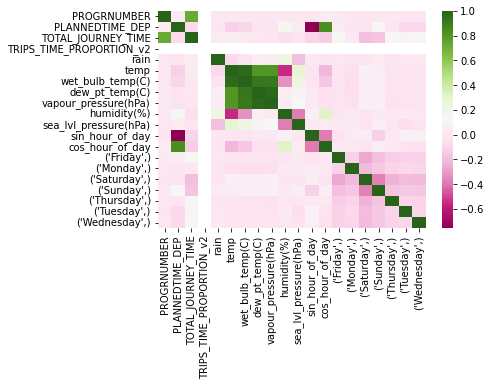

In [40]:
corr=df_dbus.corr()
dataplot = sb.heatmap(corr, cmap="PiYG")
plt.show()

In [52]:
list(dbus_df_list_v3[5].columns.values)

['TRIPID',
 'PROGRNUMBER',
 'PLANNEDTIME_DEP',
 'ROUTEID',
 'ACTUALTIME_ARR_DATETIME',
 'TOTAL_JOURNEY_TIME',
 'TIME_OF_DAY',
 'DAY_OF_WEEK',
 'TRIPS_TIME_PROPORTION_v2',
 'PLANNEDTIME_DEP_R_M5',
 'rain',
 'temp',
 'wet_bulb_temp(C)',
 'dew_pt_temp(C)',
 'vapour_pressure(hPa)',
 'humidity(%)',
 'sea_lvl_pressure(hPa)',
 'sin_hour_of_day',
 'cos_hour_of_day',
 ('Friday',),
 ('Monday',),
 ('Saturday',),
 ('Sunday',),
 ('Thursday',),
 ('Tuesday',),
 ('Wednesday',)]

In [27]:
dbus_df_list_v3[5].head(5)

,TRIPID,PROGRNUMBER,PLANNEDTIME_DEP,ROUTEID,ACTUALTIME_ARR_DATETIME,TOTAL_JOURNEY_TIME,TIME_OF_DAY,DAY_OF_WEEK,TRIPS_TIME_PROPORTION_v2,PLANNEDTIME_DEP_R_M5,...,sea_lvl_pressure(hPa),sin_hour_of_day,cos_hour_of_day,"('Friday',)","('Monday',)","('Saturday',)","('Sunday',)","('Thursday',)","('Tuesday',)","('Wednesday',)"
0,5966965,50,31423,122_14,2018-01-01 08:38:58,2202,08,Monday,1.0,08:45,...,992.5,0.866211,-0.500000,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,5964692,50,33223,122_14,2018-01-01 09:04:23,2058,09,Monday,1.0,09:15,...,992.5,0.707031,-0.707031,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,5963468,50,35023,122_14,2018-01-01 09:47:49,2861,09,Monday,1.0,09:45,...,993.0,0.707031,-0.707031,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,5968200,50,36823,122_14,2018-01-01 10:03:54,2040,10,Monday,1.0,10:15,...,993.0,0.500000,-0.866211,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,5966967,50,38982,122_14,2018-01-01 10:40:05,2378,10,Monday,1.0,10:50,...,994.0,0.500000,-0.866211,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [28]:
for df in dbus_df_list_v3:
    df.rename({"('Friday',)":'friday',"('Monday',)":'monday',
       "('Saturday',)":'saturday',
       "('Sunday',)":'sunday',
       "('Thursday',)":'thursday',
       "('Tuesday',)":'tuesday',
       "('Wednesday',)":'wednesday'}, axis=1, inplace=True)

In [29]:
dbus_df_list_v3[5].head(5)

,TRIPID,PROGRNUMBER,PLANNEDTIME_DEP,ROUTEID,ACTUALTIME_ARR_DATETIME,TOTAL_JOURNEY_TIME,TIME_OF_DAY,DAY_OF_WEEK,TRIPS_TIME_PROPORTION_v2,PLANNEDTIME_DEP_R_M5,...,sea_lvl_pressure(hPa),sin_hour_of_day,cos_hour_of_day,friday,monday,saturday,sunday,thursday,tuesday,wednesday
0,5966965,50,31423,122_14,2018-01-01 08:38:58,2202,08,Monday,1.0,08:45,...,992.5,0.866211,-0.500000,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,5964692,50,33223,122_14,2018-01-01 09:04:23,2058,09,Monday,1.0,09:15,...,992.5,0.707031,-0.707031,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,5963468,50,35023,122_14,2018-01-01 09:47:49,2861,09,Monday,1.0,09:45,...,993.0,0.707031,-0.707031,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,5968200,50,36823,122_14,2018-01-01 10:03:54,2040,10,Monday,1.0,10:15,...,993.0,0.500000,-0.866211,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,5966967,50,38982,122_14,2018-01-01 10:40:05,2378,10,Monday,1.0,10:50,...,994.0,0.500000,-0.866211,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [30]:
features= ['ROUTEID','TOTAL_JOURNEY_TIME','PLANNEDTIME_DEP','rain','temp','wet_bulb_temp(C)','dew_pt_temp(C)','vapour_pressure(hPa)','humidity(%)','sea_lvl_pressure(hPa)','sin_hour_of_day','cos_hour_of_day','friday','monday','saturday','sunday','thursday','tuesday','wednesday']

Creating dataframes with only predictive features

In [40]:
dbus_df_list_v4=[]
for df in dbus_df_list_v3:
    print('='*66)
    print("ROUTEID is ",df['ROUTEID'].unique()[0])
    myfeatures=[]
    df_col_list=list(df.columns.values)
    for col in df_col_list:
        if col in features:
            myfeatures.append(col)
    df_new=df[myfeatures]
    print(df_new.shape)
    print(df_new.columns.values)
    dbus_df_list_v4.append(df_new)

ROUTEID is  18_3
(3896, 19)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(C)' 'vapour_pressure(hPa)' 'humidity(%)'
 'sea_lvl_pressure(hPa)' 'sin_hour_of_day' 'cos_hour_of_day' 'friday'
 'monday' 'saturday' 'sunday' 'thursday' 'tuesday' 'wednesday']
ROUTEID is  67_6
(4001, 19)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(C)' 'vapour_pressure(hPa)' 'humidity(%)'
 'sea_lvl_pressure(hPa)' 'sin_hour_of_day' 'cos_hour_of_day' 'friday'
 'monday' 'saturday' 'sunday' 'thursday' 'tuesday' 'wednesday']
ROUTEID is  142_9
(252, 17)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(C)' 'vapour_pressure(hPa)' 'humidity(%)'
 'sea_lvl_pressure(hPa)' 'sin_hour_of_day' 'cos_hour_of_day' 'friday'
 'monday' 'thursday' 'tuesday' 'wednesday']
ROUTEID is  17_16
(307, 16)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_

(831, 19)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(C)' 'vapour_pressure(hPa)' 'humidity(%)'
 'sea_lvl_pressure(hPa)' 'sin_hour_of_day' 'cos_hour_of_day' 'friday'
 'monday' 'saturday' 'sunday' 'thursday' 'tuesday' 'wednesday']
ROUTEID is  238_15
(1521, 19)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(C)' 'vapour_pressure(hPa)' 'humidity(%)'
 'sea_lvl_pressure(hPa)' 'sin_hour_of_day' 'cos_hour_of_day' 'friday'
 'monday' 'saturday' 'sunday' 'thursday' 'tuesday' 'wednesday']
ROUTEID is  79A_27
(2485, 19)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(C)' 'vapour_pressure(hPa)' 'humidity(%)'
 'sea_lvl_pressure(hPa)' 'sin_hour_of_day' 'cos_hour_of_day' 'friday'
 'monday' 'saturday' 'sunday' 'thursday' 'tuesday' 'wednesday']
ROUTEID is  7_73
(781, 19)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'de

(391, 19)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(C)' 'vapour_pressure(hPa)' 'humidity(%)'
 'sea_lvl_pressure(hPa)' 'sin_hour_of_day' 'cos_hour_of_day' 'friday'
 'monday' 'saturday' 'sunday' 'thursday' 'tuesday' 'wednesday']
ROUTEID is  53_23
(172, 18)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(C)' 'vapour_pressure(hPa)' 'humidity(%)'
 'sea_lvl_pressure(hPa)' 'sin_hour_of_day' 'cos_hour_of_day' 'friday'
 'monday' 'saturday' 'sunday' 'thursday' 'wednesday']
ROUTEID is  44_36
(1845, 19)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(C)' 'vapour_pressure(hPa)' 'humidity(%)'
 'sea_lvl_pressure(hPa)' 'sin_hour_of_day' 'cos_hour_of_day' 'friday'
 'monday' 'saturday' 'sunday' 'thursday' 'tuesday' 'wednesday']
ROUTEID is  61_106
(1760, 19)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(

(224, 18)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(C)' 'vapour_pressure(hPa)' 'humidity(%)'
 'sea_lvl_pressure(hPa)' 'sin_hour_of_day' 'cos_hour_of_day' 'friday'
 'monday' 'saturday' 'thursday' 'tuesday' 'wednesday']
ROUTEID is  13_63
(291, 17)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(C)' 'vapour_pressure(hPa)' 'humidity(%)'
 'sea_lvl_pressure(hPa)' 'sin_hour_of_day' 'cos_hour_of_day' 'friday'
 'monday' 'thursday' 'tuesday' 'wednesday']
ROUTEID is  66B_59
(846, 18)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(C)' 'vapour_pressure(hPa)' 'humidity(%)'
 'sea_lvl_pressure(hPa)' 'sin_hour_of_day' 'cos_hour_of_day' 'friday'
 'monday' 'saturday' 'thursday' 'tuesday' 'wednesday']
ROUTEID is  37_15
(4984, 19)
['PLANNEDTIME_DEP' 'ROUTEID' 'TOTAL_JOURNEY_TIME' 'rain' 'temp'
 'wet_bulb_temp(C)' 'dew_pt_temp(C)' 'vapour_pressure(hPa)' 'h

Checking for dublicate rows

In [41]:
dublicate_count=0
for df in dbus_df_list_v4:
    # Check for duplicate rows. 
    # Use "keep=False" to mark all duplicates as true, including the original rows that were duplicated.
    dublicate_count+=df[df.duplicated(keep=False)].shape[0]
    print('Number of duplicate rows (including first) in the table is:', df[df.duplicated(keep=False)].shape[0])

Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number o

Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number o

Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number of duplicate rows (including first) in the table is: 0
Number o

In [42]:
dublicate_count

0

In [43]:
dbus_df_list_v4[0].head(5)

,PLANNEDTIME_DEP,ROUTEID,TOTAL_JOURNEY_TIME,rain,temp,wet_bulb_temp(C),dew_pt_temp(C),vapour_pressure(hPa),humidity(%),sea_lvl_pressure(hPa),sin_hour_of_day,cos_hour_of_day,friday,monday,saturday,sunday,thursday,tuesday,wednesday
0,37010,18_3,2473,0.000000,5.601562,4.300781,2.300781,7.199219,79,993.0,0.500000,-0.866211,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,41726,18_3,3135,0.000000,7.500000,5.601562,3.000000,7.601562,73,995.0,0.258789,-0.965820,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,45238,18_3,2446,0.000000,7.500000,5.601562,3.000000,7.601562,73,995.0,0.000000,-1.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,47426,18_3,3137,0.199951,7.300781,5.898438,3.900391,8.101562,78,996.0,-0.258789,-0.965820,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,49711,18_3,3307,0.099976,6.398438,5.199219,3.500000,7.800781,81,998.5,-0.258789,-0.965820,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [35]:
write_to_csv('/Chunks/DBUS/Predictive_Model_Chunks_backup/',dbus_df_list_v4,'ROUTEID' )

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/18_3.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/67_6.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/142_9.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/17_16.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/46A_74.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/122_14.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/150_8.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/33X_49.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/83_19.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/270_44.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/84_30.csv
Location

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/122_16.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/239_28.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/38A_20.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/40D_104.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/53_21.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/102_9.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/38B_40.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/185_60.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/26_29.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/114_6.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/84X_62.csv
Lo

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/7A_87.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/13_70.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/39_23.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/161_50.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/65B_65.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/40B_63.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/68_84.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/7_72.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/43_84.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/69_43.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41_3.csv
Location:

Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/7_71.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41C_79.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/83A_20.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/39_20.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/63_26.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/66B_58.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/17_10.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/17A_14.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/66A_38.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/15A_85.csv
Location: /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/47_136.csv
Loca

In [44]:
cols=['ROUTEID','TOTAL_JOURNEY_TIME','PLANNEDTIME_DEP','rain','temp','wet_bulb_temp(C)','vapour_pressure(hPa)','humidity(%)','sea_lvl_pressure(hPa)','sin_hour_of_day','cos_hour_of_day','friday','monday','saturday','sunday','thursday','tuesday','wednesday']
dtypes={'PLANNEDTIME_DEP':'int64','ROUTEID':'category','TOTAL_JOURNEY_TIME':'int16','rain':'float16','temp':'float16','wet_bulb_temp(C)':'float16','vapour_pressure(hPa)':'float16','humidity(%)':'int16','sea_lvl_pressure(hPa)':'float16','sin_hour_of_day':'float16','cos_hour_of_day':'float16','friday':'int16','monday':'int16','saturday':'int16','sunday':'int16','thursday':'int16','tuesday':'int16','wednesday':'int16'}
x=['/Chunks/DBUS/Predictive_Model_Chunks_backup',dtypes,[],mydateparser]

In [45]:
dbus_df_list_v4=get_chunks(x)

Index at chunk_list 0  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/18_3.csv :  (3896, 19)
Index at chunk_list 1  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/67_6.csv :  (4001, 19)
Index at chunk_list 2  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/142_9.csv :  (252, 17)
Index at chunk_list 3  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/17_16.csv :  (307, 16)
Index at chunk_list 4  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/46A_74.csv :  (11186, 19)
Index at chunk_list 5  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/122_14.csv :  (4164, 19)
Index at chunk_list 6  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/150_8.csv :  (4907, 19)
Index at chunk_list 7  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/33X_49.csv :  (181, 17)
Index at chunk_list 8  is  /home/

Index at chunk_list 79  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/14_16.csv :  (5208, 19)
Index at chunk_list 80  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/15A_83.csv :  (5097, 19)
Index at chunk_list 81  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/39_21.csv :  (4147, 19)
Index at chunk_list 82  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/151_18.csv :  (831, 19)
Index at chunk_list 83  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/238_15.csv :  (1521, 19)
Index at chunk_list 84  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/79A_27.csv :  (2485, 19)
Index at chunk_list 85  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/7_73.csv :  (781, 19)
Index at chunk_list 86  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/69_47.csv :  (592, 18)
Index at chunk_list 87  

Index at chunk_list 173  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/41C_78.csv :  (4171, 19)
Index at chunk_list 174  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/65B_66.csv :  (1992, 19)
Index at chunk_list 175  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/49_27.csv :  (3171, 19)
Index at chunk_list 176  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/38_14.csv :  (2684, 19)
Index at chunk_list 177  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/18_4.csv :  (3903, 19)
Index at chunk_list 178  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/39A_42.csv :  (238, 19)
Index at chunk_list 179  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/61_108.csv :  (1818, 19)
Index at chunk_list 180  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/102_10.csv :  (299, 18)
Index at chunk

Index at chunk_list 248  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/66B_59.csv :  (846, 18)
Index at chunk_list 249  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/37_15.csv :  (4984, 19)
Index at chunk_list 250  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/145_105.csv :  (8051, 19)
Index at chunk_list 251  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/16_24.csv :  (7436, 19)
Index at chunk_list 252  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/17A_16.csv :  (234, 18)
Index at chunk_list 253  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/33_72.csv :  (870, 19)
Index at chunk_list 254  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/38A_33.csv :  (173, 17)
Index at chunk_list 255  is  /home/team8/notebook/Pelin/Chunks/DBUS/Predictive_Model_Chunks_backup/15_16.csv :  (6332, 19)
Index at chunk_

In [47]:
dbus_df_list_v4[0].tail(5)

,PLANNEDTIME_DEP,ROUTEID,TOTAL_JOURNEY_TIME,rain,temp,wet_bulb_temp(C),dew_pt_temp(C),vapour_pressure(hPa),humidity(%),sea_lvl_pressure(hPa),sin_hour_of_day,cos_hour_of_day,friday,monday,saturday,sunday,thursday,tuesday,wednesday
3891,78545,18_3,2923,0.0,10.296875,9.101562,7.7,10.500000,84,1034.0,-0.707031,0.707031,0,0,0,1,0,0,0
3892,82145,18_3,2167,0.0,10.101562,9.101562,8.2,10.898438,88,1034.0,-0.500000,0.866211,0,0,0,1,0,0,0
3893,86777,18_3,2059,0.0,9.500000,8.703125,7.8,10.601562,89,1035.0,0.000000,1.000000,0,1,0,0,0,0,0
3894,38037,18_3,4388,0.0,10.296875,8.296875,6.0,9.296875,74,1034.0,0.500000,-0.866211,0,1,0,0,0,0,0
3895,73207,18_3,3299,0.0,9.898438,7.898438,5.7,9.101562,75,1035.0,-0.866211,0.500000,0,1,0,0,0,0,0


In [25]:
dbus_df_list_v4[100].dtypes

PLANNEDTIME_DEP             int64
ROUTEID                  category
TOTAL_JOURNEY_TIME          int16
rain                      float16
temp                      float16
wet_bulb_temp(C)          float16
dew_pt_temp(C)            float64
vapour_pressure(hPa)      float16
humidity(%)                 int16
sea_lvl_pressure(hPa)     float16
sin_hour_of_day           float16
cos_hour_of_day           float16
dtype: object

In [64]:
dbus_df_list_v4[0].shape[0]

3896

In [65]:
dbus_df_list_v4[0].shape[1]

18

In [66]:
small_samplesize_route_counter=0
small_samplesize_row_counter=0
total_row_count=0
for df in dbus_df_list_v4:
    total_row_count+=df.shape[0]
    if df.shape[0] < df.shape[1]*10:
        small_samplesize_row_counter+=df.shape[0]
        small_samplesize_route_counter+=1
print("Number of routes need to be dropped: ",small_samplesize_route_counter , " , number of rows need to be dropped: ",small_samplesize_row_counter, " corresponds to ",small_samplesize_row_counter/total_row_count, " percentage of total dataset" )

Number of routes need to be dropped:  0  , number of rows need to be dropped:  0  corresponds to  0.0  percentage of total dataset


ROUTEID is  18_3
PLANNEDTIME_DEP         -0.408809
TOTAL_JOURNEY_TIME       1.000000
rain                     0.064654
temp                     0.013831
wet_bulb_temp(C)        -0.003432
vapour_pressure(hPa)    -0.042938
humidity(%)             -0.059007
sea_lvl_pressure(hPa)   -0.072582
sin_hour_of_day          0.120294
cos_hour_of_day         -0.402029
(Friday,)                0.228493
(Monday,)               -0.027842
(Saturday,)             -0.305520
(Sunday,)               -0.335323
(Thursday,)              0.216564
(Tuesday,)               0.220095
(Wednesday,)             0.261458
Name: TOTAL_JOURNEY_TIME, dtype: float64


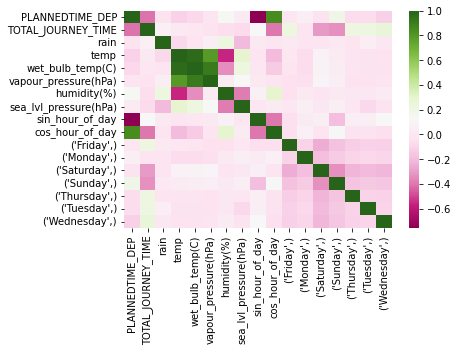

ROUTEID is  67_6
PLANNEDTIME_DEP         -0.314948
TOTAL_JOURNEY_TIME       1.000000
rain                     0.010303
temp                     0.101682
wet_bulb_temp(C)         0.054607
vapour_pressure(hPa)    -0.024655
humidity(%)             -0.209024
sea_lvl_pressure(hPa)   -0.016178
sin_hour_of_day         -0.080631
cos_hour_of_day         -0.430112
(Friday,)                0.226687
(Monday,)               -0.020959
(Saturday,)             -0.195642
(Sunday,)               -0.236251
(Thursday,)              0.188060
(Tuesday,)               0.119111
(Wednesday,)             0.184054
Name: TOTAL_JOURNEY_TIME, dtype: float64


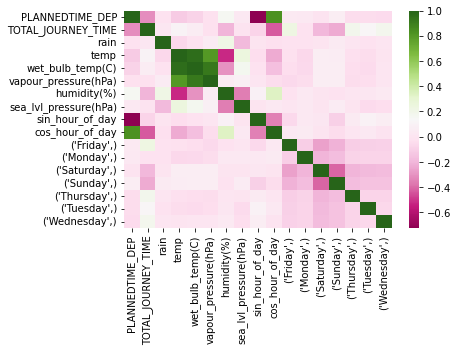

ROUTEID is  142_9
PLANNEDTIME_DEP          0.063358
TOTAL_JOURNEY_TIME       1.000000
rain                     0.018956
temp                    -0.136708
wet_bulb_temp(C)        -0.096022
vapour_pressure(hPa)    -0.042485
humidity(%)              0.186389
sea_lvl_pressure(hPa)   -0.174308
sin_hour_of_day         -0.102322
cos_hour_of_day          0.088085
(Friday,)                0.109886
(Monday,)               -0.090215
(Thursday,)             -0.060676
(Tuesday,)              -0.023558
(Wednesday,)             0.036683
Name: TOTAL_JOURNEY_TIME, dtype: float64


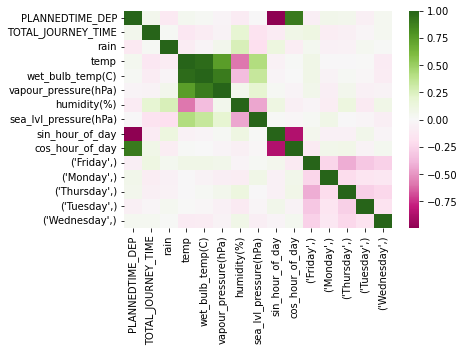

ROUTEID is  17_16
PLANNEDTIME_DEP         -0.449945
TOTAL_JOURNEY_TIME       1.000000
rain                     0.053477
temp                     0.207835
wet_bulb_temp(C)         0.170327
vapour_pressure(hPa)     0.098850
humidity(%)             -0.202355
sea_lvl_pressure(hPa)    0.042712
sin_hour_of_day         -0.314307
cos_hour_of_day         -0.482765
(Monday,)               -0.055252
(Saturday,)             -0.023619
(Sunday,)                0.058735
(Wednesday,)                  NaN
Name: TOTAL_JOURNEY_TIME, dtype: float64


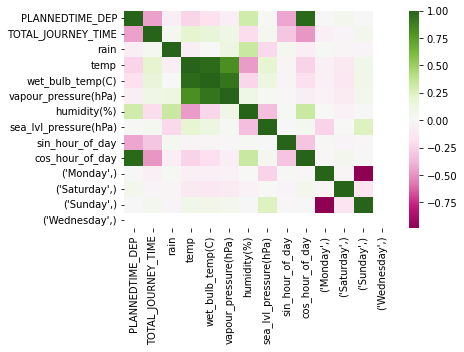

ROUTEID is  46A_74
PLANNEDTIME_DEP         -0.192941
TOTAL_JOURNEY_TIME       1.000000
rain                     0.026709
temp                     0.038915
wet_bulb_temp(C)         0.010670
vapour_pressure(hPa)    -0.042173
humidity(%)             -0.111618
sea_lvl_pressure(hPa)   -0.037157
sin_hour_of_day         -0.083999
cos_hour_of_day         -0.249514
(Friday,)                0.218012
(Monday,)                0.013544
(Saturday,)             -0.290413
(Sunday,)               -0.329010
(Thursday,)              0.229848
(Tuesday,)               0.198263
(Wednesday,)             0.258430
Name: TOTAL_JOURNEY_TIME, dtype: float64


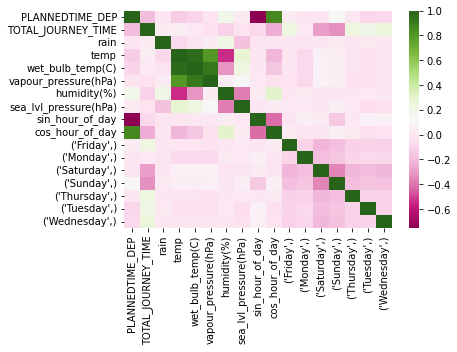

ROUTEID is  122_14
PLANNEDTIME_DEP         -0.029661
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.004476
temp                    -0.150990
wet_bulb_temp(C)        -0.167688
vapour_pressure(hPa)    -0.169729
humidity(%)              0.000660
sea_lvl_pressure(hPa)   -0.126473
sin_hour_of_day         -0.193930
cos_hour_of_day         -0.154951
(Friday,)                0.209063
(Monday,)                0.008563
(Saturday,)             -0.144711
(Sunday,)               -0.270494
(Thursday,)              0.257821
(Tuesday,)               0.236247
(Wednesday,)             0.255339
Name: TOTAL_JOURNEY_TIME, dtype: float64


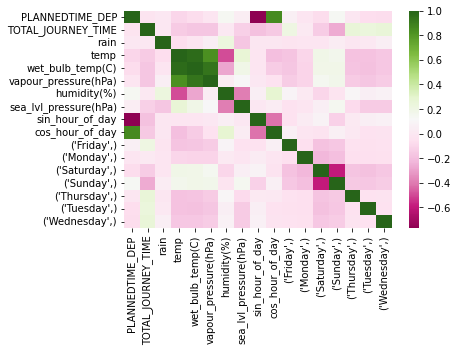

ROUTEID is  150_8
PLANNEDTIME_DEP         -0.009767
TOTAL_JOURNEY_TIME       1.000000
rain                     0.025819
temp                     0.039158
wet_bulb_temp(C)         0.018372
vapour_pressure(hPa)    -0.026162
humidity(%)             -0.090915
sea_lvl_pressure(hPa)   -0.017962
sin_hour_of_day         -0.227469
cos_hour_of_day         -0.124264
(Friday,)                0.249760
(Monday,)                0.014354
(Saturday,)             -0.284748
(Sunday,)               -0.339336
(Thursday,)              0.250144
(Tuesday,)               0.189550
(Wednesday,)             0.230483
Name: TOTAL_JOURNEY_TIME, dtype: float64


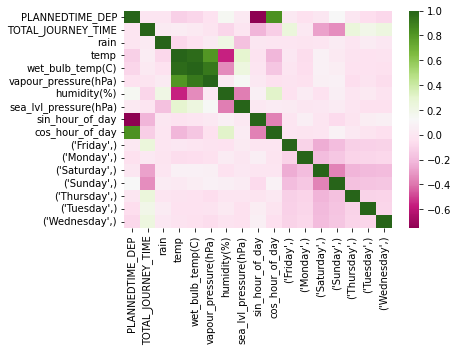

ROUTEID is  33X_49
PLANNEDTIME_DEP          0.325203
TOTAL_JOURNEY_TIME       1.000000
rain                     0.066610
temp                    -0.104696
wet_bulb_temp(C)        -0.085960
vapour_pressure(hPa)    -0.070544
humidity(%)              0.100613
sea_lvl_pressure(hPa)   -0.366455
sin_hour_of_day         -0.627967
cos_hour_of_day         -0.576245
(Friday,)               -0.074649
(Monday,)               -0.137419
(Thursday,)              0.234956
(Tuesday,)              -0.049836
(Wednesday,)            -0.013588
Name: TOTAL_JOURNEY_TIME, dtype: float64


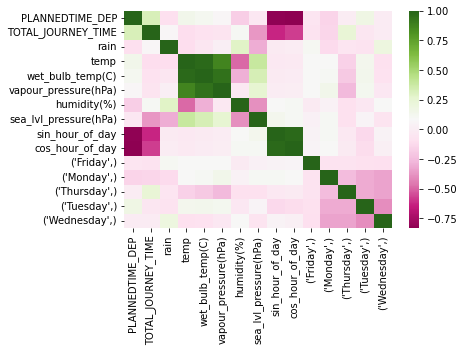

ROUTEID is  83_19
PLANNEDTIME_DEP          0.186055
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.005989
temp                     0.130020
wet_bulb_temp(C)         0.103660
vapour_pressure(hPa)     0.064750
humidity(%)             -0.136179
sea_lvl_pressure(hPa)   -0.021841
sin_hour_of_day         -0.403071
cos_hour_of_day         -0.074367
(Monday,)               -0.090747
(Saturday,)              0.082712
(Sunday,)                0.055536
(Wednesday,)            -0.016376
Name: TOTAL_JOURNEY_TIME, dtype: float64


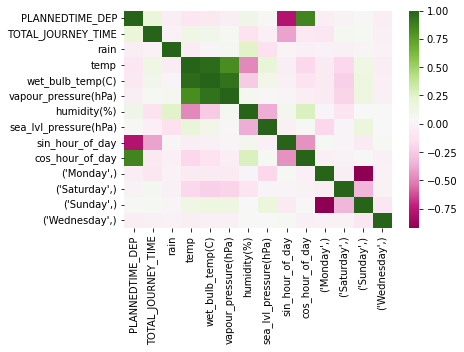

ROUTEID is  270_44
PLANNEDTIME_DEP         -0.248088
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.000285
temp                    -0.034760
wet_bulb_temp(C)        -0.036000
vapour_pressure(hPa)    -0.037201
humidity(%)              0.007163
sea_lvl_pressure(hPa)   -0.011568
sin_hour_of_day          0.134273
cos_hour_of_day         -0.181838
(Friday,)                0.218061
(Monday,)                0.067975
(Saturday,)             -0.265009
(Sunday,)               -0.234710
(Thursday,)              0.146002
(Tuesday,)               0.187396
(Wednesday,)             0.222099
Name: TOTAL_JOURNEY_TIME, dtype: float64


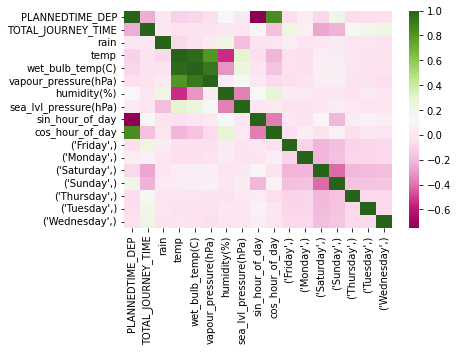

ROUTEID is  84_30
PLANNEDTIME_DEP         -0.274973
TOTAL_JOURNEY_TIME       1.000000
rain                     0.001493
temp                     0.100188
wet_bulb_temp(C)         0.057471
vapour_pressure(hPa)    -0.018228
humidity(%)             -0.198729
sea_lvl_pressure(hPa)    0.019152
sin_hour_of_day          0.041556
cos_hour_of_day         -0.428427
(Friday,)                0.155588
(Monday,)                0.068843
(Saturday,)             -0.270734
(Sunday,)               -0.292126
(Thursday,)              0.181286
(Tuesday,)               0.168780
(Wednesday,)             0.232704
Name: TOTAL_JOURNEY_TIME, dtype: float64


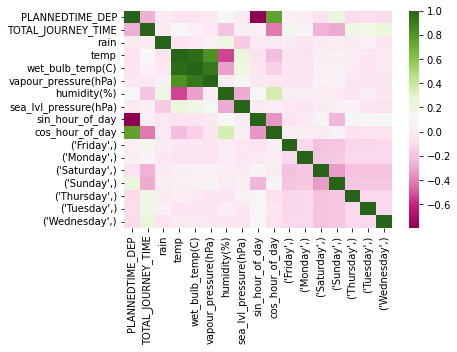

ROUTEID is  130_10
PLANNEDTIME_DEP          0.113252
TOTAL_JOURNEY_TIME       1.000000
rain                     0.020407
temp                     0.149724
wet_bulb_temp(C)         0.113242
vapour_pressure(hPa)     0.041898
humidity(%)             -0.180110
sea_lvl_pressure(hPa)    0.027879
sin_hour_of_day         -0.386710
cos_hour_of_day         -0.095102
(Friday,)                0.146018
(Monday,)                0.106200
(Saturday,)             -0.322115
(Sunday,)               -0.226729
(Thursday,)              0.152898
(Tuesday,)               0.195580
(Wednesday,)             0.208061
Name: TOTAL_JOURNEY_TIME, dtype: float64


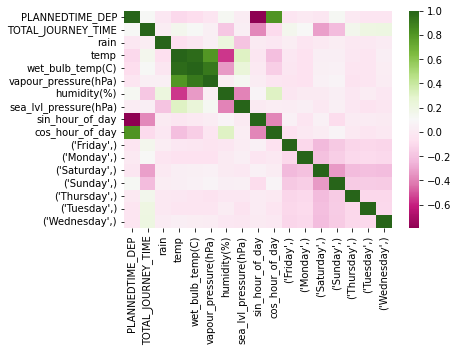

ROUTEID is  66A_36
PLANNEDTIME_DEP         -0.259078
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.043941
temp                     0.090202
wet_bulb_temp(C)         0.066361
vapour_pressure(hPa)     0.014083
humidity(%)             -0.130060
sea_lvl_pressure(hPa)   -0.037136
sin_hour_of_day          0.063359
cos_hour_of_day         -0.319486
(Friday,)                0.162151
(Monday,)                0.038457
(Saturday,)             -0.321118
(Sunday,)               -0.134477
(Thursday,)              0.133978
(Tuesday,)               0.124209
(Wednesday,)             0.226446
Name: TOTAL_JOURNEY_TIME, dtype: float64


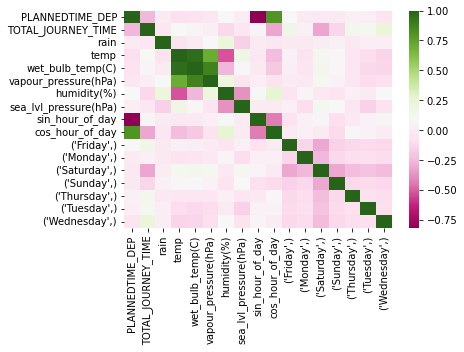

ROUTEID is  46A_66
PLANNEDTIME_DEP         -0.071576
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.107152
temp                     0.049079
wet_bulb_temp(C)         0.048101
vapour_pressure(hPa)     0.036938
humidity(%)             -0.017556
sea_lvl_pressure(hPa)    0.036789
sin_hour_of_day          0.179058
cos_hour_of_day          0.179058
(Friday,)                0.254329
(Monday,)               -0.262447
(Saturday,)              0.177353
(Sunday,)               -0.284183
(Thursday,)              0.147659
(Tuesday,)              -0.091431
(Wednesday,)             0.056731
Name: TOTAL_JOURNEY_TIME, dtype: float64


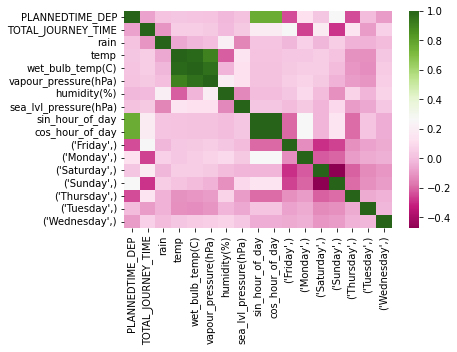

ROUTEID is  102_8
PLANNEDTIME_DEP         -0.127221
TOTAL_JOURNEY_TIME       1.000000
rain                     0.020692
temp                     0.221093
wet_bulb_temp(C)         0.171260
vapour_pressure(hPa)     0.077134
humidity(%)             -0.262344
sea_lvl_pressure(hPa)    0.038723
sin_hour_of_day         -0.211671
cos_hour_of_day         -0.304767
(Friday,)                0.247347
(Monday,)                0.021159
(Saturday,)             -0.327305
(Sunday,)               -0.160807
(Thursday,)              0.161339
(Tuesday,)               0.108720
(Wednesday,)             0.205375
Name: TOTAL_JOURNEY_TIME, dtype: float64


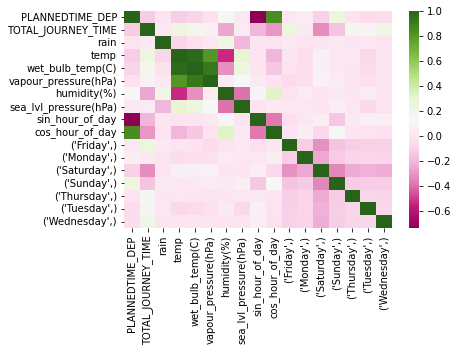

ROUTEID is  68_81
PLANNEDTIME_DEP          0.342091
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.010777
temp                    -0.083211
wet_bulb_temp(C)        -0.088025
vapour_pressure(hPa)    -0.095652
humidity(%)              0.027546
sea_lvl_pressure(hPa)   -0.093995
sin_hour_of_day         -0.395592
cos_hour_of_day          0.304971
(Friday,)                0.264458
(Monday,)                0.082194
(Saturday,)             -0.622123
(Thursday,)              0.276093
(Tuesday,)               0.145394
(Wednesday,)             0.203746
Name: TOTAL_JOURNEY_TIME, dtype: float64


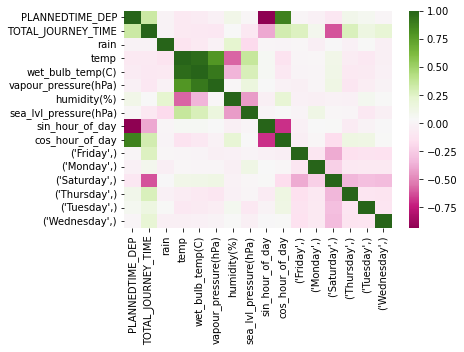

ROUTEID is  66_11
PLANNEDTIME_DEP          0.046825
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.032877
temp                     0.084740
wet_bulb_temp(C)         0.051784
vapour_pressure(hPa)    -0.022823
humidity(%)             -0.149809
sea_lvl_pressure(hPa)   -0.019625
sin_hour_of_day         -0.387779
cos_hour_of_day         -0.151224
(Friday,)                0.282075
(Monday,)               -0.016570
(Saturday,)             -0.355100
(Sunday,)               -0.204775
(Thursday,)              0.185606
(Tuesday,)               0.201508
(Wednesday,)             0.163227
Name: TOTAL_JOURNEY_TIME, dtype: float64


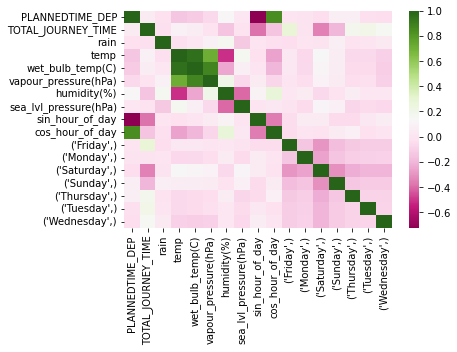

ROUTEID is  26_28
PLANNEDTIME_DEP         -0.096751
TOTAL_JOURNEY_TIME       1.000000
rain                     0.082390
temp                     0.061641
wet_bulb_temp(C)         0.005704
vapour_pressure(hPa)    -0.093191
humidity(%)             -0.162973
sea_lvl_pressure(hPa)   -0.055049
sin_hour_of_day         -0.184601
cos_hour_of_day         -0.173809
(Friday,)                0.183793
(Monday,)                0.126559
(Saturday,)             -0.470299
(Sunday,)               -0.186791
(Thursday,)              0.191164
(Tuesday,)               0.116267
(Wednesday,)             0.222238
Name: TOTAL_JOURNEY_TIME, dtype: float64


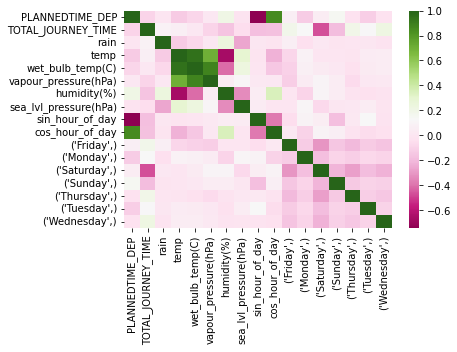

ROUTEID is  104_15
PLANNEDTIME_DEP         -0.010693
TOTAL_JOURNEY_TIME       1.000000
rain                     0.114498
temp                    -0.101768
wet_bulb_temp(C)        -0.092615
vapour_pressure(hPa)    -0.083872
humidity(%)              0.078292
sea_lvl_pressure(hPa)   -0.100666
sin_hour_of_day         -0.090345
cos_hour_of_day         -0.011437
(Friday,)                0.248890
(Monday,)                0.074150
(Saturday,)             -0.400022
(Sunday,)               -0.352816
(Thursday,)              0.205771
(Tuesday,)               0.222210
(Wednesday,)             0.216526
Name: TOTAL_JOURNEY_TIME, dtype: float64


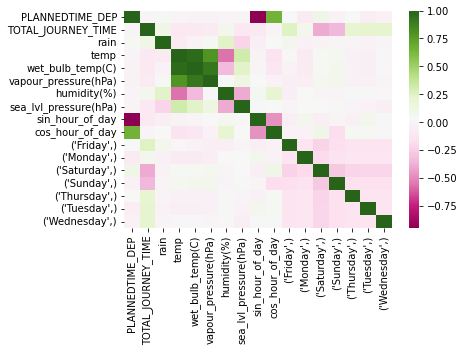

ROUTEID is  40_31
PLANNEDTIME_DEP         -0.022235
TOTAL_JOURNEY_TIME       1.000000
rain                     0.043105
temp                     0.032724
wet_bulb_temp(C)         0.007265
vapour_pressure(hPa)    -0.040832
humidity(%)             -0.103203
sea_lvl_pressure(hPa)   -0.044338
sin_hour_of_day         -0.248459
cos_hour_of_day         -0.189639
(Friday,)                0.254192
(Monday,)                0.018677
(Saturday,)             -0.314822
(Sunday,)               -0.237351
(Thursday,)              0.241316
(Tuesday,)               0.147317
(Wednesday,)             0.185740
Name: TOTAL_JOURNEY_TIME, dtype: float64


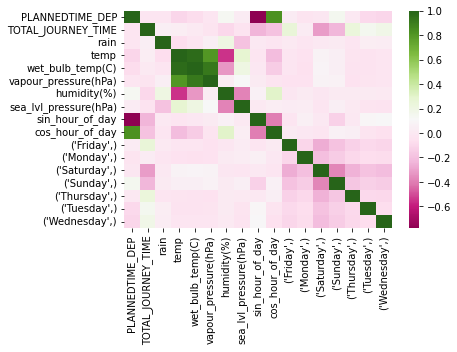

ROUTEID is  15_19
PLANNEDTIME_DEP         -0.115774
TOTAL_JOURNEY_TIME       1.000000
rain                     0.107641
temp                     0.054732
wet_bulb_temp(C)         0.046971
vapour_pressure(hPa)     0.025470
humidity(%)             -0.032926
sea_lvl_pressure(hPa)    0.000010
sin_hour_of_day         -0.195542
cos_hour_of_day         -0.218567
(Friday,)                0.244866
(Monday,)                0.055829
(Saturday,)             -0.254383
(Sunday,)               -0.274529
(Thursday,)              0.137363
(Tuesday,)               0.161248
(Wednesday,)             0.160223
Name: TOTAL_JOURNEY_TIME, dtype: float64


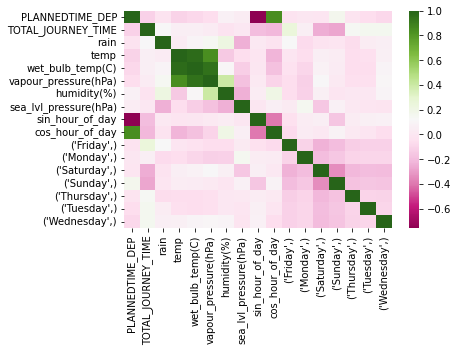

ROUTEID is  145_106
PLANNEDTIME_DEP         -0.040524
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.040394
temp                     0.180949
wet_bulb_temp(C)         0.195305
vapour_pressure(hPa)     0.196406
humidity(%)              0.062434
sea_lvl_pressure(hPa)    0.122086
sin_hour_of_day          0.103132
cos_hour_of_day          0.103132
(Friday,)                0.007400
(Monday,)               -0.424506
(Saturday,)              0.278383
(Sunday,)                0.106301
(Thursday,)              0.006676
(Tuesday,)              -0.056002
(Wednesday,)            -0.035778
Name: TOTAL_JOURNEY_TIME, dtype: float64


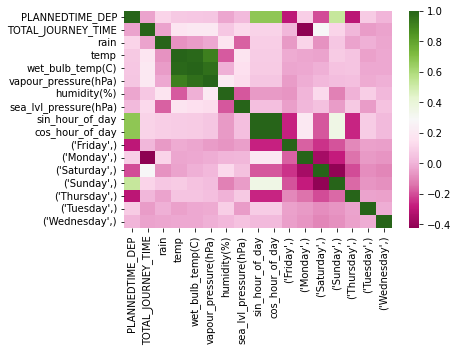

ROUTEID is  76_37
PLANNEDTIME_DEP         -0.239145
TOTAL_JOURNEY_TIME       1.000000
rain                     0.027460
temp                     0.068759
wet_bulb_temp(C)         0.035535
vapour_pressure(hPa)    -0.026768
humidity(%)             -0.146868
sea_lvl_pressure(hPa)   -0.051822
sin_hour_of_day         -0.120015
cos_hour_of_day         -0.367517
(Friday,)                0.306631
(Monday,)                0.006410
(Saturday,)             -0.282805
(Sunday,)               -0.292032
(Thursday,)              0.258139
(Tuesday,)               0.138212
(Wednesday,)             0.166679
Name: TOTAL_JOURNEY_TIME, dtype: float64


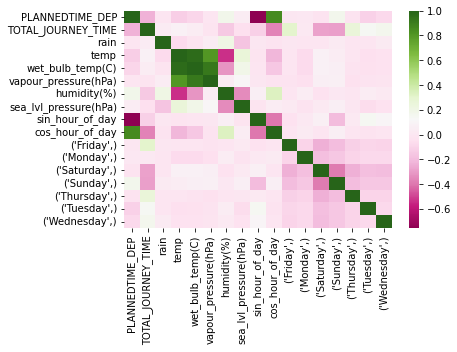

ROUTEID is  185_57
PLANNEDTIME_DEP         -0.009131
TOTAL_JOURNEY_TIME       1.000000
rain                     0.029981
temp                    -0.036332
wet_bulb_temp(C)        -0.018327
vapour_pressure(hPa)    -0.003631
humidity(%)              0.081030
sea_lvl_pressure(hPa)   -0.081471
sin_hour_of_day         -0.014513
cos_hour_of_day         -0.030643
(Friday,)                0.133662
(Monday,)                0.018408
(Saturday,)             -0.296881
(Thursday,)              0.216171
(Tuesday,)               0.083316
(Wednesday,)             0.045700
Name: TOTAL_JOURNEY_TIME, dtype: float64


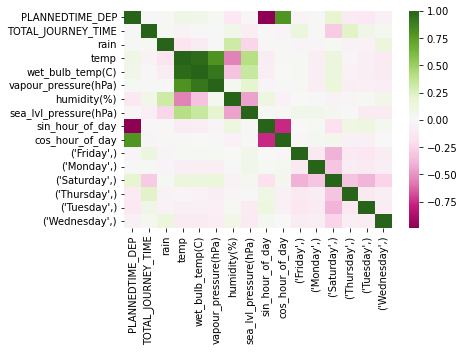

ROUTEID is  67_4
PLANNEDTIME_DEP          0.093094
TOTAL_JOURNEY_TIME       1.000000
rain                     0.015423
temp                     0.035200
wet_bulb_temp(C)         0.012652
vapour_pressure(hPa)    -0.027059
humidity(%)             -0.097745
sea_lvl_pressure(hPa)   -0.037913
sin_hour_of_day         -0.407335
cos_hour_of_day         -0.053890
(Friday,)                0.265325
(Monday,)               -0.005064
(Saturday,)             -0.341027
(Sunday,)               -0.174035
(Thursday,)              0.170280
(Tuesday,)               0.193863
(Wednesday,)             0.207534
Name: TOTAL_JOURNEY_TIME, dtype: float64


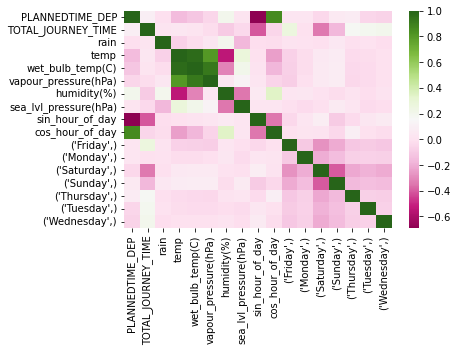

ROUTEID is  13_68
PLANNEDTIME_DEP          0.070213
TOTAL_JOURNEY_TIME       1.000000
rain                     0.030597
temp                    -0.031832
wet_bulb_temp(C)        -0.032072
vapour_pressure(hPa)    -0.040253
humidity(%)              0.018618
sea_lvl_pressure(hPa)   -0.025726
sin_hour_of_day         -0.175386
cos_hour_of_day          0.022191
(Friday,)                0.281227
(Monday,)                0.020591
(Saturday,)             -0.412376
(Sunday,)               -0.193325
(Thursday,)              0.310484
(Tuesday,)               0.158386
(Wednesday,)             0.192395
Name: TOTAL_JOURNEY_TIME, dtype: float64


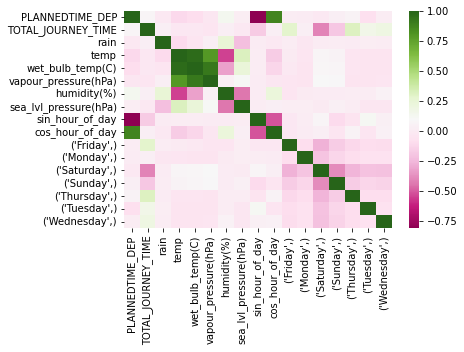

ROUTEID is  38_9
PLANNEDTIME_DEP         -0.103044
TOTAL_JOURNEY_TIME       1.000000
rain                     0.056221
temp                     0.059022
wet_bulb_temp(C)         0.040836
vapour_pressure(hPa)    -0.002009
humidity(%)             -0.096716
sea_lvl_pressure(hPa)   -0.026862
sin_hour_of_day         -0.364794
cos_hour_of_day         -0.197396
(Friday,)                0.232916
(Monday,)               -0.018964
(Saturday,)             -0.294016
(Sunday,)               -0.294998
(Thursday,)              0.251643
(Tuesday,)               0.149553
(Wednesday,)             0.218415
Name: TOTAL_JOURNEY_TIME, dtype: float64


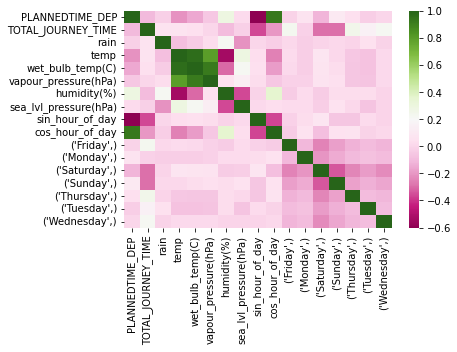

ROUTEID is  68_79
PLANNEDTIME_DEP          0.063208
TOTAL_JOURNEY_TIME       1.000000
rain                     0.018091
temp                     0.162939
wet_bulb_temp(C)         0.178661
vapour_pressure(hPa)     0.190417
humidity(%)              0.032133
sea_lvl_pressure(hPa)   -0.018990
sin_hour_of_day          0.058732
cos_hour_of_day          0.120484
(Friday,)                0.178859
(Monday,)                0.048261
(Saturday,)             -0.091891
(Sunday,)               -0.135153
(Thursday,)             -0.001718
(Tuesday,)               0.091106
(Wednesday,)             0.074070
Name: TOTAL_JOURNEY_TIME, dtype: float64


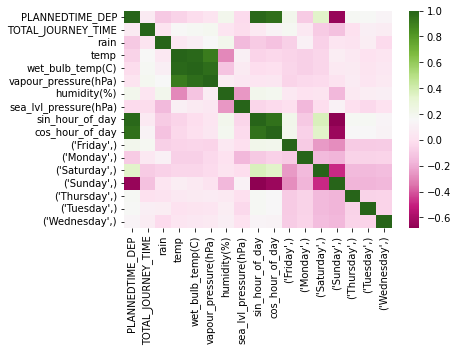

ROUTEID is  120_13
PLANNEDTIME_DEP         -0.284825
TOTAL_JOURNEY_TIME       1.000000
rain                     0.124466
temp                     0.079582
wet_bulb_temp(C)         0.082928
vapour_pressure(hPa)     0.072186
humidity(%)              0.003232
sea_lvl_pressure(hPa)    0.007413
sin_hour_of_day          0.155669
cos_hour_of_day         -0.248125
(Friday,)                0.152119
(Monday,)                0.032841
(Saturday,)             -0.219249
(Sunday,)               -0.203774
(Thursday,)              0.105417
(Tuesday,)               0.186000
(Wednesday,)             0.202498
Name: TOTAL_JOURNEY_TIME, dtype: float64


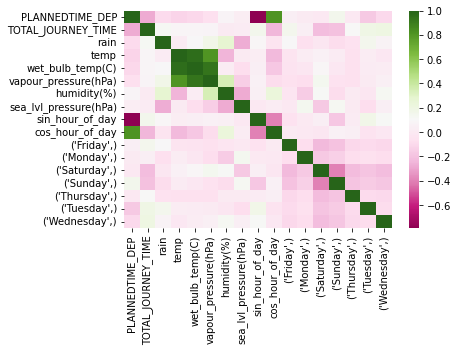

ROUTEID is  83_25
PLANNEDTIME_DEP         -0.022299
TOTAL_JOURNEY_TIME       1.000000
rain                     0.015997
temp                     0.091380
wet_bulb_temp(C)         0.072633
vapour_pressure(hPa)     0.048362
humidity(%)             -0.091951
sea_lvl_pressure(hPa)    0.020807
sin_hour_of_day         -0.189795
cos_hour_of_day         -0.119597
(Monday,)               -0.032410
(Saturday,)              0.084757
(Sunday,)                0.006972
(Tuesday,)                    NaN
(Wednesday,)            -0.025193
Name: TOTAL_JOURNEY_TIME, dtype: float64


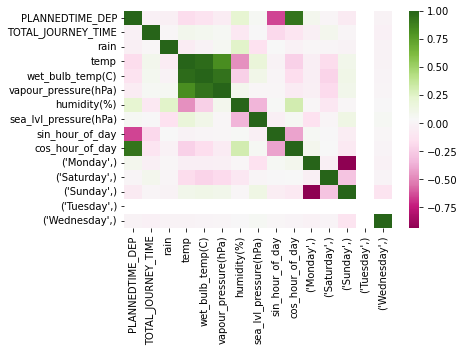

ROUTEID is  16_21
PLANNEDTIME_DEP          0.672278
TOTAL_JOURNEY_TIME       1.000000
rain                     0.027454
temp                     0.030200
wet_bulb_temp(C)         0.000842
vapour_pressure(hPa)    -0.045909
humidity(%)             -0.144351
sea_lvl_pressure(hPa)   -0.016460
sin_hour_of_day         -0.753244
cos_hour_of_day         -0.743836
(Friday,)               -0.103551
(Monday,)                0.049126
(Thursday,)             -0.069778
(Tuesday,)               0.106862
(Wednesday,)             0.008615
Name: TOTAL_JOURNEY_TIME, dtype: float64


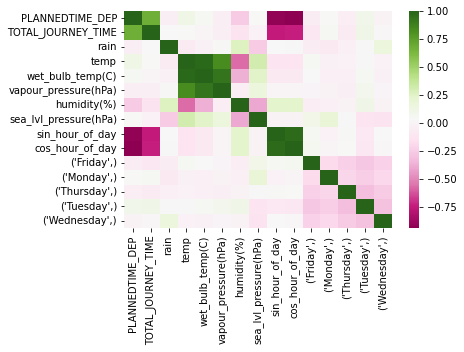

ROUTEID is  65_74
PLANNEDTIME_DEP          0.173153
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.037446
temp                     0.053322
wet_bulb_temp(C)         0.023362
vapour_pressure(hPa)    -0.026610
humidity(%)             -0.137324
sea_lvl_pressure(hPa)    0.007663
sin_hour_of_day         -0.491983
cos_hour_of_day         -0.071276
(Friday,)                0.341782
(Monday,)               -0.154726
(Saturday,)             -0.245165
(Sunday,)               -0.292770
(Thursday,)              0.214102
(Tuesday,)               0.160009
(Wednesday,)             0.133227
Name: TOTAL_JOURNEY_TIME, dtype: float64


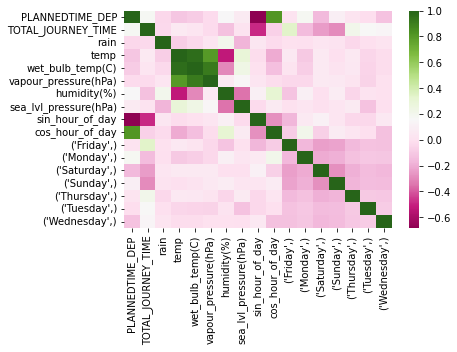

ROUTEID is  38A_32
PLANNEDTIME_DEP         -0.231448
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.012333
temp                     0.140671
wet_bulb_temp(C)         0.099746
vapour_pressure(hPa)     0.020163
humidity(%)             -0.201865
sea_lvl_pressure(hPa)   -0.036805
sin_hour_of_day         -0.088117
cos_hour_of_day         -0.330782
(Friday,)                0.220356
(Monday,)                0.092162
(Saturday,)             -0.269295
(Sunday,)               -0.289613
(Thursday,)              0.218170
(Tuesday,)               0.186852
(Wednesday,)             0.216391
Name: TOTAL_JOURNEY_TIME, dtype: float64


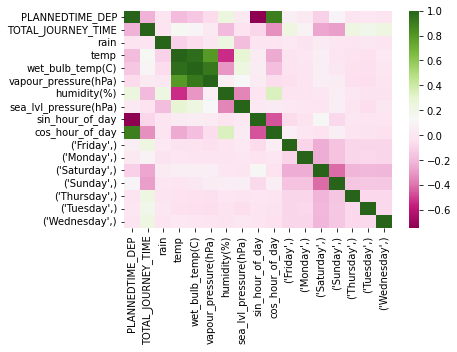

ROUTEID is  40B_65
PLANNEDTIME_DEP         -0.077712
TOTAL_JOURNEY_TIME       1.000000
rain                     0.054772
temp                    -0.043463
wet_bulb_temp(C)        -0.050520
vapour_pressure(hPa)    -0.057389
humidity(%)              0.006582
sea_lvl_pressure(hPa)   -0.028266
sin_hour_of_day          0.044614
cos_hour_of_day         -0.023472
(Friday,)                0.295272
(Monday,)                0.069658
(Saturday,)             -0.464563
(Sunday,)               -0.223778
(Thursday,)              0.207126
(Tuesday,)               0.203101
(Wednesday,)             0.289000
Name: TOTAL_JOURNEY_TIME, dtype: float64


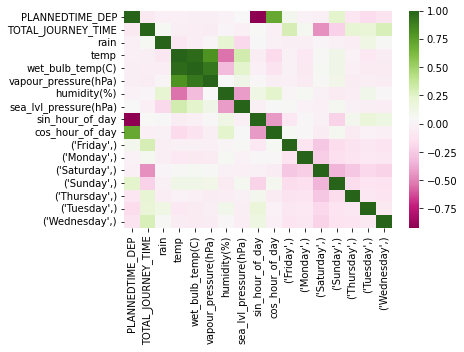

ROUTEID is  4_10
PLANNEDTIME_DEP         -0.222186
TOTAL_JOURNEY_TIME       1.000000
rain                     0.062984
temp                     0.082871
wet_bulb_temp(C)         0.054288
vapour_pressure(hPa)    -0.006228
humidity(%)             -0.139722
sea_lvl_pressure(hPa)   -0.032358
sin_hour_of_day         -0.049121
cos_hour_of_day         -0.304312
(Friday,)                0.189805
(Monday,)               -0.005880
(Saturday,)             -0.345840
(Sunday,)               -0.355744
(Thursday,)              0.192896
(Tuesday,)               0.210100
(Wednesday,)             0.249742
Name: TOTAL_JOURNEY_TIME, dtype: float64


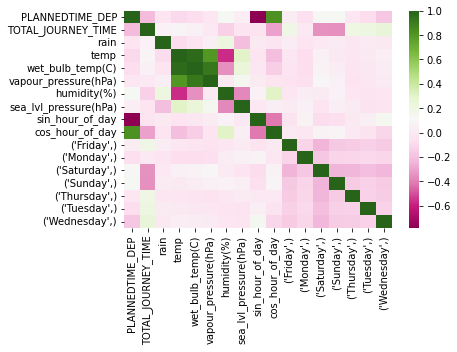

ROUTEID is  16C_28
PLANNEDTIME_DEP          0.266036
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.004738
temp                     0.068082
wet_bulb_temp(C)         0.084433
vapour_pressure(hPa)     0.101845
humidity(%)              0.098864
sea_lvl_pressure(hPa)   -0.099495
sin_hour_of_day          0.433269
cos_hour_of_day          0.433269
(Friday,)                0.167866
(Monday,)               -0.186259
(Saturday,)              0.403505
(Sunday,)               -0.385588
(Thursday,)              0.063266
(Tuesday,)              -0.043908
(Wednesday,)            -0.059189
Name: TOTAL_JOURNEY_TIME, dtype: float64


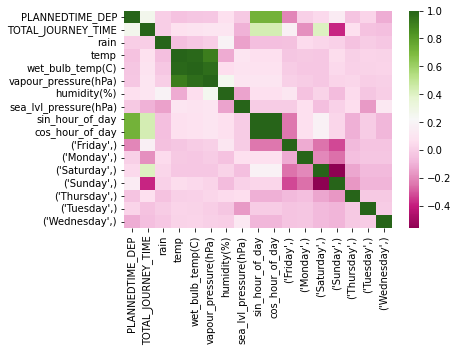

ROUTEID is  84A_3
PLANNEDTIME_DEP         -0.210975
TOTAL_JOURNEY_TIME       1.000000
rain                     0.055043
temp                     0.045565
wet_bulb_temp(C)         0.080010
vapour_pressure(hPa)     0.125745
humidity(%)              0.056424
sea_lvl_pressure(hPa)    0.004023
sin_hour_of_day          0.214297
cos_hour_of_day         -0.211479
(Friday,)               -0.031796
(Monday,)               -0.051104
(Thursday,)             -0.061731
(Tuesday,)              -0.001629
(Wednesday,)             0.156977
Name: TOTAL_JOURNEY_TIME, dtype: float64


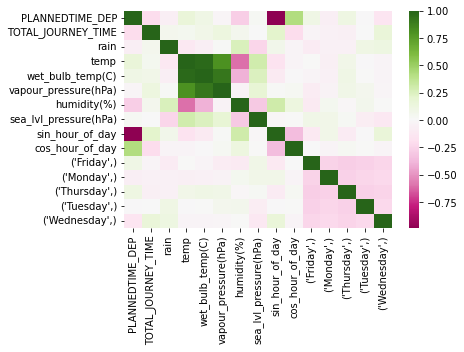

ROUTEID is  15B_64
PLANNEDTIME_DEP         -0.173090
TOTAL_JOURNEY_TIME       1.000000
rain                     0.206358
temp                     0.019733
wet_bulb_temp(C)         0.045424
vapour_pressure(hPa)     0.055190
humidity(%)              0.093649
sea_lvl_pressure(hPa)   -0.103978
sin_hour_of_day         -0.035161
cos_hour_of_day         -0.244838
(Friday,)                0.197406
(Monday,)               -0.035329
(Saturday,)             -0.270789
(Sunday,)               -0.296148
(Thursday,)              0.191575
(Tuesday,)               0.235330
(Wednesday,)             0.287998
Name: TOTAL_JOURNEY_TIME, dtype: float64


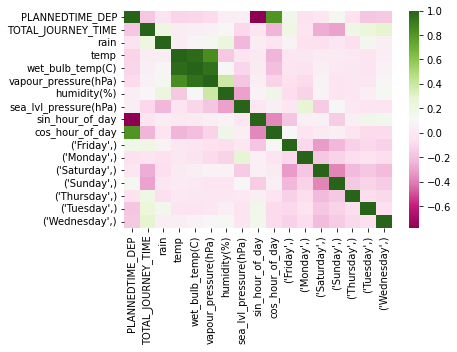

ROUTEID is  77A_29
PLANNEDTIME_DEP          0.121602
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.011087
temp                     0.079815
wet_bulb_temp(C)         0.042797
vapour_pressure(hPa)    -0.020993
humidity(%)             -0.170952
sea_lvl_pressure(hPa)    0.007795
sin_hour_of_day         -0.417506
cos_hour_of_day         -0.101619
(Friday,)                0.271133
(Monday,)               -0.024620
(Saturday,)             -0.252957
(Sunday,)               -0.344719
(Thursday,)              0.248499
(Tuesday,)               0.210613
(Wednesday,)             0.196710
Name: TOTAL_JOURNEY_TIME, dtype: float64


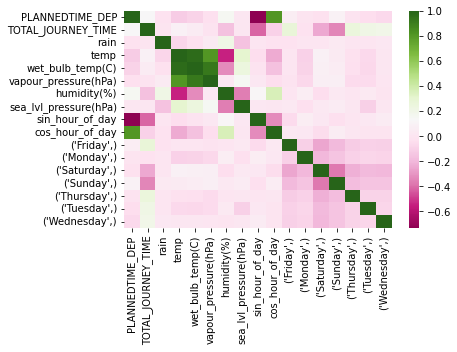

ROUTEID is  44_40
PLANNEDTIME_DEP         -0.236436
TOTAL_JOURNEY_TIME       1.000000
rain                     0.066769
temp                     0.039759
wet_bulb_temp(C)         0.021240
vapour_pressure(hPa)    -0.014634
humidity(%)             -0.078898
sea_lvl_pressure(hPa)   -0.097342
sin_hour_of_day         -0.259029
cos_hour_of_day         -0.297005
(Friday,)                0.324457
(Monday,)               -0.047706
(Saturday,)             -0.221279
(Sunday,)               -0.329183
(Thursday,)              0.244134
(Tuesday,)               0.183199
(Wednesday,)             0.187845
Name: TOTAL_JOURNEY_TIME, dtype: float64


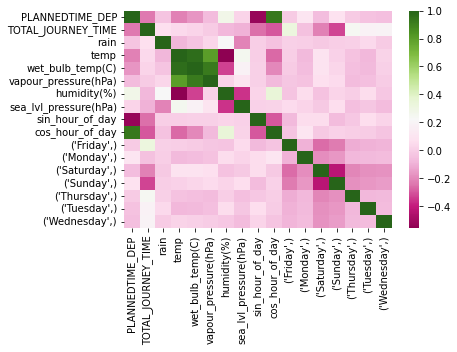

ROUTEID is  47_138
PLANNEDTIME_DEP          0.338584
TOTAL_JOURNEY_TIME       1.000000
rain                     0.231583
temp                    -0.008987
wet_bulb_temp(C)         0.048922
vapour_pressure(hPa)     0.109875
humidity(%)              0.159421
sea_lvl_pressure(hPa)    0.061155
sin_hour_of_day         -0.398552
cos_hour_of_day          0.341465
(Friday,)                0.150037
(Monday,)               -0.266003
(Thursday,)             -0.131689
(Tuesday,)              -0.025044
(Wednesday,)             0.154957
Name: TOTAL_JOURNEY_TIME, dtype: float64


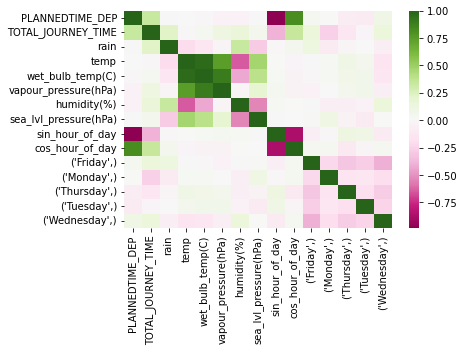

ROUTEID is  40D_102
PLANNEDTIME_DEP          0.297940
TOTAL_JOURNEY_TIME       1.000000
rain                     0.102442
temp                    -0.013723
wet_bulb_temp(C)        -0.013981
vapour_pressure(hPa)    -0.011271
humidity(%)              0.010628
sea_lvl_pressure(hPa)   -0.038893
sin_hour_of_day         -0.347266
cos_hour_of_day          0.137902
(Friday,)                0.024466
(Monday,)               -0.073017
(Thursday,)              0.014290
(Tuesday,)              -0.030587
(Wednesday,)             0.056125
Name: TOTAL_JOURNEY_TIME, dtype: float64


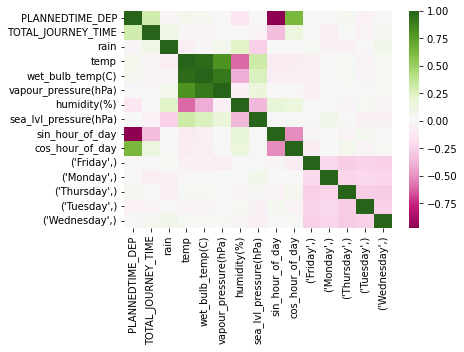

ROUTEID is  83_16
PLANNEDTIME_DEP          0.031512
TOTAL_JOURNEY_TIME       1.000000
rain                     0.051242
temp                     0.011359
wet_bulb_temp(C)        -0.010910
vapour_pressure(hPa)    -0.052337
humidity(%)             -0.081465
sea_lvl_pressure(hPa)   -0.071512
sin_hour_of_day         -0.227382
cos_hour_of_day         -0.186675
(Friday,)                0.229646
(Monday,)                0.032129
(Saturday,)             -0.570198
(Sunday,)               -0.042320
(Thursday,)              0.195627
(Tuesday,)               0.161876
(Wednesday,)             0.245293
Name: TOTAL_JOURNEY_TIME, dtype: float64


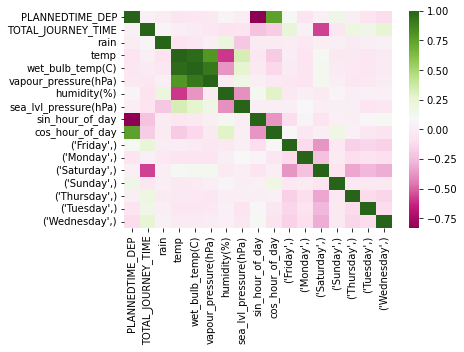

ROUTEID is  185_59
PLANNEDTIME_DEP          0.132218
TOTAL_JOURNEY_TIME       1.000000
rain                     0.133432
temp                     0.077932
wet_bulb_temp(C)         0.086182
vapour_pressure(hPa)     0.077476
humidity(%)             -0.011195
sea_lvl_pressure(hPa)   -0.093919
sin_hour_of_day         -0.154024
cos_hour_of_day          0.098322
(Monday,)               -0.013126
(Saturday,)              0.108574
(Sunday,)               -0.107626
Name: TOTAL_JOURNEY_TIME, dtype: float64


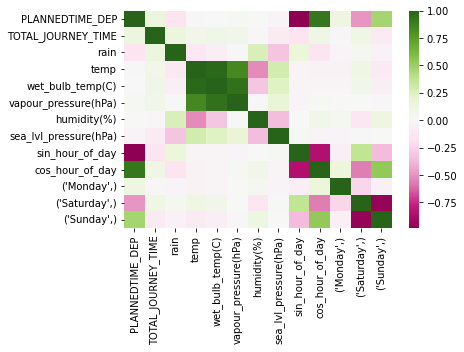

ROUTEID is  79_11
PLANNEDTIME_DEP         -0.238856
TOTAL_JOURNEY_TIME       1.000000
rain                     0.008549
temp                     0.083264
wet_bulb_temp(C)         0.056858
vapour_pressure(hPa)    -0.000450
humidity(%)             -0.133364
sea_lvl_pressure(hPa)   -0.000155
sin_hour_of_day          0.020283
cos_hour_of_day         -0.293533
(Friday,)                0.286546
(Monday,)                0.043068
(Saturday,)             -0.284387
(Sunday,)               -0.291644
(Thursday,)              0.263823
(Tuesday,)               0.191391
(Wednesday,)             0.225775
Name: TOTAL_JOURNEY_TIME, dtype: float64


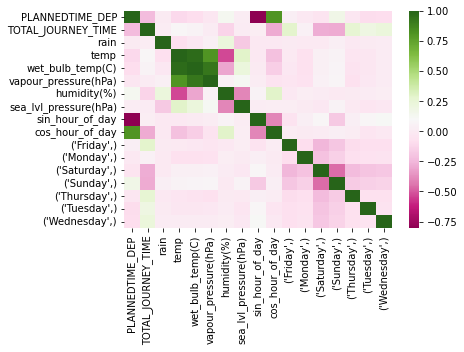

ROUTEID is  1_41
PLANNEDTIME_DEP         -0.659541
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.074890
temp                     0.090197
wet_bulb_temp(C)         0.048827
vapour_pressure(hPa)     0.006005
humidity(%)             -0.221188
sea_lvl_pressure(hPa)   -0.037967
sin_hour_of_day          0.634978
cos_hour_of_day         -0.770550
(Friday,)               -0.007218
(Monday,)                0.075846
(Saturday,)             -0.309916
(Sunday,)               -0.461351
(Thursday,)              0.131912
(Tuesday,)               0.175224
(Wednesday,)             0.214980
Name: TOTAL_JOURNEY_TIME, dtype: float64


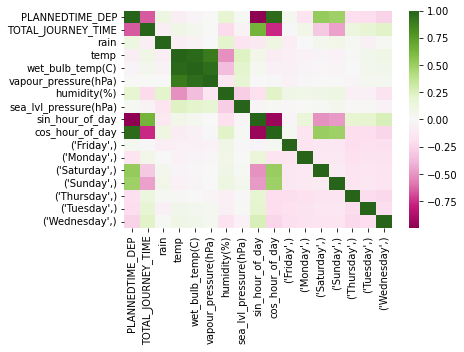

ROUTEID is  65_75
PLANNEDTIME_DEP         -0.647157
TOTAL_JOURNEY_TIME       1.000000
rain                     0.032120
temp                     0.212392
wet_bulb_temp(C)         0.151489
vapour_pressure(hPa)     0.045084
humidity(%)             -0.294125
sea_lvl_pressure(hPa)   -0.008904
sin_hour_of_day          0.085969
cos_hour_of_day         -0.715116
(Friday,)                0.001059
(Monday,)               -0.026038
(Saturday,)             -0.011723
(Sunday,)               -0.178958
(Thursday,)              0.098853
(Tuesday,)               0.159778
(Wednesday,)             0.222990
Name: TOTAL_JOURNEY_TIME, dtype: float64


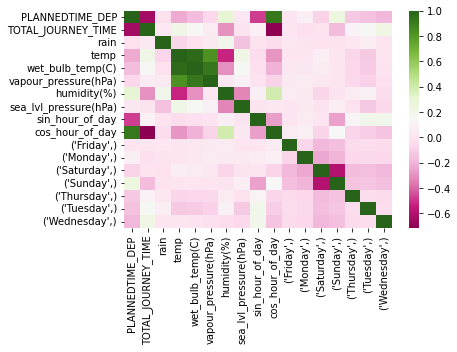

ROUTEID is  39A_40
PLANNEDTIME_DEP          0.087377
TOTAL_JOURNEY_TIME       1.000000
rain                     0.031979
temp                    -0.000468
wet_bulb_temp(C)        -0.015137
vapour_pressure(hPa)    -0.051508
humidity(%)             -0.054408
sea_lvl_pressure(hPa)   -0.029327
sin_hour_of_day         -0.385950
cos_hour_of_day         -0.046454
(Friday,)                0.238576
(Monday,)                0.026186
(Saturday,)             -0.401264
(Sunday,)               -0.221248
(Thursday,)              0.235731
(Tuesday,)               0.156312
(Wednesday,)             0.216750
Name: TOTAL_JOURNEY_TIME, dtype: float64


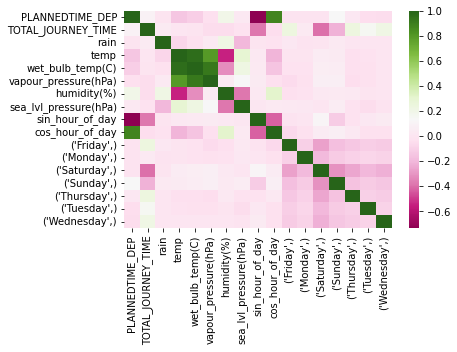

ROUTEID is  29A_15
PLANNEDTIME_DEP         -0.422295
TOTAL_JOURNEY_TIME       1.000000
rain                     0.017829
temp                     0.118044
wet_bulb_temp(C)         0.084369
vapour_pressure(hPa)     0.016993
humidity(%)             -0.165086
sea_lvl_pressure(hPa)   -0.004007
sin_hour_of_day          0.141701
cos_hour_of_day         -0.523832
(Friday,)                0.197912
(Monday,)                0.044290
(Saturday,)             -0.200967
(Sunday,)               -0.319902
(Thursday,)              0.155571
(Tuesday,)               0.169412
(Wednesday,)             0.194229
Name: TOTAL_JOURNEY_TIME, dtype: float64


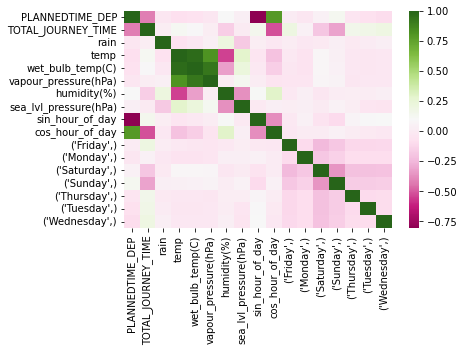

ROUTEID is  7_70
PLANNEDTIME_DEP          0.294439
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.008361
temp                     0.033067
wet_bulb_temp(C)         0.002156
vapour_pressure(hPa)    -0.051205
humidity(%)             -0.111828
sea_lvl_pressure(hPa)   -0.006917
sin_hour_of_day         -0.352835
cos_hour_of_day          0.005895
(Friday,)                0.235976
(Monday,)                0.070966
(Saturday,)             -0.343332
(Sunday,)               -0.188655
(Thursday,)              0.237200
(Tuesday,)               0.154662
(Wednesday,)             0.223913
Name: TOTAL_JOURNEY_TIME, dtype: float64


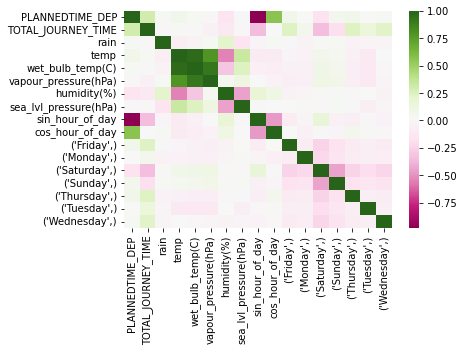

ROUTEID is  184_28
PLANNEDTIME_DEP         -0.321192
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.000488
temp                     0.175782
wet_bulb_temp(C)         0.135241
vapour_pressure(hPa)     0.064469
humidity(%)             -0.227875
sea_lvl_pressure(hPa)    0.010431
sin_hour_of_day         -0.017571
cos_hour_of_day         -0.432646
(Friday,)                0.076430
(Monday,)                0.119143
(Saturday,)             -0.303812
(Sunday,)               -0.229948
(Thursday,)              0.152975
(Tuesday,)               0.139624
(Wednesday,)             0.169139
Name: TOTAL_JOURNEY_TIME, dtype: float64


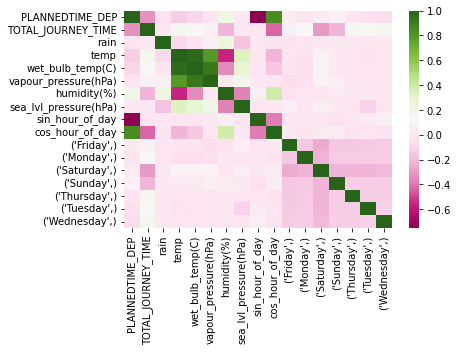

ROUTEID is  140_19
PLANNEDTIME_DEP         -0.170467
TOTAL_JOURNEY_TIME       1.000000
rain                     0.068344
temp                     0.017520
wet_bulb_temp(C)         0.004890
vapour_pressure(hPa)    -0.021433
humidity(%)             -0.048435
sea_lvl_pressure(hPa)   -0.071656
sin_hour_of_day         -0.006560
cos_hour_of_day         -0.216583
(Friday,)                0.231605
(Monday,)                0.035995
(Saturday,)             -0.345850
(Sunday,)               -0.290301
(Thursday,)              0.227069
(Tuesday,)               0.188997
(Wednesday,)             0.241866
Name: TOTAL_JOURNEY_TIME, dtype: float64


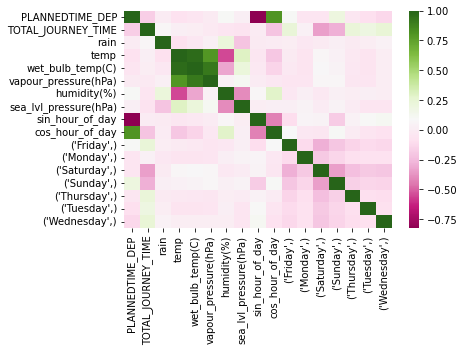

ROUTEID is  40E_90
PLANNEDTIME_DEP         -0.305777
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.159917
temp                     0.011332
wet_bulb_temp(C)        -0.004070
vapour_pressure(hPa)    -0.011623
humidity(%)             -0.055025
sea_lvl_pressure(hPa)    0.115465
sin_hour_of_day          0.106417
cos_hour_of_day         -0.285902
(Friday,)                0.210157
(Monday,)                0.098181
(Saturday,)             -0.282801
(Sunday,)               -0.168191
(Thursday,)              0.130746
(Tuesday,)               0.098778
(Wednesday,)             0.051511
Name: TOTAL_JOURNEY_TIME, dtype: float64


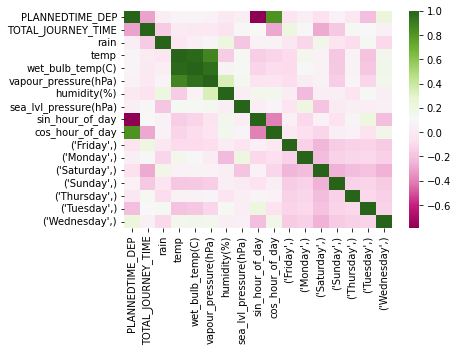

ROUTEID is  38_10
PLANNEDTIME_DEP          0.689971
TOTAL_JOURNEY_TIME       1.000000
rain                     0.042548
temp                     0.030710
wet_bulb_temp(C)         0.011009
vapour_pressure(hPa)    -0.011978
humidity(%)             -0.154319
sea_lvl_pressure(hPa)    0.089283
sin_hour_of_day         -0.781932
cos_hour_of_day         -0.777883
(Friday,)               -0.032432
(Monday,)               -0.057065
(Thursday,)             -0.127056
(Tuesday,)               0.042015
(Wednesday,)             0.172452
Name: TOTAL_JOURNEY_TIME, dtype: float64


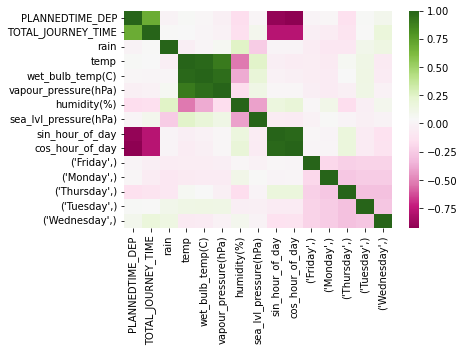

ROUTEID is  46A_67
PLANNEDTIME_DEP         -0.136139
TOTAL_JOURNEY_TIME       1.000000
rain                     0.029388
temp                    -0.016934
wet_bulb_temp(C)        -0.030684
vapour_pressure(hPa)    -0.063720
humidity(%)             -0.046213
sea_lvl_pressure(hPa)   -0.064964
sin_hour_of_day         -0.139996
cos_hour_of_day         -0.241642
(Friday,)                0.211015
(Monday,)                0.047876
(Saturday,)             -0.246595
(Sunday,)               -0.336480
(Thursday,)              0.229200
(Tuesday,)               0.156797
(Wednesday,)             0.220282
Name: TOTAL_JOURNEY_TIME, dtype: float64


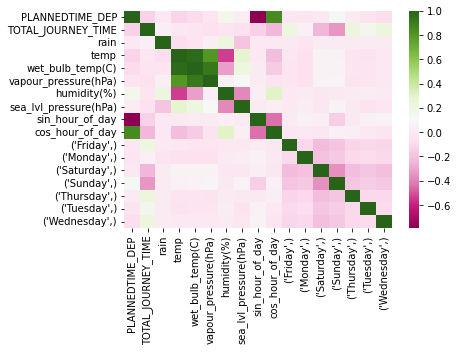

ROUTEID is  83A_26
PLANNEDTIME_DEP         -0.230821
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.042723
temp                     0.140184
wet_bulb_temp(C)         0.100362
vapour_pressure(hPa)     0.055409
humidity(%)             -0.207322
sea_lvl_pressure(hPa)    0.068471
sin_hour_of_day         -0.214150
cos_hour_of_day         -0.286059
(Monday,)               -0.057634
(Saturday,)              0.098735
(Sunday,)                0.006185
(Wednesday,)                  NaN
Name: TOTAL_JOURNEY_TIME, dtype: float64


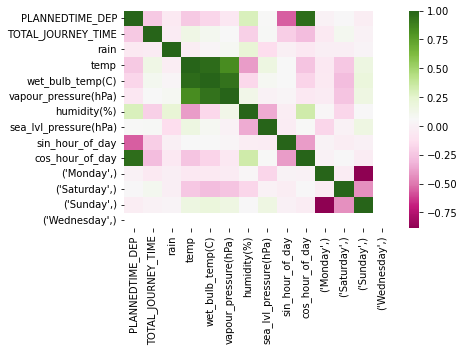

ROUTEID is  17_15
PLANNEDTIME_DEP         -0.167854
TOTAL_JOURNEY_TIME       1.000000
rain                     0.085442
temp                     0.006801
wet_bulb_temp(C)         0.003941
vapour_pressure(hPa)    -0.017234
humidity(%)             -0.017203
sea_lvl_pressure(hPa)   -0.068843
sin_hour_of_day         -0.154370
cos_hour_of_day         -0.263623
(Friday,)                0.185748
(Monday,)                0.061646
(Saturday,)             -0.648413
(Thursday,)              0.248893
(Tuesday,)               0.263529
(Wednesday,)             0.249551
Name: TOTAL_JOURNEY_TIME, dtype: float64


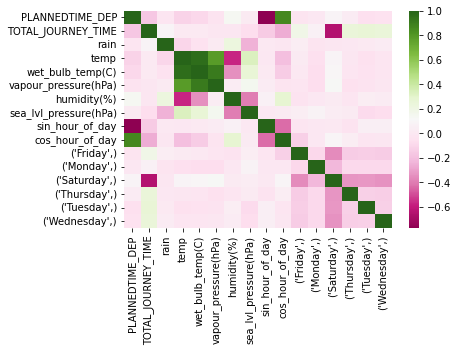

ROUTEID is  1_38
PLANNEDTIME_DEP          0.752207
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.084843
temp                     0.066988
wet_bulb_temp(C)         0.040294
vapour_pressure(hPa)     0.002419
humidity(%)             -0.142966
sea_lvl_pressure(hPa)   -0.001414
sin_hour_of_day         -0.784497
cos_hour_of_day         -0.743591
(Friday,)               -0.073247
(Monday,)               -0.047506
(Thursday,)              0.056761
(Tuesday,)               0.010139
(Wednesday,)             0.057527
Name: TOTAL_JOURNEY_TIME, dtype: float64


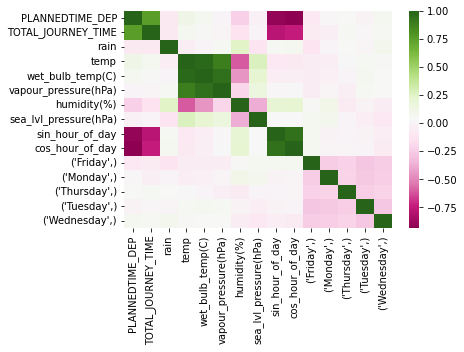

ROUTEID is  27B_23
PLANNEDTIME_DEP          0.036582
TOTAL_JOURNEY_TIME       1.000000
rain                     0.015078
temp                     0.008983
wet_bulb_temp(C)        -0.002269
vapour_pressure(hPa)    -0.027632
humidity(%)             -0.039352
sea_lvl_pressure(hPa)   -0.033383
sin_hour_of_day         -0.260956
cos_hour_of_day         -0.084257
(Friday,)                0.236190
(Monday,)                0.125316
(Saturday,)             -0.396434
(Sunday,)               -0.253530
(Thursday,)              0.221936
(Tuesday,)               0.218025
(Wednesday,)             0.273064
Name: TOTAL_JOURNEY_TIME, dtype: float64


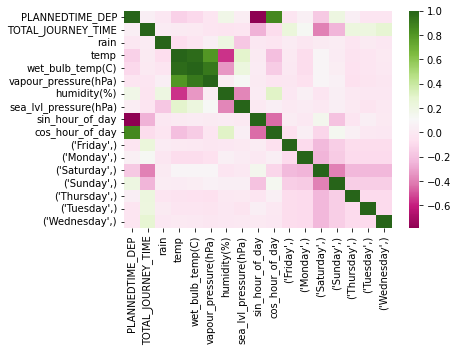

ROUTEID is  13_72
PLANNEDTIME_DEP         -0.264488
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.112489
temp                     0.077664
wet_bulb_temp(C)         0.075677
vapour_pressure(hPa)     0.062046
humidity(%)             -0.025329
sea_lvl_pressure(hPa)    0.019786
sin_hour_of_day         -0.184934
cos_hour_of_day         -0.281971
(Friday,)                0.382164
(Monday,)               -0.079303
(Saturday,)             -0.122129
(Sunday,)               -0.391665
(Thursday,)              0.272222
(Tuesday,)               0.038699
(Wednesday,)             0.103254
Name: TOTAL_JOURNEY_TIME, dtype: float64


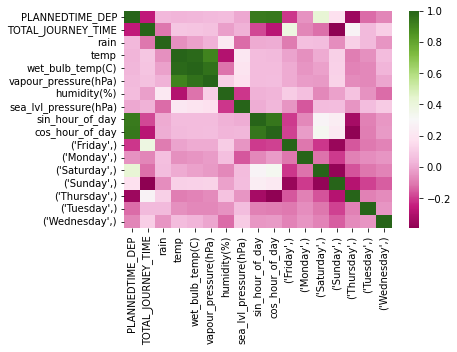

ROUTEID is  27B_40
PLANNEDTIME_DEP          0.056950
TOTAL_JOURNEY_TIME       1.000000
rain                     0.050412
temp                     0.082356
wet_bulb_temp(C)         0.084481
vapour_pressure(hPa)     0.074535
humidity(%)             -0.040268
sea_lvl_pressure(hPa)    0.051694
sin_hour_of_day          0.080551
cos_hour_of_day          0.060767
(Friday,)                0.039050
(Monday,)               -0.079951
(Saturday,)             -0.112269
(Sunday,)               -0.033801
(Thursday,)              0.148153
(Tuesday,)               0.073360
(Wednesday,)             0.058811
Name: TOTAL_JOURNEY_TIME, dtype: float64


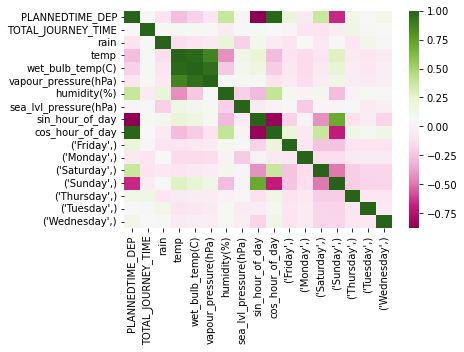

ROUTEID is  83A_17
PLANNEDTIME_DEP         -0.288677
TOTAL_JOURNEY_TIME       1.000000
rain                     0.105791
temp                     0.061511
wet_bulb_temp(C)         0.032600
vapour_pressure(hPa)    -0.034854
humidity(%)             -0.131658
sea_lvl_pressure(hPa)   -0.098610
sin_hour_of_day         -0.221694
cos_hour_of_day         -0.303096
(Friday,)                0.309269
(Monday,)                0.010354
(Saturday,)             -0.471692
(Thursday,)              0.111793
(Tuesday,)               0.080757
(Wednesday,)             0.207368
Name: TOTAL_JOURNEY_TIME, dtype: float64


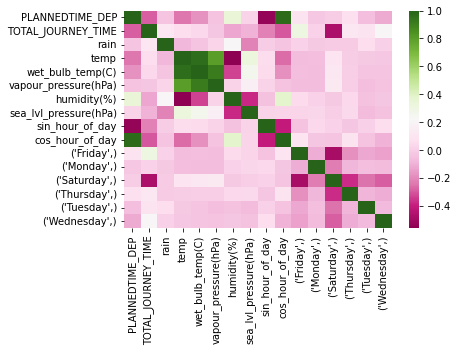

ROUTEID is  33_45
PLANNEDTIME_DEP         -0.138360
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.043692
temp                     0.144195
wet_bulb_temp(C)         0.106066
vapour_pressure(hPa)     0.035269
humidity(%)             -0.199879
sea_lvl_pressure(hPa)    0.013005
sin_hour_of_day         -0.115833
cos_hour_of_day         -0.355157
(Friday,)                0.157574
(Monday,)               -0.132126
(Saturday,)             -0.088200
(Sunday,)               -0.216842
(Thursday,)              0.172807
(Tuesday,)               0.068228
(Wednesday,)             0.126915
Name: TOTAL_JOURNEY_TIME, dtype: float64


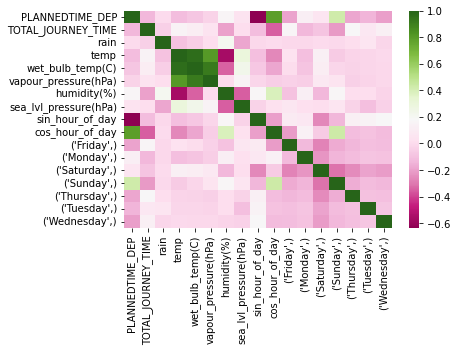

ROUTEID is  15_17
PLANNEDTIME_DEP         -0.074864
TOTAL_JOURNEY_TIME       1.000000
rain                     0.019234
temp                     0.022795
wet_bulb_temp(C)         0.008262
vapour_pressure(hPa)    -0.022685
humidity(%)             -0.062910
sea_lvl_pressure(hPa)   -0.019472
sin_hour_of_day         -0.125228
cos_hour_of_day         -0.147661
(Friday,)                0.190006
(Monday,)                0.042249
(Saturday,)             -0.286051
(Sunday,)               -0.294166
(Thursday,)              0.181009
(Tuesday,)               0.200686
(Wednesday,)             0.187011
Name: TOTAL_JOURNEY_TIME, dtype: float64


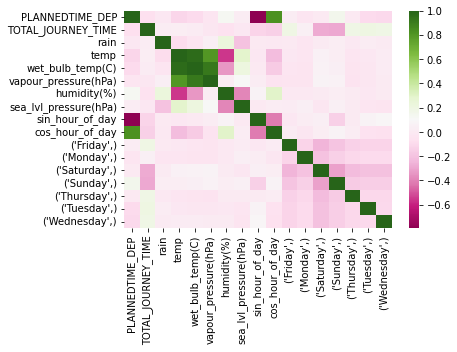

ROUTEID is  123_36
PLANNEDTIME_DEP         -0.113580
TOTAL_JOURNEY_TIME       1.000000
rain                     0.051626
temp                     0.061295
wet_bulb_temp(C)         0.033328
vapour_pressure(hPa)    -0.021615
humidity(%)             -0.118529
sea_lvl_pressure(hPa)   -0.044230
sin_hour_of_day         -0.133488
cos_hour_of_day         -0.245157
(Friday,)                0.223132
(Monday,)                0.025649
(Saturday,)             -0.328458
(Sunday,)               -0.298355
(Thursday,)              0.234778
(Tuesday,)               0.201375
(Wednesday,)             0.212142
Name: TOTAL_JOURNEY_TIME, dtype: float64


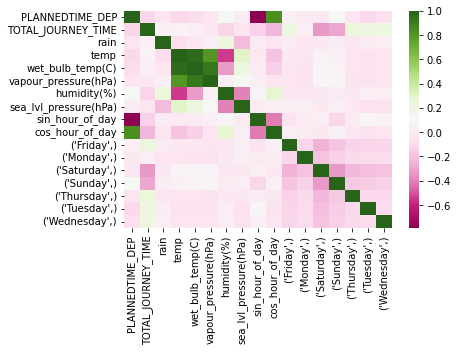

ROUTEID is  40D_101
PLANNEDTIME_DEP          0.099229
TOTAL_JOURNEY_TIME       1.000000
rain                     0.012072
temp                     0.114819
wet_bulb_temp(C)         0.119077
vapour_pressure(hPa)     0.113076
humidity(%)             -0.039671
sea_lvl_pressure(hPa)    0.013041
sin_hour_of_day         -0.305264
cos_hour_of_day          0.000622
(Friday,)                0.103724
(Monday,)                0.051530
(Saturday,)             -0.062602
(Sunday,)               -0.092569
(Thursday,)              0.086790
(Tuesday,)               0.082208
(Wednesday,)             0.061270
Name: TOTAL_JOURNEY_TIME, dtype: float64


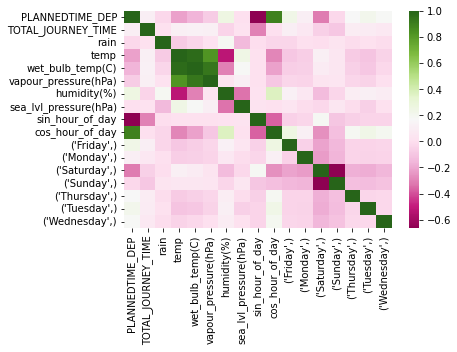

ROUTEID is  14_15
PLANNEDTIME_DEP         -0.107928
TOTAL_JOURNEY_TIME       1.000000
rain                     0.041333
temp                     0.026640
wet_bulb_temp(C)         0.007765
vapour_pressure(hPa)    -0.030031
humidity(%)             -0.071365
sea_lvl_pressure(hPa)   -0.032171
sin_hour_of_day         -0.113959
cos_hour_of_day         -0.175972
(Friday,)                0.219577
(Monday,)               -0.014117
(Saturday,)             -0.299225
(Sunday,)               -0.275405
(Thursday,)              0.219268
(Tuesday,)               0.150058
(Wednesday,)             0.224610
Name: TOTAL_JOURNEY_TIME, dtype: float64


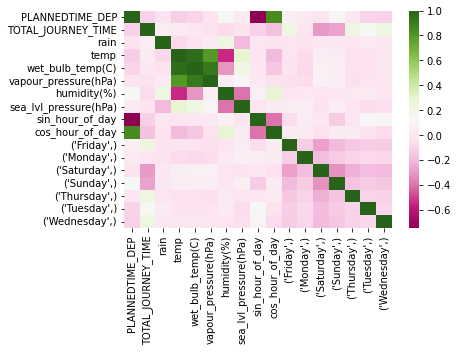

ROUTEID is  111_8
PLANNEDTIME_DEP          0.158316
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.015678
temp                    -0.027797
wet_bulb_temp(C)        -0.026862
vapour_pressure(hPa)    -0.022769
humidity(%)              0.002746
sea_lvl_pressure(hPa)   -0.053786
sin_hour_of_day         -0.210039
cos_hour_of_day          0.086794
(Friday,)                0.104576
(Monday,)                0.168109
(Saturday,)             -0.372725
(Thursday,)              0.107050
(Tuesday,)               0.111501
(Wednesday,)             0.105756
Name: TOTAL_JOURNEY_TIME, dtype: float64


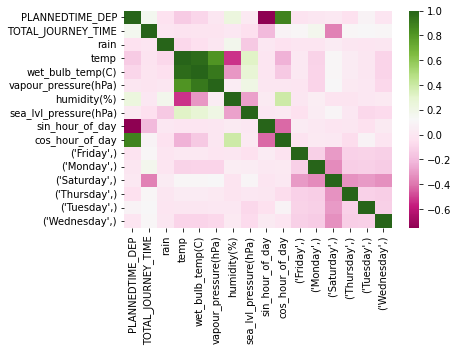

ROUTEID is  84A_1
PLANNEDTIME_DEP          0.283837
TOTAL_JOURNEY_TIME       1.000000
rain                     0.064912
temp                     0.022082
wet_bulb_temp(C)         0.020323
vapour_pressure(hPa)     0.015384
humidity(%)             -0.039467
sea_lvl_pressure(hPa)   -0.052634
sin_hour_of_day         -0.329061
cos_hour_of_day         -0.121280
(Friday,)                0.095340
(Monday,)               -0.067413
(Thursday,)             -0.035845
(Tuesday,)               0.068556
(Wednesday,)            -0.075295
Name: TOTAL_JOURNEY_TIME, dtype: float64


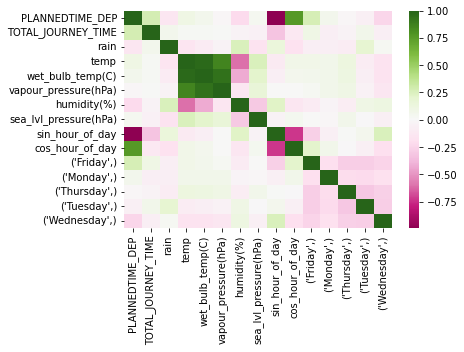

ROUTEID is  54A_12
PLANNEDTIME_DEP         -0.419916
TOTAL_JOURNEY_TIME       1.000000
rain                     0.060663
temp                     0.053953
wet_bulb_temp(C)         0.030954
vapour_pressure(hPa)    -0.013006
humidity(%)             -0.096452
sea_lvl_pressure(hPa)   -0.065400
sin_hour_of_day          0.087410
cos_hour_of_day         -0.400034
(Friday,)                0.211231
(Monday,)                0.065420
(Saturday,)             -0.207877
(Sunday,)               -0.373149
(Thursday,)              0.174062
(Tuesday,)               0.193915
(Wednesday,)             0.205873
Name: TOTAL_JOURNEY_TIME, dtype: float64


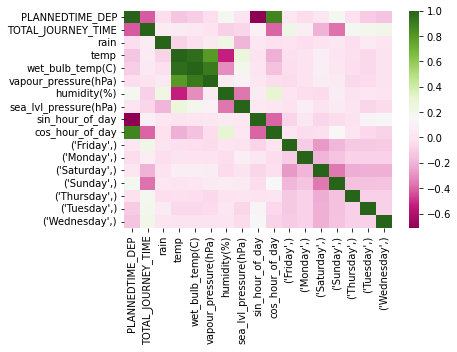

ROUTEID is  65_77
PLANNEDTIME_DEP         -0.388049
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.006627
temp                     0.142387
wet_bulb_temp(C)         0.085130
vapour_pressure(hPa)    -0.000274
humidity(%)             -0.259894
sea_lvl_pressure(hPa)   -0.003721
sin_hour_of_day         -0.350035
cos_hour_of_day         -0.436912
(Friday,)                0.149310
(Monday,)               -0.050379
(Saturday,)             -0.330085
(Sunday,)               -0.129087
(Thursday,)              0.187775
(Tuesday,)               0.177033
(Wednesday,)             0.217135
Name: TOTAL_JOURNEY_TIME, dtype: float64


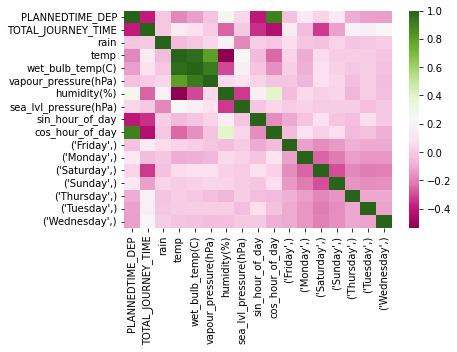

ROUTEID is  75_21
PLANNEDTIME_DEP          0.723944
TOTAL_JOURNEY_TIME       1.000000
rain                     0.076435
temp                    -0.031418
wet_bulb_temp(C)        -0.063562
vapour_pressure(hPa)    -0.089419
humidity(%)             -0.089356
sea_lvl_pressure(hPa)   -0.052401
sin_hour_of_day         -0.758068
cos_hour_of_day          0.440583
(Friday,)                0.278816
(Monday,)                0.094882
(Saturday,)             -0.877876
(Thursday,)              0.323868
(Tuesday,)               0.273493
(Wednesday,)             0.210012
Name: TOTAL_JOURNEY_TIME, dtype: float64


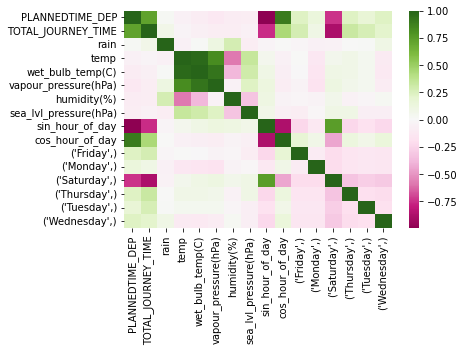

ROUTEID is  66B_55
PLANNEDTIME_DEP         -0.051612
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.019014
temp                     0.058126
wet_bulb_temp(C)         0.020066
vapour_pressure(hPa)    -0.062716
humidity(%)             -0.176397
sea_lvl_pressure(hPa)   -0.086986
sin_hour_of_day         -0.269953
cos_hour_of_day         -0.224422
(Friday,)                0.194460
(Monday,)                0.092917
(Saturday,)             -0.523487
(Thursday,)              0.114535
(Tuesday,)               0.197851
(Wednesday,)             0.222809
Name: TOTAL_JOURNEY_TIME, dtype: float64


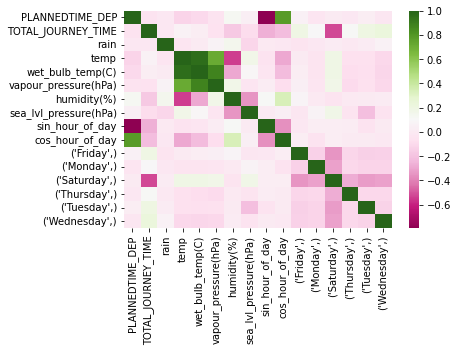

ROUTEID is  4_14
PLANNEDTIME_DEP          0.525684
TOTAL_JOURNEY_TIME       1.000000
rain                     0.169602
temp                    -0.026874
wet_bulb_temp(C)        -0.005040
vapour_pressure(hPa)     0.001429
humidity(%)              0.075461
sea_lvl_pressure(hPa)   -0.185739
sin_hour_of_day         -0.582506
cos_hour_of_day         -0.651194
(Friday,)               -0.170938
(Monday,)               -0.098768
(Thursday,)             -0.115281
(Tuesday,)               0.104092
(Wednesday,)             0.171096
Name: TOTAL_JOURNEY_TIME, dtype: float64


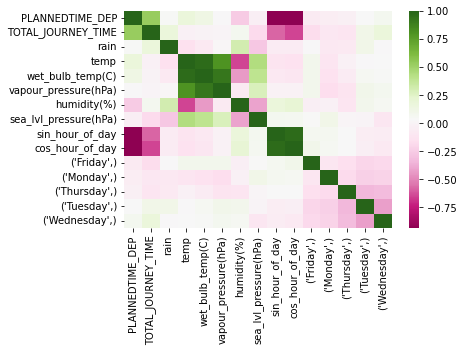

ROUTEID is  9_7
PLANNEDTIME_DEP         -0.131659
TOTAL_JOURNEY_TIME       1.000000
rain                     0.036568
temp                     0.004684
wet_bulb_temp(C)        -0.011663
vapour_pressure(hPa)    -0.047961
humidity(%)             -0.058419
sea_lvl_pressure(hPa)   -0.077190
sin_hour_of_day         -0.095357
cos_hour_of_day         -0.222294
(Friday,)                0.228945
(Monday,)                0.016656
(Saturday,)             -0.265030
(Sunday,)               -0.329694
(Thursday,)              0.234127
(Tuesday,)               0.199636
(Wednesday,)             0.216737
Name: TOTAL_JOURNEY_TIME, dtype: float64


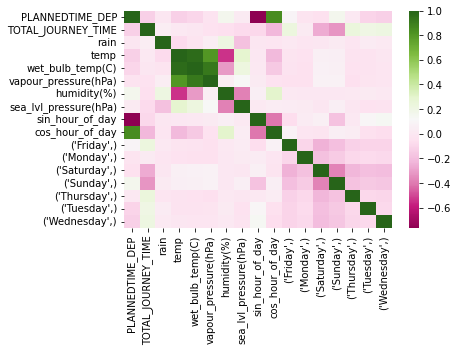

ROUTEID is  79A_28
PLANNEDTIME_DEP         -0.370568
TOTAL_JOURNEY_TIME       1.000000
rain                     0.065018
temp                     0.077370
wet_bulb_temp(C)         0.043531
vapour_pressure(hPa)    -0.024554
humidity(%)             -0.156689
sea_lvl_pressure(hPa)   -0.048687
sin_hour_of_day          0.057892
cos_hour_of_day         -0.385975
(Friday,)                0.229538
(Monday,)                0.091526
(Saturday,)             -0.396119
(Sunday,)               -0.278664
(Thursday,)              0.218532
(Tuesday,)               0.165595
(Wednesday,)             0.209615
Name: TOTAL_JOURNEY_TIME, dtype: float64


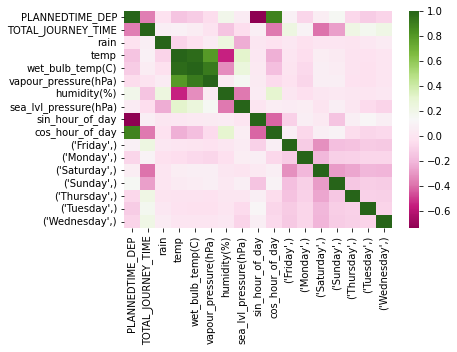

ROUTEID is  75_18
PLANNEDTIME_DEP          0.268524
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.102042
temp                    -0.046046
wet_bulb_temp(C)        -0.057577
vapour_pressure(hPa)    -0.061495
humidity(%)             -0.044006
sea_lvl_pressure(hPa)   -0.020057
sin_hour_of_day         -0.312036
cos_hour_of_day         -0.113498
(Friday,)                0.161854
(Monday,)                0.083848
(Saturday,)             -0.767541
(Thursday,)              0.133278
(Tuesday,)               0.227709
(Wednesday,)             0.119992
Name: TOTAL_JOURNEY_TIME, dtype: float64


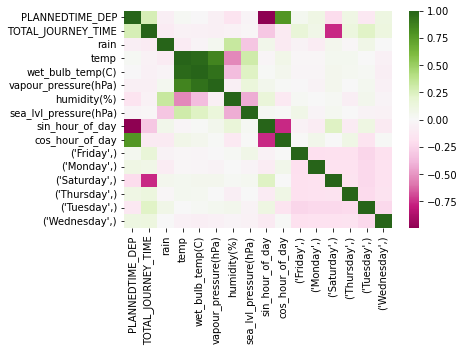

ROUTEID is  142_12
PLANNEDTIME_DEP         -0.098095
TOTAL_JOURNEY_TIME       1.000000
rain                     0.108463
temp                    -0.156057
wet_bulb_temp(C)        -0.100799
vapour_pressure(hPa)    -0.032149
humidity(%)              0.249415
sea_lvl_pressure(hPa)   -0.167067
sin_hour_of_day          0.097768
cos_hour_of_day          0.146945
(Friday,)                0.132357
(Monday,)               -0.232515
(Thursday,)              0.078123
(Tuesday,)              -0.021525
(Wednesday,)             0.009535
Name: TOTAL_JOURNEY_TIME, dtype: float64


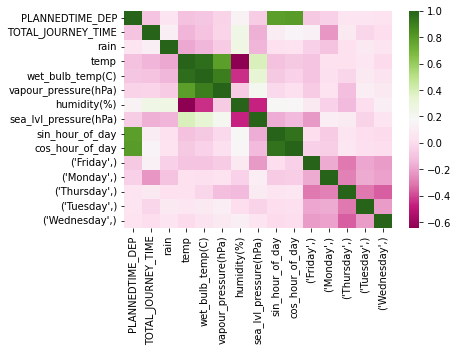

ROUTEID is  17A_17
PLANNEDTIME_DEP         -0.001403
TOTAL_JOURNEY_TIME       1.000000
rain                     0.145468
temp                    -0.001977
wet_bulb_temp(C)        -0.001275
vapour_pressure(hPa)    -0.001836
humidity(%)             -0.011184
sea_lvl_pressure(hPa)   -0.058788
sin_hour_of_day         -0.156517
cos_hour_of_day         -0.098805
(Friday,)                0.022374
(Monday,)               -0.075052
(Thursday,)              0.000185
(Tuesday,)               0.020971
(Wednesday,)             0.021415
Name: TOTAL_JOURNEY_TIME, dtype: float64


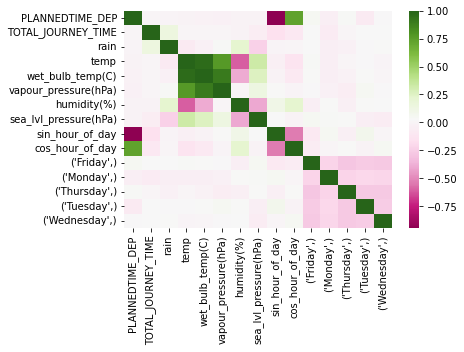

ROUTEID is  14_16
PLANNEDTIME_DEP          0.002349
TOTAL_JOURNEY_TIME       1.000000
rain                     0.081763
temp                    -0.007405
wet_bulb_temp(C)        -0.022000
vapour_pressure(hPa)    -0.047360
humidity(%)             -0.040426
sea_lvl_pressure(hPa)   -0.071195
sin_hour_of_day         -0.239699
cos_hour_of_day         -0.100752
(Friday,)                0.199324
(Monday,)                0.014516
(Saturday,)             -0.286065
(Sunday,)               -0.276511
(Thursday,)              0.203998
(Tuesday,)               0.177741
(Wednesday,)             0.207740
Name: TOTAL_JOURNEY_TIME, dtype: float64


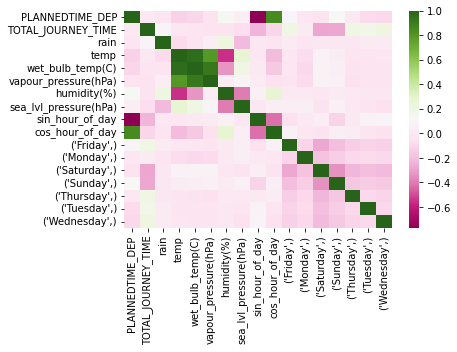

ROUTEID is  15A_83
PLANNEDTIME_DEP          0.220271
TOTAL_JOURNEY_TIME       1.000000
rain                     0.043474
temp                    -0.010082
wet_bulb_temp(C)        -0.029009
vapour_pressure(hPa)    -0.061431
humidity(%)             -0.056949
sea_lvl_pressure(hPa)   -0.070648
sin_hour_of_day         -0.437226
cos_hour_of_day          0.014036
(Friday,)                0.252918
(Monday,)               -0.000037
(Saturday,)             -0.312223
(Sunday,)               -0.301054
(Thursday,)              0.282495
(Tuesday,)               0.188389
(Wednesday,)             0.207422
Name: TOTAL_JOURNEY_TIME, dtype: float64


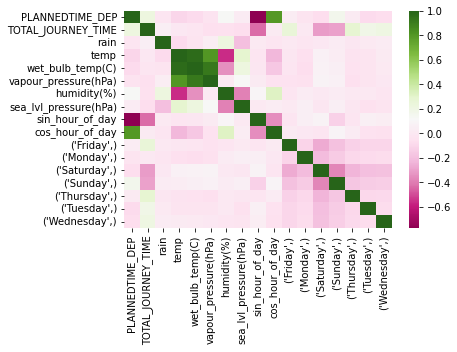

ROUTEID is  39_21
PLANNEDTIME_DEP         -0.305744
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.007276
temp                     0.051583
wet_bulb_temp(C)         0.019494
vapour_pressure(hPa)    -0.040804
humidity(%)             -0.131270
sea_lvl_pressure(hPa)   -0.040270
sin_hour_of_day          0.019262
cos_hour_of_day         -0.401072
(Friday,)                0.186631
(Monday,)                0.059356
(Saturday,)             -0.203365
(Sunday,)               -0.309757
(Thursday,)              0.164093
(Tuesday,)               0.190951
(Wednesday,)             0.222861
Name: TOTAL_JOURNEY_TIME, dtype: float64


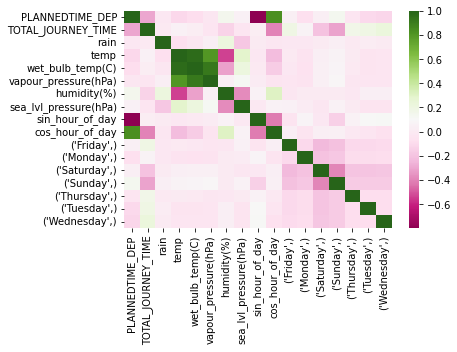

ROUTEID is  151_18
PLANNEDTIME_DEP         -0.303169
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.027017
temp                     0.074611
wet_bulb_temp(C)         0.057814
vapour_pressure(hPa)     0.026182
humidity(%)             -0.093637
sea_lvl_pressure(hPa)   -0.045133
sin_hour_of_day         -0.227917
cos_hour_of_day         -0.185695
(Friday,)                0.250446
(Monday,)               -0.050503
(Saturday,)             -0.024800
(Sunday,)               -0.356130
(Thursday,)              0.223494
(Tuesday,)               0.025685
(Wednesday,)             0.142498
Name: TOTAL_JOURNEY_TIME, dtype: float64


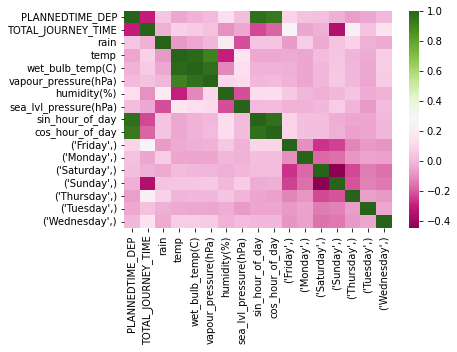

ROUTEID is  238_15
PLANNEDTIME_DEP          0.041631
TOTAL_JOURNEY_TIME       1.000000
rain                     0.035801
temp                    -0.074236
wet_bulb_temp(C)        -0.078891
vapour_pressure(hPa)    -0.080280
humidity(%)              0.003577
sea_lvl_pressure(hPa)   -0.046500
sin_hour_of_day         -0.203837
cos_hour_of_day         -0.066641
(Friday,)                0.259873
(Monday,)                0.075029
(Saturday,)             -0.376312
(Sunday,)               -0.192784
(Thursday,)              0.186898
(Tuesday,)               0.194961
(Wednesday,)             0.234402
Name: TOTAL_JOURNEY_TIME, dtype: float64


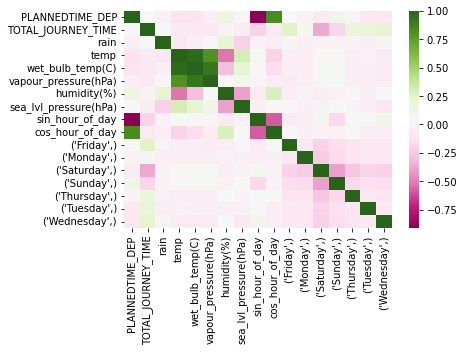

ROUTEID is  79A_27
PLANNEDTIME_DEP          0.034006
TOTAL_JOURNEY_TIME       1.000000
rain                     0.034691
temp                     0.024889
wet_bulb_temp(C)        -0.004750
vapour_pressure(hPa)    -0.048247
humidity(%)             -0.111793
sea_lvl_pressure(hPa)   -0.027836
sin_hour_of_day         -0.259707
cos_hour_of_day         -0.107012
(Friday,)                0.251864
(Monday,)                0.030734
(Saturday,)             -0.432373
(Sunday,)               -0.198205
(Thursday,)              0.201397
(Tuesday,)               0.142856
(Wednesday,)             0.188515
Name: TOTAL_JOURNEY_TIME, dtype: float64


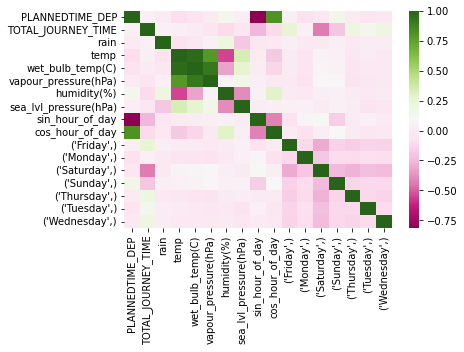

ROUTEID is  7_73
PLANNEDTIME_DEP         -0.616958
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.066315
temp                     0.073833
wet_bulb_temp(C)         0.053692
vapour_pressure(hPa)     0.014610
humidity(%)             -0.134114
sea_lvl_pressure(hPa)    0.001696
sin_hour_of_day         -0.510512
cos_hour_of_day         -0.466034
(Friday,)                0.121575
(Monday,)                0.126451
(Saturday,)             -0.115310
(Sunday,)               -0.412693
(Thursday,)              0.223026
(Tuesday,)               0.198993
(Wednesday,)             0.204620
Name: TOTAL_JOURNEY_TIME, dtype: float64


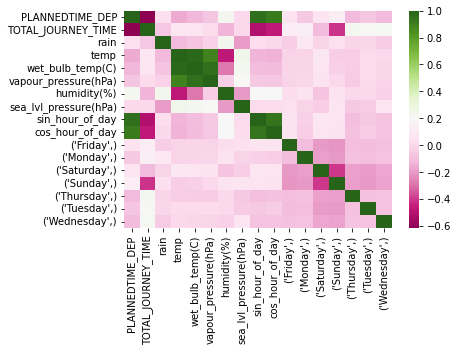

ROUTEID is  69_47
PLANNEDTIME_DEP         -0.436349
TOTAL_JOURNEY_TIME       1.000000
rain                     0.194656
temp                     0.090078
wet_bulb_temp(C)         0.060252
vapour_pressure(hPa)    -0.003107
humidity(%)             -0.119909
sea_lvl_pressure(hPa)   -0.074302
sin_hour_of_day          0.083543
cos_hour_of_day         -0.477922
(Friday,)               -0.086129
(Monday,)               -0.067299
(Saturday,)             -0.245149
(Thursday,)              0.022326
(Tuesday,)               0.094503
(Wednesday,)             0.129063
Name: TOTAL_JOURNEY_TIME, dtype: float64


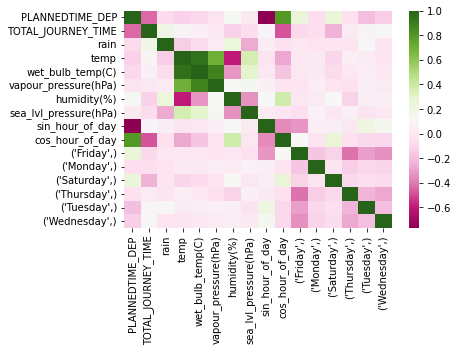

ROUTEID is  13_66
PLANNEDTIME_DEP         -0.301821
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.057302
temp                     0.141908
wet_bulb_temp(C)         0.128470
vapour_pressure(hPa)     0.106339
humidity(%)             -0.106717
sea_lvl_pressure(hPa)    0.053392
sin_hour_of_day         -0.210039
cos_hour_of_day         -0.203634
(Friday,)                0.223387
(Monday,)                0.043840
(Saturday,)             -0.001781
(Sunday,)               -0.355395
(Thursday,)              0.209036
(Tuesday,)               0.005077
(Wednesday,)             0.125009
Name: TOTAL_JOURNEY_TIME, dtype: float64


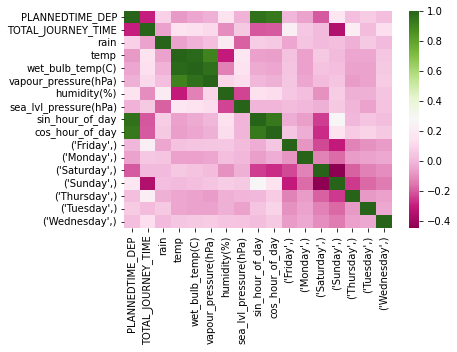

ROUTEID is  32_58
PLANNEDTIME_DEP         -0.424948
TOTAL_JOURNEY_TIME       1.000000
rain                     0.022234
temp                     0.158545
wet_bulb_temp(C)         0.113920
vapour_pressure(hPa)     0.040204
humidity(%)             -0.216538
sea_lvl_pressure(hPa)    0.000583
sin_hour_of_day          0.118872
cos_hour_of_day         -0.468729
(Friday,)                0.125255
(Monday,)                0.034707
(Saturday,)             -0.308728
(Sunday,)               -0.192684
(Thursday,)              0.196821
(Tuesday,)               0.152381
(Wednesday,)             0.233665
Name: TOTAL_JOURNEY_TIME, dtype: float64


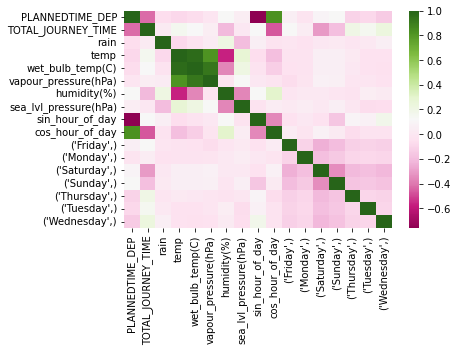

ROUTEID is  145_91
PLANNEDTIME_DEP          0.005494
TOTAL_JOURNEY_TIME       1.000000
rain                     0.088317
temp                     0.139454
wet_bulb_temp(C)         0.155420
vapour_pressure(hPa)     0.169343
humidity(%)              0.006542
sea_lvl_pressure(hPa)    0.071396
sin_hour_of_day         -0.509968
cos_hour_of_day         -0.544156
(Friday,)                0.106643
(Monday,)               -0.087030
(Thursday,)              0.055160
(Tuesday,)               0.075303
(Wednesday,)            -0.127297
Name: TOTAL_JOURNEY_TIME, dtype: float64


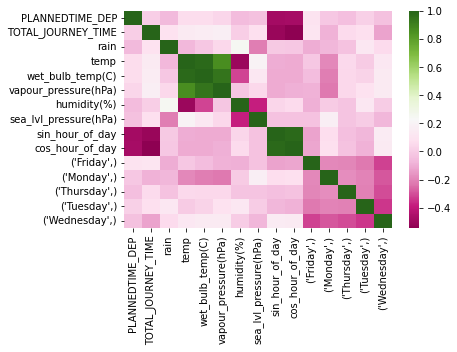

ROUTEID is  66_13
PLANNEDTIME_DEP         -0.296769
TOTAL_JOURNEY_TIME       1.000000
rain                     0.001029
temp                     0.067567
wet_bulb_temp(C)         0.029146
vapour_pressure(hPa)    -0.041008
humidity(%)             -0.156324
sea_lvl_pressure(hPa)   -0.036011
sin_hour_of_day         -0.050029
cos_hour_of_day         -0.430946
(Friday,)                0.204560
(Monday,)                0.009247
(Saturday,)             -0.282500
(Sunday,)               -0.204612
(Thursday,)              0.132917
(Tuesday,)               0.187551
(Wednesday,)             0.187365
Name: TOTAL_JOURNEY_TIME, dtype: float64


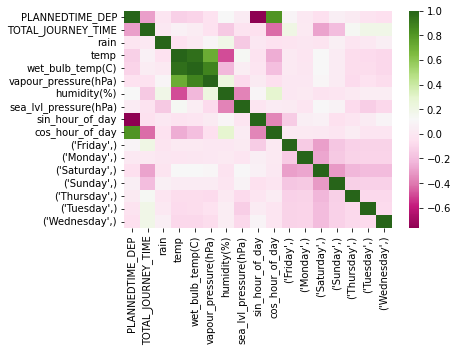

ROUTEID is  185_56
PLANNEDTIME_DEP         -0.340669
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.007170
temp                     0.220118
wet_bulb_temp(C)         0.187281
vapour_pressure(hPa)     0.105635
humidity(%)             -0.236459
sea_lvl_pressure(hPa)    0.063894
sin_hour_of_day          0.060607
cos_hour_of_day         -0.374326
(Friday,)                0.081251
(Monday,)                0.028431
(Saturday,)             -0.193041
(Sunday,)               -0.255563
(Thursday,)              0.079012
(Tuesday,)               0.055410
(Wednesday,)             0.218928
Name: TOTAL_JOURNEY_TIME, dtype: float64


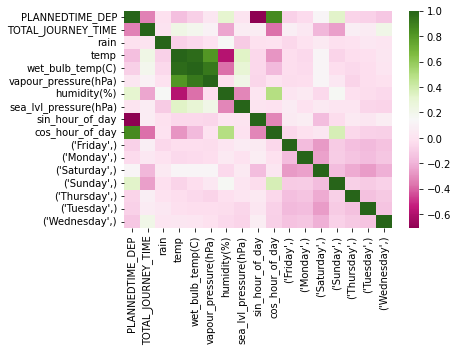

ROUTEID is  14_12
PLANNEDTIME_DEP          0.731806
TOTAL_JOURNEY_TIME       1.000000
rain                     0.285676
temp                    -0.109366
wet_bulb_temp(C)        -0.079997
vapour_pressure(hPa)    -0.057695
humidity(%)              0.183611
sea_lvl_pressure(hPa)   -0.183278
sin_hour_of_day         -0.813061
cos_hour_of_day         -0.761696
(Friday,)               -0.006440
(Monday,)               -0.029736
(Saturday,)             -0.492840
(Thursday,)              0.098960
(Tuesday,)               0.135815
(Wednesday,)             0.436974
Name: TOTAL_JOURNEY_TIME, dtype: float64


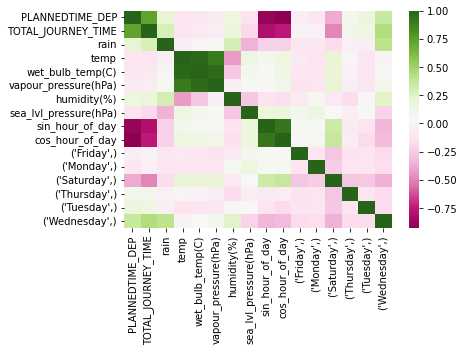

ROUTEID is  83A_23
PLANNEDTIME_DEP         -0.172029
TOTAL_JOURNEY_TIME       1.000000
rain                     0.051946
temp                     0.072824
wet_bulb_temp(C)         0.052429
vapour_pressure(hPa)    -0.002222
humidity(%)             -0.112960
sea_lvl_pressure(hPa)   -0.033231
sin_hour_of_day         -0.234796
cos_hour_of_day         -0.218031
(Friday,)                0.218310
(Monday,)                0.024037
(Saturday,)             -0.484300
(Sunday,)                0.052014
(Thursday,)              0.232749
(Tuesday,)               0.108478
(Wednesday,)             0.184966
Name: TOTAL_JOURNEY_TIME, dtype: float64


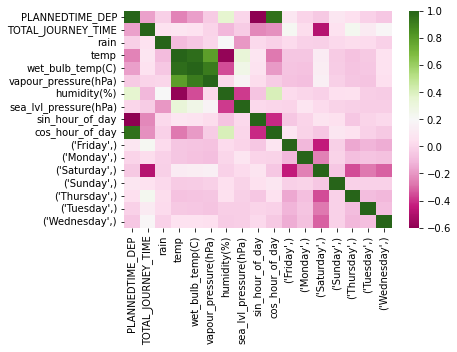

ROUTEID is  53_20
PLANNEDTIME_DEP         -0.004303
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.039381
temp                     0.025965
wet_bulb_temp(C)         0.004922
vapour_pressure(hPa)    -0.029978
humidity(%)             -0.071308
sea_lvl_pressure(hPa)   -0.003246
sin_hour_of_day         -0.058155
cos_hour_of_day         -0.075519
(Friday,)                0.216636
(Monday,)                0.232176
(Saturday,)             -0.524767
(Sunday,)               -0.254525
(Thursday,)              0.261708
(Tuesday,)               0.276733
(Wednesday,)             0.265761
Name: TOTAL_JOURNEY_TIME, dtype: float64


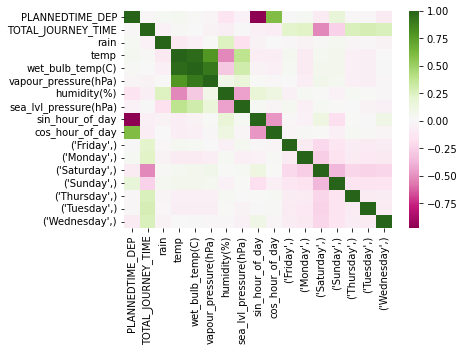

ROUTEID is  11_40
PLANNEDTIME_DEP         -0.248469
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.009299
temp                     0.068126
wet_bulb_temp(C)         0.044019
vapour_pressure(hPa)    -0.002458
humidity(%)             -0.111116
sea_lvl_pressure(hPa)   -0.011847
sin_hour_of_day         -0.021808
cos_hour_of_day         -0.201180
(Friday,)                0.181451
(Monday,)                0.083029
(Saturday,)             -0.332248
(Sunday,)               -0.296029
(Thursday,)              0.202867
(Tuesday,)               0.222929
(Wednesday,)             0.249044
Name: TOTAL_JOURNEY_TIME, dtype: float64


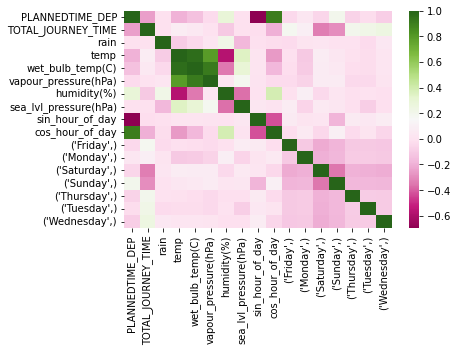

ROUTEID is  83_22
PLANNEDTIME_DEP         -0.002391
TOTAL_JOURNEY_TIME       1.000000
rain                     0.085987
temp                    -0.032572
wet_bulb_temp(C)        -0.041519
vapour_pressure(hPa)    -0.060774
humidity(%)             -0.015666
sea_lvl_pressure(hPa)   -0.068806
sin_hour_of_day         -0.191397
cos_hour_of_day         -0.131739
(Friday,)                0.188984
(Monday,)                0.075776
(Saturday,)             -0.550705
(Sunday,)               -0.054531
(Thursday,)              0.205541
(Tuesday,)               0.147540
(Wednesday,)             0.221925
Name: TOTAL_JOURNEY_TIME, dtype: float64


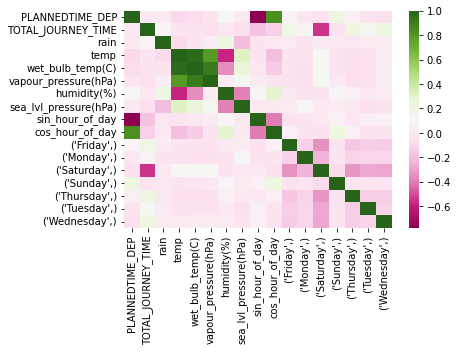

ROUTEID is  151_16
PLANNEDTIME_DEP         -0.519468
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.030071
temp                     0.106310
wet_bulb_temp(C)         0.093663
vapour_pressure(hPa)     0.071445
humidity(%)             -0.077294
sea_lvl_pressure(hPa)   -0.032567
sin_hour_of_day         -0.409505
cos_hour_of_day         -0.457947
(Friday,)                0.256237
(Monday,)               -0.095362
(Saturday,)             -0.138288
(Sunday,)               -0.316729
(Thursday,)              0.298403
(Tuesday,)               0.139868
(Wednesday,)             0.147782
Name: TOTAL_JOURNEY_TIME, dtype: float64


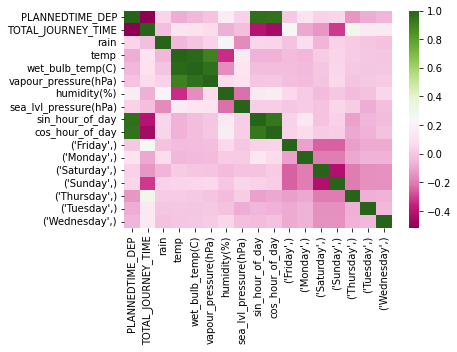

ROUTEID is  84_31
PLANNEDTIME_DEP         -0.044452
TOTAL_JOURNEY_TIME       1.000000
rain                     0.165403
temp                    -0.048424
wet_bulb_temp(C)        -0.046255
vapour_pressure(hPa)    -0.054779
humidity(%)              0.017831
sea_lvl_pressure(hPa)   -0.068060
sin_hour_of_day         -0.044866
cos_hour_of_day         -0.018525
(Friday,)                0.235450
(Monday,)                0.087572
(Saturday,)             -0.303602
(Sunday,)               -0.346861
(Thursday,)              0.169125
(Tuesday,)               0.279489
(Wednesday,)             0.197902
Name: TOTAL_JOURNEY_TIME, dtype: float64


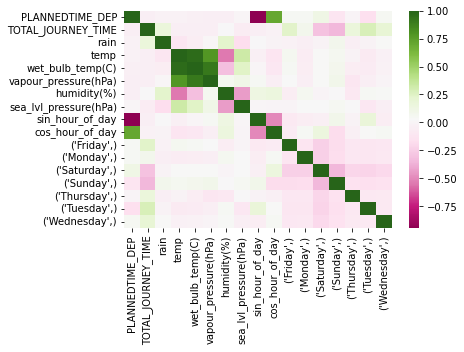

ROUTEID is  66A_37
PLANNEDTIME_DEP          0.046158
TOTAL_JOURNEY_TIME       1.000000
rain                     0.139695
temp                     0.026100
wet_bulb_temp(C)        -0.021061
vapour_pressure(hPa)    -0.093877
humidity(%)             -0.132837
sea_lvl_pressure(hPa)   -0.037935
sin_hour_of_day         -0.307807
cos_hour_of_day         -0.113741
(Friday,)                0.235064
(Monday,)                0.106714
(Saturday,)             -0.412143
(Sunday,)               -0.157887
(Thursday,)              0.218322
(Tuesday,)               0.132839
(Wednesday,)             0.198887
Name: TOTAL_JOURNEY_TIME, dtype: float64


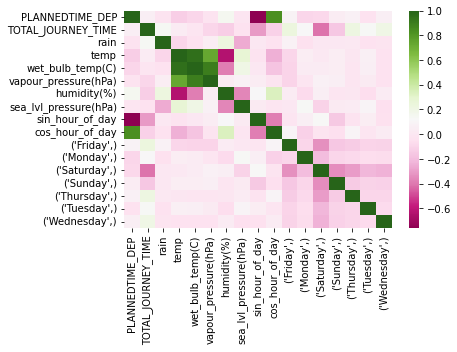

ROUTEID is  150_10
PLANNEDTIME_DEP          0.178322
TOTAL_JOURNEY_TIME       1.000000
rain                     0.222375
temp                    -0.113084
wet_bulb_temp(C)        -0.065294
vapour_pressure(hPa)    -0.019219
humidity(%)              0.220706
sea_lvl_pressure(hPa)   -0.150631
sin_hour_of_day         -0.411602
cos_hour_of_day         -0.405315
(Friday,)               -0.088063
(Monday,)               -0.152194
(Thursday,)              0.039410
(Tuesday,)               0.174487
(Wednesday,)            -0.030891
Name: TOTAL_JOURNEY_TIME, dtype: float64


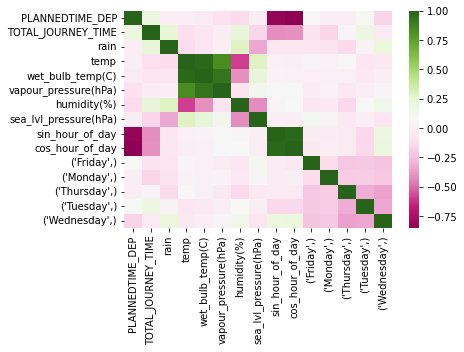

ROUTEID is  122_16
PLANNEDTIME_DEP         -0.026295
TOTAL_JOURNEY_TIME       1.000000
rain                     0.027939
temp                    -0.175845
wet_bulb_temp(C)        -0.187663
vapour_pressure(hPa)    -0.183846
humidity(%)              0.025416
sea_lvl_pressure(hPa)   -0.132443
sin_hour_of_day         -0.196002
cos_hour_of_day         -0.156710
(Friday,)                0.184548
(Monday,)                0.048274
(Saturday,)             -0.126700
(Sunday,)               -0.284923
(Thursday,)              0.273949
(Tuesday,)               0.202322
(Wednesday,)             0.243845
Name: TOTAL_JOURNEY_TIME, dtype: float64


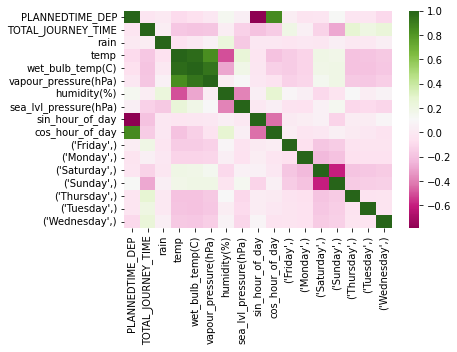

ROUTEID is  239_28
PLANNEDTIME_DEP          0.032603
TOTAL_JOURNEY_TIME       1.000000
rain                     0.027230
temp                    -0.047350
wet_bulb_temp(C)        -0.039549
vapour_pressure(hPa)    -0.027122
humidity(%)              0.048637
sea_lvl_pressure(hPa)   -0.038698
sin_hour_of_day         -0.010150
cos_hour_of_day          0.073284
(Friday,)                0.181793
(Monday,)                0.089265
(Saturday,)             -0.529910
(Thursday,)              0.214757
(Tuesday,)               0.176322
(Wednesday,)             0.203084
Name: TOTAL_JOURNEY_TIME, dtype: float64


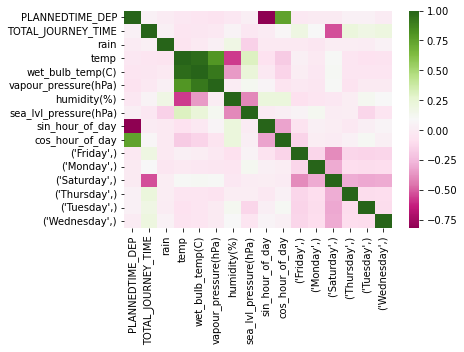

ROUTEID is  38A_20
PLANNEDTIME_DEP         -0.025201
TOTAL_JOURNEY_TIME       1.000000
rain                     0.014288
temp                     0.039120
wet_bulb_temp(C)         0.022004
vapour_pressure(hPa)    -0.016574
humidity(%)             -0.079394
sea_lvl_pressure(hPa)   -0.025116
sin_hour_of_day         -0.296328
cos_hour_of_day         -0.119508
(Friday,)                0.195874
(Monday,)                0.076246
(Saturday,)             -0.390859
(Sunday,)               -0.309561
(Thursday,)              0.258898
(Tuesday,)               0.228241
(Wednesday,)             0.270605
Name: TOTAL_JOURNEY_TIME, dtype: float64


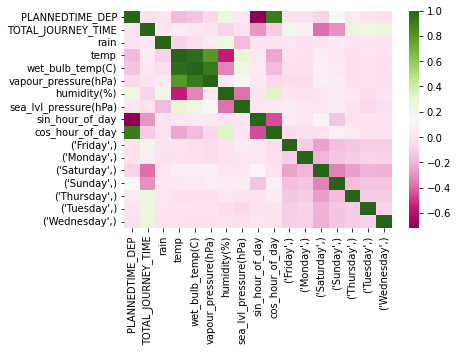

ROUTEID is  40D_104
PLANNEDTIME_DEP         -0.118091
TOTAL_JOURNEY_TIME       1.000000
rain                     0.049667
temp                    -0.054999
wet_bulb_temp(C)        -0.035659
vapour_pressure(hPa)    -0.005828
humidity(%)              0.092441
sea_lvl_pressure(hPa)   -0.074276
sin_hour_of_day          0.087250
cos_hour_of_day         -0.056871
(Friday,)               -0.014066
(Monday,)               -0.124682
(Thursday,)              0.006885
(Tuesday,)               0.008002
(Wednesday,)             0.100661
Name: TOTAL_JOURNEY_TIME, dtype: float64


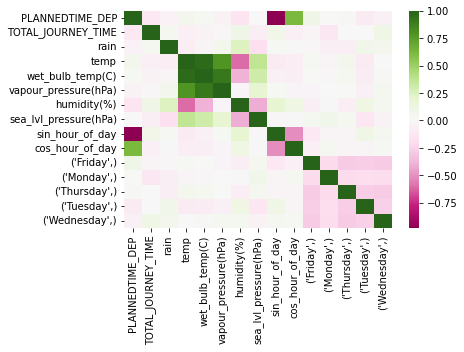

ROUTEID is  53_21
PLANNEDTIME_DEP         -0.122287
TOTAL_JOURNEY_TIME       1.000000
rain                     0.010627
temp                    -0.082475
wet_bulb_temp(C)        -0.078133
vapour_pressure(hPa)    -0.074201
humidity(%)              0.056696
sea_lvl_pressure(hPa)   -0.011856
sin_hour_of_day          0.071862
cos_hour_of_day          0.023732
(Friday,)                0.188429
(Monday,)                0.157906
(Saturday,)             -0.382596
(Sunday,)               -0.268016
(Thursday,)              0.203375
(Tuesday,)               0.206356
(Wednesday,)             0.271693
Name: TOTAL_JOURNEY_TIME, dtype: float64


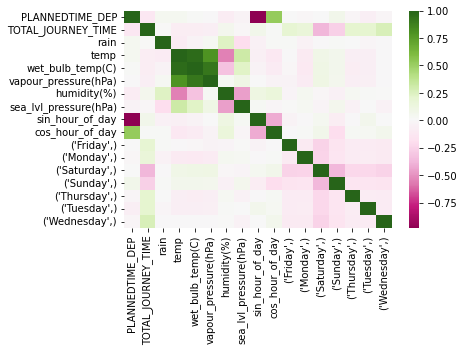

ROUTEID is  102_9
PLANNEDTIME_DEP          0.048114
TOTAL_JOURNEY_TIME       1.000000
rain                     0.029361
temp                     0.218390
wet_bulb_temp(C)         0.165407
vapour_pressure(hPa)     0.070267
humidity(%)             -0.277502
sea_lvl_pressure(hPa)    0.012243
sin_hour_of_day         -0.369483
cos_hour_of_day         -0.243352
(Friday,)                0.201208
(Monday,)                0.063035
(Saturday,)             -0.302964
(Sunday,)               -0.120026
(Thursday,)              0.125124
(Tuesday,)               0.107004
(Wednesday,)             0.168986
Name: TOTAL_JOURNEY_TIME, dtype: float64


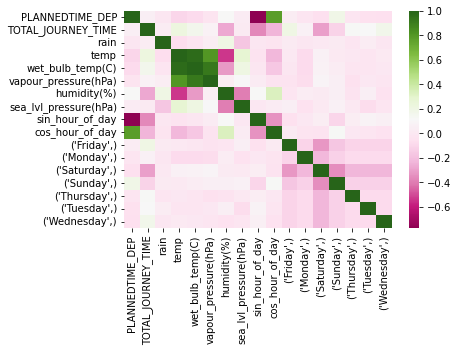

ROUTEID is  38B_40
PLANNEDTIME_DEP          0.544171
TOTAL_JOURNEY_TIME       1.000000
rain                     0.098025
temp                    -0.051362
wet_bulb_temp(C)        -0.074036
vapour_pressure(hPa)    -0.077064
humidity(%)             -0.134591
sea_lvl_pressure(hPa)   -0.030038
sin_hour_of_day         -0.663593
cos_hour_of_day         -0.672760
(Friday,)               -0.142472
(Monday,)               -0.098852
(Thursday,)             -0.051548
(Tuesday,)               0.016113
(Wednesday,)             0.267593
Name: TOTAL_JOURNEY_TIME, dtype: float64


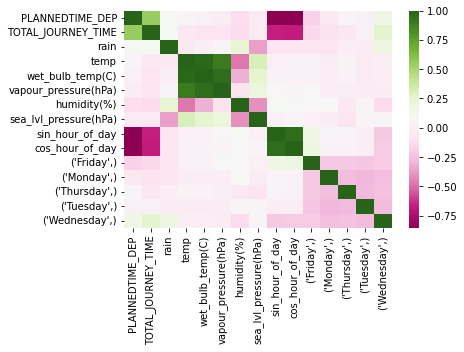

ROUTEID is  185_60
PLANNEDTIME_DEP         -0.063939
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.114383
temp                     0.170721
wet_bulb_temp(C)         0.128214
vapour_pressure(hPa)     0.087230
humidity(%)             -0.208440
sea_lvl_pressure(hPa)    0.099908
sin_hour_of_day         -0.056872
cos_hour_of_day         -0.058683
(Monday,)                0.105547
(Saturday,)              0.138517
(Sunday,)               -0.141771
Name: TOTAL_JOURNEY_TIME, dtype: float64


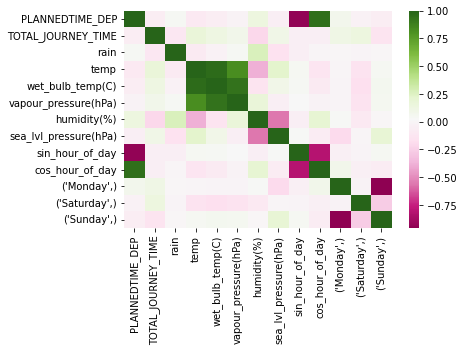

ROUTEID is  26_29
PLANNEDTIME_DEP         -0.300763
TOTAL_JOURNEY_TIME       1.000000
rain                     0.072116
temp                     0.029536
wet_bulb_temp(C)        -0.018621
vapour_pressure(hPa)    -0.097031
humidity(%)             -0.136272
sea_lvl_pressure(hPa)    0.012094
sin_hour_of_day          0.062450
cos_hour_of_day         -0.361679
(Friday,)                0.181247
(Monday,)                0.038016
(Saturday,)             -0.409029
(Sunday,)               -0.161720
(Thursday,)              0.148551
(Tuesday,)               0.180684
(Wednesday,)             0.172122
Name: TOTAL_JOURNEY_TIME, dtype: float64


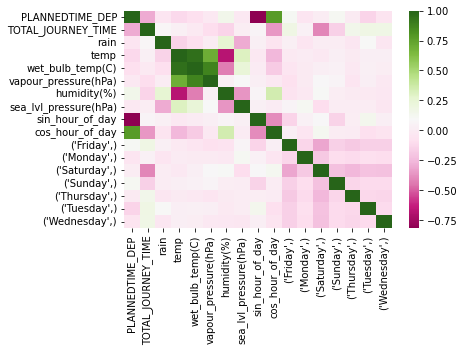

ROUTEID is  114_6
PLANNEDTIME_DEP         -0.092980
TOTAL_JOURNEY_TIME       1.000000
rain                     0.142654
temp                    -0.072680
wet_bulb_temp(C)        -0.076508
vapour_pressure(hPa)    -0.084347
humidity(%)              0.020390
sea_lvl_pressure(hPa)   -0.097153
sin_hour_of_day         -0.028717
cos_hour_of_day         -0.192367
(Friday,)                0.141475
(Monday,)                0.083895
(Saturday,)             -0.594728
(Thursday,)              0.191289
(Tuesday,)               0.276203
(Wednesday,)             0.264136
Name: TOTAL_JOURNEY_TIME, dtype: float64


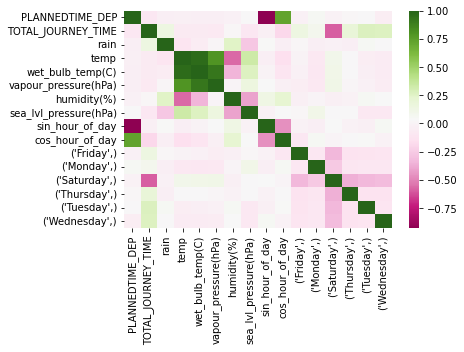

ROUTEID is  84X_62
PLANNEDTIME_DEP          0.323647
TOTAL_JOURNEY_TIME       1.000000
rain                     0.113332
temp                    -0.087588
wet_bulb_temp(C)        -0.029560
vapour_pressure(hPa)     0.003627
humidity(%)              0.183910
sea_lvl_pressure(hPa)   -0.072202
sin_hour_of_day         -0.626547
cos_hour_of_day         -0.579572
(Friday,)               -0.181354
(Monday,)               -0.188300
(Thursday,)             -0.033147
(Tuesday,)              -0.010518
(Wednesday,)             0.262001
Name: TOTAL_JOURNEY_TIME, dtype: float64


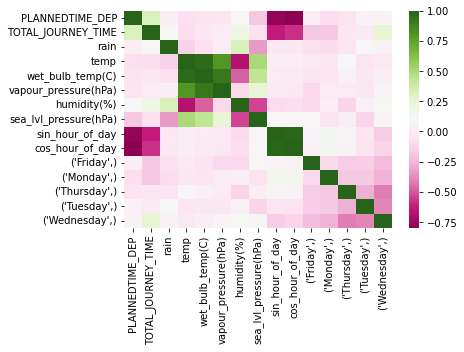

ROUTEID is  7A_86
PLANNEDTIME_DEP         -0.567326
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.044412
temp                     0.173991
wet_bulb_temp(C)         0.152191
vapour_pressure(hPa)     0.125378
humidity(%)             -0.141663
sea_lvl_pressure(hPa)    0.051984
sin_hour_of_day         -0.496456
cos_hour_of_day         -0.493936
(Friday,)                0.133133
(Monday,)               -0.201467
(Saturday,)              0.125779
(Sunday,)               -0.313337
(Thursday,)              0.215157
(Tuesday,)               0.079090
(Wednesday,)             0.092883
Name: TOTAL_JOURNEY_TIME, dtype: float64


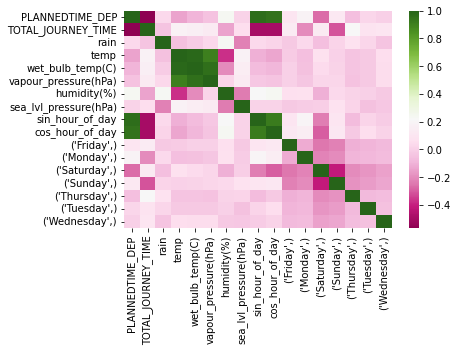

ROUTEID is  270_42
PLANNEDTIME_DEP         -0.263176
TOTAL_JOURNEY_TIME       1.000000
rain                     0.000192
temp                     0.012960
wet_bulb_temp(C)        -0.002421
vapour_pressure(hPa)    -0.022698
humidity(%)             -0.058813
sea_lvl_pressure(hPa)   -0.027507
sin_hour_of_day          0.093710
cos_hour_of_day         -0.207084
(Friday,)                0.105630
(Monday,)                0.098680
(Saturday,)             -0.194740
(Sunday,)               -0.151478
(Thursday,)              0.084322
(Tuesday,)               0.150654
(Wednesday,)             0.142298
Name: TOTAL_JOURNEY_TIME, dtype: float64


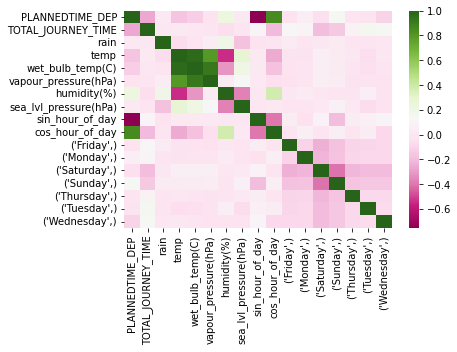

ROUTEID is  7A_89
PLANNEDTIME_DEP          0.497747
TOTAL_JOURNEY_TIME       1.000000
rain                     0.126931
temp                     0.009739
wet_bulb_temp(C)         0.020104
vapour_pressure(hPa)     0.021269
humidity(%)              0.011628
sea_lvl_pressure(hPa)   -0.054854
sin_hour_of_day         -0.522991
cos_hour_of_day         -0.617305
(Friday,)               -0.031633
(Monday,)               -0.115209
(Thursday,)              0.048461
(Tuesday,)               0.008814
(Wednesday,)             0.074001
Name: TOTAL_JOURNEY_TIME, dtype: float64


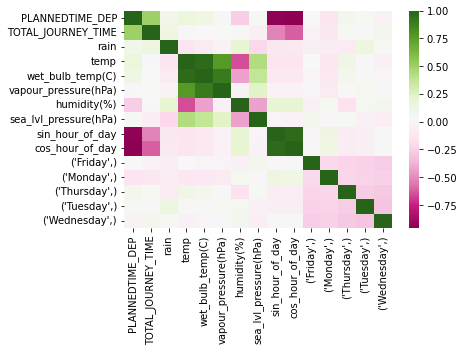

ROUTEID is  111_7
PLANNEDTIME_DEP         -0.216319
TOTAL_JOURNEY_TIME       1.000000
rain                     0.000541
temp                     0.145824
wet_bulb_temp(C)         0.093421
vapour_pressure(hPa)    -0.000341
humidity(%)             -0.251268
sea_lvl_pressure(hPa)   -0.010085
sin_hour_of_day         -0.180939
cos_hour_of_day         -0.424115
(Friday,)                0.171844
(Monday,)                0.091776
(Saturday,)             -0.363848
(Sunday,)               -0.124402
(Thursday,)              0.137735
(Tuesday,)               0.034494
(Wednesday,)             0.183674
Name: TOTAL_JOURNEY_TIME, dtype: float64


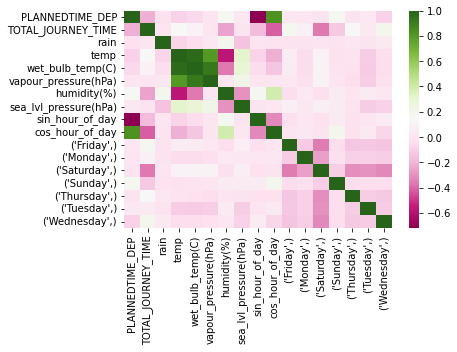

ROUTEID is  185_50
PLANNEDTIME_DEP         -0.447605
TOTAL_JOURNEY_TIME       1.000000
rain                     0.034243
temp                     0.123766
wet_bulb_temp(C)         0.114022
vapour_pressure(hPa)     0.091204
humidity(%)             -0.082718
sea_lvl_pressure(hPa)   -0.053526
sin_hour_of_day          0.305493
cos_hour_of_day         -0.479997
(Friday,)                0.135700
(Monday,)                0.142634
(Saturday,)             -0.277530
(Sunday,)               -0.299134
(Thursday,)              0.111627
(Tuesday,)               0.148022
(Wednesday,)             0.223134
Name: TOTAL_JOURNEY_TIME, dtype: float64


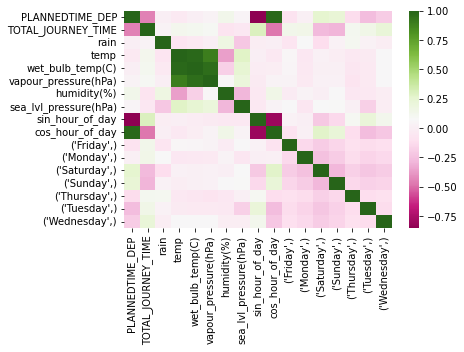

ROUTEID is  26_24
PLANNEDTIME_DEP         -0.122045
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.022076
temp                     0.057482
wet_bulb_temp(C)         0.045651
vapour_pressure(hPa)    -0.000381
humidity(%)             -0.078719
sea_lvl_pressure(hPa)   -0.057194
sin_hour_of_day         -0.128916
cos_hour_of_day         -0.157849
(Friday,)                0.144101
(Monday,)               -0.035546
(Saturday,)             -0.373131
(Sunday,)               -0.165088
(Thursday,)              0.170799
(Tuesday,)               0.193708
(Wednesday,)             0.171721
Name: TOTAL_JOURNEY_TIME, dtype: float64


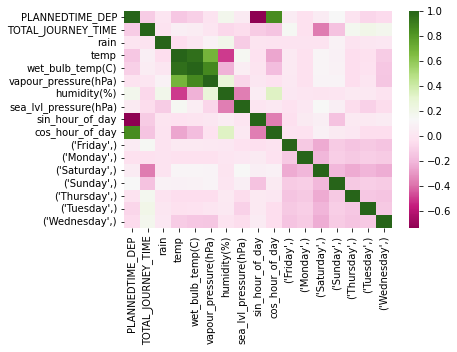

ROUTEID is  40_32
PLANNEDTIME_DEP         -0.336509
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.088319
temp                     0.186931
wet_bulb_temp(C)         0.186182
vapour_pressure(hPa)     0.172689
humidity(%)             -0.009408
sea_lvl_pressure(hPa)    0.009807
sin_hour_of_day          0.324657
cos_hour_of_day          0.324657
(Friday,)                0.253946
(Monday,)               -0.136991
(Saturday,)              0.114241
(Sunday,)               -0.366281
(Thursday,)              0.153914
(Tuesday,)               0.222857
(Wednesday,)             0.040692
Name: TOTAL_JOURNEY_TIME, dtype: float64


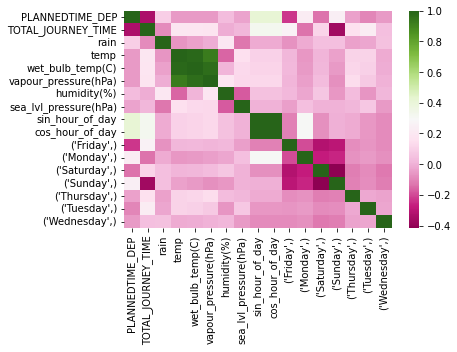

ROUTEID is  84_28
PLANNEDTIME_DEP         -0.139150
TOTAL_JOURNEY_TIME       1.000000
rain                     0.011606
temp                     0.067978
wet_bulb_temp(C)         0.045720
vapour_pressure(hPa)    -0.017226
humidity(%)             -0.104044
sea_lvl_pressure(hPa)    0.047328
sin_hour_of_day         -0.012223
cos_hour_of_day         -0.186695
(Friday,)                0.279409
(Monday,)                0.098115
(Saturday,)             -0.200261
(Sunday,)               -0.301127
(Thursday,)              0.134596
(Tuesday,)               0.052210
(Wednesday,)             0.237261
Name: TOTAL_JOURNEY_TIME, dtype: float64


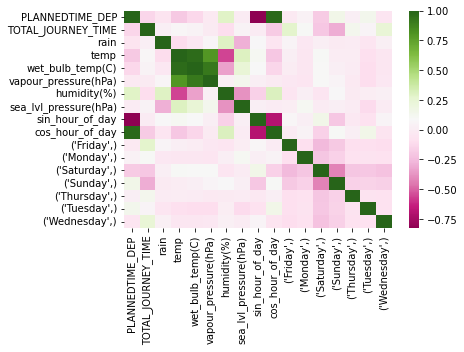

ROUTEID is  17A_11
PLANNEDTIME_DEP          0.262657
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.010069
temp                     0.103777
wet_bulb_temp(C)         0.078691
vapour_pressure(hPa)     0.027141
humidity(%)             -0.140759
sea_lvl_pressure(hPa)   -0.002511
sin_hour_of_day         -0.431030
cos_hour_of_day         -0.060093
(Monday,)               -0.031947
(Saturday,)              0.031323
(Sunday,)               -0.019962
Name: TOTAL_JOURNEY_TIME, dtype: float64


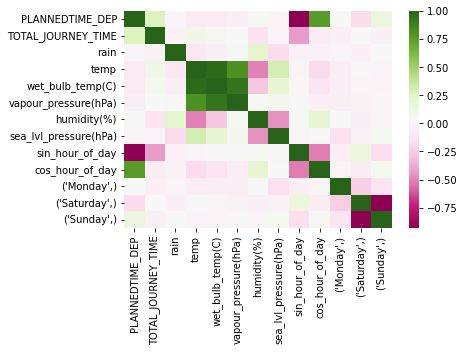

ROUTEID is  7_74
PLANNEDTIME_DEP          0.555299
TOTAL_JOURNEY_TIME       1.000000
rain                     0.045239
temp                    -0.002693
wet_bulb_temp(C)         0.020287
vapour_pressure(hPa)     0.027597
humidity(%)              0.064547
sea_lvl_pressure(hPa)   -0.122752
sin_hour_of_day         -0.606816
cos_hour_of_day         -0.674229
(Friday,)               -0.039344
(Monday,)               -0.086454
(Thursday,)             -0.070957
(Tuesday,)              -0.009304
(Wednesday,)             0.163446
Name: TOTAL_JOURNEY_TIME, dtype: float64


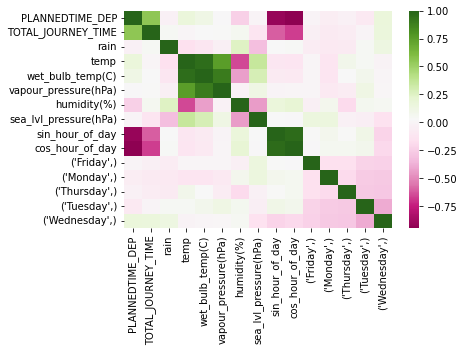

ROUTEID is  38B_44
PLANNEDTIME_DEP          0.124035
TOTAL_JOURNEY_TIME       1.000000
rain                     0.075941
temp                    -0.101687
wet_bulb_temp(C)        -0.115982
vapour_pressure(hPa)    -0.112878
humidity(%)             -0.020910
sea_lvl_pressure(hPa)   -0.068382
sin_hour_of_day         -0.374477
cos_hour_of_day         -0.402875
(Friday,)                0.004125
(Monday,)               -0.065772
(Thursday,)             -0.052080
(Tuesday,)               0.085029
(Wednesday,)             0.018624
Name: TOTAL_JOURNEY_TIME, dtype: float64


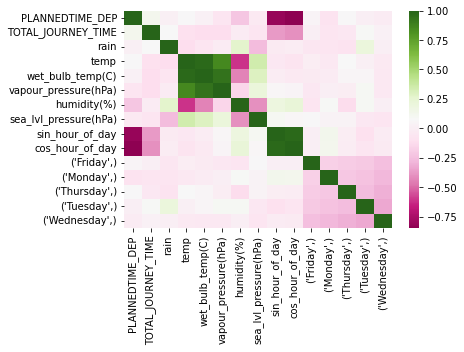

ROUTEID is  27_19
PLANNEDTIME_DEP         -0.110148
TOTAL_JOURNEY_TIME       1.000000
rain                     0.042403
temp                     0.056000
wet_bulb_temp(C)         0.026859
vapour_pressure(hPa)    -0.026651
humidity(%)             -0.121458
sea_lvl_pressure(hPa)   -0.023775
sin_hour_of_day         -0.191730
cos_hour_of_day         -0.238775
(Friday,)                0.240506
(Monday,)                0.015579
(Saturday,)             -0.335605
(Sunday,)               -0.289643
(Thursday,)              0.235906
(Tuesday,)               0.166273
(Wednesday,)             0.207248
Name: TOTAL_JOURNEY_TIME, dtype: float64


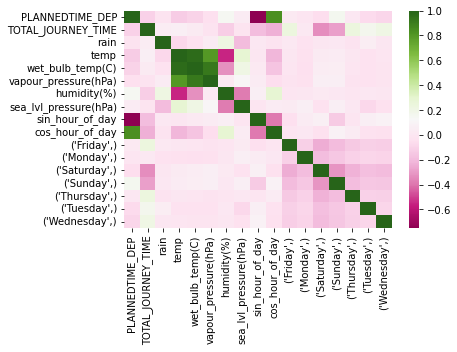

ROUTEID is  84_27
PLANNEDTIME_DEP         -0.232572
TOTAL_JOURNEY_TIME       1.000000
rain                     0.061112
temp                     0.087729
wet_bulb_temp(C)         0.067517
vapour_pressure(hPa)     0.014616
humidity(%)             -0.110039
sea_lvl_pressure(hPa)   -0.054582
sin_hour_of_day         -0.203874
cos_hour_of_day         -0.301713
(Friday,)                0.250482
(Monday,)               -0.062524
(Saturday,)             -0.163032
(Sunday,)               -0.264953
(Thursday,)              0.161300
(Tuesday,)               0.096462
(Wednesday,)             0.165878
Name: TOTAL_JOURNEY_TIME, dtype: float64


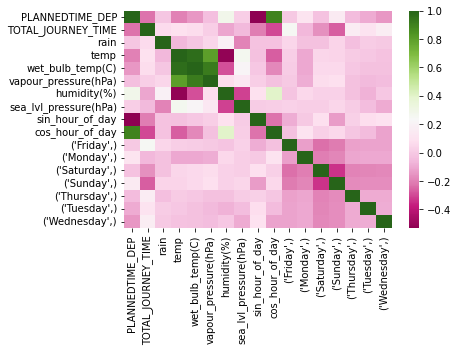

ROUTEID is  7_66
PLANNEDTIME_DEP          0.341612
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.086303
temp                    -0.009314
wet_bulb_temp(C)        -0.039310
vapour_pressure(hPa)    -0.081740
humidity(%)             -0.122606
sea_lvl_pressure(hPa)   -0.011281
sin_hour_of_day         -0.370359
cos_hour_of_day          0.058734
(Friday,)                0.085959
(Monday,)                0.046156
(Saturday,)             -0.233953
(Sunday,)               -0.170659
(Thursday,)              0.118584
(Tuesday,)               0.167820
(Wednesday,)             0.210928
Name: TOTAL_JOURNEY_TIME, dtype: float64


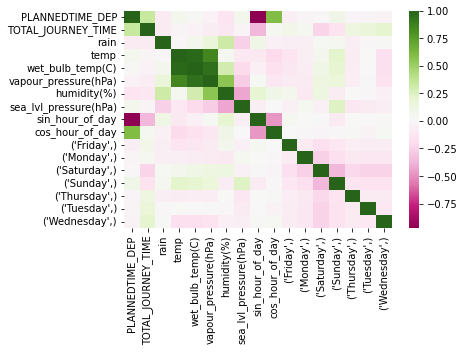

ROUTEID is  15B_61
PLANNEDTIME_DEP         -0.303110
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.027980
temp                     0.030295
wet_bulb_temp(C)         0.008561
vapour_pressure(hPa)    -0.028050
humidity(%)             -0.085059
sea_lvl_pressure(hPa)   -0.043959
sin_hour_of_day          0.105364
cos_hour_of_day         -0.298928
(Friday,)                0.158497
(Monday,)                0.054259
(Saturday,)             -0.242970
(Sunday,)               -0.380452
(Thursday,)              0.281628
(Tuesday,)               0.214629
(Wednesday,)             0.243077
Name: TOTAL_JOURNEY_TIME, dtype: float64


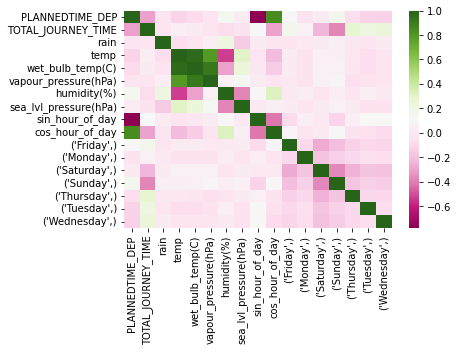

ROUTEID is  142_8
PLANNEDTIME_DEP          0.355397
TOTAL_JOURNEY_TIME       1.000000
rain                     0.045909
temp                    -0.146685
wet_bulb_temp(C)        -0.116538
vapour_pressure(hPa)    -0.051276
humidity(%)              0.134653
sea_lvl_pressure(hPa)   -0.173704
sin_hour_of_day         -0.422286
cos_hour_of_day          0.256052
(Friday,)                0.131209
(Monday,)               -0.116074
(Thursday,)              0.041269
(Tuesday,)              -0.011083
(Wednesday,)            -0.086712
Name: TOTAL_JOURNEY_TIME, dtype: float64


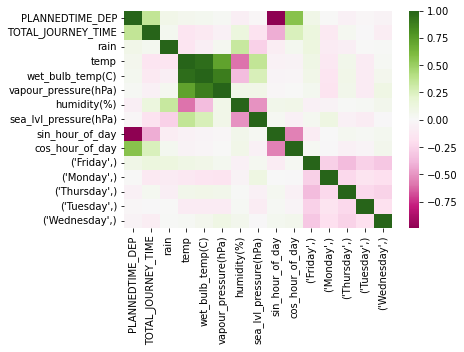

ROUTEID is  27B_34
PLANNEDTIME_DEP         -0.247010
TOTAL_JOURNEY_TIME       1.000000
rain                     0.010123
temp                     0.136945
wet_bulb_temp(C)         0.089023
vapour_pressure(hPa)     0.001197
humidity(%)             -0.213449
sea_lvl_pressure(hPa)   -0.002843
sin_hour_of_day         -0.087501
cos_hour_of_day         -0.383410
(Friday,)                0.298262
(Monday,)                0.074696
(Saturday,)             -0.305074
(Sunday,)               -0.313521
(Thursday,)              0.226085
(Tuesday,)               0.218499
(Wednesday,)             0.258046
Name: TOTAL_JOURNEY_TIME, dtype: float64


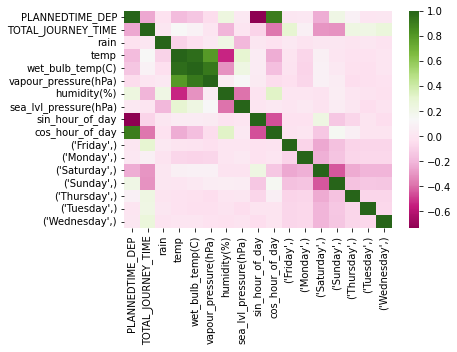

ROUTEID is  70_67
PLANNEDTIME_DEP         -0.415759
TOTAL_JOURNEY_TIME       1.000000
rain                     0.043422
temp                    -0.014659
wet_bulb_temp(C)        -0.025895
vapour_pressure(hPa)    -0.042420
humidity(%)             -0.024394
sea_lvl_pressure(hPa)   -0.042534
sin_hour_of_day          0.297138
cos_hour_of_day         -0.355043
(Friday,)                0.057706
(Monday,)                0.101486
(Saturday,)             -0.303937
(Sunday,)               -0.354040
(Thursday,)              0.183909
(Tuesday,)               0.175530
(Wednesday,)             0.209261
Name: TOTAL_JOURNEY_TIME, dtype: float64


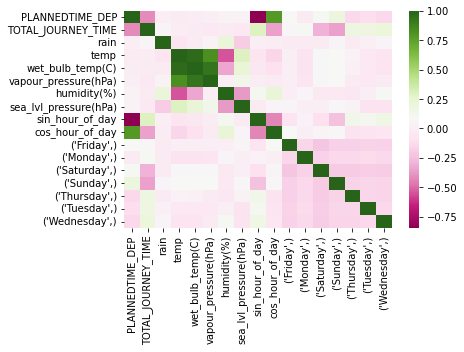

ROUTEID is  44B_61
PLANNEDTIME_DEP          0.264512
TOTAL_JOURNEY_TIME       1.000000
rain                     0.033171
temp                     0.138677
wet_bulb_temp(C)         0.112784
vapour_pressure(hPa)     0.049596
humidity(%)             -0.184940
sea_lvl_pressure(hPa)    0.088323
sin_hour_of_day         -0.294977
cos_hour_of_day          0.062880
(Friday,)                0.111833
(Monday,)               -0.115913
(Thursday,)              0.110526
(Tuesday,)              -0.111096
(Wednesday,)            -0.026541
Name: TOTAL_JOURNEY_TIME, dtype: float64


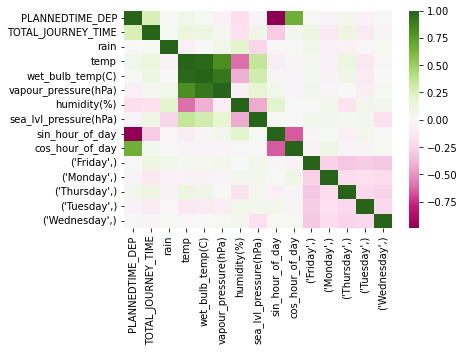

ROUTEID is  45A_64
PLANNEDTIME_DEP         -0.388364
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.062144
temp                     0.268311
wet_bulb_temp(C)         0.202789
vapour_pressure(hPa)     0.077936
humidity(%)             -0.355090
sea_lvl_pressure(hPa)    0.022699
sin_hour_of_day         -0.128238
cos_hour_of_day         -0.534213
(Friday,)                0.220931
(Monday,)               -0.006550
(Saturday,)             -0.221547
(Sunday,)               -0.110859
(Thursday,)              0.131820
(Tuesday,)               0.111064
(Wednesday,)             0.159843
Name: TOTAL_JOURNEY_TIME, dtype: float64


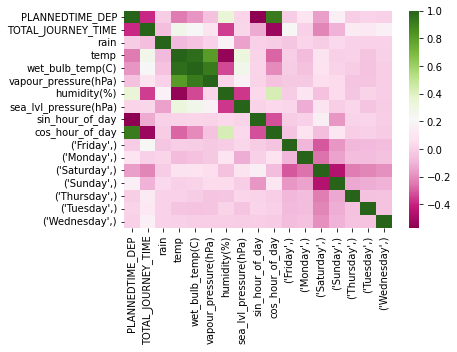

ROUTEID is  41C_83
PLANNEDTIME_DEP         -0.028433
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.058268
temp                    -0.046041
wet_bulb_temp(C)        -0.035839
vapour_pressure(hPa)    -0.023011
humidity(%)              0.018418
sea_lvl_pressure(hPa)    0.061569
sin_hour_of_day         -0.301178
cos_hour_of_day         -0.183019
(Friday,)                0.348841
(Monday,)                0.019559
(Saturday,)             -0.331640
(Sunday,)               -0.205278
(Thursday,)              0.216556
(Tuesday,)               0.048034
(Wednesday,)             0.101082
Name: TOTAL_JOURNEY_TIME, dtype: float64


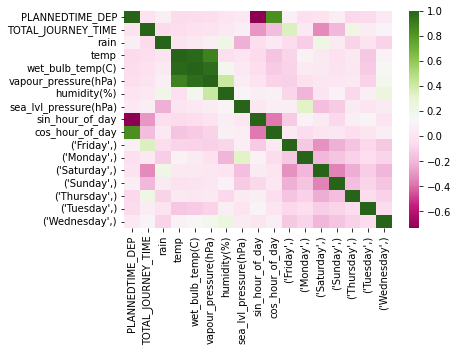

ROUTEID is  161_51
PLANNEDTIME_DEP          0.157168
TOTAL_JOURNEY_TIME       1.000000
rain                     0.073392
temp                     0.008302
wet_bulb_temp(C)         0.035522
vapour_pressure(hPa)     0.076006
humidity(%)              0.085779
sea_lvl_pressure(hPa)    0.018274
sin_hour_of_day         -0.217189
cos_hour_of_day          0.231189
(Friday,)               -0.002913
(Monday,)               -0.080695
(Thursday,)             -0.063265
(Tuesday,)               0.125764
(Wednesday,)             0.013343
Name: TOTAL_JOURNEY_TIME, dtype: float64


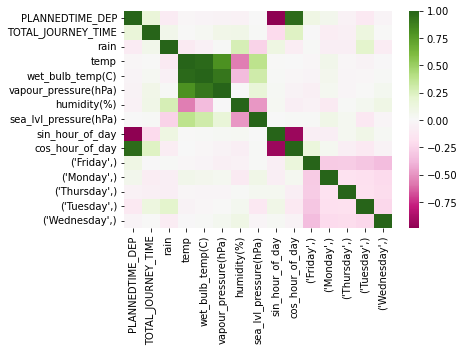

ROUTEID is  33X_46
PLANNEDTIME_DEP          0.211639
TOTAL_JOURNEY_TIME       1.000000
rain                     0.103397
temp                    -0.031588
wet_bulb_temp(C)         0.019268
vapour_pressure(hPa)     0.100067
humidity(%)              0.206580
sea_lvl_pressure(hPa)   -0.120787
sin_hour_of_day         -0.135070
cos_hour_of_day          0.367547
(Friday,)               -0.016047
(Monday,)               -0.123994
(Thursday,)             -0.102762
(Tuesday,)              -0.022812
(Wednesday,)             0.223440
Name: TOTAL_JOURNEY_TIME, dtype: float64


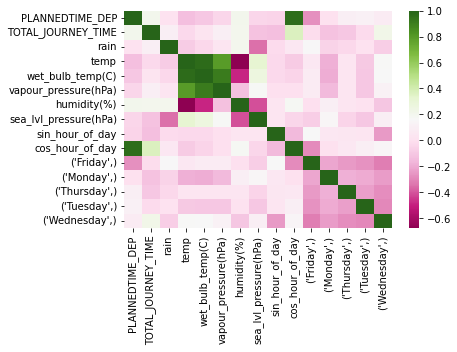

ROUTEID is  38_15
PLANNEDTIME_DEP         -0.449265
TOTAL_JOURNEY_TIME       1.000000
rain                     0.065000
temp                    -0.019122
wet_bulb_temp(C)        -0.008459
vapour_pressure(hPa)    -0.017001
humidity(%)              0.043949
sea_lvl_pressure(hPa)   -0.023913
sin_hour_of_day         -0.436231
cos_hour_of_day         -0.343721
(Friday,)               -0.041762
(Monday,)               -0.046210
(Thursday,)              0.104816
(Tuesday,)              -0.130234
(Wednesday,)             0.108732
Name: TOTAL_JOURNEY_TIME, dtype: float64


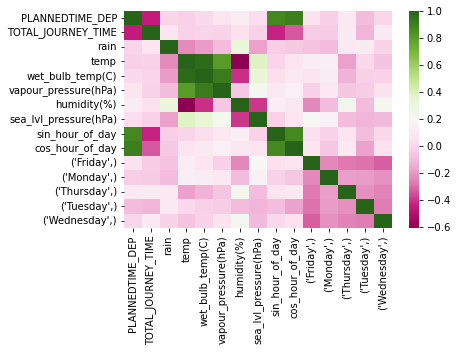

ROUTEID is  68_80
PLANNEDTIME_DEP          0.007398
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.043267
temp                     0.015621
wet_bulb_temp(C)         0.012107
vapour_pressure(hPa)     0.015211
humidity(%)             -0.014457
sea_lvl_pressure(hPa)   -0.019641
sin_hour_of_day         -0.434058
cos_hour_of_day         -0.009609
(Friday,)                0.059884
(Monday,)               -0.297024
(Saturday,)              0.130101
(Sunday,)                0.079050
(Thursday,)              0.089632
(Tuesday,)              -0.047982
(Wednesday,)             0.049805
Name: TOTAL_JOURNEY_TIME, dtype: float64


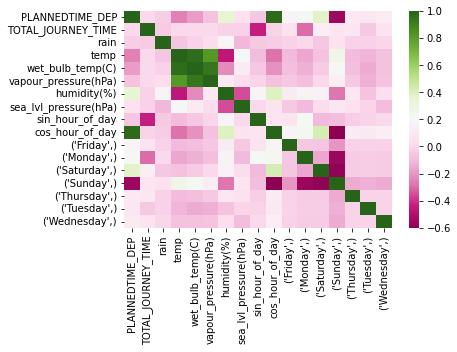

ROUTEID is  41B_52
PLANNEDTIME_DEP         -0.338069
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.001127
temp                     0.111739
wet_bulb_temp(C)         0.096968
vapour_pressure(hPa)     0.055904
humidity(%)             -0.122433
sea_lvl_pressure(hPa)   -0.015876
sin_hour_of_day         -0.271831
cos_hour_of_day         -0.345791
(Friday,)                0.277285
(Monday,)                0.050256
(Saturday,)             -0.295499
(Sunday,)               -0.220730
(Thursday,)              0.181509
(Tuesday,)               0.199093
(Wednesday,)             0.204159
Name: TOTAL_JOURNEY_TIME, dtype: float64


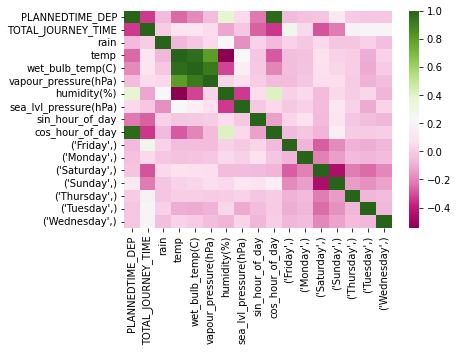

ROUTEID is  13_73
PLANNEDTIME_DEP          0.063382
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.063999
temp                     0.079905
wet_bulb_temp(C)         0.087548
vapour_pressure(hPa)     0.096678
humidity(%)              0.006055
sea_lvl_pressure(hPa)    0.110096
sin_hour_of_day          0.211993
cos_hour_of_day          0.238346
(Friday,)                0.094582
(Monday,)                0.041875
(Saturday,)             -0.164507
(Sunday,)               -0.046488
(Thursday,)              0.185734
(Tuesday,)               0.106955
(Wednesday,)             0.146951
Name: TOTAL_JOURNEY_TIME, dtype: float64


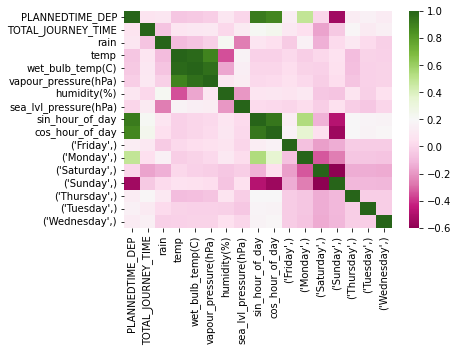

ROUTEID is  184_29
PLANNEDTIME_DEP         -0.038481
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.000610
temp                     0.142128
wet_bulb_temp(C)         0.097673
vapour_pressure(hPa)     0.016021
humidity(%)             -0.231309
sea_lvl_pressure(hPa)    0.018217
sin_hour_of_day         -0.291455
cos_hour_of_day         -0.214817
(Friday,)                0.143150
(Monday,)                0.007452
(Saturday,)             -0.229453
(Sunday,)               -0.144232
(Thursday,)              0.114718
(Tuesday,)               0.025915
(Wednesday,)             0.148512
Name: TOTAL_JOURNEY_TIME, dtype: float64


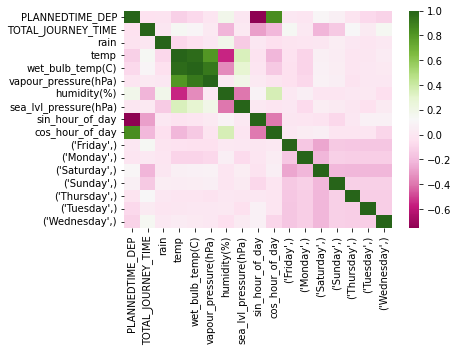

ROUTEID is  140_21
PLANNEDTIME_DEP         -0.012668
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.004968
temp                     0.044748
wet_bulb_temp(C)         0.030143
vapour_pressure(hPa)    -0.003577
humidity(%)             -0.072115
sea_lvl_pressure(hPa)   -0.027947
sin_hour_of_day         -0.206001
cos_hour_of_day         -0.092490
(Friday,)                0.205019
(Monday,)                0.115039
(Saturday,)             -0.329807
(Sunday,)               -0.286376
(Thursday,)              0.205623
(Tuesday,)               0.197132
(Wednesday,)             0.208587
Name: TOTAL_JOURNEY_TIME, dtype: float64


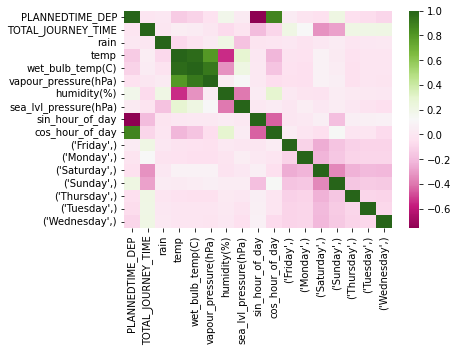

ROUTEID is  25B_274
PLANNEDTIME_DEP          0.123870
TOTAL_JOURNEY_TIME       1.000000
rain                     0.044164
temp                     0.013562
wet_bulb_temp(C)        -0.012396
vapour_pressure(hPa)    -0.058732
humidity(%)             -0.090710
sea_lvl_pressure(hPa)   -0.036220
sin_hour_of_day         -0.413600
cos_hour_of_day          0.010181
(Friday,)                0.254442
(Monday,)                0.036192
(Saturday,)             -0.304318
(Sunday,)               -0.359021
(Thursday,)              0.245223
(Tuesday,)               0.190078
(Wednesday,)             0.250798
Name: TOTAL_JOURNEY_TIME, dtype: float64


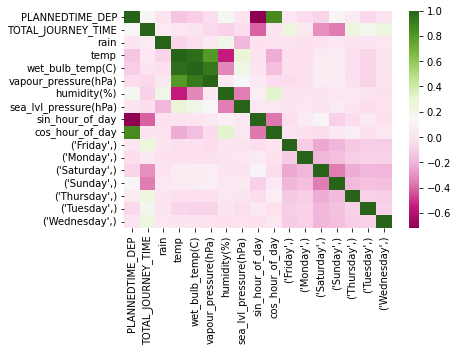

ROUTEID is  220_10
PLANNEDTIME_DEP          0.076684
TOTAL_JOURNEY_TIME       1.000000
rain                     0.010200
temp                    -0.014763
wet_bulb_temp(C)        -0.025746
vapour_pressure(hPa)    -0.048321
humidity(%)             -0.038086
sea_lvl_pressure(hPa)   -0.046276
sin_hour_of_day         -0.192394
cos_hour_of_day         -0.105610
(Friday,)                0.322880
(Monday,)                0.020607
(Saturday,)             -0.242946
(Sunday,)               -0.248455
(Thursday,)              0.198737
(Tuesday,)               0.102604
(Wednesday,)             0.153384
Name: TOTAL_JOURNEY_TIME, dtype: float64


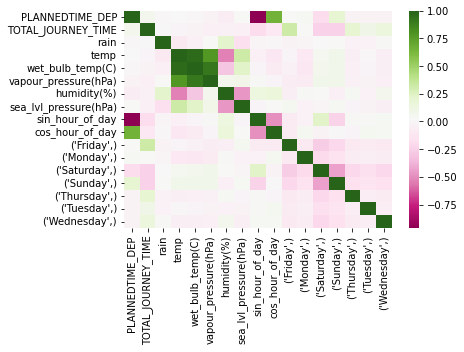

ROUTEID is  15_18
PLANNEDTIME_DEP         -0.694874
TOTAL_JOURNEY_TIME       1.000000
rain                     0.036438
temp                     0.188415
wet_bulb_temp(C)         0.166456
vapour_pressure(hPa)     0.127449
humidity(%)             -0.124614
sea_lvl_pressure(hPa)   -0.112884
sin_hour_of_day          0.731231
cos_hour_of_day         -0.694828
(Friday,)                0.082071
(Monday,)               -0.141092
(Saturday,)             -0.047538
(Sunday,)               -0.325778
(Thursday,)              0.147275
(Tuesday,)               0.229980
(Wednesday,)             0.387367
Name: TOTAL_JOURNEY_TIME, dtype: float64


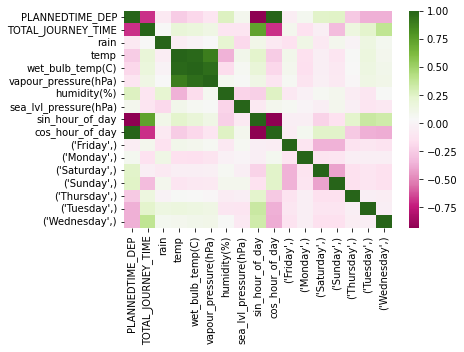

ROUTEID is  31_18
PLANNEDTIME_DEP         -0.248585
TOTAL_JOURNEY_TIME       1.000000
rain                     0.004121
temp                     0.207836
wet_bulb_temp(C)         0.149480
vapour_pressure(hPa)     0.045432
humidity(%)             -0.294779
sea_lvl_pressure(hPa)    0.080365
sin_hour_of_day         -0.109655
cos_hour_of_day         -0.404172
(Friday,)                0.154174
(Monday,)                0.052603
(Saturday,)             -0.231325
(Sunday,)               -0.158300
(Thursday,)              0.157262
(Tuesday,)               0.109704
(Wednesday,)             0.195674
Name: TOTAL_JOURNEY_TIME, dtype: float64


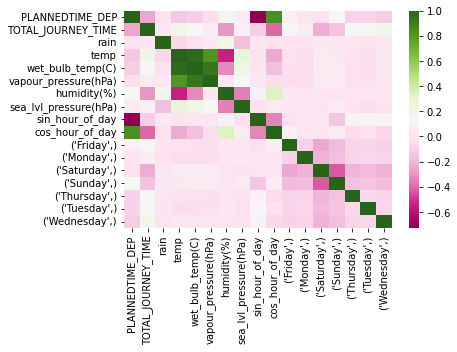

ROUTEID is  39A_43
PLANNEDTIME_DEP         -0.232298
TOTAL_JOURNEY_TIME       1.000000
rain                     0.017644
temp                     0.051272
wet_bulb_temp(C)         0.026382
vapour_pressure(hPa)    -0.025388
humidity(%)             -0.111616
sea_lvl_pressure(hPa)   -0.029823
sin_hour_of_day         -0.009910
cos_hour_of_day         -0.338158
(Friday,)                0.191521
(Monday,)                0.036186
(Saturday,)             -0.339751
(Sunday,)               -0.241479
(Thursday,)              0.203076
(Tuesday,)               0.164579
(Wednesday,)             0.205585
Name: TOTAL_JOURNEY_TIME, dtype: float64


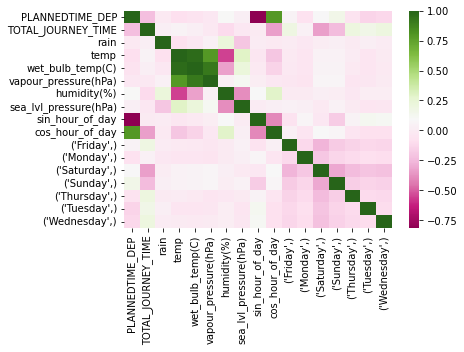

ROUTEID is  56A_30
PLANNEDTIME_DEP         -0.315487
TOTAL_JOURNEY_TIME       1.000000
rain                     0.035238
temp                     0.091075
wet_bulb_temp(C)         0.059072
vapour_pressure(hPa)    -0.000926
humidity(%)             -0.139992
sea_lvl_pressure(hPa)   -0.104498
sin_hour_of_day         -0.067708
cos_hour_of_day         -0.407968
(Friday,)                0.265724
(Monday,)               -0.102728
(Saturday,)             -0.235125
(Sunday,)               -0.296830
(Thursday,)              0.282491
(Tuesday,)               0.226157
(Wednesday,)             0.190838
Name: TOTAL_JOURNEY_TIME, dtype: float64


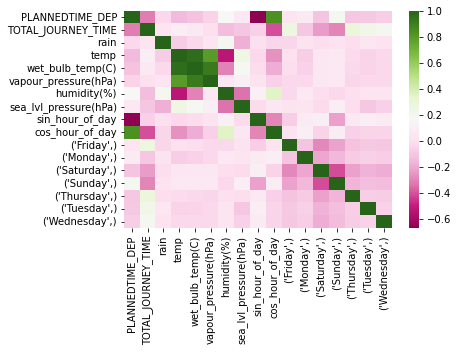

ROUTEID is  33B_56
PLANNEDTIME_DEP         -0.170941
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.028662
temp                     0.074176
wet_bulb_temp(C)         0.058334
vapour_pressure(hPa)     0.031017
humidity(%)             -0.079755
sea_lvl_pressure(hPa)    0.028182
sin_hour_of_day         -0.001829
cos_hour_of_day         -0.186249
(Friday,)                0.169815
(Monday,)                0.040612
(Saturday,)             -0.163499
(Sunday,)               -0.267373
(Thursday,)              0.165754
(Tuesday,)               0.149011
(Wednesday,)             0.186371
Name: TOTAL_JOURNEY_TIME, dtype: float64


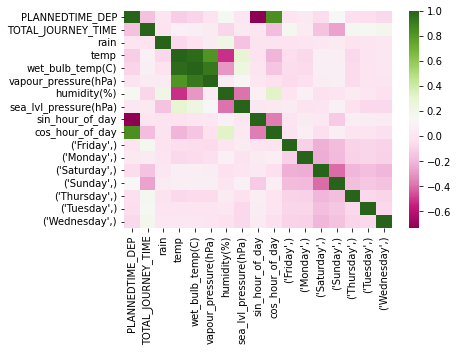

ROUTEID is  66B_57
PLANNEDTIME_DEP         -0.254703
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.044763
temp                     0.090982
wet_bulb_temp(C)         0.056485
vapour_pressure(hPa)    -0.021389
humidity(%)             -0.177589
sea_lvl_pressure(hPa)   -0.094991
sin_hour_of_day         -0.002561
cos_hour_of_day         -0.384134
(Friday,)                0.098410
(Monday,)                0.117168
(Saturday,)             -0.419266
(Thursday,)              0.112213
(Tuesday,)               0.150558
(Wednesday,)             0.189928
Name: TOTAL_JOURNEY_TIME, dtype: float64


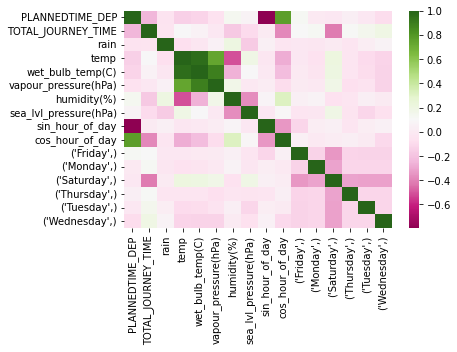

ROUTEID is  239_26
PLANNEDTIME_DEP         -0.209712
TOTAL_JOURNEY_TIME       1.000000
rain                     0.100171
temp                     0.067279
wet_bulb_temp(C)         0.048795
vapour_pressure(hPa)    -0.001682
humidity(%)             -0.106170
sea_lvl_pressure(hPa)   -0.057069
sin_hour_of_day         -0.147142
cos_hour_of_day         -0.312541
(Friday,)                0.198476
(Monday,)                0.118138
(Saturday,)             -0.360058
(Sunday,)               -0.231457
(Thursday,)              0.077694
(Tuesday,)               0.194995
(Wednesday,)             0.109142
Name: TOTAL_JOURNEY_TIME, dtype: float64


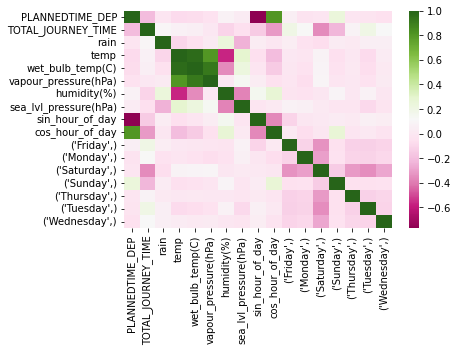

ROUTEID is  13_65
PLANNEDTIME_DEP         -0.286876
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.071975
temp                     0.100062
wet_bulb_temp(C)         0.093152
vapour_pressure(hPa)     0.069156
humidity(%)             -0.056230
sea_lvl_pressure(hPa)    0.001118
sin_hour_of_day         -0.149539
cos_hour_of_day         -0.144125
(Friday,)                0.282445
(Monday,)               -0.120120
(Saturday,)              0.058982
(Sunday,)               -0.375320
(Thursday,)              0.178229
(Tuesday,)               0.087677
(Wednesday,)             0.119327
Name: TOTAL_JOURNEY_TIME, dtype: float64


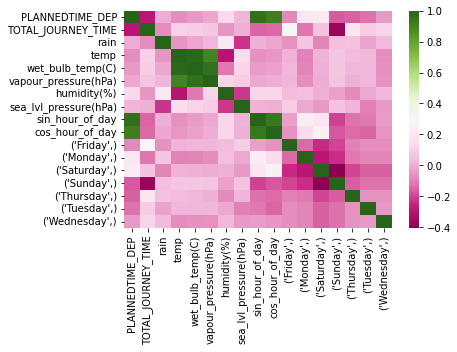

ROUTEID is  84X_57
PLANNEDTIME_DEP         -0.310760
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.017408
temp                    -0.013119
wet_bulb_temp(C)         0.002083
vapour_pressure(hPa)     0.012940
humidity(%)              0.053614
sea_lvl_pressure(hPa)    0.025782
sin_hour_of_day         -0.047610
cos_hour_of_day         -0.066405
(Friday,)               -0.096532
(Monday,)                0.023705
(Thursday,)              0.020458
(Tuesday,)               0.032045
(Wednesday,)             0.001939
Name: TOTAL_JOURNEY_TIME, dtype: float64


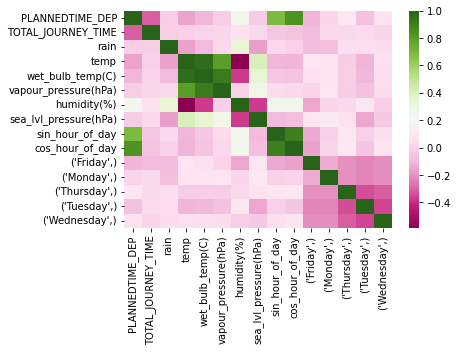

ROUTEID is  54A_11
PLANNEDTIME_DEP         -0.115576
TOTAL_JOURNEY_TIME       1.000000
rain                     0.058067
temp                    -0.024794
wet_bulb_temp(C)        -0.034407
vapour_pressure(hPa)    -0.050953
humidity(%)             -0.021058
sea_lvl_pressure(hPa)   -0.108746
sin_hour_of_day         -0.182612
cos_hour_of_day         -0.158205
(Friday,)                0.249131
(Monday,)                0.033228
(Saturday,)             -0.290635
(Sunday,)               -0.347015
(Thursday,)              0.232703
(Tuesday,)               0.199020
(Wednesday,)             0.210757
Name: TOTAL_JOURNEY_TIME, dtype: float64


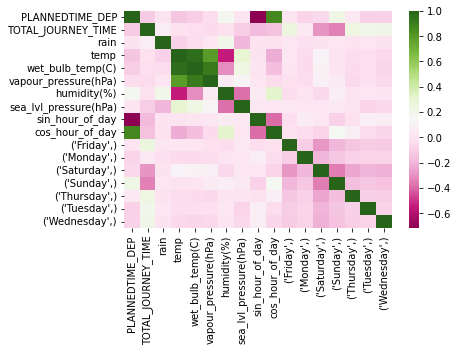

ROUTEID is  47_139
PLANNEDTIME_DEP         -0.114857
TOTAL_JOURNEY_TIME       1.000000
rain                     0.079270
temp                     0.024104
wet_bulb_temp(C)         0.008767
vapour_pressure(hPa)    -0.021491
humidity(%)             -0.062734
sea_lvl_pressure(hPa)   -0.070111
sin_hour_of_day         -0.302413
cos_hour_of_day         -0.164941
(Friday,)                0.212208
(Monday,)               -0.038096
(Saturday,)             -0.267426
(Sunday,)               -0.301469
(Thursday,)              0.303285
(Tuesday,)               0.269515
(Wednesday,)             0.244884
Name: TOTAL_JOURNEY_TIME, dtype: float64


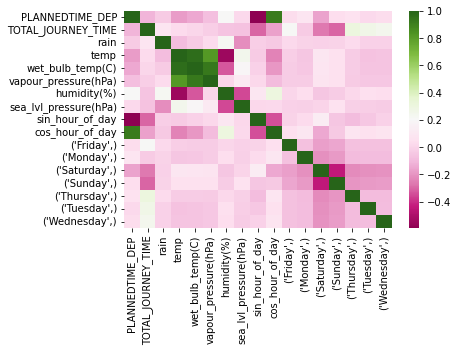

ROUTEID is  41C_84
PLANNEDTIME_DEP         -0.315707
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.051274
temp                    -0.038349
wet_bulb_temp(C)        -0.036537
vapour_pressure(hPa)    -0.038594
humidity(%)             -0.013480
sea_lvl_pressure(hPa)    0.006651
sin_hour_of_day         -0.033969
cos_hour_of_day         -0.413072
(Friday,)                0.231270
(Monday,)                0.123200
(Saturday,)             -0.275409
(Sunday,)               -0.229698
(Thursday,)              0.166836
(Tuesday,)               0.133227
(Wednesday,)             0.048560
Name: TOTAL_JOURNEY_TIME, dtype: float64


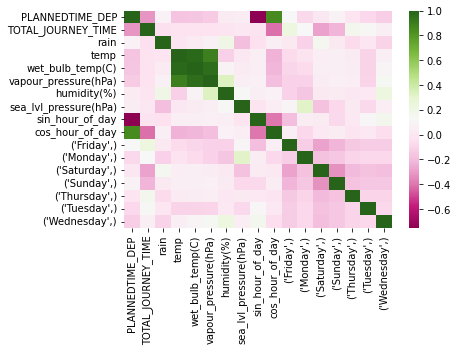

ROUTEID is  185_53
PLANNEDTIME_DEP          0.088449
TOTAL_JOURNEY_TIME       1.000000
rain                     0.005142
temp                     0.084222
wet_bulb_temp(C)         0.090495
vapour_pressure(hPa)     0.080321
humidity(%)             -0.027101
sea_lvl_pressure(hPa)   -0.050518
sin_hour_of_day         -0.125482
cos_hour_of_day          0.130373
(Friday,)                0.112452
(Monday,)               -0.014338
(Saturday,)             -0.257176
(Sunday,)               -0.043364
(Thursday,)              0.095556
(Tuesday,)               0.122129
(Wednesday,)             0.090393
Name: TOTAL_JOURNEY_TIME, dtype: float64


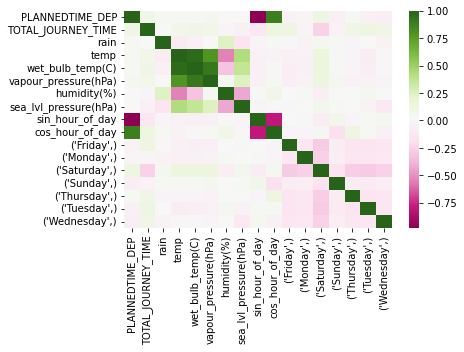

ROUTEID is  9_5
PLANNEDTIME_DEP         -0.140516
TOTAL_JOURNEY_TIME       1.000000
rain                     0.011743
temp                     0.022011
wet_bulb_temp(C)         0.005635
vapour_pressure(hPa)    -0.027972
humidity(%)             -0.061575
sea_lvl_pressure(hPa)   -0.063894
sin_hour_of_day         -0.116745
cos_hour_of_day         -0.218988
(Friday,)                0.264717
(Monday,)               -0.004045
(Saturday,)             -0.283869
(Sunday,)               -0.325258
(Thursday,)              0.217969
(Tuesday,)               0.222732
(Wednesday,)             0.229716
Name: TOTAL_JOURNEY_TIME, dtype: float64


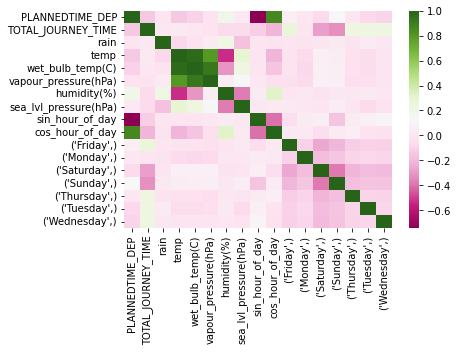

ROUTEID is  4_12
PLANNEDTIME_DEP         -0.250382
TOTAL_JOURNEY_TIME       1.000000
rain                     0.016215
temp                     0.075891
wet_bulb_temp(C)         0.039867
vapour_pressure(hPa)    -0.025153
humidity(%)             -0.159909
sea_lvl_pressure(hPa)   -0.037264
sin_hour_of_day         -0.229953
cos_hour_of_day         -0.321494
(Friday,)                0.241022
(Monday,)                0.004278
(Saturday,)             -0.343619
(Sunday,)               -0.309783
(Thursday,)              0.217465
(Tuesday,)               0.157287
(Wednesday,)             0.183572
Name: TOTAL_JOURNEY_TIME, dtype: float64


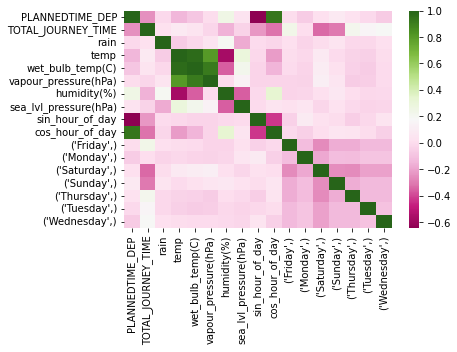

ROUTEID is  27B_36
PLANNEDTIME_DEP         -0.231266
TOTAL_JOURNEY_TIME       1.000000
rain                     0.235685
temp                    -0.111890
wet_bulb_temp(C)        -0.051251
vapour_pressure(hPa)     0.012128
humidity(%)              0.296878
sea_lvl_pressure(hPa)   -0.085252
sin_hour_of_day         -0.010190
cos_hour_of_day         -0.010190
(Friday,)               -0.106811
(Monday,)               -0.122516
(Thursday,)             -0.177754
(Tuesday,)               0.213125
(Wednesday,)             0.109949
Name: TOTAL_JOURNEY_TIME, dtype: float64


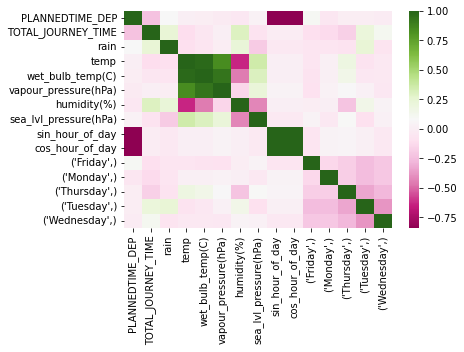

ROUTEID is  1_40
PLANNEDTIME_DEP         -0.100488
TOTAL_JOURNEY_TIME       1.000000
rain                     0.022702
temp                     0.039966
wet_bulb_temp(C)         0.029891
vapour_pressure(hPa)    -0.000807
humidity(%)             -0.051003
sea_lvl_pressure(hPa)   -0.059163
sin_hour_of_day         -0.137627
cos_hour_of_day         -0.127930
(Friday,)                0.253469
(Monday,)               -0.008344
(Saturday,)             -0.240000
(Sunday,)               -0.290555
(Thursday,)              0.228355
(Tuesday,)               0.117501
(Wednesday,)             0.223465
Name: TOTAL_JOURNEY_TIME, dtype: float64


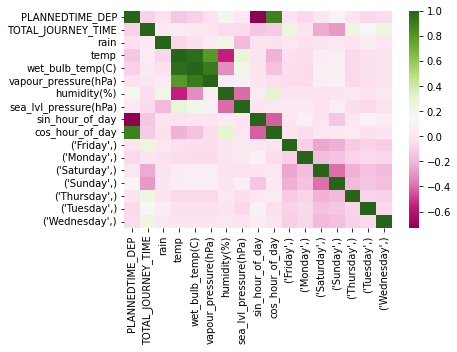

ROUTEID is  69_44
PLANNEDTIME_DEP         -0.167348
TOTAL_JOURNEY_TIME       1.000000
rain                     0.019363
temp                     0.012859
wet_bulb_temp(C)        -0.036395
vapour_pressure(hPa)    -0.089929
humidity(%)             -0.188648
sea_lvl_pressure(hPa)   -0.038464
sin_hour_of_day         -0.142927
cos_hour_of_day         -0.413940
(Friday,)                0.135659
(Monday,)                0.003479
(Saturday,)             -0.162083
(Sunday,)               -0.075953
(Thursday,)              0.160808
(Tuesday,)               0.176898
(Wednesday,)             0.180283
Name: TOTAL_JOURNEY_TIME, dtype: float64


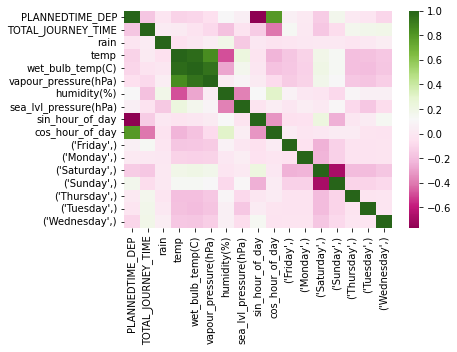

ROUTEID is  26_26
PLANNEDTIME_DEP         -0.313089
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.017698
temp                     0.009776
wet_bulb_temp(C)        -0.019874
vapour_pressure(hPa)    -0.063075
humidity(%)             -0.103455
sea_lvl_pressure(hPa)   -0.005839
sin_hour_of_day          0.119087
cos_hour_of_day         -0.351299
(Friday,)                0.149171
(Monday,)                0.000125
(Saturday,)             -0.378913
(Sunday,)               -0.151330
(Thursday,)              0.147961
(Tuesday,)               0.167522
(Wednesday,)             0.191327
Name: TOTAL_JOURNEY_TIME, dtype: float64


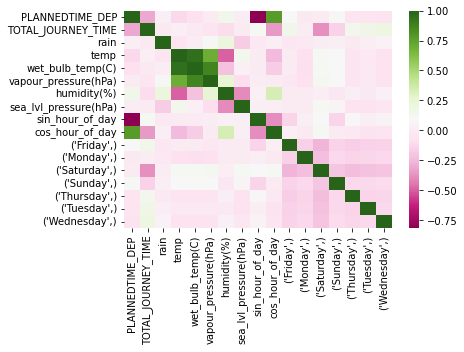

ROUTEID is  59_11
PLANNEDTIME_DEP         -0.320898
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.021610
temp                     0.193897
wet_bulb_temp(C)         0.153361
vapour_pressure(hPa)     0.076775
humidity(%)             -0.227182
sea_lvl_pressure(hPa)   -0.003360
sin_hour_of_day          0.078319
cos_hour_of_day         -0.398656
(Friday,)                0.223323
(Monday,)                0.094859
(Saturday,)             -0.219165
(Sunday,)               -0.263244
(Thursday,)              0.133624
(Tuesday,)               0.124780
(Wednesday,)             0.215738
Name: TOTAL_JOURNEY_TIME, dtype: float64


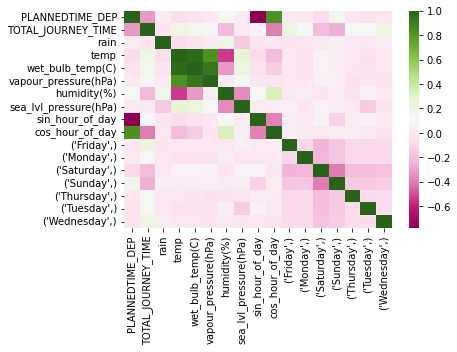

ROUTEID is  120_7
PLANNEDTIME_DEP          0.002421
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.005352
temp                     0.085854
wet_bulb_temp(C)         0.061325
vapour_pressure(hPa)     0.015543
humidity(%)             -0.128744
sea_lvl_pressure(hPa)   -0.021586
sin_hour_of_day         -0.200268
cos_hour_of_day         -0.127867
(Friday,)                0.211396
(Monday,)                0.096385
(Saturday,)             -0.382583
(Sunday,)               -0.250123
(Thursday,)              0.235251
(Tuesday,)               0.219191
(Wednesday,)             0.215842
Name: TOTAL_JOURNEY_TIME, dtype: float64


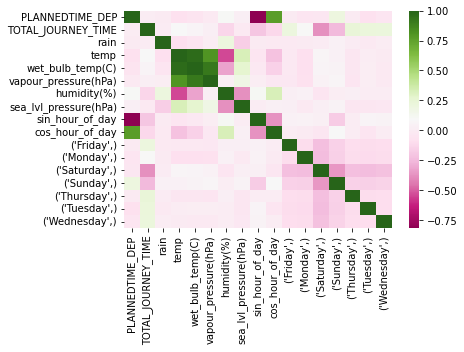

ROUTEID is  151_17
PLANNEDTIME_DEP          0.017480
TOTAL_JOURNEY_TIME       1.000000
rain                     0.030987
temp                    -0.043841
wet_bulb_temp(C)        -0.056716
vapour_pressure(hPa)    -0.078483
humidity(%)             -0.017661
sea_lvl_pressure(hPa)   -0.048942
sin_hour_of_day         -0.073177
cos_hour_of_day         -0.048936
(Friday,)                0.266622
(Monday,)                0.037163
(Saturday,)             -0.416551
(Sunday,)               -0.336579
(Thursday,)              0.321223
(Tuesday,)               0.263221
(Wednesday,)             0.275052
Name: TOTAL_JOURNEY_TIME, dtype: float64


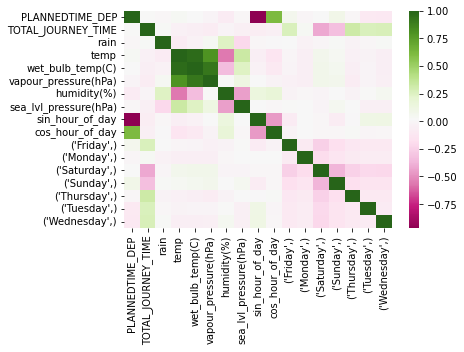

ROUTEID is  70_60
PLANNEDTIME_DEP          0.032052
TOTAL_JOURNEY_TIME       1.000000
rain                     0.059461
temp                    -0.030184
wet_bulb_temp(C)        -0.045072
vapour_pressure(hPa)    -0.075255
humidity(%)             -0.033560
sea_lvl_pressure(hPa)   -0.021212
sin_hour_of_day         -0.389982
cos_hour_of_day         -0.031160
(Friday,)                0.145852
(Monday,)                0.014722
(Saturday,)             -0.391409
(Sunday,)               -0.416423
(Thursday,)              0.270497
(Tuesday,)               0.197839
(Wednesday,)             0.283685
Name: TOTAL_JOURNEY_TIME, dtype: float64


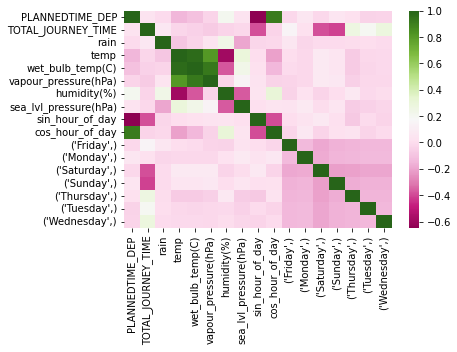

ROUTEID is  27B_35
PLANNEDTIME_DEP         -0.479011
TOTAL_JOURNEY_TIME       1.000000
rain                     0.097192
temp                    -0.005438
wet_bulb_temp(C)        -0.011394
vapour_pressure(hPa)    -0.016264
humidity(%)             -0.022154
sea_lvl_pressure(hPa)   -0.065048
sin_hour_of_day          0.467329
cos_hour_of_day         -0.411466
(Friday,)                0.105700
(Monday,)                0.093863
(Saturday,)             -0.558734
(Sunday,)               -0.218867
(Thursday,)              0.176596
(Tuesday,)               0.335623
(Wednesday,)             0.339364
Name: TOTAL_JOURNEY_TIME, dtype: float64


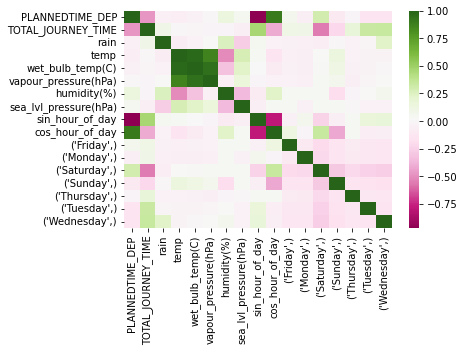

ROUTEID is  25A_270
PLANNEDTIME_DEP         -0.389218
TOTAL_JOURNEY_TIME       1.000000
rain                     0.048716
temp                     0.052095
wet_bulb_temp(C)         0.019864
vapour_pressure(hPa)    -0.035101
humidity(%)             -0.128833
sea_lvl_pressure(hPa)   -0.034480
sin_hour_of_day          0.139596
cos_hour_of_day         -0.434737
(Friday,)                0.206799
(Monday,)                0.017271
(Saturday,)             -0.256548
(Sunday,)               -0.341418
(Thursday,)              0.198758
(Tuesday,)               0.230777
(Wednesday,)             0.238007
Name: TOTAL_JOURNEY_TIME, dtype: float64


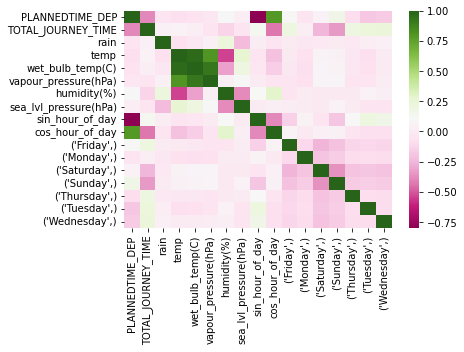

ROUTEID is  32_57
PLANNEDTIME_DEP         -0.064183
TOTAL_JOURNEY_TIME       1.000000
rain                     0.019764
temp                     0.156410
wet_bulb_temp(C)         0.108126
vapour_pressure(hPa)     0.024462
humidity(%)             -0.221885
sea_lvl_pressure(hPa)    0.032019
sin_hour_of_day         -0.387680
cos_hour_of_day         -0.261405
(Friday,)                0.163044
(Monday,)                0.034900
(Saturday,)             -0.291977
(Sunday,)               -0.224736
(Thursday,)              0.148888
(Tuesday,)               0.188398
(Wednesday,)             0.220599
Name: TOTAL_JOURNEY_TIME, dtype: float64


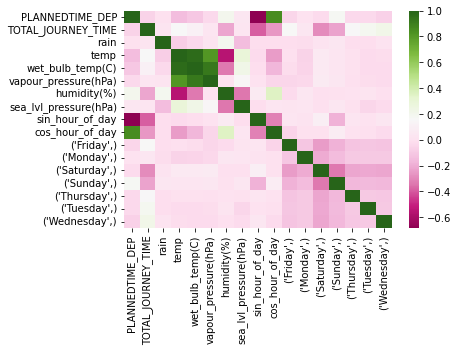

ROUTEID is  41B_53
PLANNEDTIME_DEP         -0.160980
TOTAL_JOURNEY_TIME       1.000000
rain                     0.081368
temp                     0.057965
wet_bulb_temp(C)         0.049719
vapour_pressure(hPa)     0.043994
humidity(%)             -0.049212
sea_lvl_pressure(hPa)   -0.050670
sin_hour_of_day          0.065565
cos_hour_of_day         -0.256946
(Friday,)                0.201828
(Monday,)                0.151415
(Saturday,)             -0.399914
(Sunday,)               -0.143206
(Thursday,)              0.158841
(Tuesday,)               0.114845
(Wednesday,)             0.242993
Name: TOTAL_JOURNEY_TIME, dtype: float64


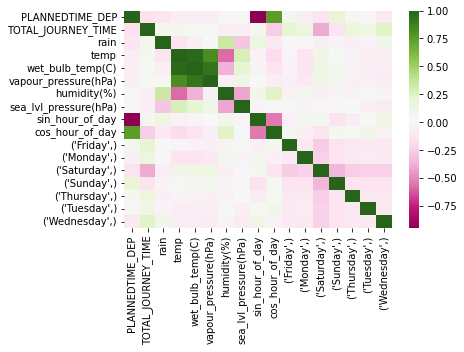

ROUTEID is  53_23
PLANNEDTIME_DEP          0.164648
TOTAL_JOURNEY_TIME       1.000000
rain                     0.329681
temp                    -0.072846
wet_bulb_temp(C)        -0.082630
vapour_pressure(hPa)    -0.092263
humidity(%)             -0.060477
sea_lvl_pressure(hPa)    0.188484
sin_hour_of_day         -0.187053
cos_hour_of_day         -0.010470
(Friday,)                0.069634
(Monday,)                0.066038
(Saturday,)             -0.107972
(Sunday,)                0.058401
(Thursday,)              0.003511
(Wednesday,)             0.030970
Name: TOTAL_JOURNEY_TIME, dtype: float64


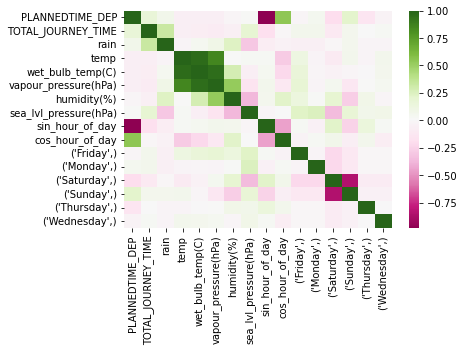

ROUTEID is  44_36
PLANNEDTIME_DEP         -0.238270
TOTAL_JOURNEY_TIME       1.000000
rain                     0.070301
temp                     0.043719
wet_bulb_temp(C)         0.018419
vapour_pressure(hPa)    -0.029316
humidity(%)             -0.102765
sea_lvl_pressure(hPa)   -0.097195
sin_hour_of_day         -0.118572
cos_hour_of_day         -0.305042
(Friday,)                0.214516
(Monday,)               -0.007690
(Saturday,)             -0.202079
(Sunday,)               -0.331902
(Thursday,)              0.259059
(Tuesday,)               0.178043
(Wednesday,)             0.219382
Name: TOTAL_JOURNEY_TIME, dtype: float64


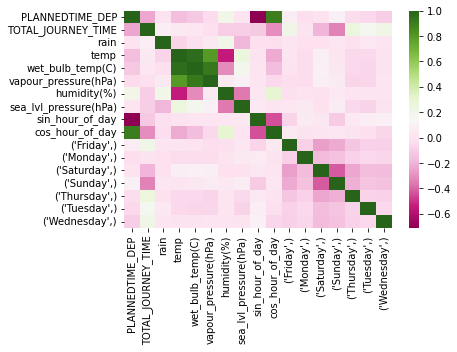

ROUTEID is  61_106
PLANNEDTIME_DEP         -0.172872
TOTAL_JOURNEY_TIME       1.000000
rain                     0.082886
temp                     0.020056
wet_bulb_temp(C)         0.004728
vapour_pressure(hPa)    -0.029899
humidity(%)             -0.070012
sea_lvl_pressure(hPa)   -0.064129
sin_hour_of_day         -0.185347
cos_hour_of_day         -0.227420
(Friday,)                0.228695
(Monday,)               -0.036024
(Saturday,)             -0.254966
(Sunday,)               -0.284972
(Thursday,)              0.250866
(Tuesday,)               0.175527
(Wednesday,)             0.238763
Name: TOTAL_JOURNEY_TIME, dtype: float64


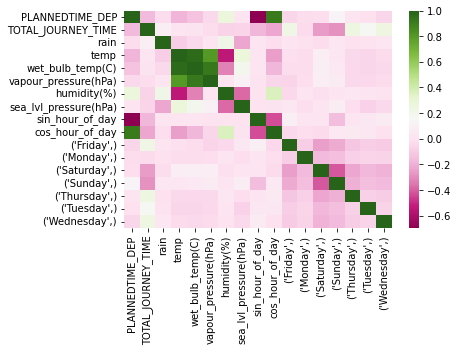

ROUTEID is  41C_78
PLANNEDTIME_DEP         -0.058984
TOTAL_JOURNEY_TIME       1.000000
rain                     0.034108
temp                     0.139802
wet_bulb_temp(C)         0.117902
vapour_pressure(hPa)     0.069562
humidity(%)             -0.139300
sea_lvl_pressure(hPa)   -0.007780
sin_hour_of_day         -0.294309
cos_hour_of_day         -0.190809
(Friday,)                0.302698
(Monday,)               -0.000896
(Saturday,)             -0.300173
(Sunday,)               -0.273585
(Thursday,)              0.207926
(Tuesday,)               0.131626
(Wednesday,)             0.219755
Name: TOTAL_JOURNEY_TIME, dtype: float64


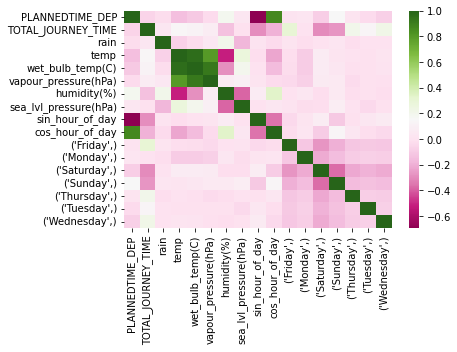

ROUTEID is  65B_66
PLANNEDTIME_DEP         -0.267566
TOTAL_JOURNEY_TIME       1.000000
rain                     0.000394
temp                     0.007624
wet_bulb_temp(C)        -0.004367
vapour_pressure(hPa)    -0.023859
humidity(%)             -0.044900
sea_lvl_pressure(hPa)   -0.029039
sin_hour_of_day         -0.050968
cos_hour_of_day         -0.248336
(Friday,)                0.139120
(Monday,)                0.011063
(Saturday,)             -0.198611
(Sunday,)               -0.205825
(Thursday,)              0.166934
(Tuesday,)               0.184333
(Wednesday,)             0.196918
Name: TOTAL_JOURNEY_TIME, dtype: float64


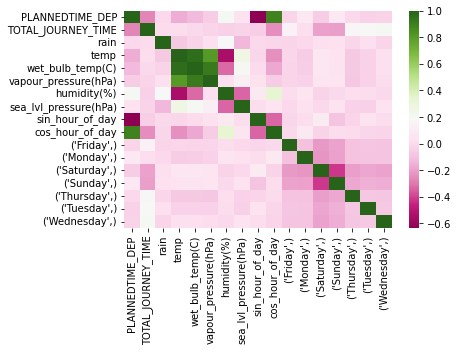

ROUTEID is  49_27
PLANNEDTIME_DEP          0.103936
TOTAL_JOURNEY_TIME       1.000000
rain                     0.022207
temp                     0.030238
wet_bulb_temp(C)         0.010373
vapour_pressure(hPa)    -0.028142
humidity(%)             -0.087705
sea_lvl_pressure(hPa)   -0.056417
sin_hour_of_day         -0.398182
cos_hour_of_day         -0.085245
(Friday,)                0.247340
(Monday,)               -0.065242
(Saturday,)             -0.317976
(Sunday,)               -0.237490
(Thursday,)              0.233136
(Tuesday,)               0.117872
(Wednesday,)             0.210695
Name: TOTAL_JOURNEY_TIME, dtype: float64


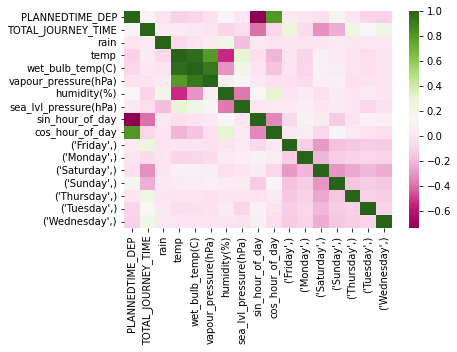

ROUTEID is  38_14
PLANNEDTIME_DEP         -0.399082
TOTAL_JOURNEY_TIME       1.000000
rain                     0.037076
temp                     0.089787
wet_bulb_temp(C)         0.064103
vapour_pressure(hPa)     0.008423
humidity(%)             -0.130389
sea_lvl_pressure(hPa)   -0.041943
sin_hour_of_day          0.171004
cos_hour_of_day         -0.436519
(Friday,)                0.153521
(Monday,)                0.085317
(Saturday,)             -0.315607
(Sunday,)               -0.283546
(Thursday,)              0.173610
(Tuesday,)               0.241943
(Wednesday,)             0.232159
Name: TOTAL_JOURNEY_TIME, dtype: float64


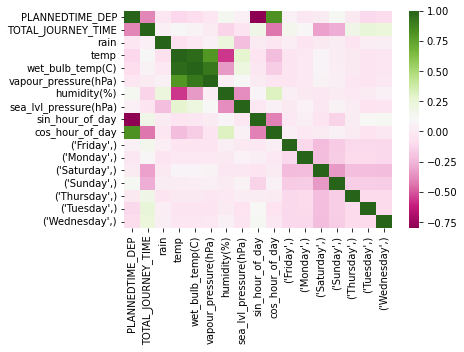

ROUTEID is  18_4
PLANNEDTIME_DEP         -0.021703
TOTAL_JOURNEY_TIME       1.000000
rain                     0.038993
temp                     0.016813
wet_bulb_temp(C)        -0.017451
vapour_pressure(hPa)    -0.077091
humidity(%)             -0.124139
sea_lvl_pressure(hPa)   -0.023763
sin_hour_of_day         -0.308591
cos_hour_of_day         -0.202117
(Friday,)                0.316391
(Monday,)               -0.001212
(Saturday,)             -0.349066
(Sunday,)               -0.350532
(Thursday,)              0.288096
(Tuesday,)               0.171709
(Wednesday,)             0.232441
Name: TOTAL_JOURNEY_TIME, dtype: float64


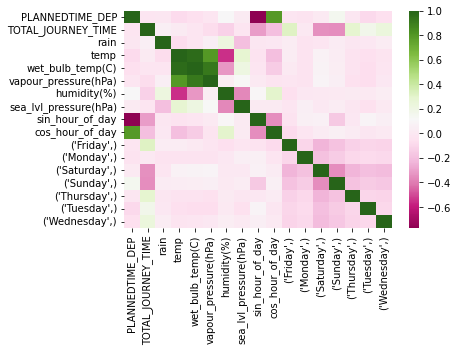

ROUTEID is  39A_42
PLANNEDTIME_DEP         -0.260105
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.023407
temp                     0.125257
wet_bulb_temp(C)         0.097000
vapour_pressure(hPa)     0.050771
humidity(%)             -0.163697
sea_lvl_pressure(hPa)    0.116981
sin_hour_of_day          0.125751
cos_hour_of_day          0.125751
(Friday,)                0.168114
(Monday,)               -0.056760
(Saturday,)             -0.005800
(Sunday,)               -0.141075
(Thursday,)              0.145501
(Tuesday,)              -0.133183
(Wednesday,)             0.101751
Name: TOTAL_JOURNEY_TIME, dtype: float64


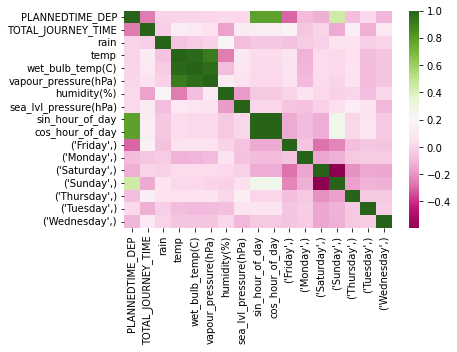

ROUTEID is  61_108
PLANNEDTIME_DEP         -0.401338
TOTAL_JOURNEY_TIME       1.000000
rain                     0.011092
temp                     0.107254
wet_bulb_temp(C)         0.066747
vapour_pressure(hPa)    -0.014525
humidity(%)             -0.187947
sea_lvl_pressure(hPa)   -0.060403
sin_hour_of_day          0.069861
cos_hour_of_day         -0.489400
(Friday,)                0.195988
(Monday,)               -0.063374
(Saturday,)             -0.176128
(Sunday,)               -0.281643
(Thursday,)              0.196788
(Tuesday,)               0.185607
(Wednesday,)             0.220639
Name: TOTAL_JOURNEY_TIME, dtype: float64


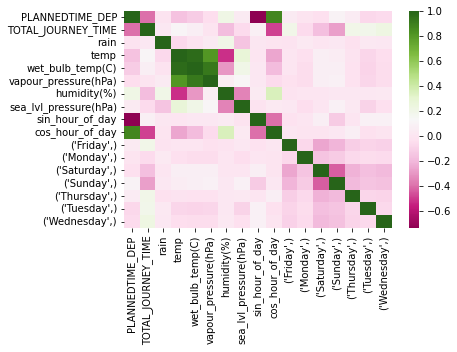

ROUTEID is  102_10
PLANNEDTIME_DEP          0.050280
TOTAL_JOURNEY_TIME       1.000000
rain                     0.166763
temp                    -0.076627
wet_bulb_temp(C)        -0.055729
vapour_pressure(hPa)    -0.009540
humidity(%)              0.112681
sea_lvl_pressure(hPa)   -0.025983
sin_hour_of_day         -0.272035
cos_hour_of_day         -0.202607
(Friday,)                0.182119
(Monday,)                0.059852
(Saturday,)             -0.629857
(Thursday,)              0.271447
(Tuesday,)               0.313866
(Wednesday,)             0.154496
Name: TOTAL_JOURNEY_TIME, dtype: float64


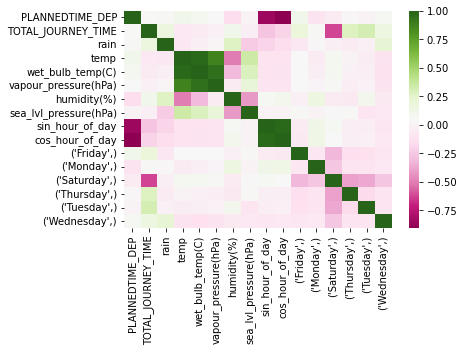

ROUTEID is  68_85
PLANNEDTIME_DEP         -0.335494
TOTAL_JOURNEY_TIME       1.000000
rain                     0.045880
temp                     0.152930
wet_bulb_temp(C)         0.137084
vapour_pressure(hPa)     0.107921
humidity(%)             -0.129069
sea_lvl_pressure(hPa)   -0.026986
sin_hour_of_day         -0.019125
cos_hour_of_day         -0.330218
(Friday,)                0.003314
(Monday,)               -0.048723
(Saturday,)             -0.062136
(Sunday,)                0.054055
(Thursday,)              0.040004
(Tuesday,)               0.025085
(Wednesday,)            -0.029514
Name: TOTAL_JOURNEY_TIME, dtype: float64


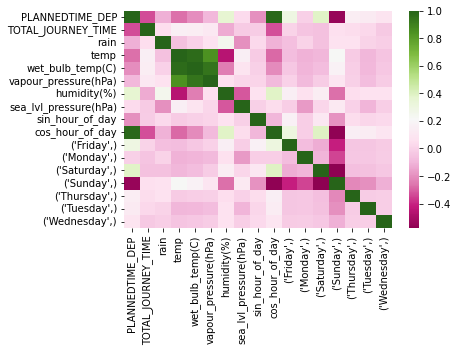

ROUTEID is  63_28
PLANNEDTIME_DEP         -0.459795
TOTAL_JOURNEY_TIME       1.000000
rain                     0.035566
temp                     0.081991
wet_bulb_temp(C)         0.069560
vapour_pressure(hPa)     0.053605
humidity(%)             -0.080947
sea_lvl_pressure(hPa)   -0.011997
sin_hour_of_day          0.337564
cos_hour_of_day         -0.392025
(Friday,)                0.116629
(Monday,)                0.117570
(Saturday,)             -0.254915
(Sunday,)               -0.155848
(Thursday,)              0.230739
(Tuesday,)               0.177198
(Wednesday,)             0.214610
Name: TOTAL_JOURNEY_TIME, dtype: float64


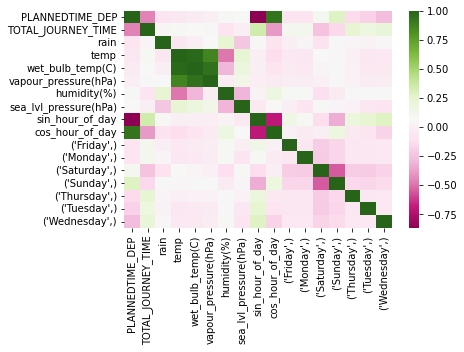

ROUTEID is  11_42
PLANNEDTIME_DEP         -0.133347
TOTAL_JOURNEY_TIME       1.000000
rain                     0.063644
temp                     0.008103
wet_bulb_temp(C)        -0.005798
vapour_pressure(hPa)    -0.039561
humidity(%)             -0.056723
sea_lvl_pressure(hPa)   -0.071395
sin_hour_of_day         -0.135509
cos_hour_of_day         -0.224749
(Friday,)                0.194252
(Monday,)                0.049631
(Saturday,)             -0.344527
(Sunday,)               -0.320635
(Thursday,)              0.261201
(Tuesday,)               0.262377
(Wednesday,)             0.258422
Name: TOTAL_JOURNEY_TIME, dtype: float64


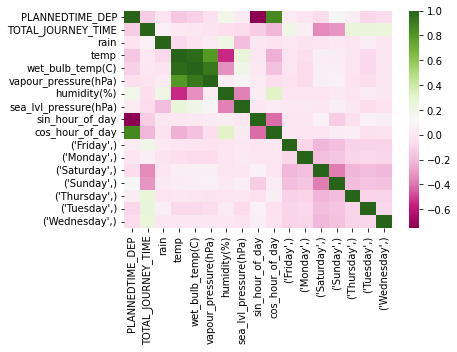

ROUTEID is  29A_14
PLANNEDTIME_DEP         -0.063717
TOTAL_JOURNEY_TIME       1.000000
rain                     0.007403
temp                     0.096765
wet_bulb_temp(C)         0.062833
vapour_pressure(hPa)    -0.003132
humidity(%)             -0.158506
sea_lvl_pressure(hPa)    0.022891
sin_hour_of_day         -0.277715
cos_hour_of_day         -0.217766
(Friday,)                0.201663
(Monday,)                0.072860
(Saturday,)             -0.263376
(Sunday,)               -0.314677
(Thursday,)              0.171181
(Tuesday,)               0.188516
(Wednesday,)             0.243023
Name: TOTAL_JOURNEY_TIME, dtype: float64


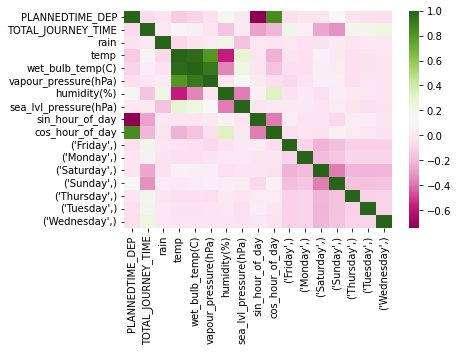

ROUTEID is  17A_12
PLANNEDTIME_DEP         -0.564302
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.060352
temp                     0.060242
wet_bulb_temp(C)         0.049730
vapour_pressure(hPa)     0.047957
humidity(%)             -0.062956
sea_lvl_pressure(hPa)    0.028226
sin_hour_of_day         -0.441984
cos_hour_of_day         -0.380847
(Monday,)               -0.177287
(Saturday,)              0.101435
(Sunday,)                0.011870
(Tuesday,)              -0.011972
Name: TOTAL_JOURNEY_TIME, dtype: float64


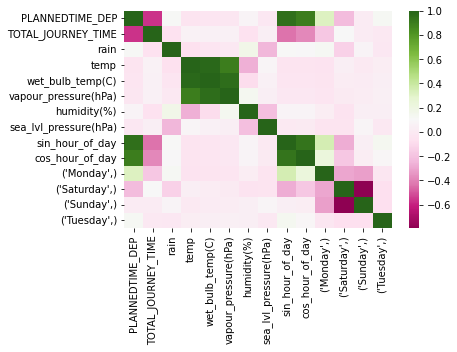

ROUTEID is  15B_60
PLANNEDTIME_DEP         -0.087794
TOTAL_JOURNEY_TIME       1.000000
rain                     0.013308
temp                     0.015271
wet_bulb_temp(C)         0.001700
vapour_pressure(hPa)    -0.027024
humidity(%)             -0.056085
sea_lvl_pressure(hPa)   -0.042518
sin_hour_of_day         -0.148679
cos_hour_of_day         -0.147344
(Friday,)                0.219278
(Monday,)                0.095340
(Saturday,)             -0.344463
(Sunday,)               -0.359201
(Thursday,)              0.261466
(Tuesday,)               0.260992
(Wednesday,)             0.233139
Name: TOTAL_JOURNEY_TIME, dtype: float64


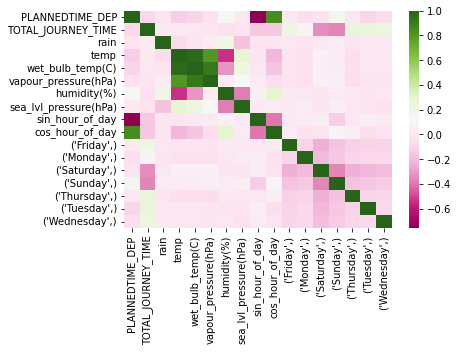

ROUTEID is  79_10
PLANNEDTIME_DEP         -0.026165
TOTAL_JOURNEY_TIME       1.000000
rain                     0.001968
temp                     0.053366
wet_bulb_temp(C)         0.025106
vapour_pressure(hPa)    -0.024901
humidity(%)             -0.119839
sea_lvl_pressure(hPa)    0.016163
sin_hour_of_day         -0.201627
cos_hour_of_day         -0.146068
(Friday,)                0.307937
(Monday,)                0.015444
(Saturday,)             -0.302184
(Sunday,)               -0.236942
(Thursday,)              0.283097
(Tuesday,)               0.140095
(Wednesday,)             0.175625
Name: TOTAL_JOURNEY_TIME, dtype: float64


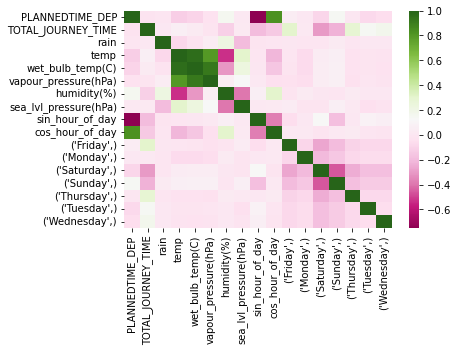

ROUTEID is  15A_84
PLANNEDTIME_DEP         -0.291743
TOTAL_JOURNEY_TIME       1.000000
rain                     0.001383
temp                     0.011666
wet_bulb_temp(C)        -0.018016
vapour_pressure(hPa)    -0.067596
humidity(%)             -0.106644
sea_lvl_pressure(hPa)   -0.051412
sin_hour_of_day          0.079645
cos_hour_of_day         -0.332702
(Friday,)                0.184508
(Monday,)                0.044556
(Saturday,)             -0.288034
(Sunday,)               -0.346720
(Thursday,)              0.279231
(Tuesday,)               0.213901
(Wednesday,)             0.270429
Name: TOTAL_JOURNEY_TIME, dtype: float64


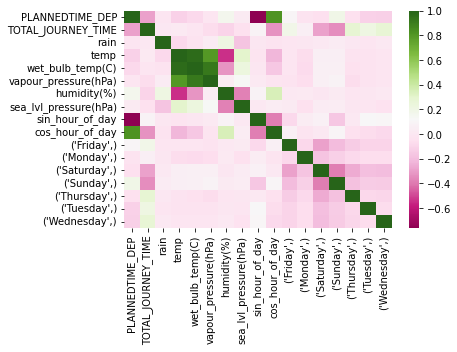

ROUTEID is  16_20
PLANNEDTIME_DEP         -0.054859
TOTAL_JOURNEY_TIME       1.000000
rain                     0.012711
temp                     0.085263
wet_bulb_temp(C)         0.056078
vapour_pressure(hPa)    -0.000634
humidity(%)             -0.138381
sea_lvl_pressure(hPa)   -0.021433
sin_hour_of_day         -0.296648
cos_hour_of_day         -0.199045
(Friday,)                0.288090
(Monday,)               -0.005856
(Saturday,)             -0.318796
(Sunday,)               -0.261156
(Thursday,)              0.264346
(Tuesday,)               0.164181
(Wednesday,)             0.205359
Name: TOTAL_JOURNEY_TIME, dtype: float64


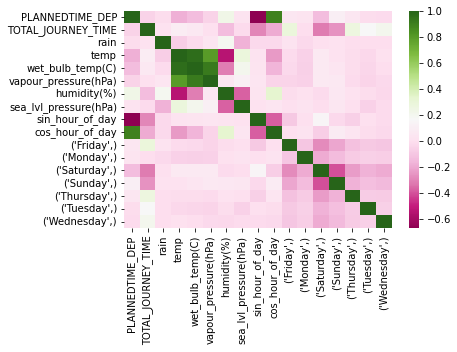

ROUTEID is  31A_25
PLANNEDTIME_DEP         -0.237317
TOTAL_JOURNEY_TIME       1.000000
rain                     0.021372
temp                     0.078831
wet_bulb_temp(C)         0.047533
vapour_pressure(hPa)    -0.010591
humidity(%)             -0.146829
sea_lvl_pressure(hPa)    0.065980
sin_hour_of_day          0.042258
cos_hour_of_day         -0.283572
(Friday,)                0.202464
(Monday,)                0.068645
(Saturday,)             -0.206650
(Sunday,)               -0.258325
(Thursday,)              0.138782
(Tuesday,)               0.085199
(Wednesday,)             0.136576
Name: TOTAL_JOURNEY_TIME, dtype: float64


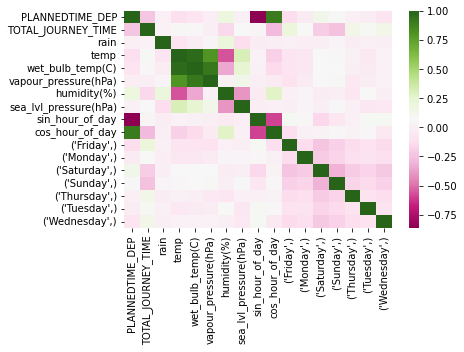

ROUTEID is  65_72
PLANNEDTIME_DEP          0.001255
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.009728
temp                     0.050414
wet_bulb_temp(C)         0.031682
vapour_pressure(hPa)     0.000605
humidity(%)             -0.097100
sea_lvl_pressure(hPa)    0.045007
sin_hour_of_day         -0.168126
cos_hour_of_day         -0.122571
(Friday,)                0.139146
(Monday,)                0.056475
(Saturday,)             -0.140798
(Sunday,)               -0.196024
(Thursday,)              0.142380
(Tuesday,)               0.210147
(Wednesday,)             0.232884
Name: TOTAL_JOURNEY_TIME, dtype: float64


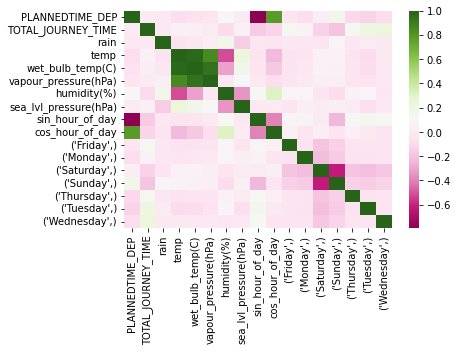

ROUTEID is  33B_58
PLANNEDTIME_DEP         -0.018848
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.036719
temp                     0.019434
wet_bulb_temp(C)         0.025887
vapour_pressure(hPa)     0.025653
humidity(%)              0.023297
sea_lvl_pressure(hPa)    0.010834
sin_hour_of_day          0.082095
cos_hour_of_day          0.068154
(Friday,)                0.072486
(Monday,)                0.030281
(Saturday,)             -0.058876
(Sunday,)               -0.209879
(Thursday,)              0.112879
(Tuesday,)               0.111084
(Wednesday,)             0.118184
Name: TOTAL_JOURNEY_TIME, dtype: float64


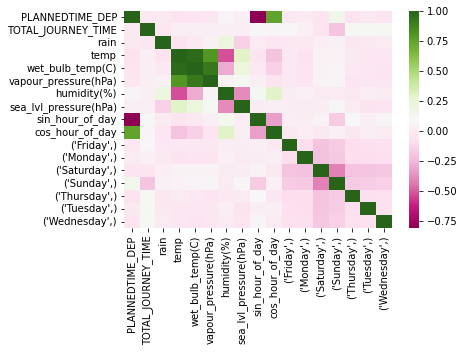

ROUTEID is  41_7
PLANNEDTIME_DEP         -0.288551
TOTAL_JOURNEY_TIME       1.000000
rain                     0.006408
temp                     0.175627
wet_bulb_temp(C)         0.142746
vapour_pressure(hPa)     0.075470
humidity(%)             -0.189823
sea_lvl_pressure(hPa)   -0.022270
sin_hour_of_day         -0.066019
cos_hour_of_day         -0.427676
(Friday,)                0.214880
(Monday,)                0.027136
(Saturday,)             -0.242103
(Sunday,)               -0.246489
(Thursday,)              0.194829
(Tuesday,)               0.127117
(Wednesday,)             0.138683
Name: TOTAL_JOURNEY_TIME, dtype: float64


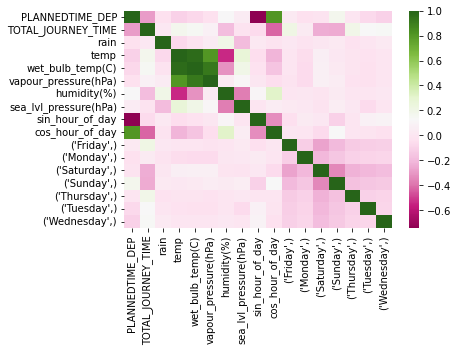

ROUTEID is  7A_87
PLANNEDTIME_DEP          0.395700
TOTAL_JOURNEY_TIME       1.000000
rain                     0.036864
temp                     0.032105
wet_bulb_temp(C)        -0.002648
vapour_pressure(hPa)    -0.059896
humidity(%)             -0.132811
sea_lvl_pressure(hPa)   -0.013168
sin_hour_of_day         -0.450866
cos_hour_of_day         -0.017103
(Friday,)                0.283492
(Monday,)                0.030259
(Saturday,)             -0.339459
(Sunday,)               -0.212934
(Thursday,)              0.285212
(Tuesday,)               0.175248
(Wednesday,)             0.184743
Name: TOTAL_JOURNEY_TIME, dtype: float64


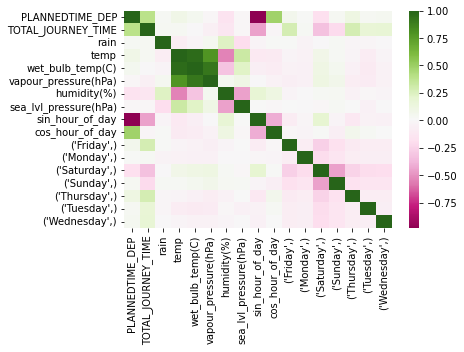

ROUTEID is  13_70
PLANNEDTIME_DEP          0.139101
TOTAL_JOURNEY_TIME       1.000000
rain                     0.259574
temp                    -0.070235
wet_bulb_temp(C)        -0.013674
vapour_pressure(hPa)     0.044083
humidity(%)              0.185662
sea_lvl_pressure(hPa)    0.012207
sin_hour_of_day         -0.166700
cos_hour_of_day          0.199860
(Friday,)               -0.032342
(Monday,)               -0.182317
(Thursday,)              0.071429
(Tuesday,)               0.055891
(Wednesday,)             0.046577
Name: TOTAL_JOURNEY_TIME, dtype: float64


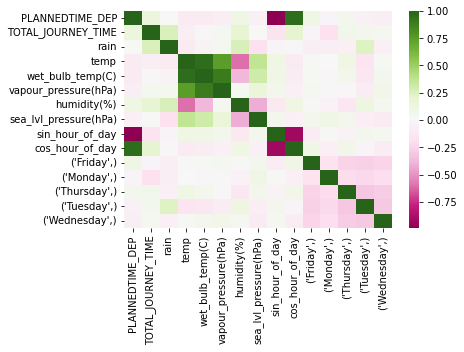

ROUTEID is  39_23
PLANNEDTIME_DEP         -0.302716
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.129728
temp                     0.049170
wet_bulb_temp(C)         0.012156
vapour_pressure(hPa)    -0.036318
humidity(%)             -0.190535
sea_lvl_pressure(hPa)    0.159299
sin_hour_of_day         -0.100531
cos_hour_of_day         -0.100531
(Friday,)                0.008469
(Monday,)               -0.273094
(Saturday,)              0.164263
(Sunday,)               -0.017078
(Thursday,)              0.237672
(Tuesday,)              -0.087069
(Wednesday,)             0.023044
Name: TOTAL_JOURNEY_TIME, dtype: float64


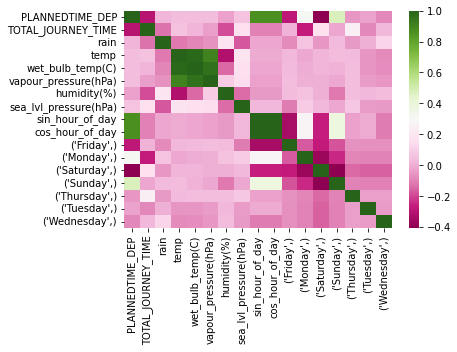

ROUTEID is  161_50
PLANNEDTIME_DEP          0.280783
TOTAL_JOURNEY_TIME       1.000000
rain                     0.043195
temp                     0.136259
wet_bulb_temp(C)         0.133775
vapour_pressure(hPa)     0.112258
humidity(%)             -0.066592
sea_lvl_pressure(hPa)   -0.035787
sin_hour_of_day         -0.325387
cos_hour_of_day          0.404191
(Friday,)               -0.058861
(Monday,)               -0.007576
(Thursday,)             -0.014683
(Tuesday,)              -0.069383
(Wednesday,)             0.166336
Name: TOTAL_JOURNEY_TIME, dtype: float64


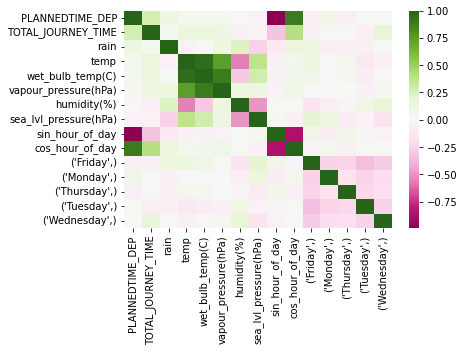

ROUTEID is  65B_65
PLANNEDTIME_DEP          0.181954
TOTAL_JOURNEY_TIME       1.000000
rain                     0.023065
temp                     0.036339
wet_bulb_temp(C)         0.016446
vapour_pressure(hPa)    -0.020383
humidity(%)             -0.092819
sea_lvl_pressure(hPa)   -0.030725
sin_hour_of_day         -0.434011
cos_hour_of_day         -0.028924
(Friday,)                0.227179
(Monday,)                0.013345
(Saturday,)             -0.258939
(Sunday,)               -0.198914
(Thursday,)              0.209427
(Tuesday,)               0.136464
(Wednesday,)             0.162770
Name: TOTAL_JOURNEY_TIME, dtype: float64


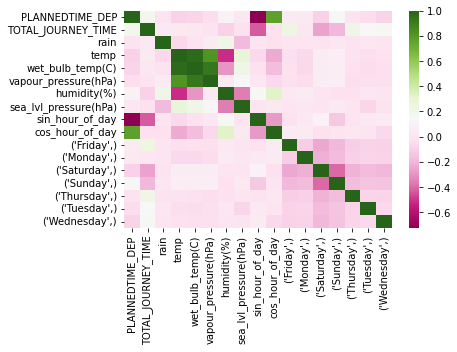

ROUTEID is  40B_63
PLANNEDTIME_DEP          0.026752
TOTAL_JOURNEY_TIME       1.000000
rain                     0.003605
temp                    -0.026038
wet_bulb_temp(C)        -0.010576
vapour_pressure(hPa)     0.011447
humidity(%)              0.068640
sea_lvl_pressure(hPa)    0.033499
sin_hour_of_day          0.011212
cos_hour_of_day          0.308654
(Friday,)                0.189820
(Monday,)                0.062242
(Saturday,)             -0.330579
(Sunday,)               -0.374223
(Thursday,)              0.345907
(Tuesday,)               0.184149
(Wednesday,)             0.274641
Name: TOTAL_JOURNEY_TIME, dtype: float64


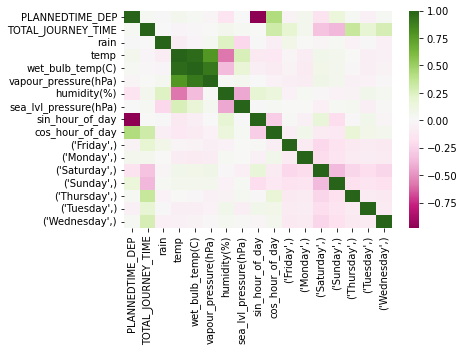

ROUTEID is  68_84
PLANNEDTIME_DEP          0.213012
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.001242
temp                    -0.127918
wet_bulb_temp(C)        -0.120534
vapour_pressure(hPa)    -0.114386
humidity(%)              0.102433
sea_lvl_pressure(hPa)   -0.109581
sin_hour_of_day         -0.201117
cos_hour_of_day          0.251678
(Friday,)                0.392882
(Monday,)                0.025115
(Saturday,)             -0.736270
(Thursday,)              0.348790
(Tuesday,)               0.127375
(Wednesday,)             0.231326
Name: TOTAL_JOURNEY_TIME, dtype: float64


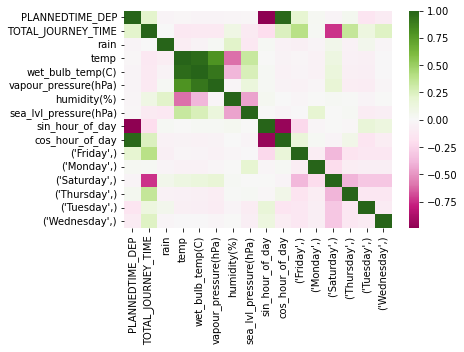

ROUTEID is  7_72
PLANNEDTIME_DEP          0.336926
TOTAL_JOURNEY_TIME       1.000000
rain                     0.039369
temp                    -0.030868
wet_bulb_temp(C)        -0.050517
vapour_pressure(hPa)    -0.078108
humidity(%)             -0.041528
sea_lvl_pressure(hPa)   -0.066652
sin_hour_of_day         -0.383767
cos_hour_of_day          0.028725
(Friday,)                0.134326
(Monday,)                0.106439
(Saturday,)             -0.231882
(Sunday,)               -0.238214
(Thursday,)              0.179572
(Tuesday,)               0.173927
(Wednesday,)             0.166436
Name: TOTAL_JOURNEY_TIME, dtype: float64


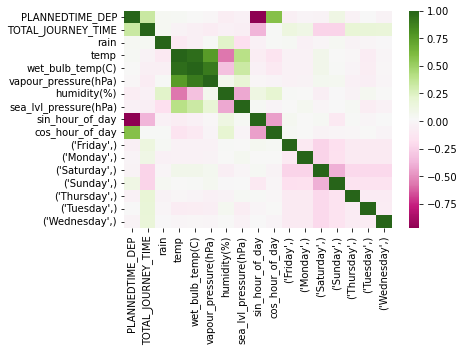

ROUTEID is  43_84
PLANNEDTIME_DEP         -0.076578
TOTAL_JOURNEY_TIME       1.000000
rain                     0.019547
temp                     0.033269
wet_bulb_temp(C)         0.006226
vapour_pressure(hPa)    -0.043411
humidity(%)             -0.107048
sea_lvl_pressure(hPa)   -0.028582
sin_hour_of_day         -0.198963
cos_hour_of_day         -0.175808
(Friday,)                0.214737
(Monday,)                0.027849
(Saturday,)             -0.330802
(Sunday,)               -0.292487
(Thursday,)              0.213536
(Tuesday,)               0.187678
(Wednesday,)             0.210801
Name: TOTAL_JOURNEY_TIME, dtype: float64


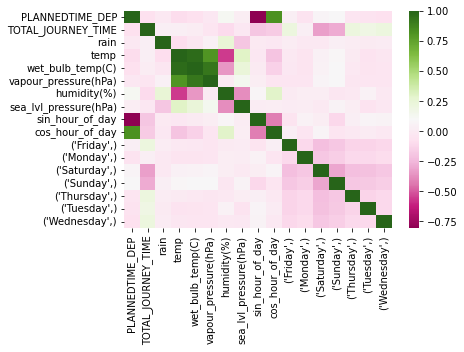

ROUTEID is  69_43
PLANNEDTIME_DEP          0.014023
TOTAL_JOURNEY_TIME       1.000000
rain                     0.067524
temp                    -0.086455
wet_bulb_temp(C)        -0.113608
vapour_pressure(hPa)    -0.123055
humidity(%)             -0.062651
sea_lvl_pressure(hPa)   -0.061965
sin_hour_of_day         -0.296385
cos_hour_of_day         -0.101742
(Friday,)                0.208419
(Monday,)                0.054790
(Saturday,)             -0.113871
(Sunday,)               -0.210146
(Thursday,)              0.255456
(Tuesday,)               0.161443
(Wednesday,)             0.193401
Name: TOTAL_JOURNEY_TIME, dtype: float64


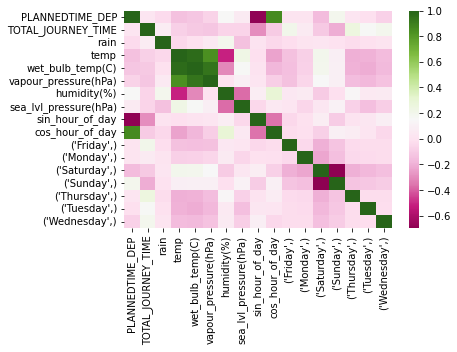

ROUTEID is  41_3
PLANNEDTIME_DEP         -0.002076
TOTAL_JOURNEY_TIME       1.000000
rain                     0.029276
temp                     0.154977
wet_bulb_temp(C)         0.122029
vapour_pressure(hPa)     0.053086
humidity(%)             -0.187133
sea_lvl_pressure(hPa)   -0.030297
sin_hour_of_day         -0.281540
cos_hour_of_day         -0.244393
(Friday,)                0.310941
(Monday,)                0.012635
(Saturday,)             -0.323721
(Sunday,)               -0.222262
(Thursday,)              0.192183
(Tuesday,)               0.114824
(Wednesday,)             0.149422
Name: TOTAL_JOURNEY_TIME, dtype: float64


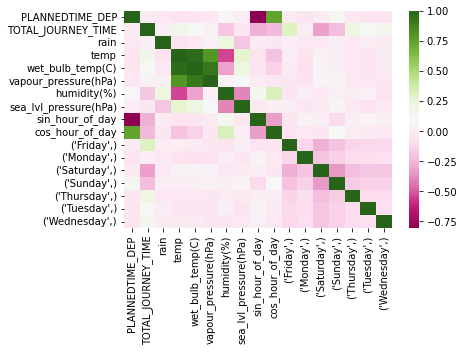

ROUTEID is  75_19
PLANNEDTIME_DEP         -0.162841
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.000927
temp                     0.135609
wet_bulb_temp(C)         0.086932
vapour_pressure(hPa)     0.002367
humidity(%)             -0.238610
sea_lvl_pressure(hPa)   -0.031358
sin_hour_of_day         -0.300414
cos_hour_of_day         -0.322186
(Friday,)                0.230834
(Monday,)               -0.059046
(Saturday,)             -0.168729
(Sunday,)               -0.200321
(Thursday,)              0.168711
(Tuesday,)               0.129810
(Wednesday,)             0.138507
Name: TOTAL_JOURNEY_TIME, dtype: float64


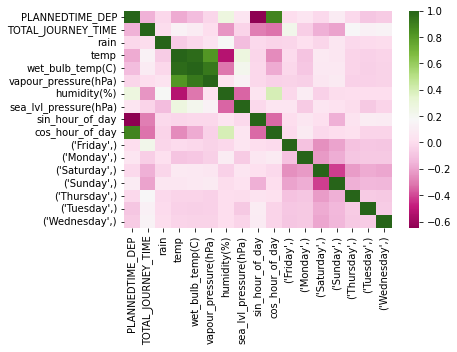

ROUTEID is  27_17
PLANNEDTIME_DEP         -0.080433
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.083761
temp                     0.058611
wet_bulb_temp(C)         0.009086
vapour_pressure(hPa)    -0.070131
humidity(%)             -0.194739
sea_lvl_pressure(hPa)    0.065238
sin_hour_of_day         -0.177671
cos_hour_of_day         -0.215057
(Friday,)                0.229592
(Monday,)                0.072799
(Saturday,)             -0.348065
(Sunday,)               -0.299451
(Thursday,)              0.233086
(Tuesday,)               0.154185
(Wednesday,)             0.209150
Name: TOTAL_JOURNEY_TIME, dtype: float64


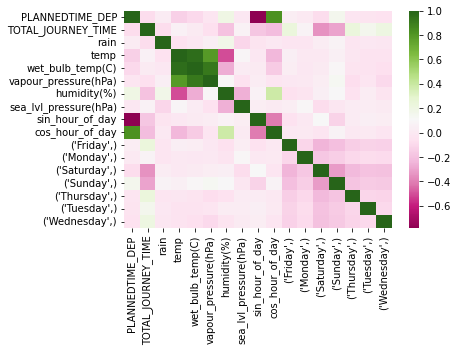

ROUTEID is  33A_25
PLANNEDTIME_DEP         -0.372608
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.021074
temp                     0.251074
wet_bulb_temp(C)         0.211844
vapour_pressure(hPa)     0.123345
humidity(%)             -0.230755
sea_lvl_pressure(hPa)   -0.019646
sin_hour_of_day         -0.130744
cos_hour_of_day         -0.400455
(Friday,)                0.147151
(Monday,)               -0.102435
(Saturday,)              0.223743
(Sunday,)               -0.418062
(Thursday,)              0.055649
(Tuesday,)               0.027968
(Wednesday,)             0.085886
Name: TOTAL_JOURNEY_TIME, dtype: float64


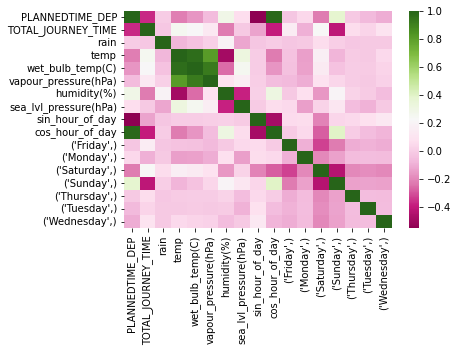

ROUTEID is  47_135
PLANNEDTIME_DEP          0.068825
TOTAL_JOURNEY_TIME       1.000000
rain                     0.044513
temp                     0.127657
wet_bulb_temp(C)         0.155013
vapour_pressure(hPa)     0.159107
humidity(%)              0.014211
sea_lvl_pressure(hPa)    0.099156
sin_hour_of_day         -0.156590
cos_hour_of_day          0.096629
(Friday,)                0.116915
(Monday,)               -0.111443
(Thursday,)             -0.097495
(Tuesday,)               0.039169
(Wednesday,)             0.033627
Name: TOTAL_JOURNEY_TIME, dtype: float64


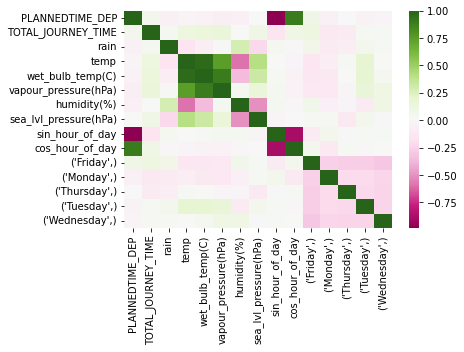

ROUTEID is  76_36
PLANNEDTIME_DEP         -0.345930
TOTAL_JOURNEY_TIME       1.000000
rain                     0.031499
temp                     0.055083
wet_bulb_temp(C)         0.019722
vapour_pressure(hPa)    -0.043764
humidity(%)             -0.146401
sea_lvl_pressure(hPa)   -0.069018
sin_hour_of_day         -0.052323
cos_hour_of_day         -0.417766
(Friday,)                0.301908
(Monday,)                0.035357
(Saturday,)             -0.254719
(Sunday,)               -0.315085
(Thursday,)              0.230595
(Tuesday,)               0.168001
(Wednesday,)             0.167617
Name: TOTAL_JOURNEY_TIME, dtype: float64


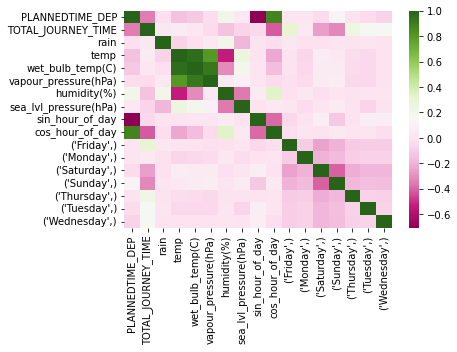

ROUTEID is  25_269
PLANNEDTIME_DEP         -0.335912
TOTAL_JOURNEY_TIME       1.000000
rain                     0.036176
temp                     0.067266
wet_bulb_temp(C)         0.037042
vapour_pressure(hPa)    -0.018307
humidity(%)             -0.131064
sea_lvl_pressure(hPa)   -0.040529
sin_hour_of_day          0.038065
cos_hour_of_day         -0.396972
(Friday,)                0.126632
(Monday,)                0.010168
(Saturday,)             -0.296141
(Sunday,)               -0.209150
(Thursday,)              0.199532
(Tuesday,)               0.182024
(Wednesday,)             0.239833
Name: TOTAL_JOURNEY_TIME, dtype: float64


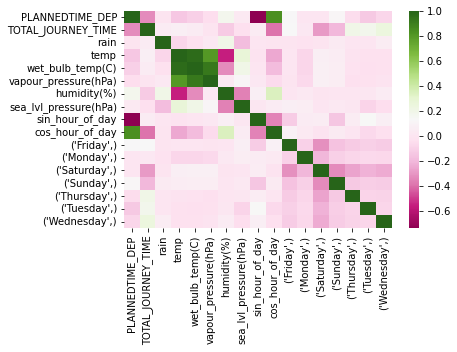

ROUTEID is  150_9
PLANNEDTIME_DEP         -0.141096
TOTAL_JOURNEY_TIME       1.000000
rain                     0.032222
temp                     0.056301
wet_bulb_temp(C)         0.033204
vapour_pressure(hPa)    -0.021126
humidity(%)             -0.106371
sea_lvl_pressure(hPa)   -0.050704
sin_hour_of_day         -0.114287
cos_hour_of_day         -0.273645
(Friday,)                0.261947
(Monday,)                0.010111
(Saturday,)             -0.224741
(Sunday,)               -0.358999
(Thursday,)              0.241969
(Tuesday,)               0.167996
(Wednesday,)             0.221056
Name: TOTAL_JOURNEY_TIME, dtype: float64


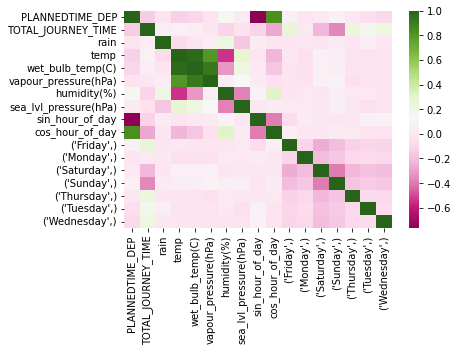

ROUTEID is  220_12
PLANNEDTIME_DEP         -0.082914
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.026935
temp                    -0.069204
wet_bulb_temp(C)        -0.085299
vapour_pressure(hPa)    -0.104452
humidity(%)             -0.026614
sea_lvl_pressure(hPa)    0.009398
sin_hour_of_day         -0.037844
cos_hour_of_day         -0.184957
(Friday,)                0.284228
(Monday,)                0.099863
(Saturday,)             -0.258225
(Sunday,)               -0.253222
(Thursday,)              0.175214
(Tuesday,)               0.110437
(Wednesday,)             0.166678
Name: TOTAL_JOURNEY_TIME, dtype: float64


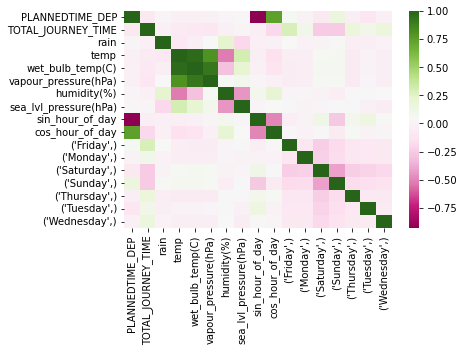

ROUTEID is  67X_46
PLANNEDTIME_DEP          0.395048
TOTAL_JOURNEY_TIME       1.000000
rain                     0.068560
temp                    -0.180363
wet_bulb_temp(C)        -0.160901
vapour_pressure(hPa)    -0.140094
humidity(%)              0.140192
sea_lvl_pressure(hPa)   -0.211817
sin_hour_of_day         -0.667960
cos_hour_of_day         -0.654683
(Friday,)               -0.038900
(Monday,)               -0.134117
(Thursday,)              0.002952
(Tuesday,)               0.110965
(Wednesday,)             0.026508
Name: TOTAL_JOURNEY_TIME, dtype: float64


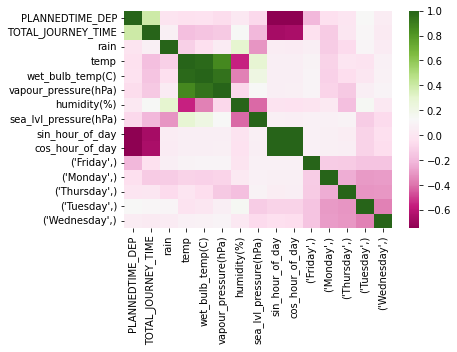

ROUTEID is  130_11
PLANNEDTIME_DEP         -0.332221
TOTAL_JOURNEY_TIME       1.000000
rain                     0.013546
temp                     0.167801
wet_bulb_temp(C)         0.129972
vapour_pressure(hPa)     0.052395
humidity(%)             -0.200330
sea_lvl_pressure(hPa)    0.015221
sin_hour_of_day          0.077320
cos_hour_of_day         -0.435605
(Friday,)                0.130500
(Monday,)                0.026233
(Saturday,)             -0.256261
(Sunday,)               -0.217661
(Thursday,)              0.178571
(Tuesday,)               0.160044
(Wednesday,)             0.183051
Name: TOTAL_JOURNEY_TIME, dtype: float64


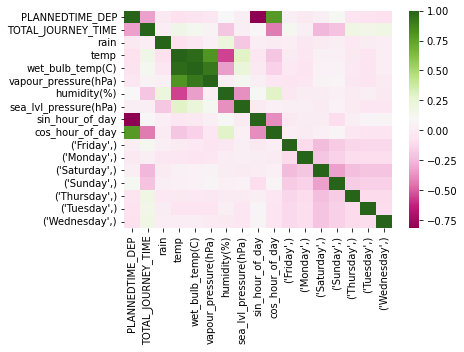

ROUTEID is  33A_22
PLANNEDTIME_DEP         -0.280924
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.026814
temp                     0.119505
wet_bulb_temp(C)         0.086205
vapour_pressure(hPa)     0.016224
humidity(%)             -0.158991
sea_lvl_pressure(hPa)   -0.011788
sin_hour_of_day          0.015460
cos_hour_of_day         -0.221683
(Friday,)                0.298336
(Monday,)                0.008410
(Saturday,)             -0.189516
(Sunday,)               -0.419353
(Thursday,)              0.196139
(Tuesday,)               0.143716
(Wednesday,)             0.189479
Name: TOTAL_JOURNEY_TIME, dtype: float64


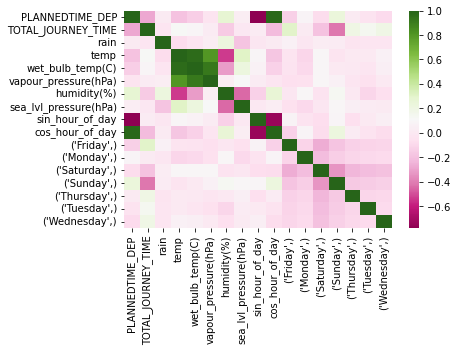

ROUTEID is  122_18
PLANNEDTIME_DEP         -0.192091
TOTAL_JOURNEY_TIME       1.000000
rain                     0.127277
temp                     0.009923
wet_bulb_temp(C)        -0.030843
vapour_pressure(hPa)    -0.095897
humidity(%)             -0.108270
sea_lvl_pressure(hPa)   -0.174157
sin_hour_of_day         -0.170602
cos_hour_of_day         -0.401426
(Friday,)               -0.018601
(Monday,)                0.010008
(Saturday,)             -0.192867
(Thursday,)              0.016359
(Tuesday,)               0.007916
(Wednesday,)             0.045764
Name: TOTAL_JOURNEY_TIME, dtype: float64


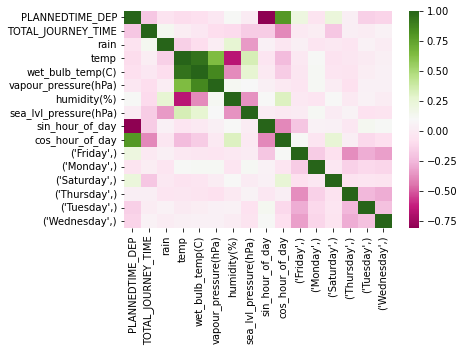

ROUTEID is  7B_91
PLANNEDTIME_DEP         -0.157026
TOTAL_JOURNEY_TIME       1.000000
rain                     0.012186
temp                     0.008980
wet_bulb_temp(C)         0.020158
vapour_pressure(hPa)     0.034547
humidity(%)              0.037240
sea_lvl_pressure(hPa)   -0.025543
sin_hour_of_day          0.161575
cos_hour_of_day          0.161575
(Friday,)                0.055555
(Monday,)               -0.114613
(Thursday,)              0.020612
(Tuesday,)               0.070100
(Wednesday,)            -0.049465
Name: TOTAL_JOURNEY_TIME, dtype: float64


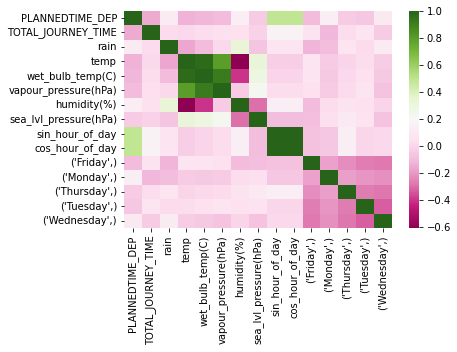

ROUTEID is  68_78
PLANNEDTIME_DEP          0.476710
TOTAL_JOURNEY_TIME       1.000000
rain                     0.176456
temp                    -0.058290
wet_bulb_temp(C)        -0.093108
vapour_pressure(hPa)    -0.130826
humidity(%)             -0.074642
sea_lvl_pressure(hPa)   -0.061599
sin_hour_of_day         -0.501151
cos_hour_of_day         -0.407110
(Friday,)                0.426183
(Monday,)                0.026952
(Saturday,)             -0.699303
(Thursday,)              0.282069
(Tuesday,)               0.234280
(Wednesday,)             0.125327
Name: TOTAL_JOURNEY_TIME, dtype: float64


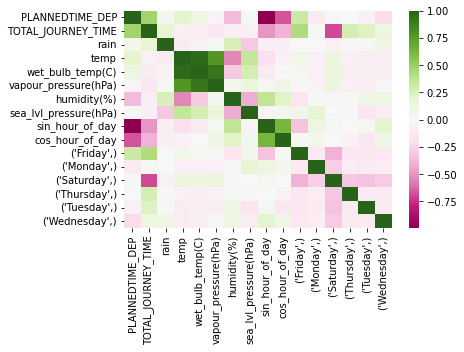

ROUTEID is  66A_34
PLANNEDTIME_DEP          0.031450
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.007873
temp                    -0.000847
wet_bulb_temp(C)        -0.019468
vapour_pressure(hPa)    -0.054284
humidity(%)             -0.079421
sea_lvl_pressure(hPa)   -0.039997
sin_hour_of_day         -0.266780
cos_hour_of_day         -0.104138
(Friday,)                0.175968
(Monday,)                0.046151
(Saturday,)             -0.404355
(Sunday,)               -0.152327
(Thursday,)              0.217120
(Tuesday,)               0.111600
(Wednesday,)             0.289050
Name: TOTAL_JOURNEY_TIME, dtype: float64


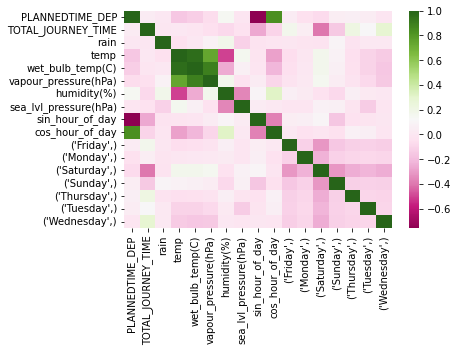

ROUTEID is  27_12
PLANNEDTIME_DEP         -0.172791
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.073091
temp                    -0.089482
wet_bulb_temp(C)        -0.077985
vapour_pressure(hPa)    -0.054388
humidity(%)              0.043801
sea_lvl_pressure(hPa)   -0.008093
sin_hour_of_day          0.298443
cos_hour_of_day          0.060634
(Friday,)                0.022350
(Monday,)                0.037600
(Saturday,)             -0.490369
(Thursday,)              0.202793
(Tuesday,)               0.055936
(Wednesday,)             0.134540
Name: TOTAL_JOURNEY_TIME, dtype: float64


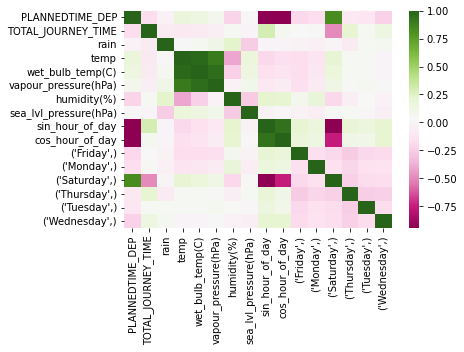

ROUTEID is  7A_85
PLANNEDTIME_DEP          0.462798
TOTAL_JOURNEY_TIME       1.000000
rain                     0.000587
temp                     0.052850
wet_bulb_temp(C)         0.015452
vapour_pressure(hPa)    -0.050661
humidity(%)             -0.142636
sea_lvl_pressure(hPa)    0.018637
sin_hour_of_day         -0.506906
cos_hour_of_day          0.085325
(Friday,)                0.257053
(Monday,)                0.052446
(Saturday,)             -0.362974
(Sunday,)               -0.223935
(Thursday,)              0.206232
(Tuesday,)               0.195782
(Wednesday,)             0.220717
Name: TOTAL_JOURNEY_TIME, dtype: float64


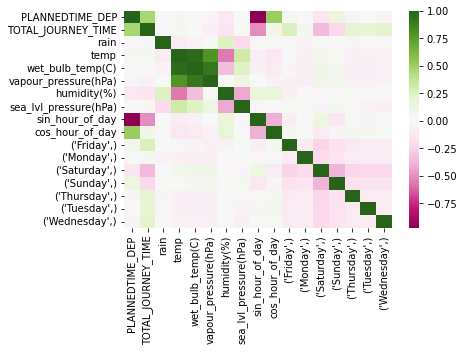

ROUTEID is  33_70
PLANNEDTIME_DEP         -0.201723
TOTAL_JOURNEY_TIME       1.000000
rain                     0.000645
temp                     0.184887
wet_bulb_temp(C)         0.147746
vapour_pressure(hPa)     0.076450
humidity(%)             -0.205223
sea_lvl_pressure(hPa)    0.044133
sin_hour_of_day         -0.201986
cos_hour_of_day         -0.296434
(Friday,)                0.195304
(Monday,)                0.021352
(Saturday,)             -0.267425
(Sunday,)               -0.154783
(Thursday,)              0.136848
(Tuesday,)               0.114154
(Wednesday,)             0.148779
Name: TOTAL_JOURNEY_TIME, dtype: float64


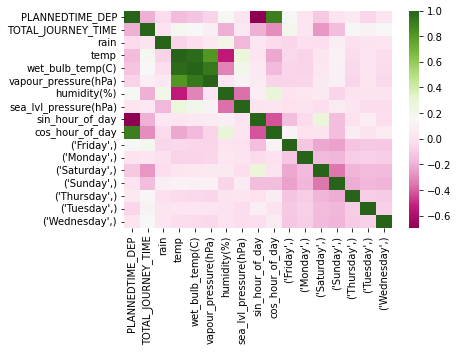

ROUTEID is  238_11
PLANNEDTIME_DEP         -0.166604
TOTAL_JOURNEY_TIME       1.000000
rain                     0.014167
temp                    -0.035323
wet_bulb_temp(C)        -0.044199
vapour_pressure(hPa)    -0.062045
humidity(%)             -0.020974
sea_lvl_pressure(hPa)   -0.018688
sin_hour_of_day          0.046400
cos_hour_of_day         -0.231463
(Friday,)                0.224069
(Monday,)                0.059831
(Saturday,)             -0.327769
(Sunday,)               -0.217374
(Thursday,)              0.192629
(Tuesday,)               0.225452
(Wednesday,)             0.203102
Name: TOTAL_JOURNEY_TIME, dtype: float64


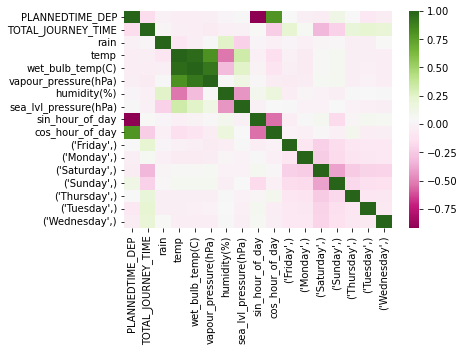

ROUTEID is  63_25
PLANNEDTIME_DEP         -0.355203
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.036770
temp                     0.050226
wet_bulb_temp(C)         0.046039
vapour_pressure(hPa)     0.041916
humidity(%)             -0.036342
sea_lvl_pressure(hPa)   -0.024504
sin_hour_of_day          0.134712
cos_hour_of_day         -0.320043
(Friday,)                0.065740
(Monday,)                0.137219
(Saturday,)             -0.090227
(Sunday,)               -0.177593
(Thursday,)              0.147621
(Tuesday,)               0.103480
(Wednesday,)             0.181398
Name: TOTAL_JOURNEY_TIME, dtype: float64


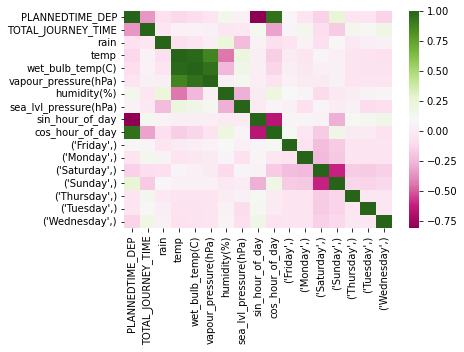

ROUTEID is  104_16
PLANNEDTIME_DEP         -0.175421
TOTAL_JOURNEY_TIME       1.000000
rain                     0.031237
temp                    -0.085165
wet_bulb_temp(C)        -0.076277
vapour_pressure(hPa)    -0.066177
humidity(%)              0.068789
sea_lvl_pressure(hPa)   -0.074658
sin_hour_of_day          0.045444
cos_hour_of_day         -0.085915
(Friday,)                0.194984
(Monday,)                0.038146
(Saturday,)             -0.355002
(Sunday,)               -0.268047
(Thursday,)              0.208337
(Tuesday,)               0.164221
(Wednesday,)             0.202750
Name: TOTAL_JOURNEY_TIME, dtype: float64


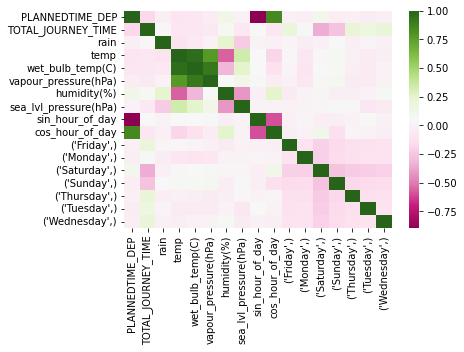

ROUTEID is  69_45
PLANNEDTIME_DEP         -0.070376
TOTAL_JOURNEY_TIME       1.000000
rain                     0.023453
temp                     0.151306
wet_bulb_temp(C)         0.094548
vapour_pressure(hPa)    -0.017736
humidity(%)             -0.208867
sea_lvl_pressure(hPa)    0.037133
sin_hour_of_day         -0.327661
cos_hour_of_day         -0.259225
(Friday,)                0.081612
(Monday,)                0.010085
(Saturday,)             -0.207457
(Thursday,)             -0.008432
(Tuesday,)              -0.000832
(Wednesday,)             0.003403
Name: TOTAL_JOURNEY_TIME, dtype: float64


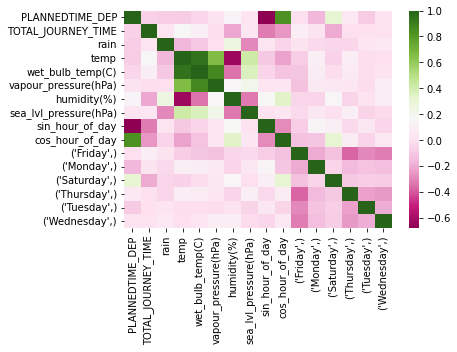

ROUTEID is  41_22
PLANNEDTIME_DEP         -0.023022
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.072310
temp                     0.010581
wet_bulb_temp(C)         0.023938
vapour_pressure(hPa)     0.040426
humidity(%)              0.050534
sea_lvl_pressure(hPa)    0.053824
sin_hour_of_day         -0.280347
cos_hour_of_day         -0.235466
(Friday,)                0.280335
(Monday,)                0.092161
(Saturday,)             -0.364198
(Sunday,)               -0.164031
(Thursday,)              0.212453
(Tuesday,)               0.005116
(Wednesday,)             0.134119
Name: TOTAL_JOURNEY_TIME, dtype: float64


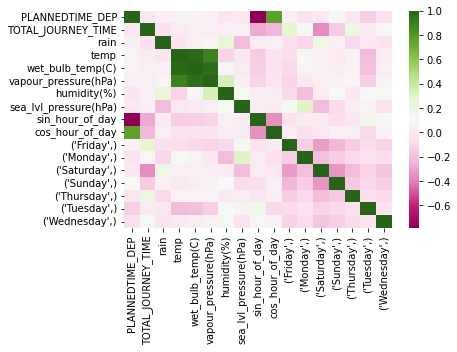

ROUTEID is  17A_15
PLANNEDTIME_DEP          0.017909
TOTAL_JOURNEY_TIME       1.000000
rain                     0.110361
temp                     0.005225
wet_bulb_temp(C)         0.001608
vapour_pressure(hPa)    -0.006906
humidity(%)             -0.029190
sea_lvl_pressure(hPa)   -0.012461
sin_hour_of_day         -0.181020
cos_hour_of_day         -0.148989
(Friday,)                0.025885
(Monday,)               -0.116821
(Thursday,)              0.050750
(Tuesday,)              -0.006152
(Wednesday,)             0.026807
Name: TOTAL_JOURNEY_TIME, dtype: float64


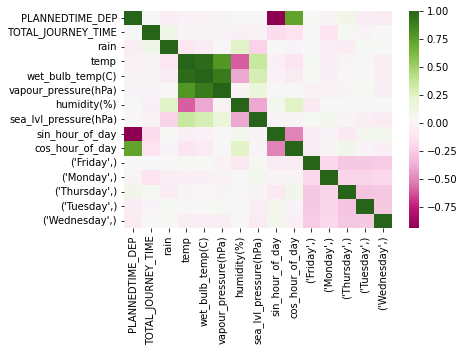

ROUTEID is  185_51
PLANNEDTIME_DEP         -0.061886
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.021545
temp                     0.153691
wet_bulb_temp(C)         0.141047
vapour_pressure(hPa)     0.100097
humidity(%)             -0.100641
sea_lvl_pressure(hPa)    0.055922
sin_hour_of_day          0.043764
cos_hour_of_day         -0.136051
(Friday,)                0.064456
(Monday,)               -0.081697
(Thursday,)              0.018680
(Tuesday,)               0.035052
(Wednesday,)            -0.051282
Name: TOTAL_JOURNEY_TIME, dtype: float64


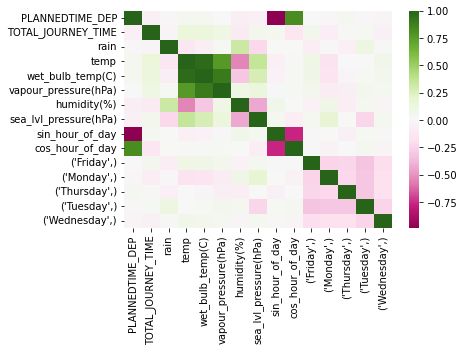

ROUTEID is  68_66
PLANNEDTIME_DEP         -0.018403
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.013521
temp                    -0.120739
wet_bulb_temp(C)        -0.104750
vapour_pressure(hPa)    -0.073469
humidity(%)              0.116757
sea_lvl_pressure(hPa)   -0.079825
sin_hour_of_day          0.597041
cos_hour_of_day         -0.576142
(Friday,)                0.099362
(Monday,)               -0.204261
(Saturday,)              0.231604
(Sunday,)               -0.353264
(Thursday,)              0.133156
(Tuesday,)               0.196254
(Wednesday,)             0.222573
Name: TOTAL_JOURNEY_TIME, dtype: float64


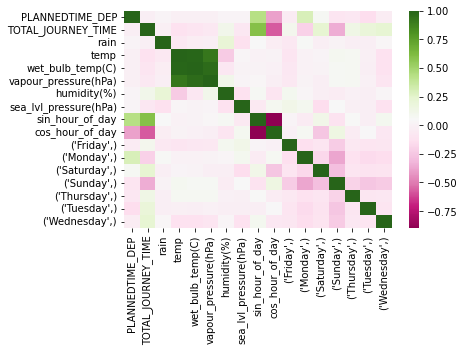

ROUTEID is  185_52
PLANNEDTIME_DEP         -0.016699
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.042471
temp                    -0.044283
wet_bulb_temp(C)        -0.021611
vapour_pressure(hPa)     0.014329
humidity(%)              0.078696
sea_lvl_pressure(hPa)   -0.058579
sin_hour_of_day         -0.007116
cos_hour_of_day         -0.101205
(Friday,)                0.036249
(Monday,)                0.043791
(Saturday,)             -0.158501
(Thursday,)              0.057086
(Tuesday,)               0.070586
(Wednesday,)             0.108632
Name: TOTAL_JOURNEY_TIME, dtype: float64


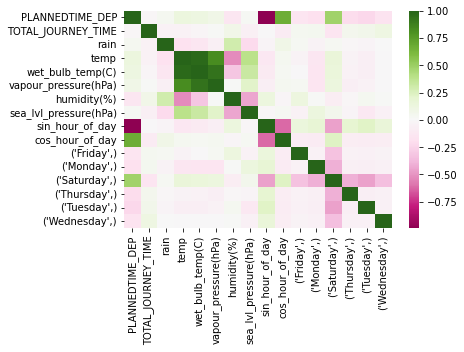

ROUTEID is  123_34
PLANNEDTIME_DEP         -0.070697
TOTAL_JOURNEY_TIME       1.000000
rain                     0.050086
temp                     0.037601
wet_bulb_temp(C)         0.010731
vapour_pressure(hPa)    -0.039882
humidity(%)             -0.104946
sea_lvl_pressure(hPa)   -0.048025
sin_hour_of_day         -0.187419
cos_hour_of_day         -0.208119
(Friday,)                0.210869
(Monday,)                0.037273
(Saturday,)             -0.345450
(Sunday,)               -0.272148
(Thursday,)              0.230583
(Tuesday,)               0.193369
(Wednesday,)             0.206072
Name: TOTAL_JOURNEY_TIME, dtype: float64


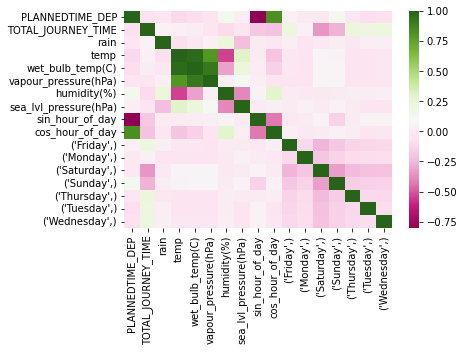

ROUTEID is  25D_275
PLANNEDTIME_DEP         -0.168963
TOTAL_JOURNEY_TIME       1.000000
rain                     0.197318
temp                    -0.187196
wet_bulb_temp(C)        -0.170735
vapour_pressure(hPa)    -0.140768
humidity(%)              0.127275
sea_lvl_pressure(hPa)   -0.116151
sin_hour_of_day          0.146581
cos_hour_of_day         -0.278754
(Friday,)                0.057423
(Monday,)                0.021222
(Thursday,)             -0.014557
(Tuesday,)              -0.021714
(Wednesday,)            -0.023548
Name: TOTAL_JOURNEY_TIME, dtype: float64


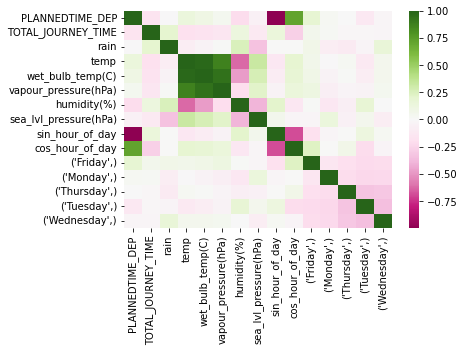

ROUTEID is  120_9
PLANNEDTIME_DEP         -0.288441
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.012213
temp                     0.041165
wet_bulb_temp(C)         0.020086
vapour_pressure(hPa)    -0.012256
humidity(%)             -0.088234
sea_lvl_pressure(hPa)   -0.050376
sin_hour_of_day          0.126910
cos_hour_of_day         -0.293633
(Friday,)                0.194757
(Monday,)                0.047930
(Saturday,)             -0.326586
(Sunday,)               -0.272013
(Thursday,)              0.195525
(Tuesday,)               0.228741
(Wednesday,)             0.230832
Name: TOTAL_JOURNEY_TIME, dtype: float64


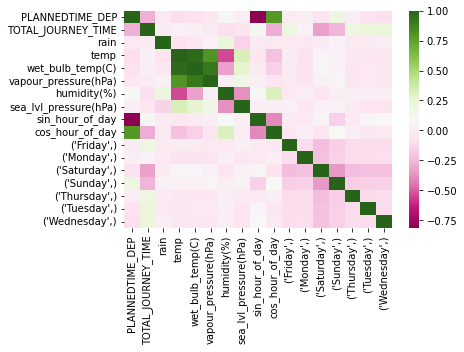

ROUTEID is  42_42
PLANNEDTIME_DEP         -0.080433
TOTAL_JOURNEY_TIME       1.000000
rain                     0.024355
temp                     0.105458
wet_bulb_temp(C)         0.071970
vapour_pressure(hPa)     0.010416
humidity(%)             -0.154745
sea_lvl_pressure(hPa)    0.017969
sin_hour_of_day         -0.229679
cos_hour_of_day         -0.154610
(Friday,)                0.208095
(Monday,)                0.022424
(Saturday,)             -0.310471
(Sunday,)               -0.157608
(Thursday,)              0.184244
(Tuesday,)               0.149483
(Wednesday,)             0.182550
Name: TOTAL_JOURNEY_TIME, dtype: float64


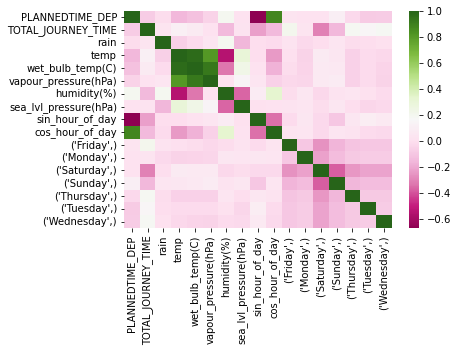

ROUTEID is  68_83
PLANNEDTIME_DEP         -0.306353
TOTAL_JOURNEY_TIME       1.000000
rain                     0.094201
temp                    -0.068182
wet_bulb_temp(C)        -0.055674
vapour_pressure(hPa)    -0.045296
humidity(%)              0.081071
sea_lvl_pressure(hPa)   -0.128085
sin_hour_of_day          0.216983
cos_hour_of_day         -0.226267
(Friday,)                0.132868
(Monday,)                0.089339
(Saturday,)             -0.508631
(Thursday,)              0.206373
(Tuesday,)               0.150119
(Wednesday,)             0.233420
Name: TOTAL_JOURNEY_TIME, dtype: float64


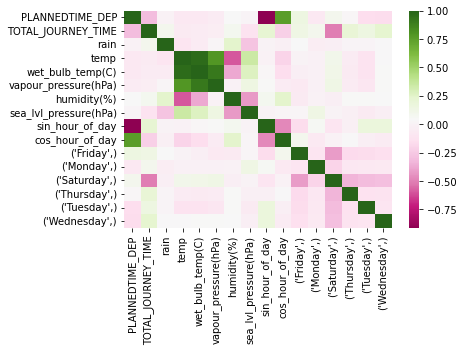

ROUTEID is  40_27
PLANNEDTIME_DEP         -0.086812
TOTAL_JOURNEY_TIME       1.000000
rain                     0.021080
temp                     0.069511
wet_bulb_temp(C)         0.037436
vapour_pressure(hPa)    -0.026182
humidity(%)             -0.136626
sea_lvl_pressure(hPa)   -0.042828
sin_hour_of_day         -0.227925
cos_hour_of_day         -0.232179
(Friday,)                0.280893
(Monday,)               -0.007376
(Saturday,)             -0.312405
(Sunday,)               -0.271045
(Thursday,)              0.269055
(Tuesday,)               0.150498
(Wednesday,)             0.186894
Name: TOTAL_JOURNEY_TIME, dtype: float64


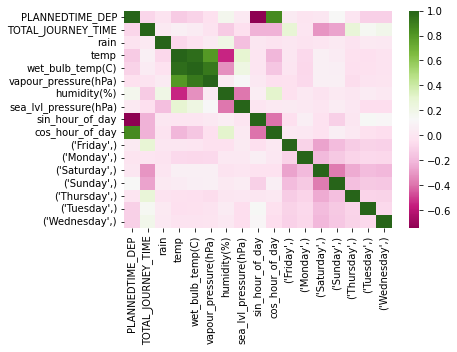

ROUTEID is  42_44
PLANNEDTIME_DEP         -0.253714
TOTAL_JOURNEY_TIME       1.000000
rain                     0.018716
temp                     0.186506
wet_bulb_temp(C)         0.145059
vapour_pressure(hPa)     0.059024
humidity(%)             -0.220453
sea_lvl_pressure(hPa)    0.018920
sin_hour_of_day         -0.097879
cos_hour_of_day         -0.410780
(Friday,)                0.147128
(Monday,)                0.032649
(Saturday,)             -0.262607
(Sunday,)               -0.151700
(Thursday,)              0.156285
(Tuesday,)               0.150025
(Wednesday,)             0.154413
Name: TOTAL_JOURNEY_TIME, dtype: float64


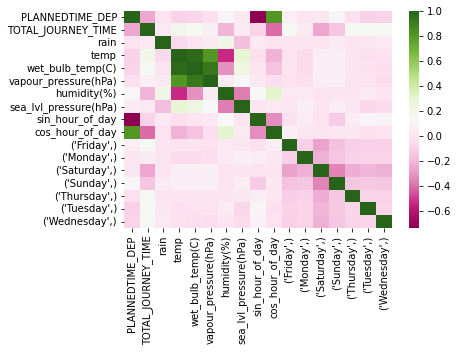

ROUTEID is  33_44
PLANNEDTIME_DEP         -0.178480
TOTAL_JOURNEY_TIME       1.000000
rain                     0.035364
temp                     0.170638
wet_bulb_temp(C)         0.141392
vapour_pressure(hPa)     0.080997
humidity(%)             -0.171430
sea_lvl_pressure(hPa)    0.014659
sin_hour_of_day         -0.177284
cos_hour_of_day         -0.289684
(Friday,)                0.043823
(Monday,)               -0.011575
(Saturday,)             -0.131778
(Sunday,)               -0.082030
(Thursday,)              0.099522
(Tuesday,)               0.035997
(Wednesday,)             0.103596
Name: TOTAL_JOURNEY_TIME, dtype: float64


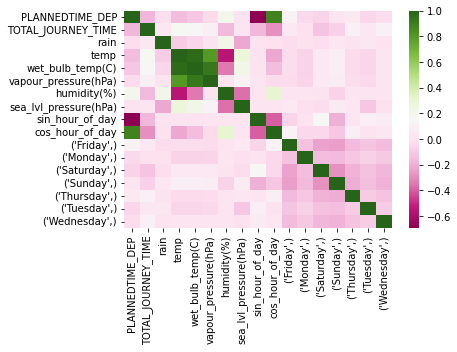

ROUTEID is  25B_271
PLANNEDTIME_DEP         -0.444574
TOTAL_JOURNEY_TIME       1.000000
rain                     0.029369
temp                     0.050906
wet_bulb_temp(C)         0.022244
vapour_pressure(hPa)    -0.028914
humidity(%)             -0.117355
sea_lvl_pressure(hPa)   -0.025820
sin_hour_of_day          0.216747
cos_hour_of_day         -0.443442
(Friday,)                0.183915
(Monday,)                0.036550
(Saturday,)             -0.274354
(Sunday,)               -0.363634
(Thursday,)              0.218835
(Tuesday,)               0.238319
(Wednesday,)             0.286579
Name: TOTAL_JOURNEY_TIME, dtype: float64


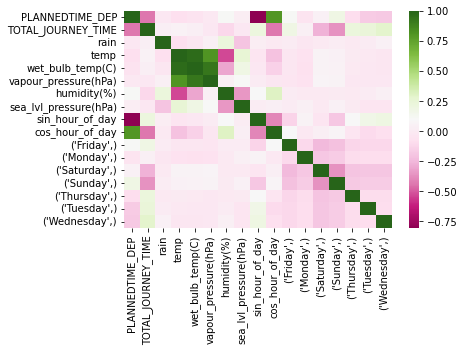

ROUTEID is  151_15
PLANNEDTIME_DEP          0.228310
TOTAL_JOURNEY_TIME       1.000000
rain                     0.034439
temp                    -0.044684
wet_bulb_temp(C)        -0.053772
vapour_pressure(hPa)    -0.071012
humidity(%)             -0.003389
sea_lvl_pressure(hPa)   -0.055611
sin_hour_of_day         -0.264707
cos_hour_of_day          0.188483
(Friday,)                0.283618
(Monday,)                0.058942
(Saturday,)             -0.413257
(Sunday,)               -0.328896
(Thursday,)              0.307571
(Tuesday,)               0.212345
(Wednesday,)             0.291141
Name: TOTAL_JOURNEY_TIME, dtype: float64


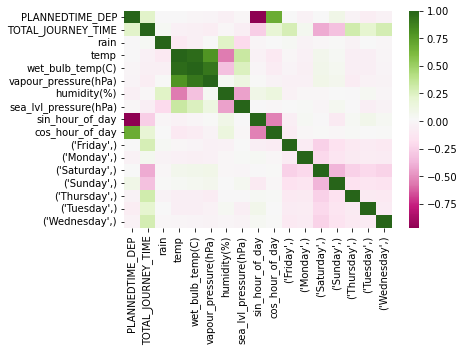

ROUTEID is  17A_13
PLANNEDTIME_DEP          0.100633
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.041465
temp                     0.079171
wet_bulb_temp(C)         0.052834
vapour_pressure(hPa)    -0.000369
humidity(%)             -0.133817
sea_lvl_pressure(hPa)    0.010920
sin_hour_of_day         -0.233508
cos_hour_of_day         -0.115454
(Monday,)               -0.027883
(Saturday,)              0.012665
(Sunday,)               -0.003010
Name: TOTAL_JOURNEY_TIME, dtype: float64


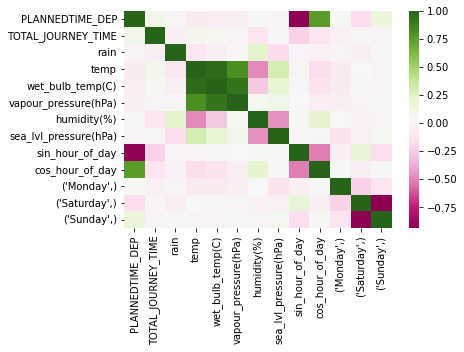

ROUTEID is  27_9
PLANNEDTIME_DEP         -0.554085
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.032438
temp                     0.129380
wet_bulb_temp(C)         0.127218
vapour_pressure(hPa)     0.139539
humidity(%)             -0.050841
sea_lvl_pressure(hPa)    0.087647
sin_hour_of_day          0.557409
cos_hour_of_day         -0.571685
(Friday,)                0.298920
(Monday,)               -0.172519
(Saturday,)             -0.006185
(Sunday,)               -0.368364
(Thursday,)              0.144311
(Tuesday,)               0.141161
(Wednesday,)             0.154814
Name: TOTAL_JOURNEY_TIME, dtype: float64


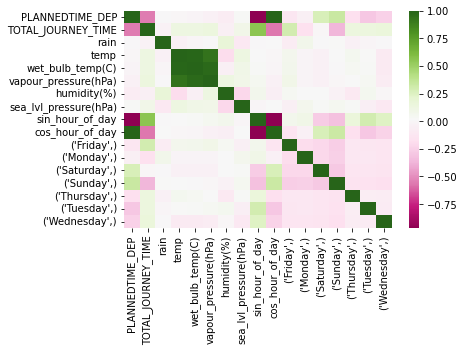

ROUTEID is  25A_273
PLANNEDTIME_DEP          0.128228
TOTAL_JOURNEY_TIME       1.000000
rain                     0.049900
temp                     0.025778
wet_bulb_temp(C)        -0.001940
vapour_pressure(hPa)    -0.053853
humidity(%)             -0.101611
sea_lvl_pressure(hPa)   -0.036996
sin_hour_of_day         -0.470823
cos_hour_of_day         -0.009977
(Friday,)                0.274938
(Monday,)               -0.007477
(Saturday,)             -0.322606
(Sunday,)               -0.319400
(Thursday,)              0.246565
(Tuesday,)               0.198186
(Wednesday,)             0.249475
Name: TOTAL_JOURNEY_TIME, dtype: float64


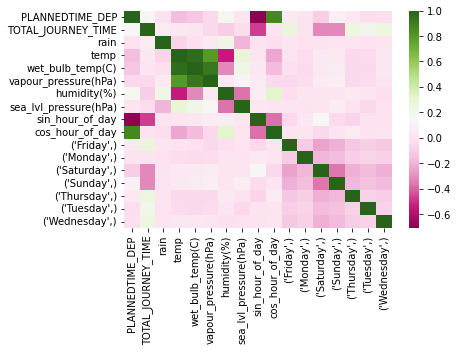

ROUTEID is  17_11
PLANNEDTIME_DEP         -0.558885
TOTAL_JOURNEY_TIME       1.000000
rain                     0.016080
temp                     0.146403
wet_bulb_temp(C)         0.098909
vapour_pressure(hPa)     0.015247
humidity(%)             -0.226556
sea_lvl_pressure(hPa)    0.093900
sin_hour_of_day          0.147633
cos_hour_of_day         -0.528703
(Monday,)               -0.142262
(Saturday,)              0.019823
(Sunday,)                0.132985
(Wednesday,)            -0.012336
Name: TOTAL_JOURNEY_TIME, dtype: float64


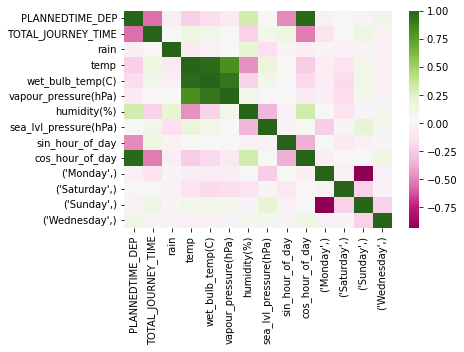

ROUTEID is  17A_18
PLANNEDTIME_DEP         -0.552638
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.002391
temp                     0.270461
wet_bulb_temp(C)         0.263366
vapour_pressure(hPa)     0.242465
humidity(%)             -0.037929
sea_lvl_pressure(hPa)    0.017608
sin_hour_of_day         -0.398391
cos_hour_of_day         -0.278097
(Friday,)                0.171571
(Monday,)                0.026912
(Saturday,)             -0.228145
(Thursday,)              0.057468
(Tuesday,)              -0.132998
(Wednesday,)             0.042978
Name: TOTAL_JOURNEY_TIME, dtype: float64


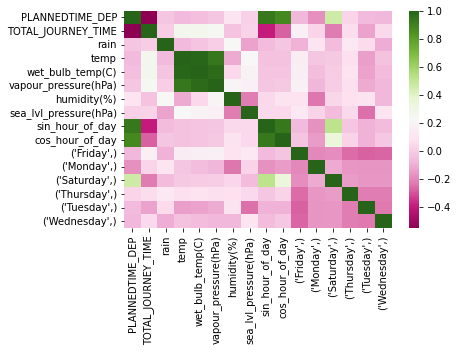

ROUTEID is  13_63
PLANNEDTIME_DEP          0.437830
TOTAL_JOURNEY_TIME       1.000000
rain                     0.142211
temp                     0.011350
wet_bulb_temp(C)        -0.034588
vapour_pressure(hPa)    -0.104761
humidity(%)             -0.193789
sea_lvl_pressure(hPa)   -0.010795
sin_hour_of_day         -0.545399
cos_hour_of_day          0.014728
(Friday,)                0.080982
(Monday,)               -0.145872
(Thursday,)             -0.061882
(Tuesday,)               0.064798
(Wednesday,)             0.039287
Name: TOTAL_JOURNEY_TIME, dtype: float64


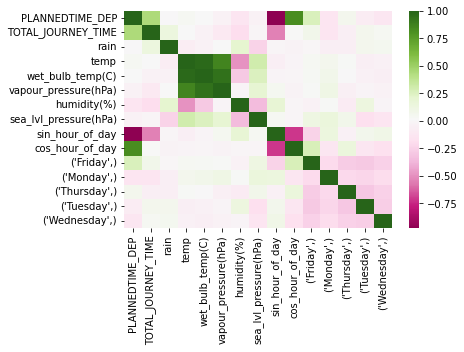

ROUTEID is  66B_59
PLANNEDTIME_DEP         -0.169828
TOTAL_JOURNEY_TIME       1.000000
rain                     0.083024
temp                     0.046373
wet_bulb_temp(C)         0.004706
vapour_pressure(hPa)    -0.068985
humidity(%)             -0.128386
sea_lvl_pressure(hPa)   -0.045942
sin_hour_of_day         -0.117679
cos_hour_of_day         -0.361669
(Friday,)                0.190025
(Monday,)                0.047063
(Saturday,)             -0.452042
(Thursday,)              0.173455
(Tuesday,)               0.161673
(Wednesday,)             0.163467
Name: TOTAL_JOURNEY_TIME, dtype: float64


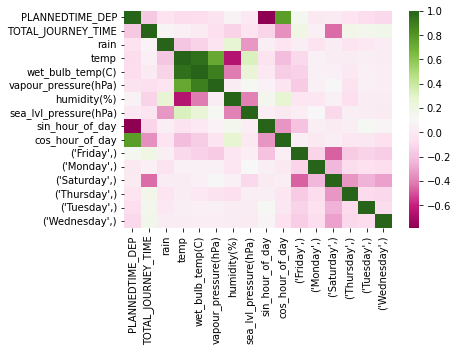

ROUTEID is  37_15
PLANNEDTIME_DEP         -0.373773
TOTAL_JOURNEY_TIME       1.000000
rain                     0.055744
temp                     0.037791
wet_bulb_temp(C)         0.018052
vapour_pressure(hPa)    -0.021739
humidity(%)             -0.083380
sea_lvl_pressure(hPa)   -0.040909
sin_hour_of_day          0.130561
cos_hour_of_day         -0.394915
(Friday,)                0.178767
(Monday,)                0.006917
(Saturday,)             -0.267506
(Sunday,)               -0.319053
(Thursday,)              0.193146
(Tuesday,)               0.208957
(Wednesday,)             0.272610
Name: TOTAL_JOURNEY_TIME, dtype: float64


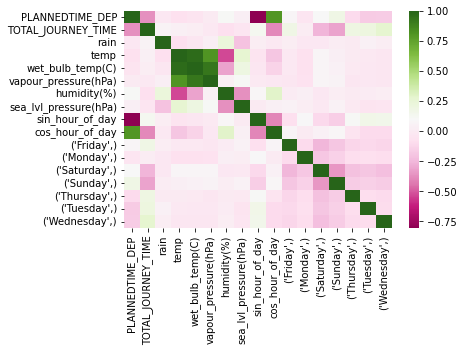

ROUTEID is  145_105
PLANNEDTIME_DEP         -0.368197
TOTAL_JOURNEY_TIME       1.000000
rain                     0.019074
temp                     0.101196
wet_bulb_temp(C)         0.069216
vapour_pressure(hPa)     0.005206
humidity(%)             -0.156543
sea_lvl_pressure(hPa)   -0.009528
sin_hour_of_day          0.013092
cos_hour_of_day         -0.435825
(Friday,)                0.173477
(Monday,)                0.040187
(Saturday,)             -0.166581
(Sunday,)               -0.315718
(Thursday,)              0.146637
(Tuesday,)               0.124719
(Wednesday,)             0.170817
Name: TOTAL_JOURNEY_TIME, dtype: float64


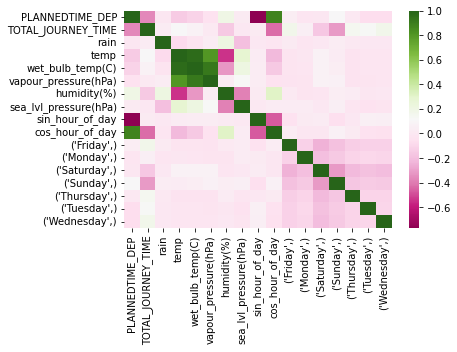

ROUTEID is  16_24
PLANNEDTIME_DEP         -0.143554
TOTAL_JOURNEY_TIME       1.000000
rain                     0.047119
temp                     0.050555
wet_bulb_temp(C)         0.033348
vapour_pressure(hPa)    -0.002679
humidity(%)             -0.083788
sea_lvl_pressure(hPa)   -0.047944
sin_hour_of_day         -0.120722
cos_hour_of_day         -0.258792
(Friday,)                0.207699
(Monday,)                0.045470
(Saturday,)             -0.348734
(Sunday,)               -0.232694
(Thursday,)              0.236264
(Tuesday,)               0.174851
(Wednesday,)             0.231311
Name: TOTAL_JOURNEY_TIME, dtype: float64


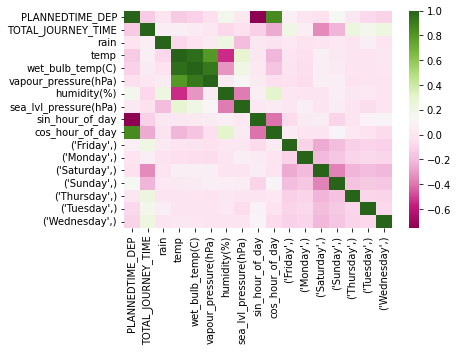

ROUTEID is  17A_16
PLANNEDTIME_DEP         -0.583992
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.039343
temp                     0.218469
wet_bulb_temp(C)         0.216880
vapour_pressure(hPa)     0.216486
humidity(%)             -0.029861
sea_lvl_pressure(hPa)    0.135592
sin_hour_of_day         -0.428805
cos_hour_of_day         -0.359339
(Friday,)                0.089014
(Monday,)               -0.038595
(Saturday,)             -0.234126
(Thursday,)              0.202764
(Tuesday,)              -0.079912
(Wednesday,)            -0.065740
Name: TOTAL_JOURNEY_TIME, dtype: float64


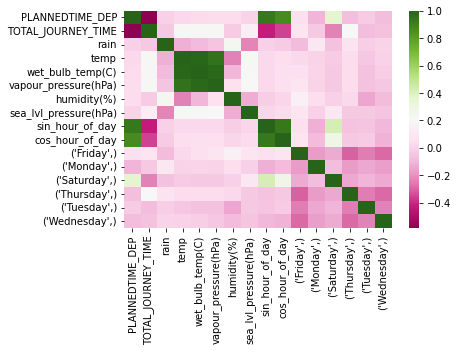

ROUTEID is  33_72
PLANNEDTIME_DEP         -0.283261
TOTAL_JOURNEY_TIME       1.000000
rain                     0.009853
temp                     0.058965
wet_bulb_temp(C)         0.057945
vapour_pressure(hPa)     0.050620
humidity(%)             -0.048928
sea_lvl_pressure(hPa)    0.043508
sin_hour_of_day          0.198271
cos_hour_of_day         -0.294311
(Friday,)                0.164418
(Monday,)                0.005158
(Saturday,)             -0.262125
(Sunday,)               -0.315789
(Thursday,)              0.104575
(Tuesday,)               0.138306
(Wednesday,)             0.225201
Name: TOTAL_JOURNEY_TIME, dtype: float64


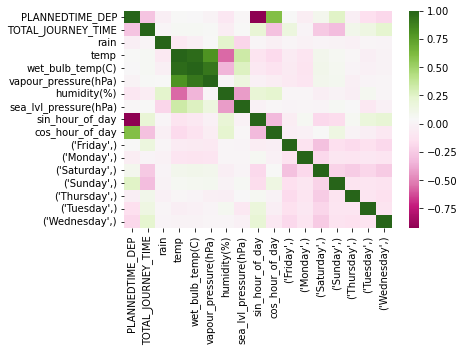

ROUTEID is  38A_33
PLANNEDTIME_DEP         -0.107749
TOTAL_JOURNEY_TIME       1.000000
rain                     0.000344
temp                    -0.034895
wet_bulb_temp(C)        -0.006746
vapour_pressure(hPa)     0.030378
humidity(%)              0.102775
sea_lvl_pressure(hPa)    0.055613
sin_hour_of_day         -0.209606
cos_hour_of_day          0.069956
(Friday,)                0.231835
(Monday,)               -0.226119
(Thursday,)              0.033764
(Tuesday,)              -0.099986
(Wednesday,)             0.005883
Name: TOTAL_JOURNEY_TIME, dtype: float64


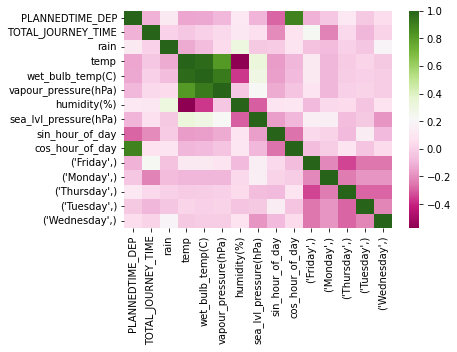

ROUTEID is  15_16
PLANNEDTIME_DEP         -0.186677
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.023565
temp                     0.085392
wet_bulb_temp(C)         0.062816
vapour_pressure(hPa)     0.015220
humidity(%)             -0.126774
sea_lvl_pressure(hPa)    0.029624
sin_hour_of_day         -0.081085
cos_hour_of_day         -0.211747
(Friday,)                0.142838
(Monday,)                0.044839
(Saturday,)             -0.181833
(Sunday,)               -0.330883
(Thursday,)              0.171209
(Tuesday,)               0.161929
(Wednesday,)             0.176779
Name: TOTAL_JOURNEY_TIME, dtype: float64


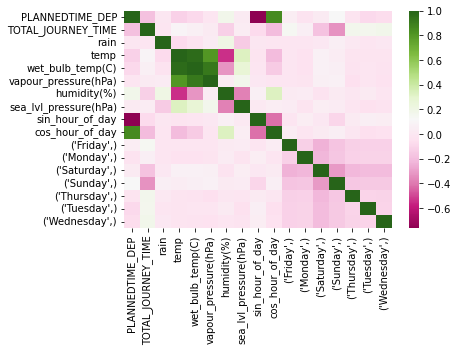

ROUTEID is  7B_93
PLANNEDTIME_DEP          0.508435
TOTAL_JOURNEY_TIME       1.000000
rain                     0.075507
temp                     0.023690
wet_bulb_temp(C)         0.026741
vapour_pressure(hPa)     0.018130
humidity(%)              0.000514
sea_lvl_pressure(hPa)   -0.011750
sin_hour_of_day         -0.652194
cos_hour_of_day         -0.672197
(Friday,)                0.050978
(Monday,)               -0.251026
(Thursday,)             -0.066243
(Tuesday,)               0.065445
(Wednesday,)             0.158026
Name: TOTAL_JOURNEY_TIME, dtype: float64


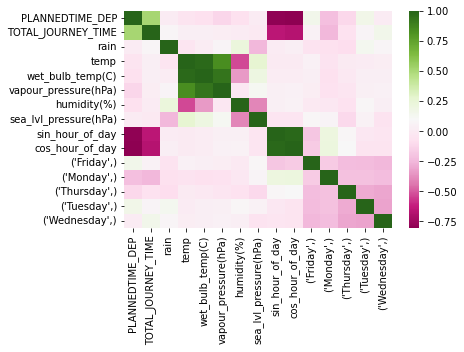

ROUTEID is  27A_4
PLANNEDTIME_DEP          0.149507
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.022410
temp                     0.040062
wet_bulb_temp(C)         0.009053
vapour_pressure(hPa)    -0.042477
humidity(%)             -0.126381
sea_lvl_pressure(hPa)    0.039489
sin_hour_of_day         -0.332147
cos_hour_of_day         -0.009080
(Friday,)                0.264517
(Monday,)                0.071519
(Saturday,)             -0.301536
(Sunday,)               -0.237907
(Thursday,)              0.154328
(Tuesday,)               0.188130
(Wednesday,)             0.177846
Name: TOTAL_JOURNEY_TIME, dtype: float64


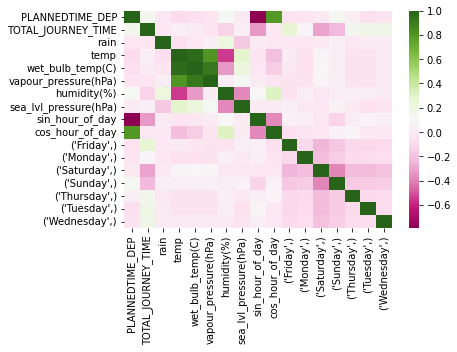

ROUTEID is  59_10
PLANNEDTIME_DEP         -0.268711
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.035555
temp                     0.153801
wet_bulb_temp(C)         0.114748
vapour_pressure(hPa)     0.042547
humidity(%)             -0.206857
sea_lvl_pressure(hPa)   -0.020716
sin_hour_of_day          0.056032
cos_hour_of_day         -0.348184
(Friday,)                0.222942
(Monday,)                0.060014
(Saturday,)             -0.282130
(Sunday,)               -0.150919
(Thursday,)              0.142500
(Tuesday,)               0.094298
(Wednesday,)             0.199070
Name: TOTAL_JOURNEY_TIME, dtype: float64


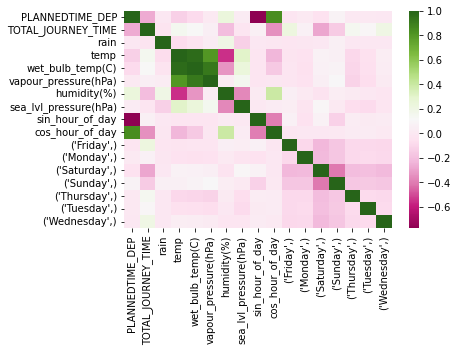

ROUTEID is  75_17
PLANNEDTIME_DEP         -0.331920
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.022590
temp                     0.208783
wet_bulb_temp(C)         0.143708
vapour_pressure(hPa)     0.037044
humidity(%)             -0.322550
sea_lvl_pressure(hPa)    0.028389
sin_hour_of_day         -0.156649
cos_hour_of_day         -0.474691
(Friday,)                0.173886
(Monday,)               -0.068171
(Saturday,)             -0.162337
(Sunday,)               -0.173617
(Thursday,)              0.164540
(Tuesday,)               0.147569
(Wednesday,)             0.150564
Name: TOTAL_JOURNEY_TIME, dtype: float64


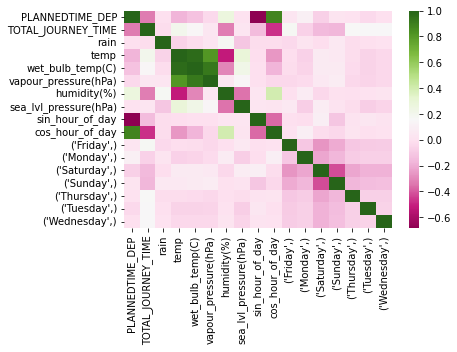

ROUTEID is  44B_60
PLANNEDTIME_DEP          0.594804
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.010042
temp                     0.272757
wet_bulb_temp(C)         0.222978
vapour_pressure(hPa)     0.133587
humidity(%)             -0.330151
sea_lvl_pressure(hPa)    0.020228
sin_hour_of_day         -0.606565
cos_hour_of_day          0.148102
(Friday,)                0.013825
(Monday,)               -0.043658
(Thursday,)              0.055490
(Tuesday,)              -0.060669
(Wednesday,)             0.052157
Name: TOTAL_JOURNEY_TIME, dtype: float64


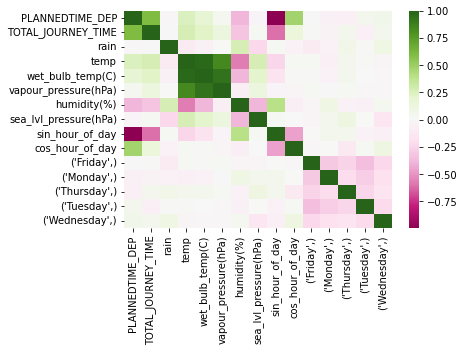

ROUTEID is  13_67
PLANNEDTIME_DEP          0.107422
TOTAL_JOURNEY_TIME       1.000000
rain                     0.010853
temp                     0.005963
wet_bulb_temp(C)        -0.018289
vapour_pressure(hPa)    -0.059541
humidity(%)             -0.086239
sea_lvl_pressure(hPa)   -0.014001
sin_hour_of_day         -0.204898
cos_hour_of_day         -0.106423
(Friday,)                0.266554
(Monday,)                0.087098
(Saturday,)             -0.405208
(Sunday,)               -0.242711
(Thursday,)              0.259719
(Tuesday,)               0.203183
(Wednesday,)             0.224577
Name: TOTAL_JOURNEY_TIME, dtype: float64


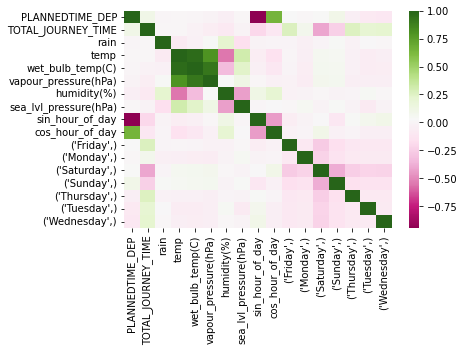

ROUTEID is  66_17
PLANNEDTIME_DEP          0.112522
TOTAL_JOURNEY_TIME       1.000000
rain                     0.126799
temp                     0.012088
wet_bulb_temp(C)        -0.025643
vapour_pressure(hPa)    -0.087056
humidity(%)             -0.104657
sea_lvl_pressure(hPa)   -0.059495
sin_hour_of_day         -0.472030
cos_hour_of_day         -0.111195
(Friday,)                0.303123
(Monday,)                0.047633
(Saturday,)             -0.382692
(Sunday,)               -0.200922
(Thursday,)              0.197838
(Tuesday,)               0.139735
(Wednesday,)             0.176397
Name: TOTAL_JOURNEY_TIME, dtype: float64


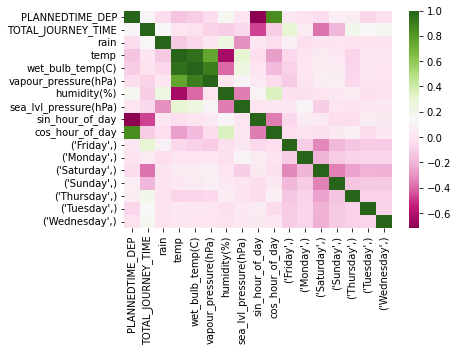

ROUTEID is  31_15
PLANNEDTIME_DEP         -0.114979
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.028621
temp                     0.181835
wet_bulb_temp(C)         0.115820
vapour_pressure(hPa)     0.010957
humidity(%)             -0.302508
sea_lvl_pressure(hPa)    0.080000
sin_hour_of_day         -0.221089
cos_hour_of_day         -0.308414
(Friday,)                0.155648
(Monday,)                0.093345
(Saturday,)             -0.246931
(Sunday,)               -0.136657
(Thursday,)              0.114383
(Tuesday,)               0.097064
(Wednesday,)             0.207003
Name: TOTAL_JOURNEY_TIME, dtype: float64


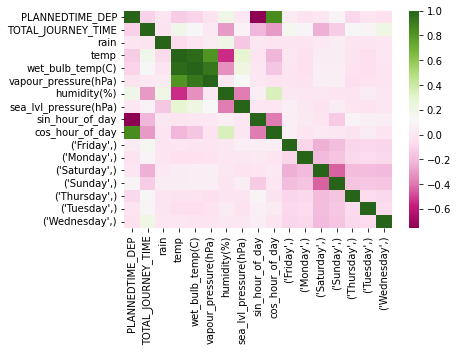

ROUTEID is  31A_26
PLANNEDTIME_DEP         -0.104425
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.040696
temp                     0.165316
wet_bulb_temp(C)         0.126331
vapour_pressure(hPa)     0.043764
humidity(%)             -0.232127
sea_lvl_pressure(hPa)    0.034491
sin_hour_of_day         -0.174632
cos_hour_of_day         -0.201710
(Friday,)                0.202375
(Monday,)               -0.012811
(Saturday,)             -0.131325
(Sunday,)               -0.230770
(Thursday,)              0.098905
(Tuesday,)               0.064769
(Wednesday,)             0.131304
Name: TOTAL_JOURNEY_TIME, dtype: float64


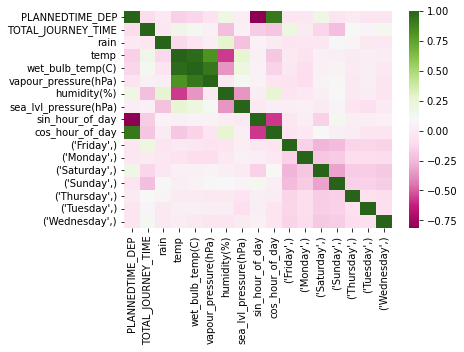

ROUTEID is  25D_277
PLANNEDTIME_DEP         -0.252910
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.155736
temp                    -0.020481
wet_bulb_temp(C)         0.024450
vapour_pressure(hPa)     0.058657
humidity(%)              0.102422
sea_lvl_pressure(hPa)   -0.110322
sin_hour_of_day         -0.014677
cos_hour_of_day          0.017773
(Friday,)                0.047669
(Monday,)               -0.116305
(Thursday,)              0.068527
(Tuesday,)              -0.091952
(Wednesday,)             0.042053
Name: TOTAL_JOURNEY_TIME, dtype: float64


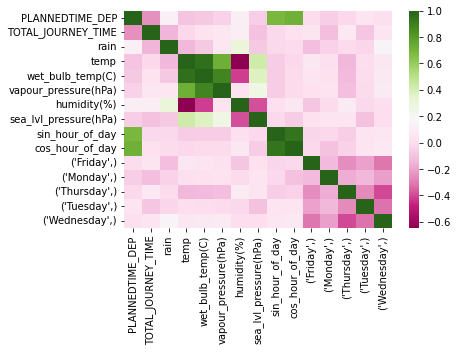

ROUTEID is  43_88
PLANNEDTIME_DEP         -0.187078
TOTAL_JOURNEY_TIME       1.000000
rain                     0.074770
temp                     0.073567
wet_bulb_temp(C)         0.041823
vapour_pressure(hPa)    -0.011978
humidity(%)             -0.138530
sea_lvl_pressure(hPa)   -0.033557
sin_hour_of_day         -0.136864
cos_hour_of_day         -0.335361
(Friday,)                0.192421
(Monday,)               -0.005707
(Saturday,)             -0.330446
(Sunday,)               -0.209445
(Thursday,)              0.171535
(Tuesday,)               0.192897
(Wednesday,)             0.197600
Name: TOTAL_JOURNEY_TIME, dtype: float64


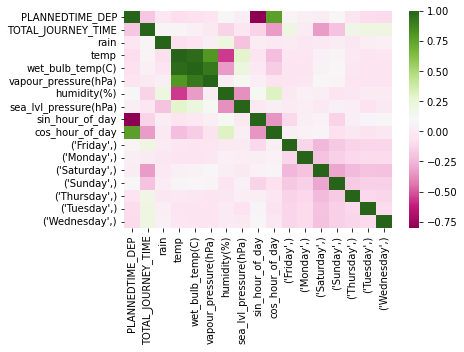

ROUTEID is  145_102
PLANNEDTIME_DEP         -0.074142
TOTAL_JOURNEY_TIME       1.000000
rain                     0.050764
temp                     0.062687
wet_bulb_temp(C)         0.037991
vapour_pressure(hPa)    -0.013925
humidity(%)             -0.110346
sea_lvl_pressure(hPa)   -0.019162
sin_hour_of_day         -0.272351
cos_hour_of_day         -0.158008
(Friday,)                0.295222
(Monday,)               -0.008079
(Saturday,)             -0.279658
(Sunday,)               -0.302805
(Thursday,)              0.160719
(Tuesday,)               0.143631
(Wednesday,)             0.170647
Name: TOTAL_JOURNEY_TIME, dtype: float64


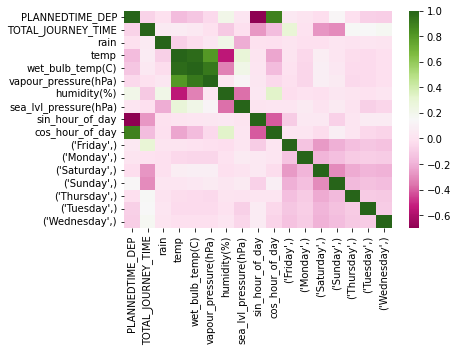

ROUTEID is  77A_28
PLANNEDTIME_DEP         -0.310989
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.026967
temp                     0.080698
wet_bulb_temp(C)         0.040922
vapour_pressure(hPa)    -0.026447
humidity(%)             -0.177790
sea_lvl_pressure(hPa)   -0.031213
sin_hour_of_day         -0.015965
cos_hour_of_day         -0.357647
(Friday,)                0.223324
(Monday,)               -0.023803
(Saturday,)             -0.280322
(Sunday,)               -0.370516
(Thursday,)              0.256926
(Tuesday,)               0.233083
(Wednesday,)             0.255725
Name: TOTAL_JOURNEY_TIME, dtype: float64


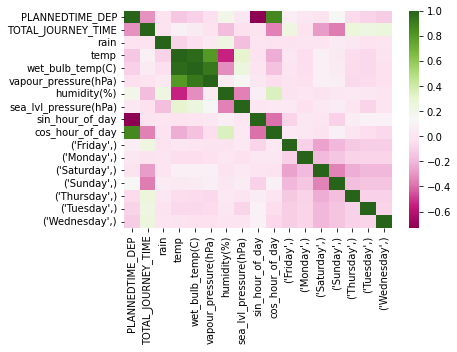

ROUTEID is  40E_91
PLANNEDTIME_DEP         -0.080361
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.096680
temp                     0.097273
wet_bulb_temp(C)         0.118478
vapour_pressure(hPa)     0.132711
humidity(%)              0.100268
sea_lvl_pressure(hPa)    0.124573
sin_hour_of_day          0.144819
cos_hour_of_day          0.066753
(Friday,)               -0.007153
(Monday,)               -0.003080
(Saturday,)             -0.256183
(Sunday,)               -0.172724
(Thursday,)              0.109567
(Tuesday,)               0.293816
(Wednesday,)             0.171764
Name: TOTAL_JOURNEY_TIME, dtype: float64


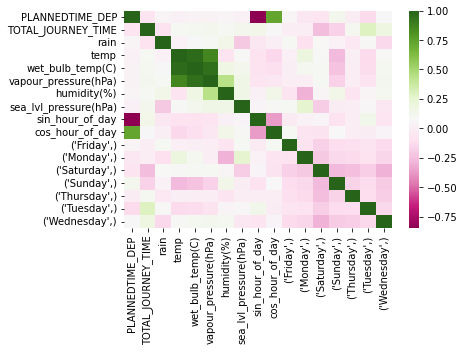

ROUTEID is  13_61
PLANNEDTIME_DEP          0.158467
TOTAL_JOURNEY_TIME       1.000000
rain                     0.020921
temp                     0.043228
wet_bulb_temp(C)         0.024379
vapour_pressure(hPa)    -0.016338
humidity(%)             -0.073314
sea_lvl_pressure(hPa)   -0.013982
sin_hour_of_day         -0.237705
cos_hour_of_day         -0.038725
(Friday,)                0.340236
(Monday,)                0.010361
(Saturday,)             -0.381820
(Sunday,)               -0.268085
(Thursday,)              0.249048
(Tuesday,)               0.190728
(Wednesday,)             0.188739
Name: TOTAL_JOURNEY_TIME, dtype: float64


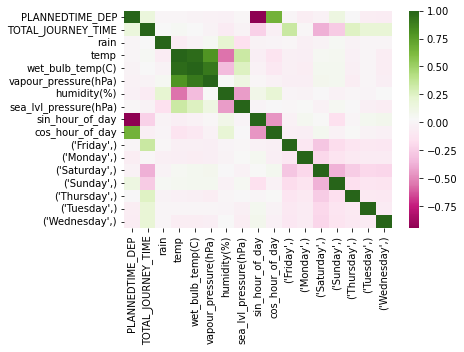

ROUTEID is  7A_88
PLANNEDTIME_DEP         -0.660651
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.040862
temp                     0.157339
wet_bulb_temp(C)         0.129159
vapour_pressure(hPa)     0.086138
humidity(%)             -0.183447
sea_lvl_pressure(hPa)    0.048248
sin_hour_of_day         -0.609415
cos_hour_of_day         -0.579012
(Friday,)                0.160438
(Monday,)               -0.147835
(Saturday,)             -0.022794
(Sunday,)               -0.235291
(Thursday,)              0.167251
(Tuesday,)               0.084688
(Wednesday,)             0.130618
Name: TOTAL_JOURNEY_TIME, dtype: float64


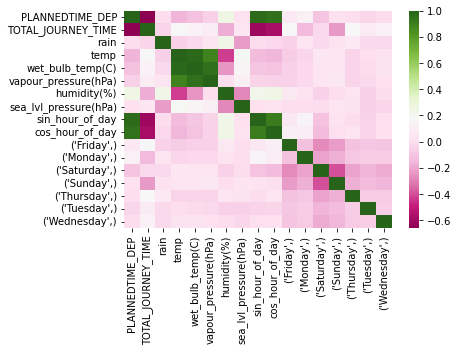

ROUTEID is  41C_80
PLANNEDTIME_DEP          0.453788
TOTAL_JOURNEY_TIME       1.000000
rain                     0.077633
temp                     0.016571
wet_bulb_temp(C)         0.001673
vapour_pressure(hPa)    -0.008454
humidity(%)             -0.083273
sea_lvl_pressure(hPa)    0.027204
sin_hour_of_day         -0.526960
cos_hour_of_day         -0.601468
(Friday,)               -0.050318
(Monday,)               -0.088550
(Thursday,)             -0.027036
(Tuesday,)               0.064124
(Wednesday,)             0.074894
Name: TOTAL_JOURNEY_TIME, dtype: float64


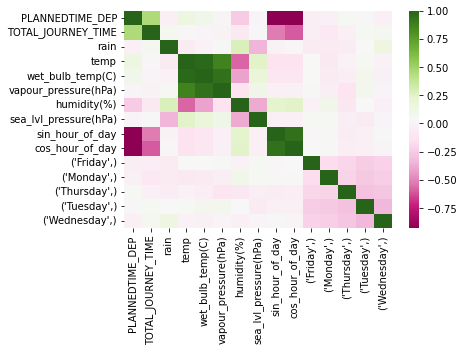

ROUTEID is  185_55
PLANNEDTIME_DEP          0.128825
TOTAL_JOURNEY_TIME       1.000000
rain                     0.036793
temp                     0.056451
wet_bulb_temp(C)         0.046887
vapour_pressure(hPa)     0.033904
humidity(%)             -0.050448
sea_lvl_pressure(hPa)   -0.117959
sin_hour_of_day         -0.165748
cos_hour_of_day         -0.064357
(Monday,)                0.098060
(Saturday,)             -0.163763
(Sunday,)                0.114658
Name: TOTAL_JOURNEY_TIME, dtype: float64


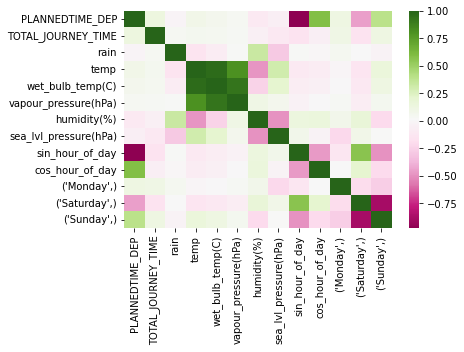

ROUTEID is  27A_5
PLANNEDTIME_DEP         -0.358203
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.007625
temp                     0.070065
wet_bulb_temp(C)         0.051742
vapour_pressure(hPa)     0.010764
humidity(%)             -0.093250
sea_lvl_pressure(hPa)   -0.005352
sin_hour_of_day          0.169284
cos_hour_of_day         -0.356333
(Friday,)                0.206345
(Monday,)                0.076151
(Saturday,)             -0.288826
(Sunday,)               -0.267830
(Thursday,)              0.168029
(Tuesday,)               0.213855
(Wednesday,)             0.216366
Name: TOTAL_JOURNEY_TIME, dtype: float64


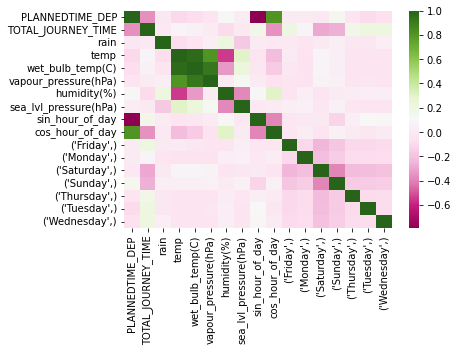

ROUTEID is  39X_1
PLANNEDTIME_DEP          0.159598
TOTAL_JOURNEY_TIME       1.000000
rain                     0.000411
temp                    -0.182877
wet_bulb_temp(C)        -0.134289
vapour_pressure(hPa)    -0.098203
humidity(%)              0.211245
sea_lvl_pressure(hPa)   -0.099732
sin_hour_of_day          0.613337
cos_hour_of_day          0.567697
(Friday,)                0.083322
(Monday,)               -0.272811
(Thursday,)              0.099637
(Tuesday,)              -0.141789
(Wednesday,)             0.136894
Name: TOTAL_JOURNEY_TIME, dtype: float64


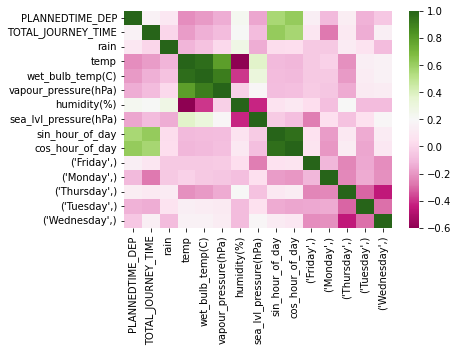

ROUTEID is  37_14
PLANNEDTIME_DEP          0.016095
TOTAL_JOURNEY_TIME       1.000000
rain                     0.018246
temp                     0.034286
wet_bulb_temp(C)         0.018122
vapour_pressure(hPa)    -0.021706
humidity(%)             -0.074565
sea_lvl_pressure(hPa)   -0.031986
sin_hour_of_day         -0.327207
cos_hour_of_day         -0.092551
(Friday,)                0.221745
(Monday,)                0.011143
(Saturday,)             -0.314459
(Sunday,)               -0.329609
(Thursday,)              0.281934
(Tuesday,)               0.184188
(Wednesday,)             0.256958
Name: TOTAL_JOURNEY_TIME, dtype: float64


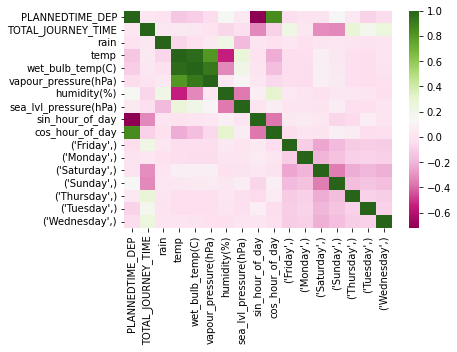

ROUTEID is  56A_31
PLANNEDTIME_DEP         -0.036654
TOTAL_JOURNEY_TIME       1.000000
rain                     0.014118
temp                     0.092763
wet_bulb_temp(C)         0.060619
vapour_pressure(hPa)     0.000390
humidity(%)             -0.155402
sea_lvl_pressure(hPa)   -0.029518
sin_hour_of_day         -0.299113
cos_hour_of_day         -0.217288
(Friday,)                0.310561
(Monday,)               -0.100423
(Saturday,)             -0.259408
(Sunday,)               -0.311111
(Thursday,)              0.288707
(Tuesday,)               0.203825
(Wednesday,)             0.230554
Name: TOTAL_JOURNEY_TIME, dtype: float64


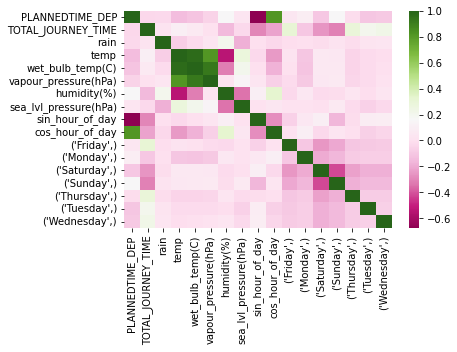

ROUTEID is  25_272
PLANNEDTIME_DEP         -0.212435
TOTAL_JOURNEY_TIME       1.000000
rain                     0.028778
temp                     0.069664
wet_bulb_temp(C)         0.032728
vapour_pressure(hPa)    -0.033606
humidity(%)             -0.154202
sea_lvl_pressure(hPa)   -0.008857
sin_hour_of_day         -0.192447
cos_hour_of_day         -0.290108
(Friday,)                0.170158
(Monday,)                0.051860
(Saturday,)             -0.348048
(Sunday,)               -0.182177
(Thursday,)              0.220154
(Tuesday,)               0.154619
(Wednesday,)             0.237476
Name: TOTAL_JOURNEY_TIME, dtype: float64


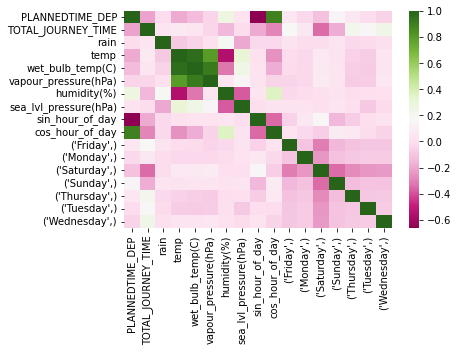

ROUTEID is  49_28
PLANNEDTIME_DEP         -0.269488
TOTAL_JOURNEY_TIME       1.000000
rain                     0.040414
temp                     0.011838
wet_bulb_temp(C)        -0.000446
vapour_pressure(hPa)    -0.028740
humidity(%)             -0.038932
sea_lvl_pressure(hPa)   -0.056939
sin_hour_of_day          0.019463
cos_hour_of_day         -0.230091
(Friday,)                0.154971
(Monday,)                0.012048
(Saturday,)             -0.252862
(Sunday,)               -0.328279
(Thursday,)              0.209495
(Tuesday,)               0.201655
(Wednesday,)             0.220638
Name: TOTAL_JOURNEY_TIME, dtype: float64


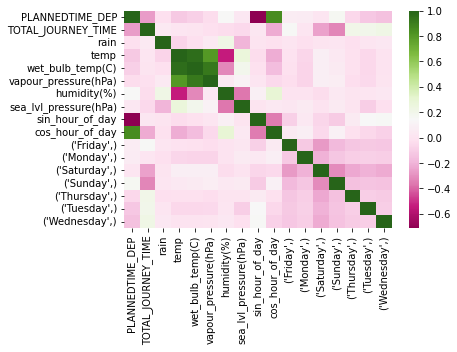

ROUTEID is  63_30
PLANNEDTIME_DEP         -0.066819
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.082702
temp                     0.093029
wet_bulb_temp(C)         0.074699
vapour_pressure(hPa)     0.033429
humidity(%)             -0.114090
sea_lvl_pressure(hPa)    0.066482
sin_hour_of_day         -0.086376
cos_hour_of_day         -0.080534
(Friday,)                0.179796
(Monday,)                0.015821
(Saturday,)             -0.212070
(Sunday,)               -0.276187
(Thursday,)              0.119175
(Tuesday,)               0.150611
(Wednesday,)             0.119450
Name: TOTAL_JOURNEY_TIME, dtype: float64


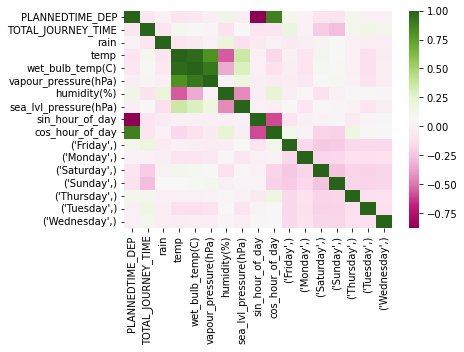

ROUTEID is  45A_70
PLANNEDTIME_DEP         -0.000716
TOTAL_JOURNEY_TIME       1.000000
rain                     0.042620
temp                     0.128895
wet_bulb_temp(C)         0.111941
vapour_pressure(hPa)     0.064861
humidity(%)             -0.129316
sea_lvl_pressure(hPa)    0.102939
sin_hour_of_day         -0.024543
cos_hour_of_day         -0.335871
(Friday,)                0.093405
(Monday,)               -0.185882
(Thursday,)              0.030711
(Tuesday,)              -0.005615
(Wednesday,)             0.033100
Name: TOTAL_JOURNEY_TIME, dtype: float64


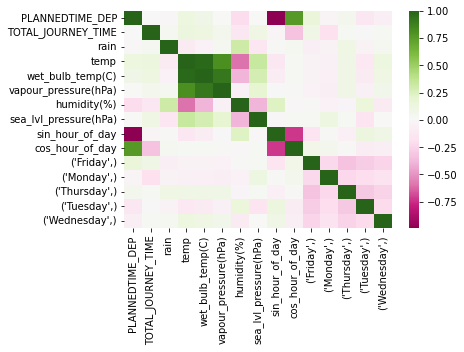

ROUTEID is  1_37
PLANNEDTIME_DEP         -0.282595
TOTAL_JOURNEY_TIME       1.000000
rain                     0.119338
temp                     0.081419
wet_bulb_temp(C)         0.059399
vapour_pressure(hPa)     0.006644
humidity(%)             -0.108738
sea_lvl_pressure(hPa)   -0.058813
sin_hour_of_day         -0.020259
cos_hour_of_day         -0.333823
(Friday,)                0.282884
(Monday,)               -0.019530
(Saturday,)             -0.225862
(Sunday,)               -0.311466
(Thursday,)              0.226204
(Tuesday,)               0.153577
(Wednesday,)             0.184986
Name: TOTAL_JOURNEY_TIME, dtype: float64


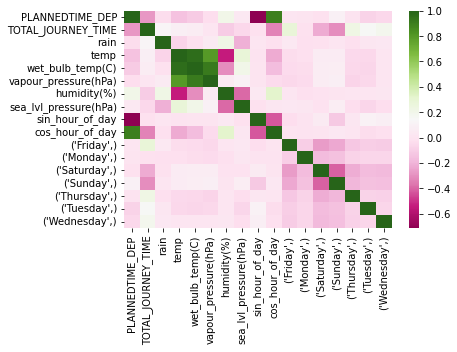

ROUTEID is  114_5
PLANNEDTIME_DEP         -0.121264
TOTAL_JOURNEY_TIME       1.000000
rain                     0.063013
temp                    -0.045685
wet_bulb_temp(C)        -0.043103
vapour_pressure(hPa)    -0.045185
humidity(%)              0.032517
sea_lvl_pressure(hPa)   -0.093620
sin_hour_of_day         -0.014795
cos_hour_of_day         -0.207690
(Friday,)                0.127413
(Monday,)                0.053130
(Saturday,)             -0.563114
(Thursday,)              0.151419
(Tuesday,)               0.280845
(Wednesday,)             0.271021
Name: TOTAL_JOURNEY_TIME, dtype: float64


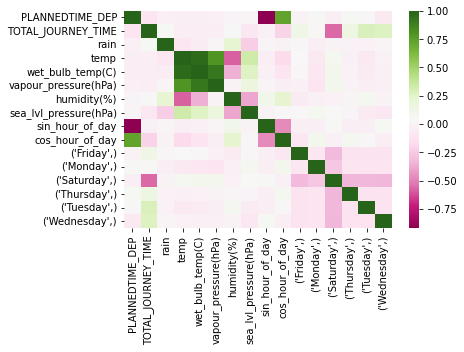

ROUTEID is  77A_30
PLANNEDTIME_DEP          0.039177
TOTAL_JOURNEY_TIME       1.000000
rain                     0.125345
temp                     0.046444
wet_bulb_temp(C)         0.023276
vapour_pressure(hPa)    -0.019075
humidity(%)             -0.097777
sea_lvl_pressure(hPa)   -0.053253
sin_hour_of_day         -0.432002
cos_hour_of_day         -0.191684
(Friday,)                0.339947
(Monday,)               -0.015374
(Saturday,)             -0.234614
(Sunday,)               -0.367644
(Thursday,)              0.210047
(Tuesday,)               0.157383
(Wednesday,)             0.195646
Name: TOTAL_JOURNEY_TIME, dtype: float64


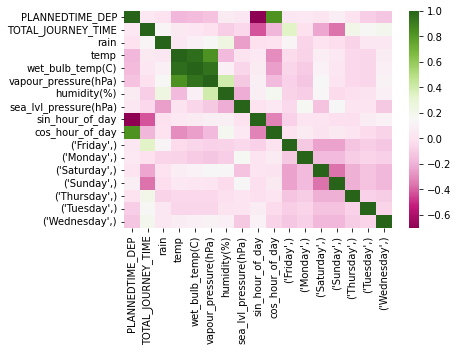

ROUTEID is  45A_60
PLANNEDTIME_DEP         -0.122194
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.013876
temp                     0.239154
wet_bulb_temp(C)         0.179342
vapour_pressure(hPa)     0.070881
humidity(%)             -0.321248
sea_lvl_pressure(hPa)    0.019346
sin_hour_of_day         -0.290987
cos_hour_of_day         -0.336929
(Friday,)                0.248144
(Monday,)               -0.038560
(Saturday,)             -0.216717
(Sunday,)               -0.141615
(Thursday,)              0.174514
(Tuesday,)               0.057569
(Wednesday,)             0.171437
Name: TOTAL_JOURNEY_TIME, dtype: float64


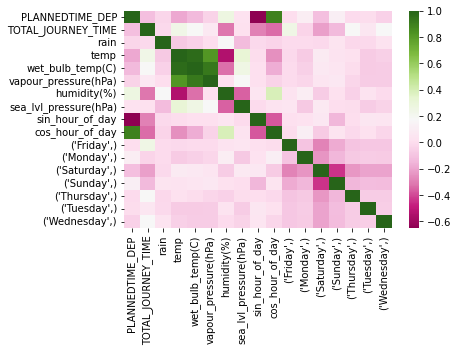

ROUTEID is  111_9
PLANNEDTIME_DEP          0.084997
TOTAL_JOURNEY_TIME       1.000000
rain                     0.038976
temp                    -0.038665
wet_bulb_temp(C)         0.000619
vapour_pressure(hPa)     0.075584
humidity(%)              0.166488
sea_lvl_pressure(hPa)   -0.104370
sin_hour_of_day         -0.095296
cos_hour_of_day          0.102988
(Friday,)                0.171497
(Monday,)                0.064124
(Saturday,)             -0.356000
(Thursday,)              0.111609
(Tuesday,)               0.136591
(Wednesday,)             0.085243
Name: TOTAL_JOURNEY_TIME, dtype: float64


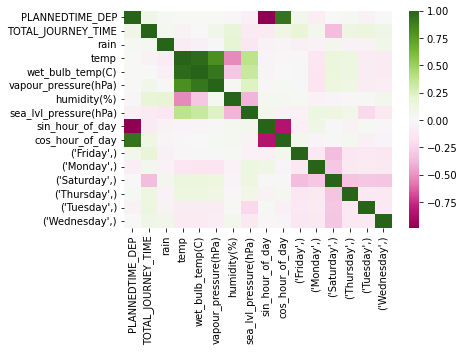

ROUTEID is  122_20
PLANNEDTIME_DEP         -0.221805
TOTAL_JOURNEY_TIME       1.000000
rain                     0.143066
temp                    -0.077457
wet_bulb_temp(C)        -0.104550
vapour_pressure(hPa)    -0.129028
humidity(%)             -0.026388
sea_lvl_pressure(hPa)   -0.168996
sin_hour_of_day         -0.122506
cos_hour_of_day         -0.379034
(Friday,)               -0.078398
(Monday,)               -0.013293
(Saturday,)             -0.115924
(Thursday,)              0.016273
(Tuesday,)              -0.007991
(Wednesday,)             0.110298
Name: TOTAL_JOURNEY_TIME, dtype: float64


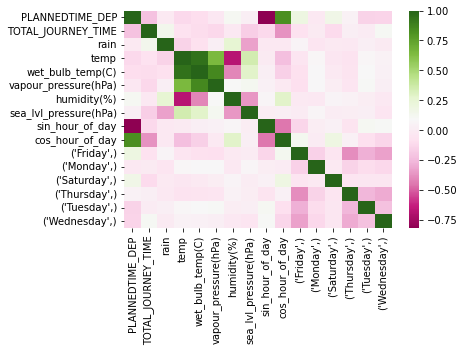

ROUTEID is  66_18
PLANNEDTIME_DEP         -0.261531
TOTAL_JOURNEY_TIME       1.000000
rain                     0.086986
temp                     0.051449
wet_bulb_temp(C)         0.004542
vapour_pressure(hPa)    -0.068709
humidity(%)             -0.151355
sea_lvl_pressure(hPa)   -0.031583
sin_hour_of_day         -0.111314
cos_hour_of_day         -0.416770
(Friday,)                0.246555
(Monday,)               -0.022522
(Saturday,)             -0.334128
(Sunday,)               -0.203622
(Thursday,)              0.210760
(Tuesday,)               0.224327
(Wednesday,)             0.137834
Name: TOTAL_JOURNEY_TIME, dtype: float64


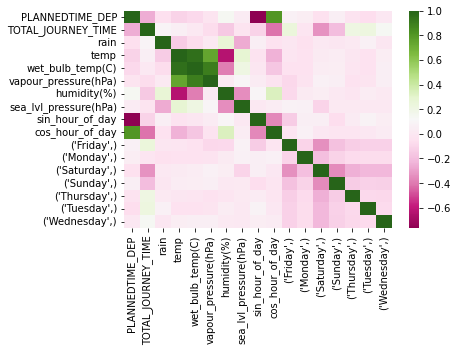

ROUTEID is  45A_68
PLANNEDTIME_DEP          0.634761
TOTAL_JOURNEY_TIME       1.000000
rain                     0.093040
temp                    -0.006759
wet_bulb_temp(C)        -0.026857
vapour_pressure(hPa)    -0.051429
humidity(%)             -0.071570
sea_lvl_pressure(hPa)    0.087627
sin_hour_of_day         -0.646967
cos_hour_of_day          0.449337
(Friday,)                0.146208
(Monday,)               -0.073661
(Thursday,)              0.051900
(Tuesday,)              -0.093881
(Wednesday,)            -0.071299
Name: TOTAL_JOURNEY_TIME, dtype: float64


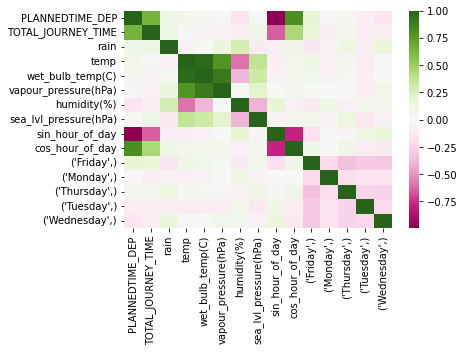

ROUTEID is  13_60
PLANNEDTIME_DEP          0.160792
TOTAL_JOURNEY_TIME       1.000000
rain                     0.018943
temp                     0.008979
wet_bulb_temp(C)        -0.010081
vapour_pressure(hPa)    -0.044583
humidity(%)             -0.062534
sea_lvl_pressure(hPa)   -0.011184
sin_hour_of_day         -0.213131
cos_hour_of_day          0.078881
(Friday,)                0.343417
(Monday,)                0.041210
(Saturday,)             -0.456418
(Sunday,)               -0.238480
(Thursday,)              0.284763
(Tuesday,)               0.200572
(Wednesday,)             0.229700
Name: TOTAL_JOURNEY_TIME, dtype: float64


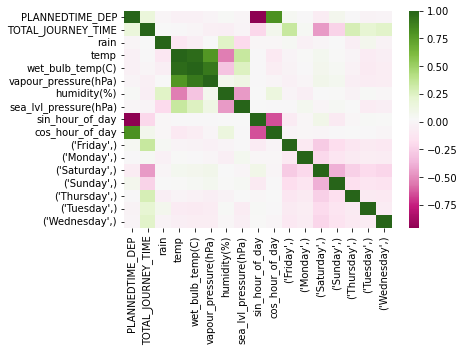

ROUTEID is  77A_31
PLANNEDTIME_DEP         -0.270362
TOTAL_JOURNEY_TIME       1.000000
rain                     0.184415
temp                     0.063987
wet_bulb_temp(C)         0.051069
vapour_pressure(hPa)     0.020004
humidity(%)             -0.057009
sea_lvl_pressure(hPa)   -0.077993
sin_hour_of_day         -0.114070
cos_hour_of_day         -0.326705
(Friday,)                0.279101
(Monday,)               -0.047584
(Saturday,)             -0.197132
(Sunday,)               -0.391684
(Thursday,)              0.175277
(Tuesday,)               0.250251
(Wednesday,)             0.172187
Name: TOTAL_JOURNEY_TIME, dtype: float64


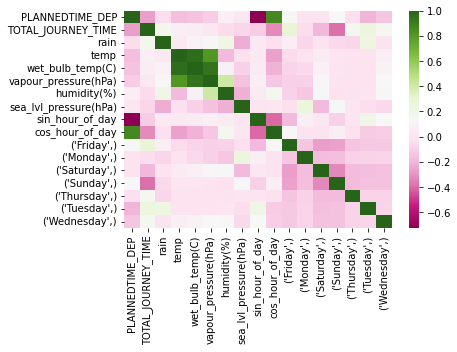

ROUTEID is  120_12
PLANNEDTIME_DEP         -0.065059
TOTAL_JOURNEY_TIME       1.000000
rain                     0.076435
temp                     0.029904
wet_bulb_temp(C)         0.017951
vapour_pressure(hPa)    -0.003755
humidity(%)             -0.039627
sea_lvl_pressure(hPa)    0.047904
sin_hour_of_day         -0.223160
cos_hour_of_day         -0.201867
(Friday,)                0.207223
(Monday,)                0.155849
(Saturday,)             -0.305715
(Sunday,)               -0.307372
(Thursday,)              0.218099
(Tuesday,)               0.233163
(Wednesday,)             0.187955
Name: TOTAL_JOURNEY_TIME, dtype: float64


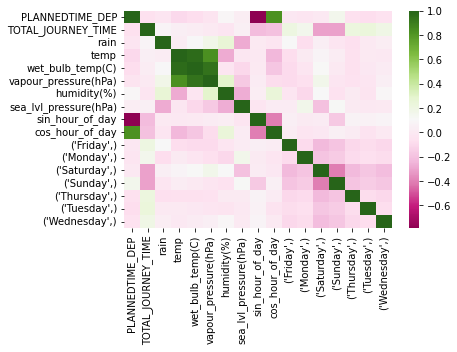

ROUTEID is  7_71
PLANNEDTIME_DEP         -0.618064
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.014012
temp                     0.168608
wet_bulb_temp(C)         0.141196
vapour_pressure(hPa)     0.103436
humidity(%)             -0.169358
sea_lvl_pressure(hPa)   -0.015207
sin_hour_of_day         -0.550860
cos_hour_of_day         -0.560472
(Friday,)                0.047916
(Monday,)                0.015720
(Saturday,)              0.001814
(Sunday,)               -0.304628
(Thursday,)              0.149578
(Tuesday,)               0.127189
(Wednesday,)             0.136324
Name: TOTAL_JOURNEY_TIME, dtype: float64


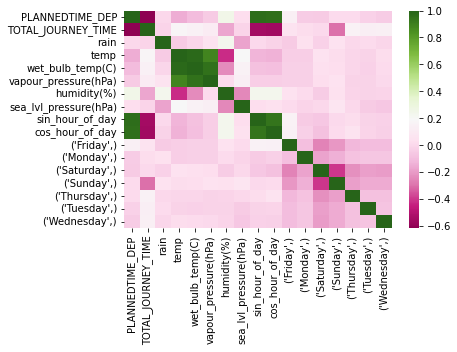

ROUTEID is  41C_79
PLANNEDTIME_DEP         -0.333272
TOTAL_JOURNEY_TIME       1.000000
rain                     0.004471
temp                     0.174184
wet_bulb_temp(C)         0.140385
vapour_pressure(hPa)     0.069619
humidity(%)             -0.202087
sea_lvl_pressure(hPa)   -0.041312
sin_hour_of_day         -0.084928
cos_hour_of_day         -0.426540
(Friday,)                0.255100
(Monday,)               -0.017746
(Saturday,)             -0.208226
(Sunday,)               -0.257631
(Thursday,)              0.173539
(Tuesday,)               0.111369
(Wednesday,)             0.206154
Name: TOTAL_JOURNEY_TIME, dtype: float64


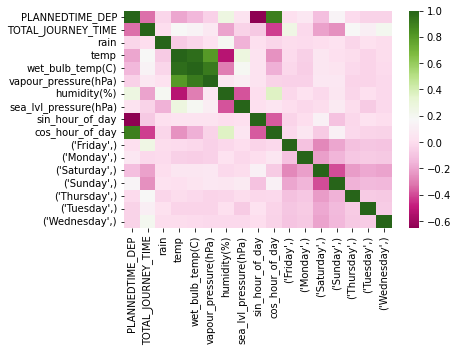

ROUTEID is  83A_20
PLANNEDTIME_DEP         -0.170462
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.009753
temp                     0.111064
wet_bulb_temp(C)         0.085529
vapour_pressure(hPa)     0.051128
humidity(%)             -0.129756
sea_lvl_pressure(hPa)   -0.060134
sin_hour_of_day         -0.269253
cos_hour_of_day         -0.265287
(Monday,)               -0.112174
(Saturday,)              0.090458
(Sunday,)                0.072046
(Wednesday,)            -0.042205
Name: TOTAL_JOURNEY_TIME, dtype: float64


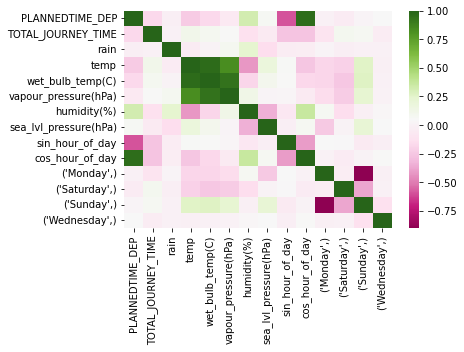

ROUTEID is  39_20
PLANNEDTIME_DEP          0.030026
TOTAL_JOURNEY_TIME       1.000000
rain                     0.014222
temp                     0.012389
wet_bulb_temp(C)        -0.011302
vapour_pressure(hPa)    -0.058008
humidity(%)             -0.087699
sea_lvl_pressure(hPa)   -0.040840
sin_hour_of_day         -0.428231
cos_hour_of_day         -0.105953
(Friday,)                0.270958
(Monday,)               -0.009400
(Saturday,)             -0.223343
(Sunday,)               -0.309239
(Thursday,)              0.223261
(Tuesday,)               0.153043
(Wednesday,)             0.215982
Name: TOTAL_JOURNEY_TIME, dtype: float64


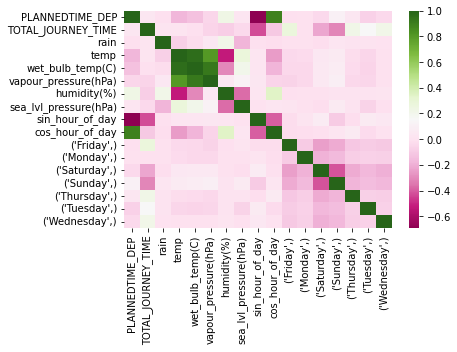

ROUTEID is  63_26
PLANNEDTIME_DEP          0.066171
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.040254
temp                     0.055520
wet_bulb_temp(C)         0.051805
vapour_pressure(hPa)     0.034929
humidity(%)             -0.032447
sea_lvl_pressure(hPa)    0.009845
sin_hour_of_day         -0.173353
cos_hour_of_day          0.086032
(Friday,)                0.225719
(Monday,)               -0.006955
(Saturday,)             -0.219638
(Sunday,)               -0.302837
(Thursday,)              0.153639
(Tuesday,)               0.150377
(Wednesday,)             0.105963
Name: TOTAL_JOURNEY_TIME, dtype: float64


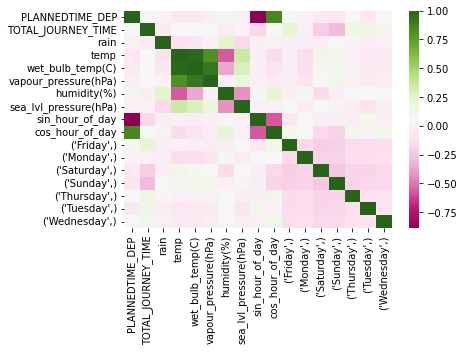

ROUTEID is  66B_58
PLANNEDTIME_DEP          0.052770
TOTAL_JOURNEY_TIME       1.000000
rain                     0.030089
temp                     0.076609
wet_bulb_temp(C)         0.036744
vapour_pressure(hPa)    -0.036214
humidity(%)             -0.138644
sea_lvl_pressure(hPa)    0.002715
sin_hour_of_day         -0.346204
cos_hour_of_day         -0.125143
(Friday,)                0.174073
(Monday,)                0.197786
(Saturday,)             -0.577808
(Sunday,)                0.009728
(Thursday,)              0.231744
(Tuesday,)               0.138336
(Wednesday,)             0.219912
Name: TOTAL_JOURNEY_TIME, dtype: float64


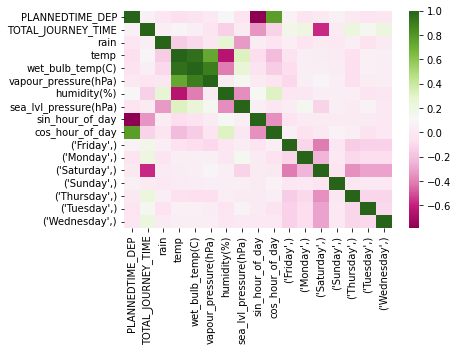

ROUTEID is  17_10
PLANNEDTIME_DEP         -0.386297
TOTAL_JOURNEY_TIME       1.000000
rain                     0.075803
temp                    -0.038821
wet_bulb_temp(C)        -0.034719
vapour_pressure(hPa)    -0.040757
humidity(%)              0.031868
sea_lvl_pressure(hPa)   -0.089121
sin_hour_of_day          0.152130
cos_hour_of_day         -0.385756
(Friday,)                0.160037
(Monday,)                0.080724
(Saturday,)             -0.638634
(Thursday,)              0.211251
(Tuesday,)               0.246094
(Wednesday,)             0.267034
Name: TOTAL_JOURNEY_TIME, dtype: float64


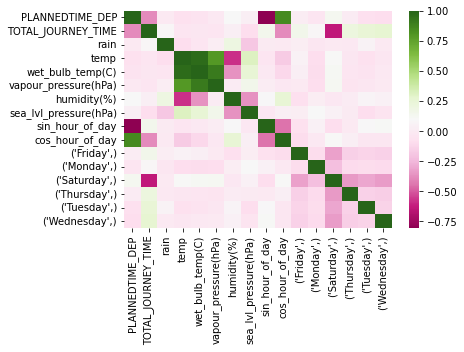

ROUTEID is  17A_14
PLANNEDTIME_DEP         -0.432540
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.034861
temp                     0.143946
wet_bulb_temp(C)         0.150454
vapour_pressure(hPa)     0.168498
humidity(%)              0.002518
sea_lvl_pressure(hPa)   -0.028715
sin_hour_of_day         -0.243316
cos_hour_of_day         -0.147978
(Monday,)               -0.184396
(Saturday,)              0.148150
(Sunday,)               -0.021452
(Tuesday,)              -0.063875
Name: TOTAL_JOURNEY_TIME, dtype: float64


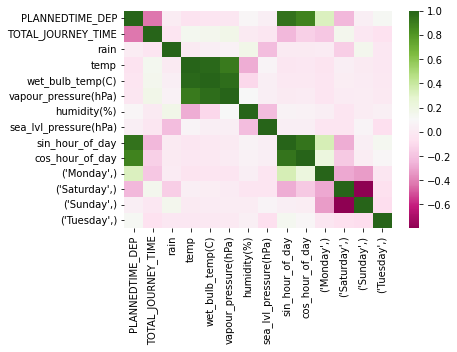

ROUTEID is  66A_38
PLANNEDTIME_DEP         -0.258698
TOTAL_JOURNEY_TIME       1.000000
rain                     0.082325
temp                    -0.002108
wet_bulb_temp(C)        -0.038389
vapour_pressure(hPa)    -0.101044
humidity(%)             -0.087580
sea_lvl_pressure(hPa)    0.002852
sin_hour_of_day          0.080288
cos_hour_of_day         -0.312556
(Friday,)                0.161405
(Monday,)                0.052621
(Saturday,)             -0.378948
(Sunday,)               -0.113840
(Thursday,)              0.158409
(Tuesday,)               0.213181
(Wednesday,)             0.203730
Name: TOTAL_JOURNEY_TIME, dtype: float64


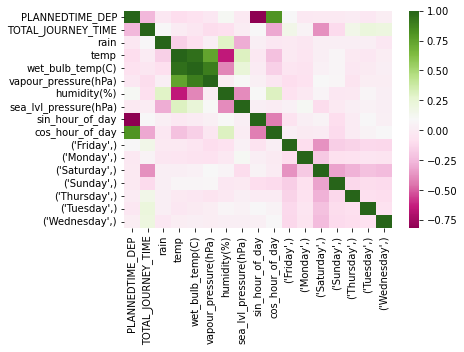

ROUTEID is  15A_85
PLANNEDTIME_DEP         -0.144328
TOTAL_JOURNEY_TIME       1.000000
rain                     0.203138
temp                     0.001218
wet_bulb_temp(C)         0.028630
vapour_pressure(hPa)     0.040727
humidity(%)              0.105418
sea_lvl_pressure(hPa)   -0.158793
sin_hour_of_day         -0.092854
cos_hour_of_day         -0.249923
(Friday,)                0.227060
(Monday,)               -0.053998
(Saturday,)             -0.196974
(Sunday,)               -0.348648
(Thursday,)              0.214289
(Tuesday,)               0.212272
(Wednesday,)             0.264069
Name: TOTAL_JOURNEY_TIME, dtype: float64


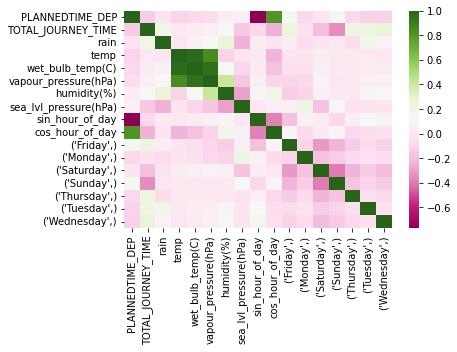

ROUTEID is  47_136
PLANNEDTIME_DEP         -0.401020
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.003421
temp                    -0.001175
wet_bulb_temp(C)        -0.004553
vapour_pressure(hPa)    -0.013470
humidity(%)             -0.015222
sea_lvl_pressure(hPa)   -0.049111
sin_hour_of_day          0.215693
cos_hour_of_day         -0.255428
(Friday,)                0.165958
(Monday,)                0.035176
(Saturday,)             -0.181516
(Sunday,)               -0.336284
(Thursday,)              0.254152
(Tuesday,)               0.229223
(Wednesday,)             0.246406
Name: TOTAL_JOURNEY_TIME, dtype: float64


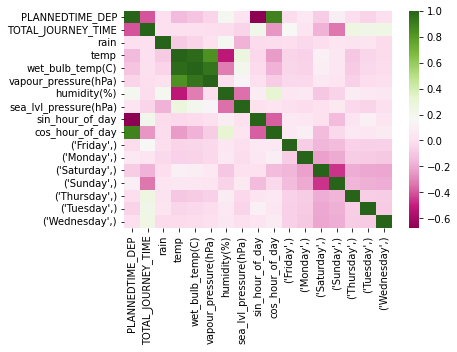

ROUTEID is  40D_103
PLANNEDTIME_DEP         -0.305160
TOTAL_JOURNEY_TIME       1.000000
rain                    -0.013788
temp                     0.252840
wet_bulb_temp(C)         0.224317
vapour_pressure(hPa)     0.158382
humidity(%)             -0.216268
sea_lvl_pressure(hPa)    0.020921
sin_hour_of_day         -0.068226
cos_hour_of_day         -0.410264
(Friday,)                0.014884
(Monday,)               -0.008072
(Saturday,)              0.053372
(Sunday,)               -0.031500
(Thursday,)             -0.024260
(Tuesday,)              -0.044346
(Wednesday,)            -0.011856
Name: TOTAL_JOURNEY_TIME, dtype: float64


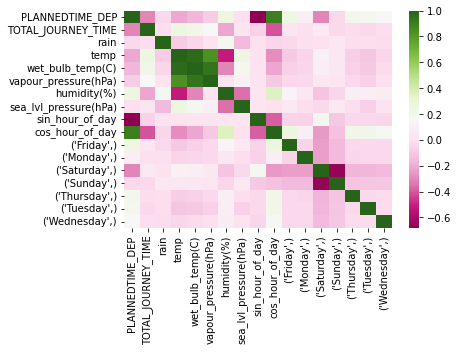

In [75]:
for df in dbus_df_list_v4:
    print('='*66)
    print("ROUTEID is ",df['ROUTEID'].unique()[0])
    print(df[df.columns[:]].corr()['TOTAL_JOURNEY_TIME'][:])
    corr=df.corr()
    dataplot = sb.heatmap(corr, cmap="PiYG")
    plt.show()